# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
# data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

/usr/local/lib/python3.5/site-packages/matplotlib/font_manager.py:280: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  'Matplotlib is building the font cache using fc-list. '


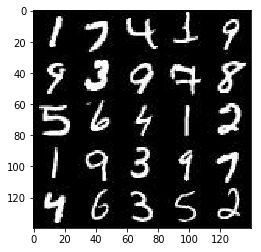

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*_11*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

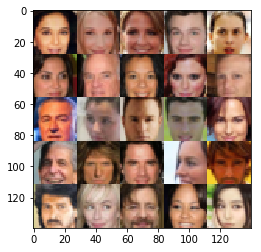

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lrate = tf.placeholder(tf.float32, None, name='learningrate')
    return inputs_real, inputs_z, lrate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        conv1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * conv1, conv1)

        conv2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(conv2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)

        conv3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(conv3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)

        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse= not is_train):
        x1 = tf.layers.dense(z, 3*3*512)
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)

        x2 = tf.layers.conv2d_transpose(x1, 256, 3, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)

        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)

        return out 

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1)\
                            .minimize(d_loss, var_list=d_vars)
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1)\
                              .minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape,
          data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    out_channel_dim = len(data_image_mode) # either 1 or 3 (L or RGB)
    input_real, input_z, lrate = model_inputs(data_shape[1], data_shape[2], data_shape[3],
                                             z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)    
    d_opt, g_opt = model_opt(d_loss, g_loss, lrate, beta1)    

    d_losses, g_losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1

                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # batch_images values are [-0.5,0.5]. changing these to [-1,1]
                batch_images = batch_images*2
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z,
                                              lrate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images,
                                              lrate: learning_rate})

                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    d_losses.append(train_loss_d)
                    g_losses.append(train_loss_g)

                if steps % 100 == 0:
                    show_generator_output(sess, 9, input_z, out_channel_dim, data_image_mode)

    return d_losses, g_losses

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/20... Discriminator Loss: 0.2414... Generator Loss: 3.4353
Epoch 1/20... Discriminator Loss: 0.3899... Generator Loss: 5.5889
Epoch 1/20... Discriminator Loss: 0.7000... Generator Loss: 1.4997
Epoch 1/20... Discriminator Loss: 0.9595... Generator Loss: 4.4025
Epoch 1/20... Discriminator Loss: 0.7878... Generator Loss: 1.4513
Epoch 1/20... Discriminator Loss: 0.3849... Generator Loss: 2.0768
Epoch 1/20... Discriminator Loss: 0.4190... Generator Loss: 1.7911
Epoch 1/20... Discriminator Loss: 0.4209... Generator Loss: 1.7794
Epoch 1/20... Discriminator Loss: 0.5307... Generator Loss: 1.7991
Epoch 1/20... Discriminator Loss: 0.7019... Generator Loss: 2.7878


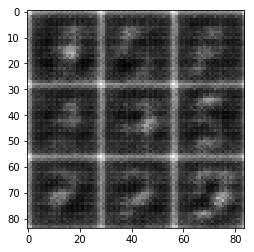

Epoch 1/20... Discriminator Loss: 1.2871... Generator Loss: 3.5204
Epoch 1/20... Discriminator Loss: 0.5461... Generator Loss: 1.5713
Epoch 1/20... Discriminator Loss: 0.8798... Generator Loss: 1.7565
Epoch 1/20... Discriminator Loss: 0.7639... Generator Loss: 1.3147
Epoch 1/20... Discriminator Loss: 0.7615... Generator Loss: 1.1874
Epoch 1/20... Discriminator Loss: 0.6473... Generator Loss: 1.8293
Epoch 1/20... Discriminator Loss: 0.9137... Generator Loss: 2.4430
Epoch 1/20... Discriminator Loss: 0.7283... Generator Loss: 1.4428
Epoch 1/20... Discriminator Loss: 0.6185... Generator Loss: 1.9633
Epoch 1/20... Discriminator Loss: 0.9712... Generator Loss: 2.8030


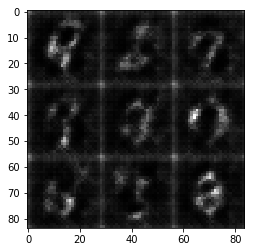

Epoch 1/20... Discriminator Loss: 0.6811... Generator Loss: 1.2412
Epoch 1/20... Discriminator Loss: 0.6857... Generator Loss: 1.6324
Epoch 1/20... Discriminator Loss: 0.7695... Generator Loss: 1.0526
Epoch 1/20... Discriminator Loss: 0.8611... Generator Loss: 0.8712
Epoch 1/20... Discriminator Loss: 0.7807... Generator Loss: 1.1911
Epoch 1/20... Discriminator Loss: 0.6468... Generator Loss: 1.4571
Epoch 1/20... Discriminator Loss: 0.8416... Generator Loss: 0.9767
Epoch 1/20... Discriminator Loss: 0.8677... Generator Loss: 2.0556
Epoch 1/20... Discriminator Loss: 0.6579... Generator Loss: 1.1832
Epoch 1/20... Discriminator Loss: 0.5321... Generator Loss: 1.4517


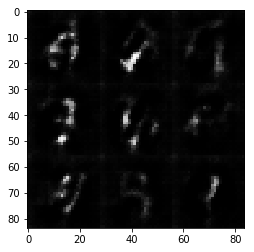

Epoch 1/20... Discriminator Loss: 0.8033... Generator Loss: 2.3208
Epoch 1/20... Discriminator Loss: 0.6197... Generator Loss: 1.2359
Epoch 1/20... Discriminator Loss: 0.7620... Generator Loss: 0.9095
Epoch 1/20... Discriminator Loss: 0.9026... Generator Loss: 0.7086
Epoch 1/20... Discriminator Loss: 1.0766... Generator Loss: 2.8945
Epoch 1/20... Discriminator Loss: 0.6755... Generator Loss: 2.3029
Epoch 1/20... Discriminator Loss: 0.5492... Generator Loss: 1.7415
Epoch 1/20... Discriminator Loss: 0.9599... Generator Loss: 0.6817
Epoch 1/20... Discriminator Loss: 0.6091... Generator Loss: 1.7756
Epoch 1/20... Discriminator Loss: 0.7066... Generator Loss: 1.0485


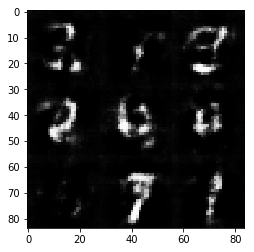

Epoch 1/20... Discriminator Loss: 0.5293... Generator Loss: 1.8146
Epoch 1/20... Discriminator Loss: 0.6971... Generator Loss: 0.9963
Epoch 1/20... Discriminator Loss: 0.5521... Generator Loss: 2.1116
Epoch 1/20... Discriminator Loss: 1.2153... Generator Loss: 0.4673
Epoch 1/20... Discriminator Loss: 0.5407... Generator Loss: 1.4286
Epoch 1/20... Discriminator Loss: 1.4338... Generator Loss: 0.4158
Epoch 2/20... Discriminator Loss: 0.8761... Generator Loss: 0.7261
Epoch 2/20... Discriminator Loss: 0.6459... Generator Loss: 1.8031
Epoch 2/20... Discriminator Loss: 0.5768... Generator Loss: 1.4156
Epoch 2/20... Discriminator Loss: 0.7115... Generator Loss: 2.1263


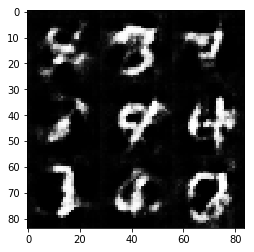

Epoch 2/20... Discriminator Loss: 0.7008... Generator Loss: 2.3556
Epoch 2/20... Discriminator Loss: 0.6824... Generator Loss: 1.9537
Epoch 2/20... Discriminator Loss: 0.7988... Generator Loss: 2.2747
Epoch 2/20... Discriminator Loss: 1.0572... Generator Loss: 0.5602
Epoch 2/20... Discriminator Loss: 0.6763... Generator Loss: 1.0559
Epoch 2/20... Discriminator Loss: 0.6621... Generator Loss: 1.7136
Epoch 2/20... Discriminator Loss: 0.8187... Generator Loss: 2.9594
Epoch 2/20... Discriminator Loss: 0.5802... Generator Loss: 1.4104
Epoch 2/20... Discriminator Loss: 0.8210... Generator Loss: 0.8569
Epoch 2/20... Discriminator Loss: 0.9694... Generator Loss: 0.6599


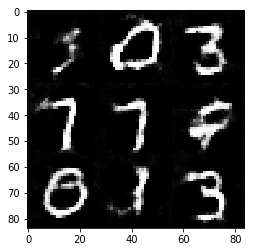

Epoch 2/20... Discriminator Loss: 0.6442... Generator Loss: 1.7070
Epoch 2/20... Discriminator Loss: 0.9417... Generator Loss: 0.7088
Epoch 2/20... Discriminator Loss: 0.6770... Generator Loss: 1.6600
Epoch 2/20... Discriminator Loss: 0.6025... Generator Loss: 1.3709
Epoch 2/20... Discriminator Loss: 0.7235... Generator Loss: 0.9254
Epoch 2/20... Discriminator Loss: 0.6693... Generator Loss: 1.0471
Epoch 2/20... Discriminator Loss: 0.8459... Generator Loss: 2.2949
Epoch 2/20... Discriminator Loss: 0.6468... Generator Loss: 1.5713
Epoch 2/20... Discriminator Loss: 0.9588... Generator Loss: 2.6375
Epoch 2/20... Discriminator Loss: 0.6809... Generator Loss: 1.2455


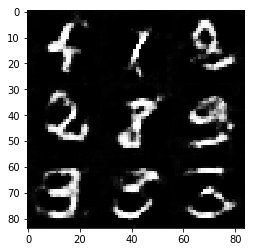

Epoch 2/20... Discriminator Loss: 0.6363... Generator Loss: 1.6047
Epoch 2/20... Discriminator Loss: 0.6737... Generator Loss: 1.7225
Epoch 2/20... Discriminator Loss: 1.1945... Generator Loss: 2.8853
Epoch 2/20... Discriminator Loss: 0.7088... Generator Loss: 1.7777
Epoch 2/20... Discriminator Loss: 0.7389... Generator Loss: 1.0089
Epoch 2/20... Discriminator Loss: 0.6699... Generator Loss: 1.2454
Epoch 2/20... Discriminator Loss: 0.7181... Generator Loss: 1.8805
Epoch 2/20... Discriminator Loss: 0.6455... Generator Loss: 1.3990
Epoch 2/20... Discriminator Loss: 0.9284... Generator Loss: 2.4463
Epoch 2/20... Discriminator Loss: 0.7644... Generator Loss: 0.8595


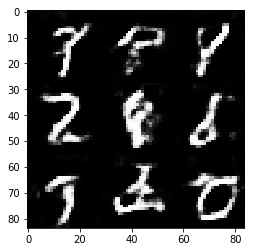

Epoch 2/20... Discriminator Loss: 0.9765... Generator Loss: 2.1883
Epoch 2/20... Discriminator Loss: 0.7400... Generator Loss: 1.0089
Epoch 2/20... Discriminator Loss: 1.0927... Generator Loss: 2.8699
Epoch 2/20... Discriminator Loss: 0.6972... Generator Loss: 1.6119
Epoch 2/20... Discriminator Loss: 0.6222... Generator Loss: 1.3570
Epoch 2/20... Discriminator Loss: 0.5907... Generator Loss: 1.9590
Epoch 2/20... Discriminator Loss: 0.7051... Generator Loss: 1.2657
Epoch 2/20... Discriminator Loss: 0.6629... Generator Loss: 1.6624
Epoch 2/20... Discriminator Loss: 0.9488... Generator Loss: 0.6868
Epoch 2/20... Discriminator Loss: 0.7017... Generator Loss: 2.0382


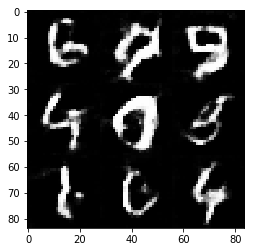

Epoch 2/20... Discriminator Loss: 1.0613... Generator Loss: 0.5796
Epoch 2/20... Discriminator Loss: 0.7254... Generator Loss: 0.9568
Epoch 2/20... Discriminator Loss: 0.7421... Generator Loss: 2.2850
Epoch 3/20... Discriminator Loss: 2.1342... Generator Loss: 0.1732
Epoch 3/20... Discriminator Loss: 0.7569... Generator Loss: 0.9625
Epoch 3/20... Discriminator Loss: 0.6116... Generator Loss: 1.3236
Epoch 3/20... Discriminator Loss: 0.8225... Generator Loss: 0.7815
Epoch 3/20... Discriminator Loss: 0.5786... Generator Loss: 1.5366
Epoch 3/20... Discriminator Loss: 0.6118... Generator Loss: 1.6811
Epoch 3/20... Discriminator Loss: 0.9968... Generator Loss: 0.6149


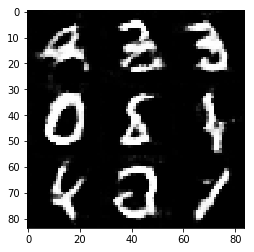

Epoch 3/20... Discriminator Loss: 0.6649... Generator Loss: 1.4658
Epoch 3/20... Discriminator Loss: 0.6014... Generator Loss: 1.3821
Epoch 3/20... Discriminator Loss: 0.5211... Generator Loss: 1.3370
Epoch 3/20... Discriminator Loss: 0.5428... Generator Loss: 1.7913
Epoch 3/20... Discriminator Loss: 0.5577... Generator Loss: 1.3623
Epoch 3/20... Discriminator Loss: 0.5615... Generator Loss: 1.2570
Epoch 3/20... Discriminator Loss: 0.6519... Generator Loss: 1.0360
Epoch 3/20... Discriminator Loss: 0.7038... Generator Loss: 0.9642
Epoch 3/20... Discriminator Loss: 0.5950... Generator Loss: 2.0583
Epoch 3/20... Discriminator Loss: 0.6926... Generator Loss: 1.3686


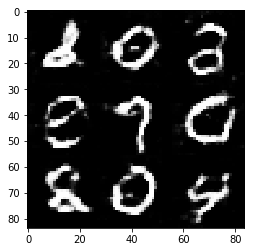

Epoch 3/20... Discriminator Loss: 0.5810... Generator Loss: 1.2853
Epoch 3/20... Discriminator Loss: 0.4828... Generator Loss: 1.4964
Epoch 3/20... Discriminator Loss: 0.6012... Generator Loss: 1.3320
Epoch 3/20... Discriminator Loss: 0.6844... Generator Loss: 0.9848
Epoch 3/20... Discriminator Loss: 0.5939... Generator Loss: 1.1379
Epoch 3/20... Discriminator Loss: 2.8042... Generator Loss: 0.1172
Epoch 3/20... Discriminator Loss: 0.7428... Generator Loss: 1.7177
Epoch 3/20... Discriminator Loss: 0.7021... Generator Loss: 1.0384
Epoch 3/20... Discriminator Loss: 0.5763... Generator Loss: 1.3035
Epoch 3/20... Discriminator Loss: 0.5415... Generator Loss: 1.4487


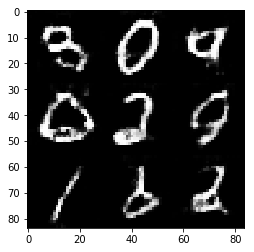

Epoch 3/20... Discriminator Loss: 0.5480... Generator Loss: 1.3183
Epoch 3/20... Discriminator Loss: 0.5493... Generator Loss: 1.2793
Epoch 3/20... Discriminator Loss: 0.4879... Generator Loss: 1.4752
Epoch 3/20... Discriminator Loss: 1.0811... Generator Loss: 0.5343
Epoch 3/20... Discriminator Loss: 1.5547... Generator Loss: 0.3450
Epoch 3/20... Discriminator Loss: 0.7243... Generator Loss: 1.2131
Epoch 3/20... Discriminator Loss: 0.6828... Generator Loss: 0.9500
Epoch 3/20... Discriminator Loss: 0.8296... Generator Loss: 0.8155
Epoch 3/20... Discriminator Loss: 0.6817... Generator Loss: 1.1143
Epoch 3/20... Discriminator Loss: 0.6488... Generator Loss: 1.1002


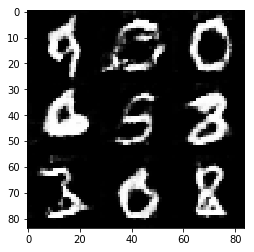

Epoch 3/20... Discriminator Loss: 0.5448... Generator Loss: 1.3427
Epoch 3/20... Discriminator Loss: 0.6339... Generator Loss: 1.4618
Epoch 3/20... Discriminator Loss: 0.6669... Generator Loss: 1.0021
Epoch 3/20... Discriminator Loss: 0.8420... Generator Loss: 0.7889
Epoch 3/20... Discriminator Loss: 1.4520... Generator Loss: 3.0383
Epoch 3/20... Discriminator Loss: 1.1127... Generator Loss: 0.7337
Epoch 3/20... Discriminator Loss: 0.8239... Generator Loss: 0.8673
Epoch 3/20... Discriminator Loss: 0.6400... Generator Loss: 1.2154
Epoch 3/20... Discriminator Loss: 0.5941... Generator Loss: 1.3591
Epoch 3/20... Discriminator Loss: 0.7182... Generator Loss: 1.9909


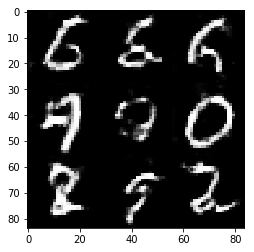

Epoch 4/20... Discriminator Loss: 0.8761... Generator Loss: 0.8111
Epoch 4/20... Discriminator Loss: 1.0556... Generator Loss: 0.5491
Epoch 4/20... Discriminator Loss: 0.6578... Generator Loss: 1.0172
Epoch 4/20... Discriminator Loss: 0.6506... Generator Loss: 1.2325
Epoch 4/20... Discriminator Loss: 0.8620... Generator Loss: 0.7371
Epoch 4/20... Discriminator Loss: 0.6523... Generator Loss: 1.0995
Epoch 4/20... Discriminator Loss: 1.6171... Generator Loss: 0.3710
Epoch 4/20... Discriminator Loss: 0.9086... Generator Loss: 1.0172
Epoch 4/20... Discriminator Loss: 0.9294... Generator Loss: 2.3177
Epoch 4/20... Discriminator Loss: 0.9296... Generator Loss: 0.6747


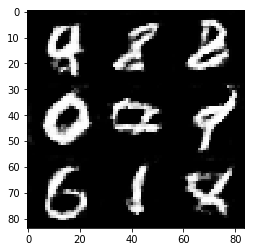

Epoch 4/20... Discriminator Loss: 0.6243... Generator Loss: 1.1199
Epoch 4/20... Discriminator Loss: 0.5937... Generator Loss: 1.2573
Epoch 4/20... Discriminator Loss: 0.4955... Generator Loss: 1.6050
Epoch 4/20... Discriminator Loss: 1.0162... Generator Loss: 3.0335
Epoch 4/20... Discriminator Loss: 0.6266... Generator Loss: 1.7027
Epoch 4/20... Discriminator Loss: 0.8012... Generator Loss: 0.7757
Epoch 4/20... Discriminator Loss: 0.8736... Generator Loss: 0.7208
Epoch 4/20... Discriminator Loss: 1.1932... Generator Loss: 0.4938
Epoch 4/20... Discriminator Loss: 0.8187... Generator Loss: 0.7966
Epoch 4/20... Discriminator Loss: 0.6516... Generator Loss: 1.4864


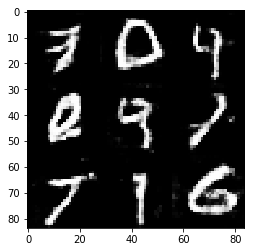

Epoch 4/20... Discriminator Loss: 0.9366... Generator Loss: 0.7779
Epoch 4/20... Discriminator Loss: 0.6249... Generator Loss: 1.7668
Epoch 4/20... Discriminator Loss: 0.8537... Generator Loss: 1.6352
Epoch 4/20... Discriminator Loss: 0.7506... Generator Loss: 1.1583
Epoch 4/20... Discriminator Loss: 0.9655... Generator Loss: 0.6439
Epoch 4/20... Discriminator Loss: 0.5471... Generator Loss: 1.6188
Epoch 4/20... Discriminator Loss: 0.6079... Generator Loss: 1.1406
Epoch 4/20... Discriminator Loss: 0.9355... Generator Loss: 0.6558
Epoch 4/20... Discriminator Loss: 0.6098... Generator Loss: 1.1397
Epoch 4/20... Discriminator Loss: 0.8105... Generator Loss: 0.7855


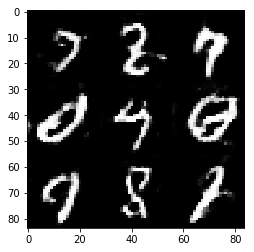

Epoch 4/20... Discriminator Loss: 0.4325... Generator Loss: 1.8308
Epoch 4/20... Discriminator Loss: 1.8197... Generator Loss: 0.2328
Epoch 4/20... Discriminator Loss: 0.8173... Generator Loss: 1.2805
Epoch 4/20... Discriminator Loss: 0.9407... Generator Loss: 0.7577
Epoch 4/20... Discriminator Loss: 0.6139... Generator Loss: 1.1389
Epoch 4/20... Discriminator Loss: 0.7202... Generator Loss: 0.9772
Epoch 4/20... Discriminator Loss: 0.6049... Generator Loss: 1.3376
Epoch 4/20... Discriminator Loss: 0.7807... Generator Loss: 0.8342
Epoch 4/20... Discriminator Loss: 0.4786... Generator Loss: 1.6699
Epoch 4/20... Discriminator Loss: 0.4639... Generator Loss: 1.5856


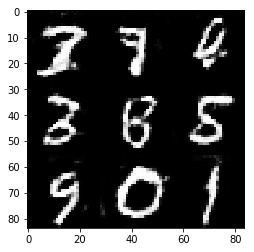

Epoch 4/20... Discriminator Loss: 0.8569... Generator Loss: 0.7351
Epoch 4/20... Discriminator Loss: 1.5302... Generator Loss: 2.8328
Epoch 4/20... Discriminator Loss: 0.9781... Generator Loss: 1.2127
Epoch 4/20... Discriminator Loss: 0.8625... Generator Loss: 0.9553
Epoch 4/20... Discriminator Loss: 0.7396... Generator Loss: 1.1155
Epoch 4/20... Discriminator Loss: 1.2202... Generator Loss: 0.4788
Epoch 4/20... Discriminator Loss: 0.4906... Generator Loss: 1.6541
Epoch 5/20... Discriminator Loss: 1.3705... Generator Loss: 0.4372
Epoch 5/20... Discriminator Loss: 0.7584... Generator Loss: 0.9583
Epoch 5/20... Discriminator Loss: 0.5707... Generator Loss: 1.2875


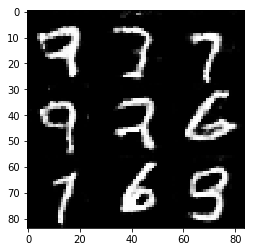

Epoch 5/20... Discriminator Loss: 0.6168... Generator Loss: 1.1575
Epoch 5/20... Discriminator Loss: 0.4212... Generator Loss: 1.8442
Epoch 5/20... Discriminator Loss: 0.5213... Generator Loss: 2.1331
Epoch 5/20... Discriminator Loss: 0.9049... Generator Loss: 0.7065
Epoch 5/20... Discriminator Loss: 1.2680... Generator Loss: 2.5883
Epoch 5/20... Discriminator Loss: 0.8913... Generator Loss: 0.8425
Epoch 5/20... Discriminator Loss: 1.1536... Generator Loss: 2.3195
Epoch 5/20... Discriminator Loss: 0.7628... Generator Loss: 1.0487
Epoch 5/20... Discriminator Loss: 0.6866... Generator Loss: 1.3935
Epoch 5/20... Discriminator Loss: 0.6592... Generator Loss: 1.3391


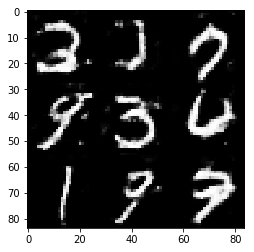

Epoch 5/20... Discriminator Loss: 0.7054... Generator Loss: 0.9925
Epoch 5/20... Discriminator Loss: 0.6965... Generator Loss: 0.9484
Epoch 5/20... Discriminator Loss: 0.5847... Generator Loss: 1.2237
Epoch 5/20... Discriminator Loss: 0.7432... Generator Loss: 0.9688
Epoch 5/20... Discriminator Loss: 0.4844... Generator Loss: 1.4325
Epoch 5/20... Discriminator Loss: 0.6330... Generator Loss: 1.3304
Epoch 5/20... Discriminator Loss: 0.8981... Generator Loss: 2.1125
Epoch 5/20... Discriminator Loss: 0.6844... Generator Loss: 1.0028
Epoch 5/20... Discriminator Loss: 0.6571... Generator Loss: 1.1246
Epoch 5/20... Discriminator Loss: 0.5297... Generator Loss: 1.4566


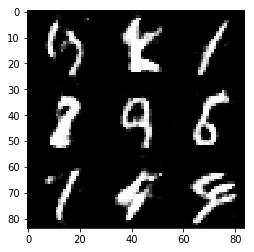

Epoch 5/20... Discriminator Loss: 0.5825... Generator Loss: 1.1942
Epoch 5/20... Discriminator Loss: 0.5245... Generator Loss: 1.5466
Epoch 5/20... Discriminator Loss: 0.5747... Generator Loss: 1.2373
Epoch 5/20... Discriminator Loss: 1.0041... Generator Loss: 0.6342
Epoch 5/20... Discriminator Loss: 2.6987... Generator Loss: 4.2259
Epoch 5/20... Discriminator Loss: 0.9535... Generator Loss: 0.7621
Epoch 5/20... Discriminator Loss: 0.6687... Generator Loss: 1.2046
Epoch 5/20... Discriminator Loss: 0.6262... Generator Loss: 1.4090
Epoch 5/20... Discriminator Loss: 0.6935... Generator Loss: 0.9546
Epoch 5/20... Discriminator Loss: 0.5428... Generator Loss: 1.4999


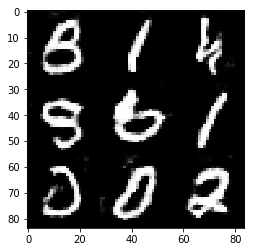

Epoch 5/20... Discriminator Loss: 0.6114... Generator Loss: 1.0453
Epoch 5/20... Discriminator Loss: 0.5946... Generator Loss: 1.2481
Epoch 5/20... Discriminator Loss: 0.6984... Generator Loss: 0.9708
Epoch 5/20... Discriminator Loss: 0.8118... Generator Loss: 0.8986
Epoch 5/20... Discriminator Loss: 1.2411... Generator Loss: 0.5504
Epoch 5/20... Discriminator Loss: 1.2261... Generator Loss: 0.4928
Epoch 5/20... Discriminator Loss: 0.5199... Generator Loss: 1.3467
Epoch 5/20... Discriminator Loss: 0.5711... Generator Loss: 1.2342
Epoch 5/20... Discriminator Loss: 0.6676... Generator Loss: 1.0542
Epoch 5/20... Discriminator Loss: 1.0776... Generator Loss: 0.5749


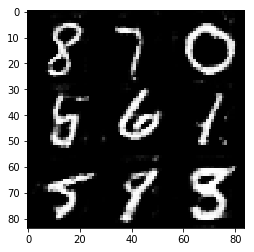

Epoch 5/20... Discriminator Loss: 0.6148... Generator Loss: 1.3401
Epoch 5/20... Discriminator Loss: 0.8689... Generator Loss: 0.8674
Epoch 5/20... Discriminator Loss: 0.9708... Generator Loss: 0.6291
Epoch 5/20... Discriminator Loss: 0.8097... Generator Loss: 2.3327
Epoch 6/20... Discriminator Loss: 0.6616... Generator Loss: 1.0294
Epoch 6/20... Discriminator Loss: 0.5443... Generator Loss: 1.3166
Epoch 6/20... Discriminator Loss: 0.4440... Generator Loss: 2.1174
Epoch 6/20... Discriminator Loss: 0.5636... Generator Loss: 1.1707
Epoch 6/20... Discriminator Loss: 0.6517... Generator Loss: 1.0874
Epoch 6/20... Discriminator Loss: 0.7586... Generator Loss: 2.7458


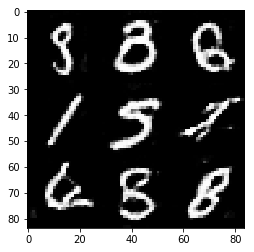

Epoch 6/20... Discriminator Loss: 0.8874... Generator Loss: 0.9424
Epoch 6/20... Discriminator Loss: 0.6009... Generator Loss: 2.6066
Epoch 6/20... Discriminator Loss: 0.6208... Generator Loss: 1.0767
Epoch 6/20... Discriminator Loss: 0.5822... Generator Loss: 1.2621
Epoch 6/20... Discriminator Loss: 0.5668... Generator Loss: 1.2216
Epoch 6/20... Discriminator Loss: 0.6150... Generator Loss: 1.0844
Epoch 6/20... Discriminator Loss: 0.6237... Generator Loss: 1.0552
Epoch 6/20... Discriminator Loss: 0.5840... Generator Loss: 1.1881
Epoch 6/20... Discriminator Loss: 0.6182... Generator Loss: 1.0487
Epoch 6/20... Discriminator Loss: 0.5858... Generator Loss: 3.1564


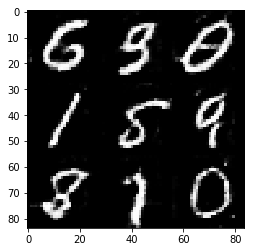

Epoch 6/20... Discriminator Loss: 1.7365... Generator Loss: 0.3200
Epoch 6/20... Discriminator Loss: 0.8018... Generator Loss: 0.8903
Epoch 6/20... Discriminator Loss: 0.8488... Generator Loss: 0.7754
Epoch 6/20... Discriminator Loss: 0.6519... Generator Loss: 1.2858
Epoch 6/20... Discriminator Loss: 2.1293... Generator Loss: 0.1861
Epoch 6/20... Discriminator Loss: 0.7226... Generator Loss: 2.1482
Epoch 6/20... Discriminator Loss: 0.8046... Generator Loss: 0.8403
Epoch 6/20... Discriminator Loss: 0.5731... Generator Loss: 1.1509
Epoch 6/20... Discriminator Loss: 0.8423... Generator Loss: 0.7803
Epoch 6/20... Discriminator Loss: 0.5579... Generator Loss: 1.8299


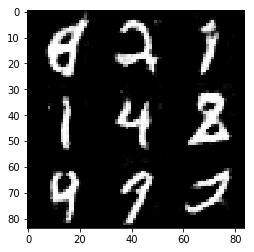

Epoch 6/20... Discriminator Loss: 0.6205... Generator Loss: 2.0225
Epoch 6/20... Discriminator Loss: 0.5035... Generator Loss: 1.5223
Epoch 6/20... Discriminator Loss: 0.9296... Generator Loss: 0.8217
Epoch 6/20... Discriminator Loss: 0.5681... Generator Loss: 1.3604
Epoch 6/20... Discriminator Loss: 0.5144... Generator Loss: 1.3626
Epoch 6/20... Discriminator Loss: 0.5745... Generator Loss: 1.1536
Epoch 6/20... Discriminator Loss: 0.4946... Generator Loss: 1.3618
Epoch 6/20... Discriminator Loss: 0.5148... Generator Loss: 1.2503
Epoch 6/20... Discriminator Loss: 1.1812... Generator Loss: 3.5166
Epoch 6/20... Discriminator Loss: 0.6572... Generator Loss: 1.0867


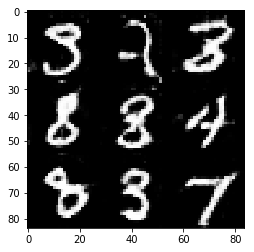

Epoch 6/20... Discriminator Loss: 0.6026... Generator Loss: 1.2347
Epoch 6/20... Discriminator Loss: 0.4103... Generator Loss: 1.5559
Epoch 6/20... Discriminator Loss: 0.5805... Generator Loss: 1.1879
Epoch 6/20... Discriminator Loss: 0.9631... Generator Loss: 0.7811
Epoch 6/20... Discriminator Loss: 0.5964... Generator Loss: 1.6191
Epoch 6/20... Discriminator Loss: 0.7501... Generator Loss: 0.8899
Epoch 6/20... Discriminator Loss: 0.4313... Generator Loss: 2.0620
Epoch 6/20... Discriminator Loss: 0.6809... Generator Loss: 1.0747
Epoch 6/20... Discriminator Loss: 0.5760... Generator Loss: 1.2431
Epoch 6/20... Discriminator Loss: 0.4055... Generator Loss: 1.5362


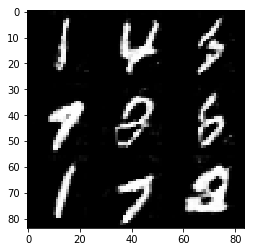

Epoch 7/20... Discriminator Loss: 0.5336... Generator Loss: 1.2351
Epoch 7/20... Discriminator Loss: 0.9592... Generator Loss: 2.9526
Epoch 7/20... Discriminator Loss: 1.2041... Generator Loss: 3.2415
Epoch 7/20... Discriminator Loss: 0.5321... Generator Loss: 2.1263
Epoch 7/20... Discriminator Loss: 0.5068... Generator Loss: 1.7501
Epoch 7/20... Discriminator Loss: 0.8252... Generator Loss: 0.8073
Epoch 7/20... Discriminator Loss: 0.6009... Generator Loss: 1.0754
Epoch 7/20... Discriminator Loss: 0.5370... Generator Loss: 1.2507
Epoch 7/20... Discriminator Loss: 0.4656... Generator Loss: 1.4413
Epoch 7/20... Discriminator Loss: 0.8312... Generator Loss: 0.9001


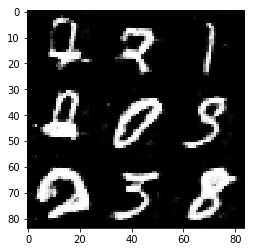

Epoch 7/20... Discriminator Loss: 0.7566... Generator Loss: 0.9370
Epoch 7/20... Discriminator Loss: 0.5313... Generator Loss: 1.8202
Epoch 7/20... Discriminator Loss: 0.8144... Generator Loss: 0.7530
Epoch 7/20... Discriminator Loss: 0.5487... Generator Loss: 1.4949
Epoch 7/20... Discriminator Loss: 0.5231... Generator Loss: 1.3900
Epoch 7/20... Discriminator Loss: 0.6031... Generator Loss: 1.0836
Epoch 7/20... Discriminator Loss: 1.4973... Generator Loss: 2.8417
Epoch 7/20... Discriminator Loss: 0.8212... Generator Loss: 0.9697
Epoch 7/20... Discriminator Loss: 0.6927... Generator Loss: 1.5363
Epoch 7/20... Discriminator Loss: 0.5039... Generator Loss: 1.7015


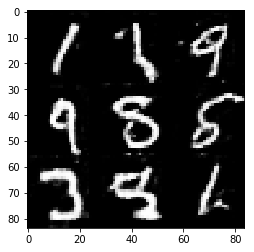

Epoch 7/20... Discriminator Loss: 0.5653... Generator Loss: 1.3943
Epoch 7/20... Discriminator Loss: 0.4204... Generator Loss: 1.6322
Epoch 7/20... Discriminator Loss: 0.4671... Generator Loss: 1.5444
Epoch 7/20... Discriminator Loss: 0.5339... Generator Loss: 1.5096
Epoch 7/20... Discriminator Loss: 0.6140... Generator Loss: 1.1026
Epoch 7/20... Discriminator Loss: 0.6416... Generator Loss: 1.0168
Epoch 7/20... Discriminator Loss: 0.4801... Generator Loss: 1.3364
Epoch 7/20... Discriminator Loss: 0.7988... Generator Loss: 0.8464
Epoch 7/20... Discriminator Loss: 2.1757... Generator Loss: 5.3295
Epoch 7/20... Discriminator Loss: 1.0987... Generator Loss: 0.6244


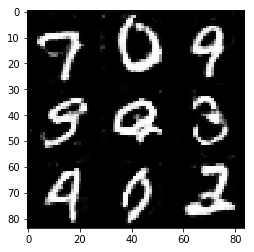

Epoch 7/20... Discriminator Loss: 0.6459... Generator Loss: 1.0977
Epoch 7/20... Discriminator Loss: 0.7983... Generator Loss: 0.8008
Epoch 7/20... Discriminator Loss: 0.5061... Generator Loss: 1.3592
Epoch 7/20... Discriminator Loss: 0.6849... Generator Loss: 0.9371
Epoch 7/20... Discriminator Loss: 0.4373... Generator Loss: 2.2766
Epoch 7/20... Discriminator Loss: 0.3892... Generator Loss: 1.7300
Epoch 7/20... Discriminator Loss: 0.5110... Generator Loss: 1.2293
Epoch 7/20... Discriminator Loss: 0.6433... Generator Loss: 1.0635
Epoch 7/20... Discriminator Loss: 3.2866... Generator Loss: 0.0651
Epoch 7/20... Discriminator Loss: 0.9083... Generator Loss: 0.8813


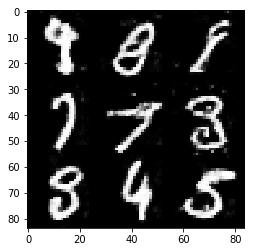

Epoch 7/20... Discriminator Loss: 0.6791... Generator Loss: 1.6294
Epoch 7/20... Discriminator Loss: 0.7777... Generator Loss: 0.9357
Epoch 7/20... Discriminator Loss: 0.5737... Generator Loss: 1.3802
Epoch 7/20... Discriminator Loss: 0.6702... Generator Loss: 2.6346
Epoch 7/20... Discriminator Loss: 0.8356... Generator Loss: 0.7972
Epoch 7/20... Discriminator Loss: 0.6569... Generator Loss: 1.0318
Epoch 7/20... Discriminator Loss: 0.5263... Generator Loss: 1.7755
Epoch 8/20... Discriminator Loss: 0.7549... Generator Loss: 0.8662
Epoch 8/20... Discriminator Loss: 0.8765... Generator Loss: 1.3397
Epoch 8/20... Discriminator Loss: 0.6638... Generator Loss: 1.3426


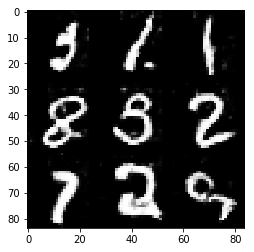

Epoch 8/20... Discriminator Loss: 0.6412... Generator Loss: 2.1244
Epoch 8/20... Discriminator Loss: 0.6146... Generator Loss: 1.2191
Epoch 8/20... Discriminator Loss: 1.1165... Generator Loss: 0.5554
Epoch 8/20... Discriminator Loss: 0.5630... Generator Loss: 1.1680
Epoch 8/20... Discriminator Loss: 0.5005... Generator Loss: 1.3490
Epoch 8/20... Discriminator Loss: 0.4989... Generator Loss: 1.3795
Epoch 8/20... Discriminator Loss: 0.4692... Generator Loss: 1.7122
Epoch 8/20... Discriminator Loss: 0.5183... Generator Loss: 1.2644
Epoch 8/20... Discriminator Loss: 0.4123... Generator Loss: 1.6849
Epoch 8/20... Discriminator Loss: 0.5487... Generator Loss: 1.2231


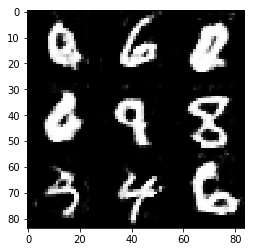

Epoch 8/20... Discriminator Loss: 0.6247... Generator Loss: 1.0748
Epoch 8/20... Discriminator Loss: 0.6117... Generator Loss: 2.4982
Epoch 8/20... Discriminator Loss: 0.8048... Generator Loss: 2.0829
Epoch 8/20... Discriminator Loss: 0.7078... Generator Loss: 1.6867
Epoch 8/20... Discriminator Loss: 0.6201... Generator Loss: 2.4803
Epoch 8/20... Discriminator Loss: 0.8256... Generator Loss: 0.8208
Epoch 8/20... Discriminator Loss: 0.6609... Generator Loss: 1.0722
Epoch 8/20... Discriminator Loss: 0.4526... Generator Loss: 1.5270
Epoch 8/20... Discriminator Loss: 0.3575... Generator Loss: 1.8939
Epoch 8/20... Discriminator Loss: 0.4699... Generator Loss: 1.3576


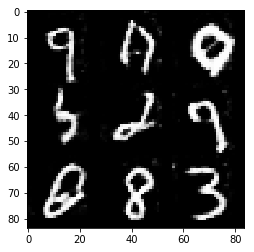

Epoch 8/20... Discriminator Loss: 4.6475... Generator Loss: 7.4415
Epoch 8/20... Discriminator Loss: 1.0116... Generator Loss: 2.6018
Epoch 8/20... Discriminator Loss: 0.5079... Generator Loss: 1.5079
Epoch 8/20... Discriminator Loss: 0.5818... Generator Loss: 1.2756
Epoch 8/20... Discriminator Loss: 0.4504... Generator Loss: 1.4442
Epoch 8/20... Discriminator Loss: 0.5213... Generator Loss: 1.2649
Epoch 8/20... Discriminator Loss: 0.3563... Generator Loss: 2.1455
Epoch 8/20... Discriminator Loss: 0.5614... Generator Loss: 1.1555
Epoch 8/20... Discriminator Loss: 0.4154... Generator Loss: 1.8390
Epoch 8/20... Discriminator Loss: 0.4848... Generator Loss: 1.6883


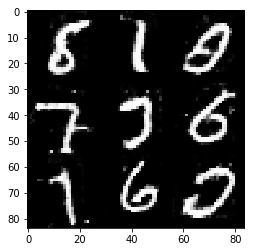

Epoch 8/20... Discriminator Loss: 0.8671... Generator Loss: 0.7988
Epoch 8/20... Discriminator Loss: 0.7487... Generator Loss: 0.8903
Epoch 8/20... Discriminator Loss: 0.4446... Generator Loss: 1.4319
Epoch 8/20... Discriminator Loss: 0.3444... Generator Loss: 1.9714
Epoch 8/20... Discriminator Loss: 0.3633... Generator Loss: 1.8226
Epoch 8/20... Discriminator Loss: 0.7193... Generator Loss: 0.9291
Epoch 8/20... Discriminator Loss: 0.3481... Generator Loss: 1.8279
Epoch 8/20... Discriminator Loss: 0.6073... Generator Loss: 1.1348
Epoch 8/20... Discriminator Loss: 0.5640... Generator Loss: 1.1328
Epoch 8/20... Discriminator Loss: 0.3366... Generator Loss: 2.0194


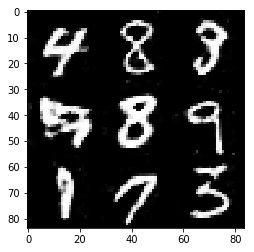

Epoch 8/20... Discriminator Loss: 2.0680... Generator Loss: 5.1493
Epoch 8/20... Discriminator Loss: 0.7893... Generator Loss: 0.9049
Epoch 8/20... Discriminator Loss: 0.6055... Generator Loss: 1.1297
Epoch 8/20... Discriminator Loss: 0.7827... Generator Loss: 0.8731
Epoch 9/20... Discriminator Loss: 2.4726... Generator Loss: 0.1813
Epoch 9/20... Discriminator Loss: 1.2689... Generator Loss: 2.9714
Epoch 9/20... Discriminator Loss: 0.6806... Generator Loss: 1.2115
Epoch 9/20... Discriminator Loss: 1.2085... Generator Loss: 3.0963
Epoch 9/20... Discriminator Loss: 0.5911... Generator Loss: 2.4345
Epoch 9/20... Discriminator Loss: 0.9568... Generator Loss: 0.7325


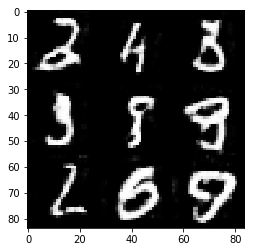

Epoch 9/20... Discriminator Loss: 1.0265... Generator Loss: 0.6250
Epoch 9/20... Discriminator Loss: 0.6776... Generator Loss: 0.9950
Epoch 9/20... Discriminator Loss: 0.6912... Generator Loss: 0.9326
Epoch 9/20... Discriminator Loss: 0.4038... Generator Loss: 1.9005
Epoch 9/20... Discriminator Loss: 0.6023... Generator Loss: 1.1403
Epoch 9/20... Discriminator Loss: 0.4052... Generator Loss: 1.5709
Epoch 9/20... Discriminator Loss: 0.5954... Generator Loss: 2.5623
Epoch 9/20... Discriminator Loss: 0.5452... Generator Loss: 1.2907
Epoch 9/20... Discriminator Loss: 1.4506... Generator Loss: 3.4510
Epoch 9/20... Discriminator Loss: 0.5564... Generator Loss: 1.4189


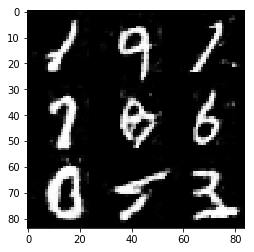

Epoch 9/20... Discriminator Loss: 0.5998... Generator Loss: 1.1326
Epoch 9/20... Discriminator Loss: 0.5710... Generator Loss: 1.2372
Epoch 9/20... Discriminator Loss: 0.5685... Generator Loss: 1.2245
Epoch 9/20... Discriminator Loss: 0.9017... Generator Loss: 0.7464
Epoch 9/20... Discriminator Loss: 0.7837... Generator Loss: 0.8831
Epoch 9/20... Discriminator Loss: 0.3219... Generator Loss: 2.4377
Epoch 9/20... Discriminator Loss: 0.3714... Generator Loss: 1.7455
Epoch 9/20... Discriminator Loss: 0.4268... Generator Loss: 1.5487
Epoch 9/20... Discriminator Loss: 0.3747... Generator Loss: 1.7318
Epoch 9/20... Discriminator Loss: 4.1262... Generator Loss: 7.1493


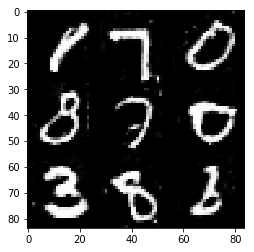

Epoch 9/20... Discriminator Loss: 0.7871... Generator Loss: 1.8154
Epoch 9/20... Discriminator Loss: 0.7181... Generator Loss: 1.3761
Epoch 9/20... Discriminator Loss: 0.7425... Generator Loss: 0.9915
Epoch 9/20... Discriminator Loss: 0.5854... Generator Loss: 1.8595
Epoch 9/20... Discriminator Loss: 0.4987... Generator Loss: 2.7455
Epoch 9/20... Discriminator Loss: 3.1438... Generator Loss: 0.0951
Epoch 9/20... Discriminator Loss: 0.5620... Generator Loss: 1.5980
Epoch 9/20... Discriminator Loss: 0.5177... Generator Loss: 1.6454
Epoch 9/20... Discriminator Loss: 0.4259... Generator Loss: 1.5632
Epoch 9/20... Discriminator Loss: 0.7248... Generator Loss: 0.8709


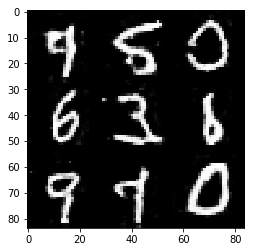

Epoch 9/20... Discriminator Loss: 0.4540... Generator Loss: 1.4765
Epoch 9/20... Discriminator Loss: 0.8328... Generator Loss: 0.8066
Epoch 9/20... Discriminator Loss: 0.4055... Generator Loss: 1.5865
Epoch 9/20... Discriminator Loss: 0.4528... Generator Loss: 1.4593
Epoch 9/20... Discriminator Loss: 0.7505... Generator Loss: 0.8549
Epoch 9/20... Discriminator Loss: 0.7932... Generator Loss: 1.2597
Epoch 9/20... Discriminator Loss: 0.8518... Generator Loss: 0.8616
Epoch 9/20... Discriminator Loss: 0.6347... Generator Loss: 1.4350
Epoch 9/20... Discriminator Loss: 0.6631... Generator Loss: 2.5514
Epoch 9/20... Discriminator Loss: 1.0951... Generator Loss: 0.5902


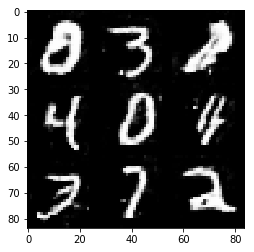

Epoch 9/20... Discriminator Loss: 0.5397... Generator Loss: 1.8703
Epoch 10/20... Discriminator Loss: 0.7163... Generator Loss: 1.3803
Epoch 10/20... Discriminator Loss: 0.7333... Generator Loss: 0.9383
Epoch 10/20... Discriminator Loss: 0.5070... Generator Loss: 1.4692
Epoch 10/20... Discriminator Loss: 0.6889... Generator Loss: 0.9611
Epoch 10/20... Discriminator Loss: 0.3891... Generator Loss: 1.7896
Epoch 10/20... Discriminator Loss: 0.4348... Generator Loss: 1.5367
Epoch 10/20... Discriminator Loss: 0.5360... Generator Loss: 1.2671
Epoch 10/20... Discriminator Loss: 0.5191... Generator Loss: 1.5013
Epoch 10/20... Discriminator Loss: 0.4513... Generator Loss: 1.4756


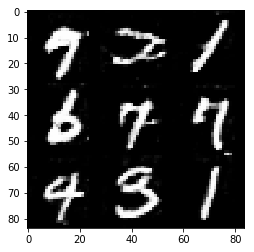

Epoch 10/20... Discriminator Loss: 0.5836... Generator Loss: 1.1199
Epoch 10/20... Discriminator Loss: 0.5449... Generator Loss: 1.1104
Epoch 10/20... Discriminator Loss: 0.3631... Generator Loss: 1.7521
Epoch 10/20... Discriminator Loss: 0.6027... Generator Loss: 1.0877
Epoch 10/20... Discriminator Loss: 0.6256... Generator Loss: 1.0673
Epoch 10/20... Discriminator Loss: 1.6682... Generator Loss: 0.3506
Epoch 10/20... Discriminator Loss: 0.8318... Generator Loss: 1.4208
Epoch 10/20... Discriminator Loss: 0.9367... Generator Loss: 2.3551
Epoch 10/20... Discriminator Loss: 0.9202... Generator Loss: 3.0477
Epoch 10/20... Discriminator Loss: 0.8112... Generator Loss: 0.8752


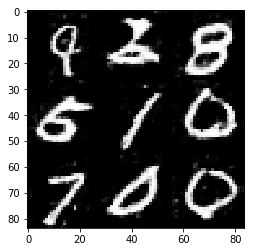

Epoch 10/20... Discriminator Loss: 0.9742... Generator Loss: 0.7782
Epoch 10/20... Discriminator Loss: 1.1201... Generator Loss: 0.8245
Epoch 10/20... Discriminator Loss: 0.5902... Generator Loss: 1.5358
Epoch 10/20... Discriminator Loss: 0.6363... Generator Loss: 1.1724
Epoch 10/20... Discriminator Loss: 0.5891... Generator Loss: 1.2164
Epoch 10/20... Discriminator Loss: 0.5035... Generator Loss: 2.2595
Epoch 10/20... Discriminator Loss: 0.6530... Generator Loss: 1.0142
Epoch 10/20... Discriminator Loss: 0.8197... Generator Loss: 0.8350
Epoch 10/20... Discriminator Loss: 0.5423... Generator Loss: 1.3033
Epoch 10/20... Discriminator Loss: 0.6309... Generator Loss: 1.0909


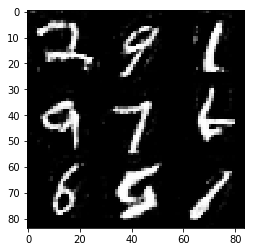

Epoch 10/20... Discriminator Loss: 0.7887... Generator Loss: 1.0179
Epoch 10/20... Discriminator Loss: 0.7980... Generator Loss: 0.8497
Epoch 10/20... Discriminator Loss: 0.3404... Generator Loss: 1.7715
Epoch 10/20... Discriminator Loss: 0.4683... Generator Loss: 1.5345
Epoch 10/20... Discriminator Loss: 0.4478... Generator Loss: 1.4181
Epoch 10/20... Discriminator Loss: 0.4799... Generator Loss: 1.3868
Epoch 10/20... Discriminator Loss: 0.4280... Generator Loss: 1.5813
Epoch 10/20... Discriminator Loss: 0.4428... Generator Loss: 1.4148
Epoch 10/20... Discriminator Loss: 0.3255... Generator Loss: 2.0195
Epoch 10/20... Discriminator Loss: 0.8940... Generator Loss: 0.7450


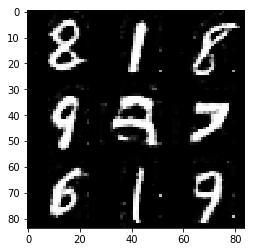

Epoch 10/20... Discriminator Loss: 1.5314... Generator Loss: 0.3319
Epoch 10/20... Discriminator Loss: 0.3996... Generator Loss: 1.6320
Epoch 10/20... Discriminator Loss: 0.8292... Generator Loss: 2.5943
Epoch 10/20... Discriminator Loss: 0.4682... Generator Loss: 1.8047
Epoch 10/20... Discriminator Loss: 0.6379... Generator Loss: 1.0976
Epoch 10/20... Discriminator Loss: 0.5971... Generator Loss: 1.1043
Epoch 10/20... Discriminator Loss: 0.6049... Generator Loss: 1.1548
Epoch 10/20... Discriminator Loss: 0.6898... Generator Loss: 1.0084
Epoch 11/20... Discriminator Loss: 0.5750... Generator Loss: 1.1871
Epoch 11/20... Discriminator Loss: 0.4597... Generator Loss: 1.5014


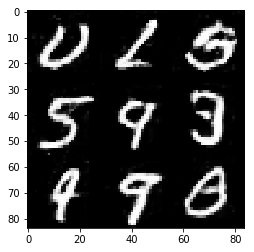

Epoch 11/20... Discriminator Loss: 0.3965... Generator Loss: 1.6316
Epoch 11/20... Discriminator Loss: 2.6772... Generator Loss: 4.7355
Epoch 11/20... Discriminator Loss: 1.0620... Generator Loss: 0.6657
Epoch 11/20... Discriminator Loss: 0.4193... Generator Loss: 1.8506
Epoch 11/20... Discriminator Loss: 0.4055... Generator Loss: 1.5230
Epoch 11/20... Discriminator Loss: 0.8489... Generator Loss: 0.7742
Epoch 11/20... Discriminator Loss: 0.5555... Generator Loss: 1.2556
Epoch 11/20... Discriminator Loss: 0.6319... Generator Loss: 1.1089
Epoch 11/20... Discriminator Loss: 0.5464... Generator Loss: 1.2903
Epoch 11/20... Discriminator Loss: 0.7061... Generator Loss: 0.9804


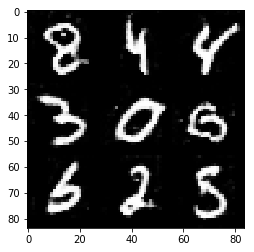

Epoch 11/20... Discriminator Loss: 0.4452... Generator Loss: 2.5466
Epoch 11/20... Discriminator Loss: 0.6491... Generator Loss: 1.0474
Epoch 11/20... Discriminator Loss: 0.5339... Generator Loss: 1.2365
Epoch 11/20... Discriminator Loss: 0.5038... Generator Loss: 1.3124
Epoch 11/20... Discriminator Loss: 0.4537... Generator Loss: 1.3413
Epoch 11/20... Discriminator Loss: 0.6764... Generator Loss: 1.0081
Epoch 11/20... Discriminator Loss: 0.6258... Generator Loss: 1.0192
Epoch 11/20... Discriminator Loss: 0.4428... Generator Loss: 1.4712
Epoch 11/20... Discriminator Loss: 0.4527... Generator Loss: 1.6409
Epoch 11/20... Discriminator Loss: 0.8049... Generator Loss: 0.8214


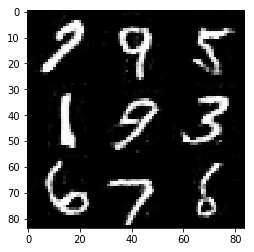

Epoch 11/20... Discriminator Loss: 1.7320... Generator Loss: 4.9429
Epoch 11/20... Discriminator Loss: 0.8295... Generator Loss: 0.9261
Epoch 11/20... Discriminator Loss: 0.6808... Generator Loss: 1.2174
Epoch 11/20... Discriminator Loss: 0.7156... Generator Loss: 2.3789
Epoch 11/20... Discriminator Loss: 0.6330... Generator Loss: 1.2050
Epoch 11/20... Discriminator Loss: 0.5865... Generator Loss: 1.1335
Epoch 11/20... Discriminator Loss: 0.7048... Generator Loss: 0.9931
Epoch 11/20... Discriminator Loss: 0.7797... Generator Loss: 0.8760
Epoch 11/20... Discriminator Loss: 1.1559... Generator Loss: 0.6417
Epoch 11/20... Discriminator Loss: 0.5279... Generator Loss: 2.0546


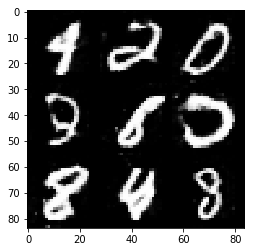

Epoch 11/20... Discriminator Loss: 0.6584... Generator Loss: 1.1003
Epoch 11/20... Discriminator Loss: 0.5031... Generator Loss: 1.3117
Epoch 11/20... Discriminator Loss: 0.5400... Generator Loss: 1.2209
Epoch 11/20... Discriminator Loss: 0.6817... Generator Loss: 1.0036
Epoch 11/20... Discriminator Loss: 0.6535... Generator Loss: 1.0237
Epoch 11/20... Discriminator Loss: 0.3620... Generator Loss: 1.7906
Epoch 11/20... Discriminator Loss: 0.6588... Generator Loss: 1.0332
Epoch 11/20... Discriminator Loss: 0.6924... Generator Loss: 1.0913
Epoch 11/20... Discriminator Loss: 0.5404... Generator Loss: 1.3305
Epoch 11/20... Discriminator Loss: 0.5273... Generator Loss: 1.3516


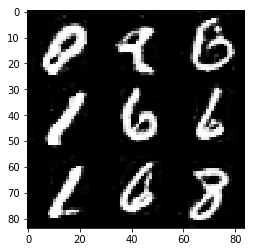

Epoch 11/20... Discriminator Loss: 0.3783... Generator Loss: 1.6509
Epoch 11/20... Discriminator Loss: 0.6020... Generator Loss: 1.1257
Epoch 11/20... Discriminator Loss: 0.5069... Generator Loss: 1.2707
Epoch 11/20... Discriminator Loss: 0.3912... Generator Loss: 1.4956
Epoch 12/20... Discriminator Loss: 0.6086... Generator Loss: 1.1221
Epoch 12/20... Discriminator Loss: 0.3513... Generator Loss: 1.8056
Epoch 12/20... Discriminator Loss: 0.6683... Generator Loss: 1.0110
Epoch 12/20... Discriminator Loss: 0.4353... Generator Loss: 1.4291
Epoch 12/20... Discriminator Loss: 0.4088... Generator Loss: 2.0341
Epoch 12/20... Discriminator Loss: 0.5692... Generator Loss: 2.3472


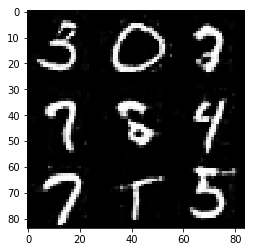

Epoch 12/20... Discriminator Loss: 0.6294... Generator Loss: 1.4633
Epoch 12/20... Discriminator Loss: 0.4393... Generator Loss: 1.9482
Epoch 12/20... Discriminator Loss: 0.5091... Generator Loss: 1.8592
Epoch 12/20... Discriminator Loss: 1.8757... Generator Loss: 0.3887
Epoch 12/20... Discriminator Loss: 0.5344... Generator Loss: 1.5752
Epoch 12/20... Discriminator Loss: 0.5677... Generator Loss: 1.1595
Epoch 12/20... Discriminator Loss: 0.5261... Generator Loss: 1.2100
Epoch 12/20... Discriminator Loss: 0.5498... Generator Loss: 1.2089
Epoch 12/20... Discriminator Loss: 0.5127... Generator Loss: 1.2413
Epoch 12/20... Discriminator Loss: 0.4583... Generator Loss: 1.4096


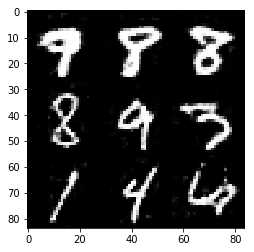

Epoch 12/20... Discriminator Loss: 0.6060... Generator Loss: 1.1804
Epoch 12/20... Discriminator Loss: 0.5757... Generator Loss: 1.1299
Epoch 12/20... Discriminator Loss: 0.4350... Generator Loss: 1.4634
Epoch 12/20... Discriminator Loss: 0.4710... Generator Loss: 1.3321
Epoch 12/20... Discriminator Loss: 0.5587... Generator Loss: 1.1919
Epoch 12/20... Discriminator Loss: 0.5162... Generator Loss: 1.2223
Epoch 12/20... Discriminator Loss: 0.4292... Generator Loss: 1.4880
Epoch 12/20... Discriminator Loss: 0.7185... Generator Loss: 0.9799
Epoch 12/20... Discriminator Loss: 0.4820... Generator Loss: 1.3437
Epoch 12/20... Discriminator Loss: 0.4445... Generator Loss: 1.4014


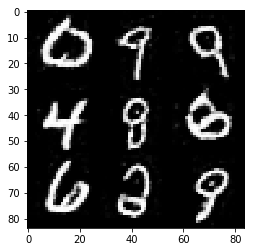

Epoch 12/20... Discriminator Loss: 0.4403... Generator Loss: 1.6099
Epoch 12/20... Discriminator Loss: 0.5081... Generator Loss: 1.3602
Epoch 12/20... Discriminator Loss: 0.5252... Generator Loss: 2.0001
Epoch 12/20... Discriminator Loss: 0.3901... Generator Loss: 1.9257
Epoch 12/20... Discriminator Loss: 0.7946... Generator Loss: 1.0192
Epoch 12/20... Discriminator Loss: 1.5476... Generator Loss: 0.4673
Epoch 12/20... Discriminator Loss: 1.0850... Generator Loss: 0.6399
Epoch 12/20... Discriminator Loss: 0.9199... Generator Loss: 0.8387
Epoch 12/20... Discriminator Loss: 0.7481... Generator Loss: 1.6025
Epoch 12/20... Discriminator Loss: 0.4999... Generator Loss: 1.7187


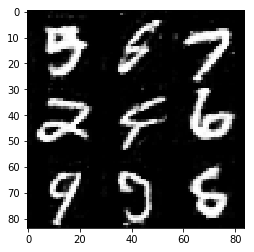

Epoch 12/20... Discriminator Loss: 0.4295... Generator Loss: 1.8442
Epoch 12/20... Discriminator Loss: 0.4881... Generator Loss: 1.4025
Epoch 12/20... Discriminator Loss: 0.7176... Generator Loss: 0.9892
Epoch 12/20... Discriminator Loss: 1.1214... Generator Loss: 3.4369
Epoch 12/20... Discriminator Loss: 0.7655... Generator Loss: 2.0701
Epoch 12/20... Discriminator Loss: 0.5212... Generator Loss: 1.5235
Epoch 12/20... Discriminator Loss: 0.7358... Generator Loss: 1.1083
Epoch 12/20... Discriminator Loss: 0.5718... Generator Loss: 1.1517
Epoch 12/20... Discriminator Loss: 0.9558... Generator Loss: 0.6780
Epoch 12/20... Discriminator Loss: 0.8710... Generator Loss: 0.7992


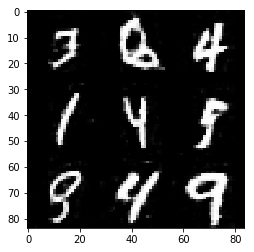

Epoch 12/20... Discriminator Loss: 0.4562... Generator Loss: 1.5324
Epoch 13/20... Discriminator Loss: 0.4551... Generator Loss: 1.4750
Epoch 13/20... Discriminator Loss: 0.6057... Generator Loss: 1.1182
Epoch 13/20... Discriminator Loss: 0.4227... Generator Loss: 1.6889
Epoch 13/20... Discriminator Loss: 0.5721... Generator Loss: 1.2329
Epoch 13/20... Discriminator Loss: 2.9725... Generator Loss: 4.8462
Epoch 13/20... Discriminator Loss: 0.6124... Generator Loss: 2.1012
Epoch 13/20... Discriminator Loss: 0.5761... Generator Loss: 1.4067
Epoch 13/20... Discriminator Loss: 0.5849... Generator Loss: 1.9387
Epoch 13/20... Discriminator Loss: 0.9721... Generator Loss: 3.0518


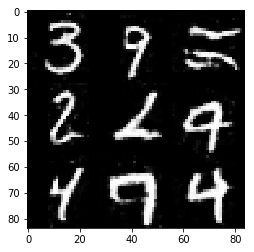

Epoch 13/20... Discriminator Loss: 0.4268... Generator Loss: 2.0900
Epoch 13/20... Discriminator Loss: 0.7656... Generator Loss: 1.0058
Epoch 13/20... Discriminator Loss: 1.7510... Generator Loss: 0.3265
Epoch 13/20... Discriminator Loss: 0.5935... Generator Loss: 1.2262
Epoch 13/20... Discriminator Loss: 1.0055... Generator Loss: 0.6549
Epoch 13/20... Discriminator Loss: 0.5807... Generator Loss: 1.2119
Epoch 13/20... Discriminator Loss: 0.5630... Generator Loss: 1.1613
Epoch 13/20... Discriminator Loss: 0.7308... Generator Loss: 0.9314
Epoch 13/20... Discriminator Loss: 0.3273... Generator Loss: 2.0785
Epoch 13/20... Discriminator Loss: 0.7512... Generator Loss: 0.9081


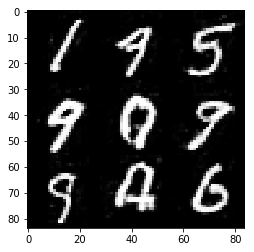

Epoch 13/20... Discriminator Loss: 1.3802... Generator Loss: 0.4352
Epoch 13/20... Discriminator Loss: 0.5114... Generator Loss: 1.3426
Epoch 13/20... Discriminator Loss: 0.8230... Generator Loss: 0.9979
Epoch 13/20... Discriminator Loss: 0.4509... Generator Loss: 1.9611
Epoch 13/20... Discriminator Loss: 0.7183... Generator Loss: 2.8516
Epoch 13/20... Discriminator Loss: 0.5166... Generator Loss: 1.3126
Epoch 13/20... Discriminator Loss: 0.6300... Generator Loss: 1.0256
Epoch 13/20... Discriminator Loss: 5.8324... Generator Loss: 0.0094
Epoch 13/20... Discriminator Loss: 0.5902... Generator Loss: 1.2166
Epoch 13/20... Discriminator Loss: 0.4964... Generator Loss: 1.3685


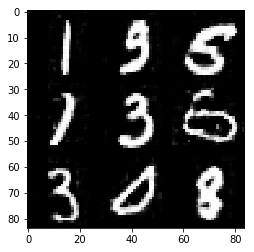

Epoch 13/20... Discriminator Loss: 0.5257... Generator Loss: 1.5226
Epoch 13/20... Discriminator Loss: 0.4940... Generator Loss: 1.3387
Epoch 13/20... Discriminator Loss: 0.4815... Generator Loss: 1.4223
Epoch 13/20... Discriminator Loss: 0.6099... Generator Loss: 1.1344
Epoch 13/20... Discriminator Loss: 0.5030... Generator Loss: 1.6467
Epoch 13/20... Discriminator Loss: 0.6125... Generator Loss: 1.0846
Epoch 13/20... Discriminator Loss: 0.4353... Generator Loss: 1.4173
Epoch 13/20... Discriminator Loss: 0.5084... Generator Loss: 1.2285
Epoch 13/20... Discriminator Loss: 0.4397... Generator Loss: 1.5494
Epoch 13/20... Discriminator Loss: 0.4339... Generator Loss: 1.4586


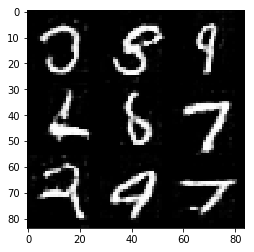

Epoch 13/20... Discriminator Loss: 0.4499... Generator Loss: 1.4346
Epoch 13/20... Discriminator Loss: 0.3825... Generator Loss: 1.7288
Epoch 13/20... Discriminator Loss: 0.4023... Generator Loss: 1.5651
Epoch 13/20... Discriminator Loss: 0.3878... Generator Loss: 1.5443
Epoch 13/20... Discriminator Loss: 0.7044... Generator Loss: 0.8955
Epoch 13/20... Discriminator Loss: 0.4301... Generator Loss: 1.4887
Epoch 13/20... Discriminator Loss: 0.7315... Generator Loss: 0.9105
Epoch 13/20... Discriminator Loss: 0.6025... Generator Loss: 1.0971
Epoch 14/20... Discriminator Loss: 0.3668... Generator Loss: 1.8564
Epoch 14/20... Discriminator Loss: 0.6118... Generator Loss: 1.0562


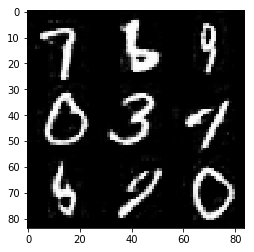

Epoch 14/20... Discriminator Loss: 0.6606... Generator Loss: 1.0604
Epoch 14/20... Discriminator Loss: 1.1411... Generator Loss: 0.7372
Epoch 14/20... Discriminator Loss: 0.7891... Generator Loss: 1.1342
Epoch 14/20... Discriminator Loss: 1.1654... Generator Loss: 0.5626
Epoch 14/20... Discriminator Loss: 0.4012... Generator Loss: 1.8137
Epoch 14/20... Discriminator Loss: 0.4740... Generator Loss: 1.3477
Epoch 14/20... Discriminator Loss: 0.9090... Generator Loss: 0.7422
Epoch 14/20... Discriminator Loss: 0.4874... Generator Loss: 1.2957
Epoch 14/20... Discriminator Loss: 0.6675... Generator Loss: 1.0376
Epoch 14/20... Discriminator Loss: 1.1334... Generator Loss: 0.6196


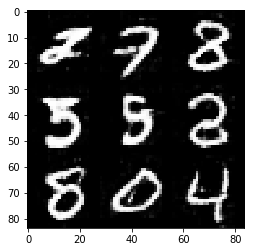

Epoch 14/20... Discriminator Loss: 0.6004... Generator Loss: 1.3701
Epoch 14/20... Discriminator Loss: 0.5131... Generator Loss: 1.3614
Epoch 14/20... Discriminator Loss: 0.6491... Generator Loss: 1.6855
Epoch 14/20... Discriminator Loss: 0.5056... Generator Loss: 2.8655
Epoch 14/20... Discriminator Loss: 0.4085... Generator Loss: 1.7477
Epoch 14/20... Discriminator Loss: 1.8657... Generator Loss: 3.8128
Epoch 14/20... Discriminator Loss: 0.6174... Generator Loss: 1.4287
Epoch 14/20... Discriminator Loss: 0.6145... Generator Loss: 1.3282
Epoch 14/20... Discriminator Loss: 0.6558... Generator Loss: 1.7381
Epoch 14/20... Discriminator Loss: 0.5453... Generator Loss: 1.3707


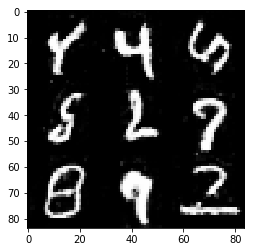

Epoch 14/20... Discriminator Loss: 0.3751... Generator Loss: 1.7173
Epoch 14/20... Discriminator Loss: 0.5595... Generator Loss: 1.1809
Epoch 14/20... Discriminator Loss: 0.5098... Generator Loss: 1.3372
Epoch 14/20... Discriminator Loss: 0.6409... Generator Loss: 1.0464
Epoch 14/20... Discriminator Loss: 0.5990... Generator Loss: 1.2243
Epoch 14/20... Discriminator Loss: 0.4959... Generator Loss: 1.3904
Epoch 14/20... Discriminator Loss: 0.4824... Generator Loss: 1.3297
Epoch 14/20... Discriminator Loss: 0.5937... Generator Loss: 1.1348
Epoch 14/20... Discriminator Loss: 0.3988... Generator Loss: 1.5144
Epoch 14/20... Discriminator Loss: 0.6867... Generator Loss: 1.0831


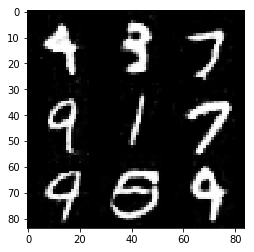

Epoch 14/20... Discriminator Loss: 1.6189... Generator Loss: 0.3271
Epoch 14/20... Discriminator Loss: 0.6973... Generator Loss: 3.4736
Epoch 14/20... Discriminator Loss: 0.3437... Generator Loss: 1.8845
Epoch 14/20... Discriminator Loss: 0.7265... Generator Loss: 0.9344
Epoch 14/20... Discriminator Loss: 0.4028... Generator Loss: 1.6538
Epoch 14/20... Discriminator Loss: 0.9188... Generator Loss: 0.7468
Epoch 14/20... Discriminator Loss: 0.5265... Generator Loss: 1.2998
Epoch 14/20... Discriminator Loss: 0.5207... Generator Loss: 1.2599
Epoch 14/20... Discriminator Loss: 0.9404... Generator Loss: 0.7225
Epoch 14/20... Discriminator Loss: 0.5932... Generator Loss: 1.1995


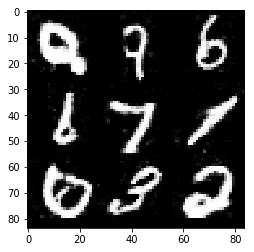

Epoch 14/20... Discriminator Loss: 1.2833... Generator Loss: 0.4582
Epoch 14/20... Discriminator Loss: 0.3774... Generator Loss: 1.8372
Epoch 14/20... Discriminator Loss: 0.3599... Generator Loss: 1.7656
Epoch 14/20... Discriminator Loss: 0.5428... Generator Loss: 1.2903
Epoch 14/20... Discriminator Loss: 0.3052... Generator Loss: 1.7140
Epoch 15/20... Discriminator Loss: 0.6230... Generator Loss: 1.0892
Epoch 15/20... Discriminator Loss: 1.1616... Generator Loss: 3.9442
Epoch 15/20... Discriminator Loss: 0.4247... Generator Loss: 2.1749
Epoch 15/20... Discriminator Loss: 0.6526... Generator Loss: 1.0816
Epoch 15/20... Discriminator Loss: 0.8177... Generator Loss: 0.8198


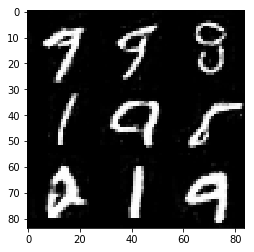

Epoch 15/20... Discriminator Loss: 0.5585... Generator Loss: 1.2299
Epoch 15/20... Discriminator Loss: 0.5797... Generator Loss: 1.2309
Epoch 15/20... Discriminator Loss: 0.6573... Generator Loss: 1.4678
Epoch 15/20... Discriminator Loss: 1.7980... Generator Loss: 0.3468
Epoch 15/20... Discriminator Loss: 0.6179... Generator Loss: 1.5288
Epoch 15/20... Discriminator Loss: 0.4890... Generator Loss: 1.5218
Epoch 15/20... Discriminator Loss: 0.6005... Generator Loss: 1.1687
Epoch 15/20... Discriminator Loss: 0.7157... Generator Loss: 1.0359
Epoch 15/20... Discriminator Loss: 0.6630... Generator Loss: 2.6024
Epoch 15/20... Discriminator Loss: 0.4579... Generator Loss: 1.7139


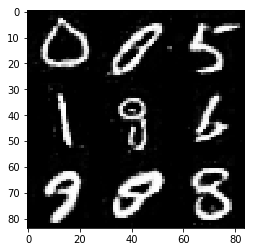

Epoch 15/20... Discriminator Loss: 0.6192... Generator Loss: 1.1282
Epoch 15/20... Discriminator Loss: 0.5834... Generator Loss: 1.1098
Epoch 15/20... Discriminator Loss: 0.4461... Generator Loss: 1.4829
Epoch 15/20... Discriminator Loss: 0.3901... Generator Loss: 1.6716
Epoch 15/20... Discriminator Loss: 0.5314... Generator Loss: 1.3631
Epoch 15/20... Discriminator Loss: 0.3548... Generator Loss: 2.0031
Epoch 15/20... Discriminator Loss: 0.5417... Generator Loss: 1.2583
Epoch 15/20... Discriminator Loss: 0.7504... Generator Loss: 2.4619
Epoch 15/20... Discriminator Loss: 0.6017... Generator Loss: 1.2902
Epoch 15/20... Discriminator Loss: 0.5003... Generator Loss: 2.2601


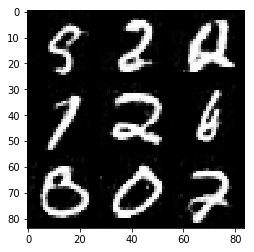

Epoch 15/20... Discriminator Loss: 0.7742... Generator Loss: 0.8877
Epoch 15/20... Discriminator Loss: 0.6637... Generator Loss: 1.0407
Epoch 15/20... Discriminator Loss: 0.5736... Generator Loss: 1.8540
Epoch 15/20... Discriminator Loss: 0.5490... Generator Loss: 1.9085
Epoch 15/20... Discriminator Loss: 0.7980... Generator Loss: 0.9930
Epoch 15/20... Discriminator Loss: 0.6615... Generator Loss: 0.9618
Epoch 15/20... Discriminator Loss: 0.7140... Generator Loss: 0.9500
Epoch 15/20... Discriminator Loss: 0.4968... Generator Loss: 1.4142
Epoch 15/20... Discriminator Loss: 0.5153... Generator Loss: 1.2809
Epoch 15/20... Discriminator Loss: 0.4164... Generator Loss: 1.6885


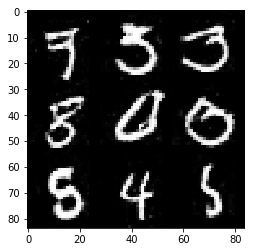

Epoch 15/20... Discriminator Loss: 0.5285... Generator Loss: 1.4024
Epoch 15/20... Discriminator Loss: 0.4576... Generator Loss: 1.3484
Epoch 15/20... Discriminator Loss: 0.5778... Generator Loss: 1.2052
Epoch 15/20... Discriminator Loss: 0.8012... Generator Loss: 0.8452
Epoch 15/20... Discriminator Loss: 0.6486... Generator Loss: 1.0115
Epoch 15/20... Discriminator Loss: 0.3113... Generator Loss: 1.8286
Epoch 15/20... Discriminator Loss: 0.4118... Generator Loss: 1.5199
Epoch 15/20... Discriminator Loss: 0.3179... Generator Loss: 1.9430
Epoch 15/20... Discriminator Loss: 0.6486... Generator Loss: 0.9943
Epoch 15/20... Discriminator Loss: 0.7486... Generator Loss: 1.0492


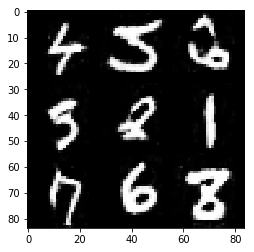

Epoch 15/20... Discriminator Loss: 0.5634... Generator Loss: 1.1555
Epoch 15/20... Discriminator Loss: 1.1497... Generator Loss: 0.5488
Epoch 16/20... Discriminator Loss: 0.9128... Generator Loss: 0.8226
Epoch 16/20... Discriminator Loss: 0.4967... Generator Loss: 2.0263
Epoch 16/20... Discriminator Loss: 0.4551... Generator Loss: 1.5174
Epoch 16/20... Discriminator Loss: 1.5313... Generator Loss: 3.9617
Epoch 16/20... Discriminator Loss: 0.9340... Generator Loss: 0.9305
Epoch 16/20... Discriminator Loss: 0.6691... Generator Loss: 1.5140
Epoch 16/20... Discriminator Loss: 0.5586... Generator Loss: 1.9942
Epoch 16/20... Discriminator Loss: 0.6470... Generator Loss: 1.2461


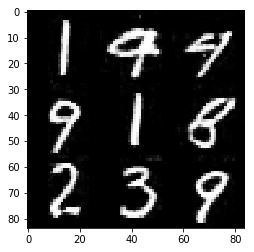

Epoch 16/20... Discriminator Loss: 0.5616... Generator Loss: 1.2234
Epoch 16/20... Discriminator Loss: 0.6828... Generator Loss: 1.0006
Epoch 16/20... Discriminator Loss: 0.7228... Generator Loss: 0.9744
Epoch 16/20... Discriminator Loss: 0.4711... Generator Loss: 1.8571
Epoch 16/20... Discriminator Loss: 0.6342... Generator Loss: 1.2340
Epoch 16/20... Discriminator Loss: 1.5213... Generator Loss: 0.4802
Epoch 16/20... Discriminator Loss: 0.6915... Generator Loss: 1.5457
Epoch 16/20... Discriminator Loss: 0.5043... Generator Loss: 1.8182
Epoch 16/20... Discriminator Loss: 0.5264... Generator Loss: 1.4550
Epoch 16/20... Discriminator Loss: 0.7504... Generator Loss: 0.9361


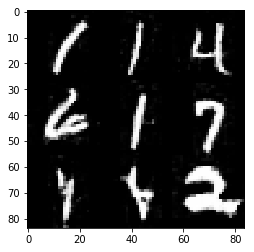

Epoch 16/20... Discriminator Loss: 0.7376... Generator Loss: 0.9126
Epoch 16/20... Discriminator Loss: 0.5051... Generator Loss: 1.5491
Epoch 16/20... Discriminator Loss: 0.3638... Generator Loss: 2.3742
Epoch 16/20... Discriminator Loss: 0.6480... Generator Loss: 1.0599
Epoch 16/20... Discriminator Loss: 0.6135... Generator Loss: 1.1654
Epoch 16/20... Discriminator Loss: 0.3105... Generator Loss: 1.8733
Epoch 16/20... Discriminator Loss: 0.5319... Generator Loss: 1.2344
Epoch 16/20... Discriminator Loss: 0.4178... Generator Loss: 1.9967
Epoch 16/20... Discriminator Loss: 0.7692... Generator Loss: 0.9233
Epoch 16/20... Discriminator Loss: 0.4031... Generator Loss: 1.5892


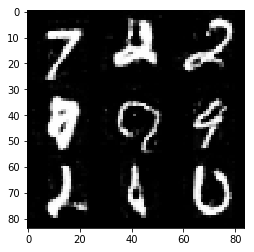

Epoch 16/20... Discriminator Loss: 1.0117... Generator Loss: 0.6439
Epoch 16/20... Discriminator Loss: 1.4562... Generator Loss: 3.8955
Epoch 16/20... Discriminator Loss: 0.4734... Generator Loss: 1.4647
Epoch 16/20... Discriminator Loss: 0.7907... Generator Loss: 0.9154
Epoch 16/20... Discriminator Loss: 0.5451... Generator Loss: 2.4816
Epoch 16/20... Discriminator Loss: 0.5542... Generator Loss: 1.2141
Epoch 16/20... Discriminator Loss: 0.4146... Generator Loss: 1.6229
Epoch 16/20... Discriminator Loss: 0.4021... Generator Loss: 1.5681
Epoch 16/20... Discriminator Loss: 0.6047... Generator Loss: 1.0619
Epoch 16/20... Discriminator Loss: 0.4404... Generator Loss: 1.7440


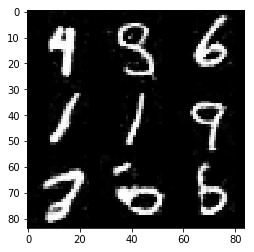

Epoch 16/20... Discriminator Loss: 0.6004... Generator Loss: 1.0487
Epoch 16/20... Discriminator Loss: 0.4403... Generator Loss: 1.3879
Epoch 16/20... Discriminator Loss: 0.6341... Generator Loss: 1.0976
Epoch 16/20... Discriminator Loss: 0.5324... Generator Loss: 1.2122
Epoch 16/20... Discriminator Loss: 0.3977... Generator Loss: 1.6002
Epoch 16/20... Discriminator Loss: 0.6141... Generator Loss: 1.1886
Epoch 16/20... Discriminator Loss: 0.7634... Generator Loss: 0.9254
Epoch 16/20... Discriminator Loss: 3.4304... Generator Loss: 5.8835
Epoch 17/20... Discriminator Loss: 0.6476... Generator Loss: 1.1136
Epoch 17/20... Discriminator Loss: 0.6237... Generator Loss: 1.1611


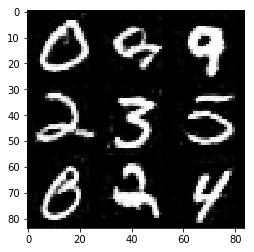

Epoch 17/20... Discriminator Loss: 0.4191... Generator Loss: 1.7451
Epoch 17/20... Discriminator Loss: 0.5036... Generator Loss: 1.3452
Epoch 17/20... Discriminator Loss: 0.7045... Generator Loss: 1.0928
Epoch 17/20... Discriminator Loss: 0.6290... Generator Loss: 1.1066
Epoch 17/20... Discriminator Loss: 0.5103... Generator Loss: 1.5418
Epoch 17/20... Discriminator Loss: 1.1445... Generator Loss: 2.9681
Epoch 17/20... Discriminator Loss: 0.6738... Generator Loss: 1.2669
Epoch 17/20... Discriminator Loss: 0.4061... Generator Loss: 2.1186
Epoch 17/20... Discriminator Loss: 0.5268... Generator Loss: 1.8543
Epoch 17/20... Discriminator Loss: 0.6024... Generator Loss: 1.1634


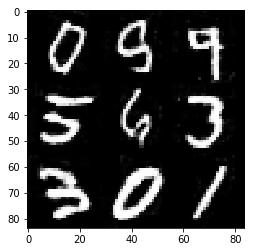

Epoch 17/20... Discriminator Loss: 0.4965... Generator Loss: 1.5568
Epoch 17/20... Discriminator Loss: 0.8205... Generator Loss: 0.8288
Epoch 17/20... Discriminator Loss: 0.6488... Generator Loss: 1.0578
Epoch 17/20... Discriminator Loss: 0.5266... Generator Loss: 1.2473
Epoch 17/20... Discriminator Loss: 0.5334... Generator Loss: 1.2008
Epoch 17/20... Discriminator Loss: 0.3999... Generator Loss: 1.5897
Epoch 17/20... Discriminator Loss: 0.3821... Generator Loss: 1.7699
Epoch 17/20... Discriminator Loss: 0.6662... Generator Loss: 1.0349
Epoch 17/20... Discriminator Loss: 0.7573... Generator Loss: 0.8846
Epoch 17/20... Discriminator Loss: 0.5421... Generator Loss: 1.2258


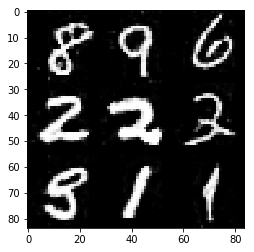

Epoch 17/20... Discriminator Loss: 0.2977... Generator Loss: 2.6195
Epoch 17/20... Discriminator Loss: 2.4060... Generator Loss: 0.2847
Epoch 17/20... Discriminator Loss: 0.5281... Generator Loss: 2.2439
Epoch 17/20... Discriminator Loss: 0.3810... Generator Loss: 1.6643
Epoch 17/20... Discriminator Loss: 0.4248... Generator Loss: 1.8588
Epoch 17/20... Discriminator Loss: 0.4009... Generator Loss: 1.6819
Epoch 17/20... Discriminator Loss: 0.5226... Generator Loss: 1.4006
Epoch 17/20... Discriminator Loss: 0.4997... Generator Loss: 1.3818
Epoch 17/20... Discriminator Loss: 0.7934... Generator Loss: 1.1551
Epoch 17/20... Discriminator Loss: 0.9704... Generator Loss: 0.7055


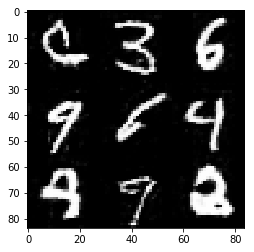

Epoch 17/20... Discriminator Loss: 0.5920... Generator Loss: 1.1318
Epoch 17/20... Discriminator Loss: 0.7241... Generator Loss: 0.8989
Epoch 17/20... Discriminator Loss: 0.4211... Generator Loss: 1.6717
Epoch 17/20... Discriminator Loss: 0.6626... Generator Loss: 1.1063
Epoch 17/20... Discriminator Loss: 0.5546... Generator Loss: 1.1927
Epoch 17/20... Discriminator Loss: 0.4632... Generator Loss: 1.7005
Epoch 17/20... Discriminator Loss: 0.6369... Generator Loss: 1.0525
Epoch 17/20... Discriminator Loss: 0.4966... Generator Loss: 1.2799
Epoch 17/20... Discriminator Loss: 0.5286... Generator Loss: 1.2091
Epoch 17/20... Discriminator Loss: 0.3988... Generator Loss: 1.6274


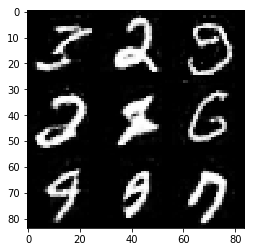

Epoch 17/20... Discriminator Loss: 1.1384... Generator Loss: 0.5546
Epoch 17/20... Discriminator Loss: 2.1230... Generator Loss: 0.3960
Epoch 17/20... Discriminator Loss: 0.8868... Generator Loss: 0.8346
Epoch 17/20... Discriminator Loss: 0.5716... Generator Loss: 1.3353
Epoch 17/20... Discriminator Loss: 0.6070... Generator Loss: 1.0636
Epoch 18/20... Discriminator Loss: 0.7158... Generator Loss: 1.3188
Epoch 18/20... Discriminator Loss: 0.8202... Generator Loss: 0.8142
Epoch 18/20... Discriminator Loss: 0.4655... Generator Loss: 1.6568
Epoch 18/20... Discriminator Loss: 0.4108... Generator Loss: 1.6547
Epoch 18/20... Discriminator Loss: 0.4011... Generator Loss: 1.5626


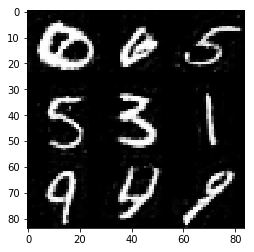

Epoch 18/20... Discriminator Loss: 0.5655... Generator Loss: 1.3073
Epoch 18/20... Discriminator Loss: 1.1144... Generator Loss: 0.6003
Epoch 18/20... Discriminator Loss: 0.7434... Generator Loss: 3.0872
Epoch 18/20... Discriminator Loss: 0.5318... Generator Loss: 1.3904
Epoch 18/20... Discriminator Loss: 0.8171... Generator Loss: 0.8190
Epoch 18/20... Discriminator Loss: 0.9700... Generator Loss: 0.6913
Epoch 18/20... Discriminator Loss: 0.3301... Generator Loss: 1.8694
Epoch 18/20... Discriminator Loss: 0.4798... Generator Loss: 1.5369
Epoch 18/20... Discriminator Loss: 0.6315... Generator Loss: 1.0839
Epoch 18/20... Discriminator Loss: 0.6108... Generator Loss: 1.1719


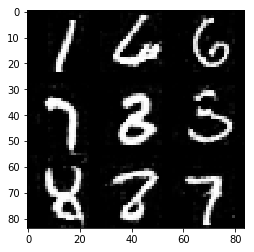

Epoch 18/20... Discriminator Loss: 0.5884... Generator Loss: 1.1498
Epoch 18/20... Discriminator Loss: 0.5329... Generator Loss: 1.1992
Epoch 18/20... Discriminator Loss: 0.5516... Generator Loss: 1.2261
Epoch 18/20... Discriminator Loss: 1.0652... Generator Loss: 0.6195
Epoch 18/20... Discriminator Loss: 0.7385... Generator Loss: 0.9642
Epoch 18/20... Discriminator Loss: 0.4492... Generator Loss: 1.4187
Epoch 18/20... Discriminator Loss: 0.4789... Generator Loss: 2.3140
Epoch 18/20... Discriminator Loss: 0.4161... Generator Loss: 1.9941
Epoch 18/20... Discriminator Loss: 0.4177... Generator Loss: 2.1080
Epoch 18/20... Discriminator Loss: 0.8522... Generator Loss: 0.8485


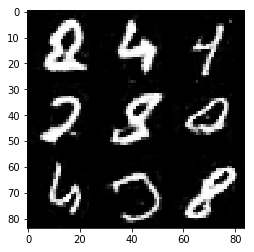

Epoch 18/20... Discriminator Loss: 0.3948... Generator Loss: 1.9069
Epoch 18/20... Discriminator Loss: 0.5138... Generator Loss: 1.2519
Epoch 18/20... Discriminator Loss: 1.1202... Generator Loss: 0.7307
Epoch 18/20... Discriminator Loss: 0.5960... Generator Loss: 1.1877
Epoch 18/20... Discriminator Loss: 0.6149... Generator Loss: 1.1272
Epoch 18/20... Discriminator Loss: 0.3702... Generator Loss: 1.7903
Epoch 18/20... Discriminator Loss: 0.5387... Generator Loss: 1.2907
Epoch 18/20... Discriminator Loss: 0.7717... Generator Loss: 0.8762
Epoch 18/20... Discriminator Loss: 0.4718... Generator Loss: 1.3602
Epoch 18/20... Discriminator Loss: 1.3175... Generator Loss: 0.5326


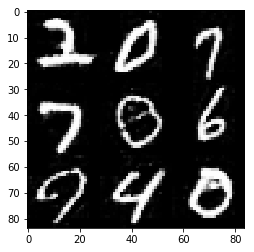

Epoch 18/20... Discriminator Loss: 0.6531... Generator Loss: 1.6678
Epoch 18/20... Discriminator Loss: 0.6916... Generator Loss: 1.1649
Epoch 18/20... Discriminator Loss: 0.5355... Generator Loss: 1.3894
Epoch 18/20... Discriminator Loss: 0.8675... Generator Loss: 0.8958
Epoch 18/20... Discriminator Loss: 0.4578... Generator Loss: 2.3925
Epoch 18/20... Discriminator Loss: 0.5685... Generator Loss: 1.3420
Epoch 18/20... Discriminator Loss: 0.5360... Generator Loss: 1.3247
Epoch 18/20... Discriminator Loss: 0.3767... Generator Loss: 1.8262
Epoch 18/20... Discriminator Loss: 2.5473... Generator Loss: 5.1790
Epoch 18/20... Discriminator Loss: 0.6252... Generator Loss: 1.1236


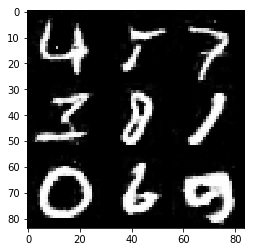

Epoch 18/20... Discriminator Loss: 0.4691... Generator Loss: 1.8821
Epoch 18/20... Discriminator Loss: 1.2364... Generator Loss: 0.5417
Epoch 19/20... Discriminator Loss: 0.5921... Generator Loss: 1.2329
Epoch 19/20... Discriminator Loss: 0.4014... Generator Loss: 1.8098
Epoch 19/20... Discriminator Loss: 0.5246... Generator Loss: 1.2584
Epoch 19/20... Discriminator Loss: 0.5540... Generator Loss: 1.2641
Epoch 19/20... Discriminator Loss: 0.5249... Generator Loss: 1.2125
Epoch 19/20... Discriminator Loss: 1.0432... Generator Loss: 0.6770
Epoch 19/20... Discriminator Loss: 0.7652... Generator Loss: 0.9187
Epoch 19/20... Discriminator Loss: 0.5852... Generator Loss: 1.1725


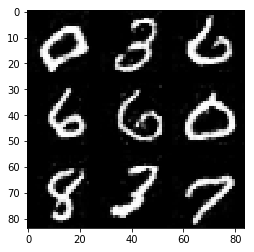

Epoch 19/20... Discriminator Loss: 0.9138... Generator Loss: 0.7024
Epoch 19/20... Discriminator Loss: 0.3399... Generator Loss: 1.7640
Epoch 19/20... Discriminator Loss: 0.4667... Generator Loss: 1.7952
Epoch 19/20... Discriminator Loss: 0.5215... Generator Loss: 2.3121
Epoch 19/20... Discriminator Loss: 0.6305... Generator Loss: 1.1163
Epoch 19/20... Discriminator Loss: 0.6390... Generator Loss: 1.0838
Epoch 19/20... Discriminator Loss: 0.6069... Generator Loss: 1.1799
Epoch 19/20... Discriminator Loss: 0.4642... Generator Loss: 1.3503
Epoch 19/20... Discriminator Loss: 0.3955... Generator Loss: 1.7282
Epoch 19/20... Discriminator Loss: 0.8442... Generator Loss: 0.7852


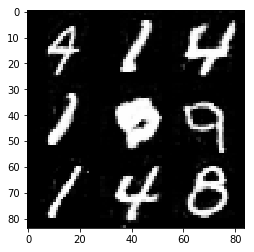

Epoch 19/20... Discriminator Loss: 0.4812... Generator Loss: 1.4386
Epoch 19/20... Discriminator Loss: 1.5987... Generator Loss: 0.3722
Epoch 19/20... Discriminator Loss: 2.6675... Generator Loss: 0.3513
Epoch 19/20... Discriminator Loss: 0.5768... Generator Loss: 1.2471
Epoch 19/20... Discriminator Loss: 0.4338... Generator Loss: 1.7224
Epoch 19/20... Discriminator Loss: 0.4871... Generator Loss: 1.4148
Epoch 19/20... Discriminator Loss: 1.3766... Generator Loss: 0.4666
Epoch 19/20... Discriminator Loss: 0.6433... Generator Loss: 1.0678
Epoch 19/20... Discriminator Loss: 0.7914... Generator Loss: 0.9143
Epoch 19/20... Discriminator Loss: 0.4304... Generator Loss: 1.4606


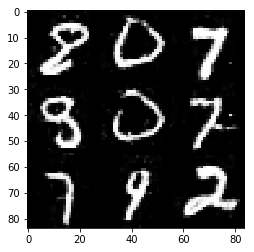

Epoch 19/20... Discriminator Loss: 0.5854... Generator Loss: 1.1275
Epoch 19/20... Discriminator Loss: 0.5556... Generator Loss: 1.2116
Epoch 19/20... Discriminator Loss: 1.3652... Generator Loss: 0.5577
Epoch 19/20... Discriminator Loss: 0.7736... Generator Loss: 0.9532
Epoch 19/20... Discriminator Loss: 0.6253... Generator Loss: 1.2021
Epoch 19/20... Discriminator Loss: 0.8022... Generator Loss: 0.9445
Epoch 19/20... Discriminator Loss: 0.3863... Generator Loss: 1.6331
Epoch 19/20... Discriminator Loss: 0.7747... Generator Loss: 0.8918
Epoch 19/20... Discriminator Loss: 0.7044... Generator Loss: 0.9619
Epoch 19/20... Discriminator Loss: 0.4986... Generator Loss: 1.4986


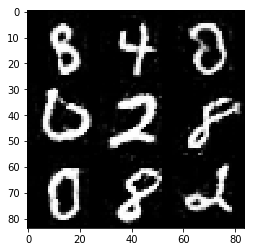

Epoch 19/20... Discriminator Loss: 0.4755... Generator Loss: 2.5720
Epoch 19/20... Discriminator Loss: 0.3750... Generator Loss: 1.6986
Epoch 19/20... Discriminator Loss: 0.6615... Generator Loss: 0.9933
Epoch 19/20... Discriminator Loss: 0.8495... Generator Loss: 1.0503
Epoch 19/20... Discriminator Loss: 1.6021... Generator Loss: 0.3944
Epoch 19/20... Discriminator Loss: 0.4862... Generator Loss: 1.3458
Epoch 19/20... Discriminator Loss: 0.5134... Generator Loss: 2.3761
Epoch 19/20... Discriminator Loss: 0.7683... Generator Loss: 1.0100
Epoch 19/20... Discriminator Loss: 0.4620... Generator Loss: 1.4071
Epoch 20/20... Discriminator Loss: 0.5373... Generator Loss: 1.2350


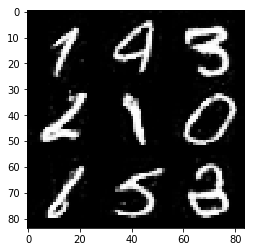

Epoch 20/20... Discriminator Loss: 0.7231... Generator Loss: 0.9722
Epoch 20/20... Discriminator Loss: 0.4543... Generator Loss: 1.2925
Epoch 20/20... Discriminator Loss: 0.5251... Generator Loss: 1.3755
Epoch 20/20... Discriminator Loss: 0.7399... Generator Loss: 0.9302
Epoch 20/20... Discriminator Loss: 0.5103... Generator Loss: 1.3439
Epoch 20/20... Discriminator Loss: 0.4560... Generator Loss: 2.2658
Epoch 20/20... Discriminator Loss: 0.3716... Generator Loss: 2.0978
Epoch 20/20... Discriminator Loss: 1.3007... Generator Loss: 0.6615
Epoch 20/20... Discriminator Loss: 3.8639... Generator Loss: 7.5698
Epoch 20/20... Discriminator Loss: 0.4597... Generator Loss: 2.4277


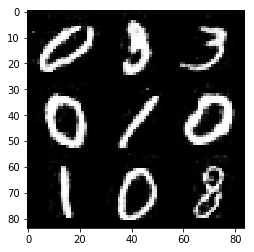

Epoch 20/20... Discriminator Loss: 0.4811... Generator Loss: 2.0704
Epoch 20/20... Discriminator Loss: 0.7682... Generator Loss: 0.9174
Epoch 20/20... Discriminator Loss: 0.5912... Generator Loss: 1.1745
Epoch 20/20... Discriminator Loss: 0.6034... Generator Loss: 1.2422
Epoch 20/20... Discriminator Loss: 0.5619... Generator Loss: 1.3273
Epoch 20/20... Discriminator Loss: 0.5589... Generator Loss: 2.0447
Epoch 20/20... Discriminator Loss: 0.3002... Generator Loss: 2.0178
Epoch 20/20... Discriminator Loss: 0.4876... Generator Loss: 1.2545
Epoch 20/20... Discriminator Loss: 0.7979... Generator Loss: 0.8549
Epoch 20/20... Discriminator Loss: 0.5229... Generator Loss: 1.2354


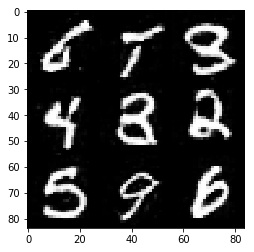

Epoch 20/20... Discriminator Loss: 1.0665... Generator Loss: 0.5643
Epoch 20/20... Discriminator Loss: 0.6401... Generator Loss: 1.0338
Epoch 20/20... Discriminator Loss: 0.5173... Generator Loss: 1.2373
Epoch 20/20... Discriminator Loss: 0.4037... Generator Loss: 1.6434
Epoch 20/20... Discriminator Loss: 0.4814... Generator Loss: 1.3360
Epoch 20/20... Discriminator Loss: 0.9632... Generator Loss: 0.8994
Epoch 20/20... Discriminator Loss: 0.6887... Generator Loss: 1.1605
Epoch 20/20... Discriminator Loss: 0.6460... Generator Loss: 1.1744
Epoch 20/20... Discriminator Loss: 0.6959... Generator Loss: 1.1575
Epoch 20/20... Discriminator Loss: 0.5001... Generator Loss: 1.2897


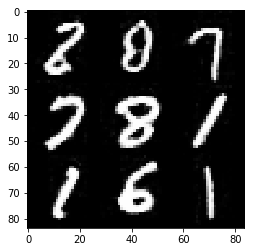

Epoch 20/20... Discriminator Loss: 0.4676... Generator Loss: 1.4480
Epoch 20/20... Discriminator Loss: 0.6291... Generator Loss: 1.0624
Epoch 20/20... Discriminator Loss: 0.4047... Generator Loss: 1.7557
Epoch 20/20... Discriminator Loss: 0.5019... Generator Loss: 1.3116
Epoch 20/20... Discriminator Loss: 0.5384... Generator Loss: 1.2567
Epoch 20/20... Discriminator Loss: 0.4801... Generator Loss: 1.3350
Epoch 20/20... Discriminator Loss: 0.3591... Generator Loss: 2.0212
Epoch 20/20... Discriminator Loss: 0.8317... Generator Loss: 0.7629
Epoch 20/20... Discriminator Loss: 0.4936... Generator Loss: 1.2924
Epoch 20/20... Discriminator Loss: 0.4007... Generator Loss: 1.5969


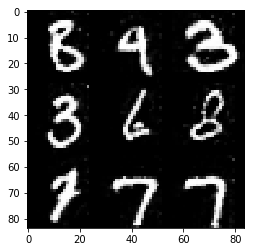

Epoch 20/20... Discriminator Loss: 0.3748... Generator Loss: 1.7223
Epoch 20/20... Discriminator Loss: 3.2084... Generator Loss: 5.9022
Epoch 20/20... Discriminator Loss: 0.6064... Generator Loss: 2.9375
Epoch 20/20... Discriminator Loss: 0.5990... Generator Loss: 1.4228
Epoch 20/20... Discriminator Loss: 0.7379... Generator Loss: 1.9471
Epoch 20/20... Discriminator Loss: 0.4778... Generator Loss: 2.1460


In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 20

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

tf.reset_default_graph()

with tf.Graph().as_default():
    d_loss, g_loss = train(epochs, batch_size, z_dim, learning_rate, beta1,
                           mnist_dataset.get_batches, mnist_dataset.shape,
                           mnist_dataset.image_mode)

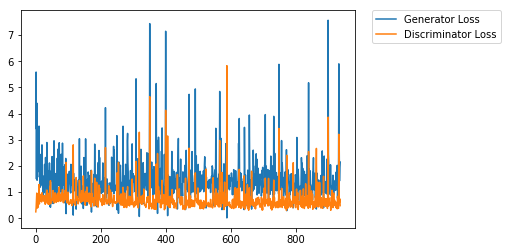

In [ ]:
pyplot.plot(g_loss, label='Generator Loss');
pyplot.plot(d_loss, label='Discriminator Loss');
pyplot.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
pyplot.show()

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/20... Discriminator Loss: 0.3511... Generator Loss: 1.8295
Epoch 1/20... Discriminator Loss: 0.1912... Generator Loss: 2.7693
Epoch 1/20... Discriminator Loss: 0.1308... Generator Loss: 8.2363
Epoch 1/20... Discriminator Loss: 0.7034... Generator Loss: 8.5314
Epoch 1/20... Discriminator Loss: 0.5494... Generator Loss: 3.3404
Epoch 1/20... Discriminator Loss: 0.8061... Generator Loss: 2.2833
Epoch 1/20... Discriminator Loss: 0.5652... Generator Loss: 1.3674
Epoch 1/20... Discriminator Loss: 1.2603... Generator Loss: 0.5063
Epoch 1/20... Discriminator Loss: 0.6278... Generator Loss: 1.3575
Epoch 1/20... Discriminator Loss: 0.6699... Generator Loss: 1.5416


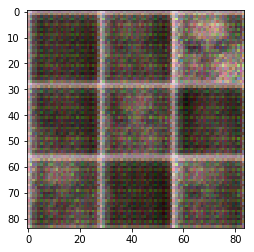

Epoch 1/20... Discriminator Loss: 0.5015... Generator Loss: 1.9378
Epoch 1/20... Discriminator Loss: 0.5148... Generator Loss: 1.5659
Epoch 1/20... Discriminator Loss: 1.5152... Generator Loss: 0.5452
Epoch 1/20... Discriminator Loss: 0.6500... Generator Loss: 1.4091
Epoch 1/20... Discriminator Loss: 0.7982... Generator Loss: 4.3019
Epoch 1/20... Discriminator Loss: 0.9547... Generator Loss: 0.7295
Epoch 1/20... Discriminator Loss: 1.0368... Generator Loss: 0.7289
Epoch 1/20... Discriminator Loss: 0.8322... Generator Loss: 1.0461
Epoch 1/20... Discriminator Loss: 0.6839... Generator Loss: 1.5234
Epoch 1/20... Discriminator Loss: 0.8633... Generator Loss: 1.4921


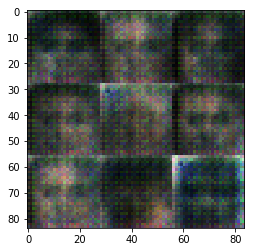

Epoch 1/20... Discriminator Loss: 1.2431... Generator Loss: 2.0251
Epoch 1/20... Discriminator Loss: 0.9480... Generator Loss: 1.9817
Epoch 1/20... Discriminator Loss: 0.5546... Generator Loss: 1.9921
Epoch 1/20... Discriminator Loss: 0.8167... Generator Loss: 3.4681
Epoch 1/20... Discriminator Loss: 0.7347... Generator Loss: 1.4162
Epoch 1/20... Discriminator Loss: 0.8197... Generator Loss: 2.8448
Epoch 1/20... Discriminator Loss: 1.1206... Generator Loss: 0.6603
Epoch 1/20... Discriminator Loss: 0.6949... Generator Loss: 1.3431
Epoch 1/20... Discriminator Loss: 0.6256... Generator Loss: 1.5437
Epoch 1/20... Discriminator Loss: 0.7054... Generator Loss: 1.3406


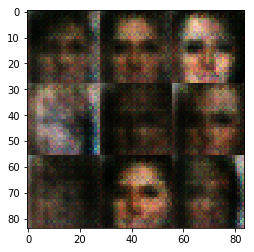

Epoch 1/20... Discriminator Loss: 0.6082... Generator Loss: 2.3779
Epoch 1/20... Discriminator Loss: 0.7493... Generator Loss: 1.9570
Epoch 1/20... Discriminator Loss: 0.7496... Generator Loss: 1.0597
Epoch 1/20... Discriminator Loss: 0.9892... Generator Loss: 1.1806
Epoch 1/20... Discriminator Loss: 1.0264... Generator Loss: 0.7484
Epoch 1/20... Discriminator Loss: 0.9541... Generator Loss: 1.2371
Epoch 1/20... Discriminator Loss: 1.9122... Generator Loss: 0.2487
Epoch 1/20... Discriminator Loss: 0.8824... Generator Loss: 2.2319
Epoch 1/20... Discriminator Loss: 0.6362... Generator Loss: 1.3645
Epoch 1/20... Discriminator Loss: 0.7270... Generator Loss: 2.2007


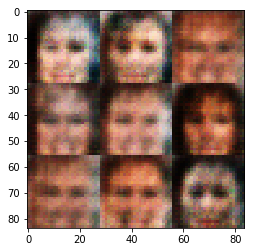

Epoch 1/20... Discriminator Loss: 0.8325... Generator Loss: 0.9895
Epoch 1/20... Discriminator Loss: 0.8293... Generator Loss: 1.1259
Epoch 1/20... Discriminator Loss: 0.8211... Generator Loss: 1.4715
Epoch 1/20... Discriminator Loss: 1.6351... Generator Loss: 3.2037
Epoch 1/20... Discriminator Loss: 0.8389... Generator Loss: 1.4988
Epoch 1/20... Discriminator Loss: 0.7605... Generator Loss: 1.3973
Epoch 1/20... Discriminator Loss: 0.8751... Generator Loss: 1.3649
Epoch 1/20... Discriminator Loss: 0.9852... Generator Loss: 2.0565
Epoch 1/20... Discriminator Loss: 0.9345... Generator Loss: 0.9519
Epoch 1/20... Discriminator Loss: 0.9658... Generator Loss: 1.4525


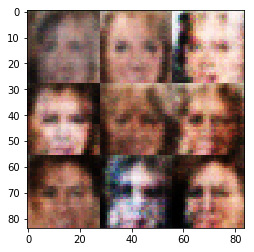

Epoch 1/20... Discriminator Loss: 0.8917... Generator Loss: 1.0739
Epoch 1/20... Discriminator Loss: 0.9696... Generator Loss: 1.4675
Epoch 1/20... Discriminator Loss: 1.1229... Generator Loss: 0.6473
Epoch 1/20... Discriminator Loss: 0.7824... Generator Loss: 1.1018
Epoch 1/20... Discriminator Loss: 0.9586... Generator Loss: 1.0686
Epoch 1/20... Discriminator Loss: 0.8521... Generator Loss: 2.0663
Epoch 1/20... Discriminator Loss: 0.9407... Generator Loss: 1.7618
Epoch 1/20... Discriminator Loss: 0.9173... Generator Loss: 1.0393
Epoch 1/20... Discriminator Loss: 1.1358... Generator Loss: 0.6282
Epoch 1/20... Discriminator Loss: 0.9390... Generator Loss: 1.7093


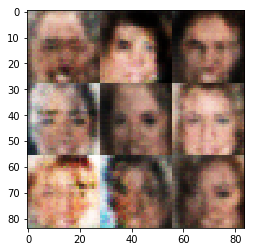

Epoch 1/20... Discriminator Loss: 1.0881... Generator Loss: 1.0043
Epoch 1/20... Discriminator Loss: 1.0412... Generator Loss: 0.6893
Epoch 1/20... Discriminator Loss: 1.1358... Generator Loss: 0.7581
Epoch 1/20... Discriminator Loss: 0.9536... Generator Loss: 0.8763
Epoch 1/20... Discriminator Loss: 1.0087... Generator Loss: 0.8576
Epoch 1/20... Discriminator Loss: 1.3204... Generator Loss: 2.8549
Epoch 1/20... Discriminator Loss: 0.7506... Generator Loss: 1.2839
Epoch 1/20... Discriminator Loss: 0.9805... Generator Loss: 1.4377
Epoch 1/20... Discriminator Loss: 1.2500... Generator Loss: 0.6454
Epoch 1/20... Discriminator Loss: 1.0043... Generator Loss: 0.9810


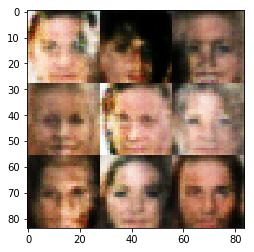

Epoch 1/20... Discriminator Loss: 1.0520... Generator Loss: 0.8837
Epoch 1/20... Discriminator Loss: 0.9965... Generator Loss: 1.3422
Epoch 1/20... Discriminator Loss: 1.0699... Generator Loss: 1.2410
Epoch 1/20... Discriminator Loss: 0.9156... Generator Loss: 1.2546
Epoch 1/20... Discriminator Loss: 0.8983... Generator Loss: 1.1577
Epoch 1/20... Discriminator Loss: 0.8961... Generator Loss: 0.9462
Epoch 1/20... Discriminator Loss: 0.9254... Generator Loss: 1.4824
Epoch 1/20... Discriminator Loss: 1.0564... Generator Loss: 0.9579
Epoch 1/20... Discriminator Loss: 0.9647... Generator Loss: 1.7201
Epoch 1/20... Discriminator Loss: 0.9486... Generator Loss: 1.2267


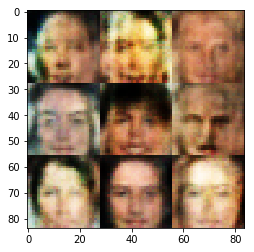

Epoch 1/20... Discriminator Loss: 0.9733... Generator Loss: 1.7626
Epoch 1/20... Discriminator Loss: 0.9228... Generator Loss: 1.6163
Epoch 1/20... Discriminator Loss: 0.9733... Generator Loss: 0.7155
Epoch 1/20... Discriminator Loss: 1.3658... Generator Loss: 0.4038
Epoch 1/20... Discriminator Loss: 0.8747... Generator Loss: 0.9814
Epoch 1/20... Discriminator Loss: 0.9560... Generator Loss: 1.1974
Epoch 1/20... Discriminator Loss: 1.7759... Generator Loss: 3.2604
Epoch 1/20... Discriminator Loss: 0.9539... Generator Loss: 0.9589
Epoch 1/20... Discriminator Loss: 0.9018... Generator Loss: 1.2360
Epoch 1/20... Discriminator Loss: 1.0148... Generator Loss: 2.1985


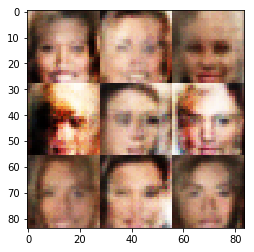

Epoch 1/20... Discriminator Loss: 1.2165... Generator Loss: 0.5127
Epoch 1/20... Discriminator Loss: 0.9936... Generator Loss: 0.8554
Epoch 1/20... Discriminator Loss: 0.9733... Generator Loss: 1.2951
Epoch 1/20... Discriminator Loss: 0.9883... Generator Loss: 1.5004
Epoch 1/20... Discriminator Loss: 1.1802... Generator Loss: 1.0730
Epoch 1/20... Discriminator Loss: 1.1195... Generator Loss: 0.6123
Epoch 1/20... Discriminator Loss: 0.8547... Generator Loss: 1.3876
Epoch 1/20... Discriminator Loss: 0.9735... Generator Loss: 0.8657
Epoch 1/20... Discriminator Loss: 0.9861... Generator Loss: 0.9719
Epoch 1/20... Discriminator Loss: 1.0534... Generator Loss: 0.8283


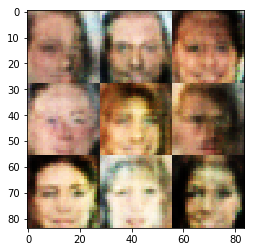

Epoch 1/20... Discriminator Loss: 1.0642... Generator Loss: 1.0911
Epoch 1/20... Discriminator Loss: 0.9615... Generator Loss: 0.9673
Epoch 1/20... Discriminator Loss: 0.6851... Generator Loss: 1.2779
Epoch 1/20... Discriminator Loss: 0.9937... Generator Loss: 1.4379
Epoch 1/20... Discriminator Loss: 1.2607... Generator Loss: 1.8206
Epoch 1/20... Discriminator Loss: 1.1854... Generator Loss: 0.6445
Epoch 1/20... Discriminator Loss: 1.0180... Generator Loss: 1.1249
Epoch 1/20... Discriminator Loss: 0.8565... Generator Loss: 1.1634
Epoch 1/20... Discriminator Loss: 1.0112... Generator Loss: 1.4044
Epoch 1/20... Discriminator Loss: 0.8404... Generator Loss: 1.1405


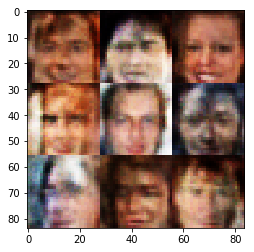

Epoch 1/20... Discriminator Loss: 0.9346... Generator Loss: 0.9885
Epoch 1/20... Discriminator Loss: 0.8785... Generator Loss: 1.8729
Epoch 1/20... Discriminator Loss: 1.1104... Generator Loss: 1.8357
Epoch 1/20... Discriminator Loss: 0.8792... Generator Loss: 1.6304
Epoch 1/20... Discriminator Loss: 1.0057... Generator Loss: 1.9282
Epoch 1/20... Discriminator Loss: 0.8569... Generator Loss: 0.9406
Epoch 1/20... Discriminator Loss: 0.8080... Generator Loss: 1.0511
Epoch 1/20... Discriminator Loss: 1.6275... Generator Loss: 0.2934
Epoch 1/20... Discriminator Loss: 0.7933... Generator Loss: 1.4397
Epoch 1/20... Discriminator Loss: 0.8278... Generator Loss: 1.2881


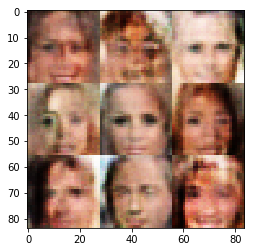

Epoch 1/20... Discriminator Loss: 1.1431... Generator Loss: 1.4640
Epoch 1/20... Discriminator Loss: 0.9700... Generator Loss: 1.4024
Epoch 1/20... Discriminator Loss: 0.9199... Generator Loss: 0.7991
Epoch 1/20... Discriminator Loss: 0.8198... Generator Loss: 1.0221
Epoch 1/20... Discriminator Loss: 1.3022... Generator Loss: 0.5365
Epoch 1/20... Discriminator Loss: 1.0791... Generator Loss: 0.6637
Epoch 1/20... Discriminator Loss: 0.8856... Generator Loss: 1.0542
Epoch 1/20... Discriminator Loss: 0.8181... Generator Loss: 1.3902
Epoch 1/20... Discriminator Loss: 0.7748... Generator Loss: 1.2206
Epoch 1/20... Discriminator Loss: 0.8331... Generator Loss: 0.9070


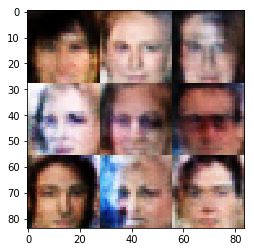

Epoch 1/20... Discriminator Loss: 0.9385... Generator Loss: 1.1740
Epoch 1/20... Discriminator Loss: 1.0646... Generator Loss: 1.2028
Epoch 1/20... Discriminator Loss: 0.9869... Generator Loss: 0.7884
Epoch 1/20... Discriminator Loss: 0.9371... Generator Loss: 0.7580
Epoch 1/20... Discriminator Loss: 0.9857... Generator Loss: 0.6928
Epoch 1/20... Discriminator Loss: 0.9154... Generator Loss: 1.2741
Epoch 1/20... Discriminator Loss: 0.8222... Generator Loss: 1.0006
Epoch 1/20... Discriminator Loss: 0.8145... Generator Loss: 1.5625
Epoch 1/20... Discriminator Loss: 0.8618... Generator Loss: 1.1635
Epoch 1/20... Discriminator Loss: 1.3021... Generator Loss: 0.4383


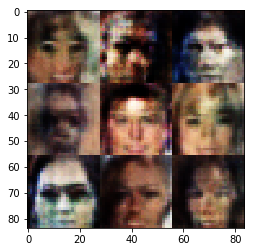

Epoch 1/20... Discriminator Loss: 0.8898... Generator Loss: 1.4342
Epoch 1/20... Discriminator Loss: 1.2885... Generator Loss: 1.5775
Epoch 1/20... Discriminator Loss: 0.9508... Generator Loss: 1.1528
Epoch 1/20... Discriminator Loss: 1.2113... Generator Loss: 0.5972
Epoch 1/20... Discriminator Loss: 0.9229... Generator Loss: 0.8435
Epoch 1/20... Discriminator Loss: 0.8874... Generator Loss: 1.2664
Epoch 1/20... Discriminator Loss: 1.3148... Generator Loss: 0.4405
Epoch 1/20... Discriminator Loss: 0.7813... Generator Loss: 0.9829
Epoch 1/20... Discriminator Loss: 0.9381... Generator Loss: 0.9253
Epoch 1/20... Discriminator Loss: 0.6701... Generator Loss: 1.5333


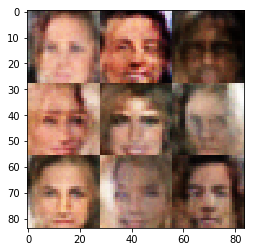

Epoch 1/20... Discriminator Loss: 0.9734... Generator Loss: 1.2196
Epoch 1/20... Discriminator Loss: 1.1260... Generator Loss: 1.8352
Epoch 1/20... Discriminator Loss: 0.8924... Generator Loss: 1.1879
Epoch 1/20... Discriminator Loss: 0.9298... Generator Loss: 1.1287
Epoch 1/20... Discriminator Loss: 1.1287... Generator Loss: 1.1506
Epoch 1/20... Discriminator Loss: 0.7885... Generator Loss: 1.0882
Epoch 1/20... Discriminator Loss: 0.8875... Generator Loss: 0.8545
Epoch 1/20... Discriminator Loss: 0.9869... Generator Loss: 0.6891
Epoch 2/20... Discriminator Loss: 1.1908... Generator Loss: 0.5147
Epoch 2/20... Discriminator Loss: 1.1962... Generator Loss: 1.4773


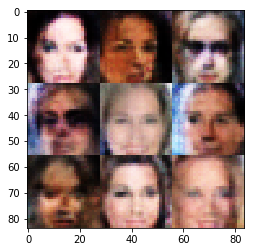

Epoch 2/20... Discriminator Loss: 0.8663... Generator Loss: 1.0741
Epoch 2/20... Discriminator Loss: 0.7344... Generator Loss: 1.5077
Epoch 2/20... Discriminator Loss: 1.1021... Generator Loss: 0.7142
Epoch 2/20... Discriminator Loss: 0.7882... Generator Loss: 1.7628
Epoch 2/20... Discriminator Loss: 1.0897... Generator Loss: 0.6403
Epoch 2/20... Discriminator Loss: 0.9506... Generator Loss: 1.5031
Epoch 2/20... Discriminator Loss: 1.1318... Generator Loss: 1.8398
Epoch 2/20... Discriminator Loss: 0.8668... Generator Loss: 1.0495
Epoch 2/20... Discriminator Loss: 0.9280... Generator Loss: 0.9920
Epoch 2/20... Discriminator Loss: 1.3290... Generator Loss: 0.5227


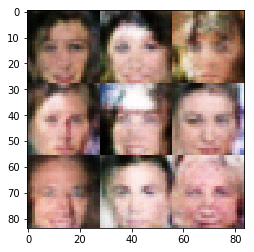

Epoch 2/20... Discriminator Loss: 1.0262... Generator Loss: 1.7195
Epoch 2/20... Discriminator Loss: 1.0676... Generator Loss: 1.1786
Epoch 2/20... Discriminator Loss: 0.9546... Generator Loss: 1.1157
Epoch 2/20... Discriminator Loss: 0.9069... Generator Loss: 1.3163
Epoch 2/20... Discriminator Loss: 1.0519... Generator Loss: 1.5838
Epoch 2/20... Discriminator Loss: 0.8204... Generator Loss: 1.2739
Epoch 2/20... Discriminator Loss: 0.8563... Generator Loss: 0.8416
Epoch 2/20... Discriminator Loss: 0.6986... Generator Loss: 1.0897
Epoch 2/20... Discriminator Loss: 0.6977... Generator Loss: 1.5607
Epoch 2/20... Discriminator Loss: 1.0550... Generator Loss: 1.6191


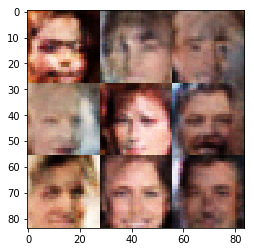

Epoch 2/20... Discriminator Loss: 0.7461... Generator Loss: 1.3899
Epoch 2/20... Discriminator Loss: 0.9886... Generator Loss: 0.8905
Epoch 2/20... Discriminator Loss: 0.9828... Generator Loss: 0.8381
Epoch 2/20... Discriminator Loss: 0.9117... Generator Loss: 1.8203
Epoch 2/20... Discriminator Loss: 1.0639... Generator Loss: 0.8320
Epoch 2/20... Discriminator Loss: 0.7692... Generator Loss: 1.2468
Epoch 2/20... Discriminator Loss: 0.7666... Generator Loss: 1.6512
Epoch 2/20... Discriminator Loss: 0.9607... Generator Loss: 1.1473
Epoch 2/20... Discriminator Loss: 1.1141... Generator Loss: 0.7047
Epoch 2/20... Discriminator Loss: 0.7488... Generator Loss: 1.8982


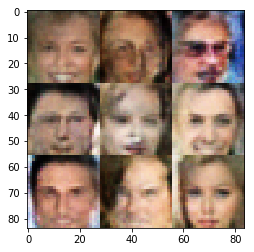

Epoch 2/20... Discriminator Loss: 0.9504... Generator Loss: 1.0061
Epoch 2/20... Discriminator Loss: 1.0941... Generator Loss: 0.7167
Epoch 2/20... Discriminator Loss: 1.3290... Generator Loss: 0.4740
Epoch 2/20... Discriminator Loss: 0.8385... Generator Loss: 1.0199
Epoch 2/20... Discriminator Loss: 0.8712... Generator Loss: 1.4509
Epoch 2/20... Discriminator Loss: 1.1060... Generator Loss: 1.8290
Epoch 2/20... Discriminator Loss: 0.7835... Generator Loss: 1.1819
Epoch 2/20... Discriminator Loss: 0.9705... Generator Loss: 0.8120
Epoch 2/20... Discriminator Loss: 0.6581... Generator Loss: 1.5880
Epoch 2/20... Discriminator Loss: 1.1165... Generator Loss: 2.1940


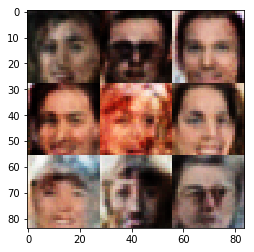

Epoch 2/20... Discriminator Loss: 1.3610... Generator Loss: 0.7997
Epoch 2/20... Discriminator Loss: 0.9635... Generator Loss: 0.9231
Epoch 2/20... Discriminator Loss: 0.8280... Generator Loss: 1.0908
Epoch 2/20... Discriminator Loss: 0.8842... Generator Loss: 1.0010
Epoch 2/20... Discriminator Loss: 0.8497... Generator Loss: 1.1720
Epoch 2/20... Discriminator Loss: 0.9054... Generator Loss: 0.9839
Epoch 2/20... Discriminator Loss: 1.0962... Generator Loss: 0.6335
Epoch 2/20... Discriminator Loss: 1.3003... Generator Loss: 0.4527
Epoch 2/20... Discriminator Loss: 0.7489... Generator Loss: 1.1381
Epoch 2/20... Discriminator Loss: 1.0178... Generator Loss: 1.4578


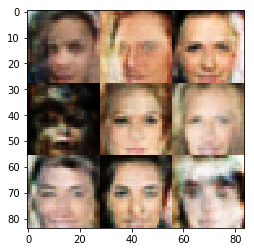

Epoch 2/20... Discriminator Loss: 0.8617... Generator Loss: 0.7792
Epoch 2/20... Discriminator Loss: 0.7851... Generator Loss: 1.0245
Epoch 2/20... Discriminator Loss: 1.1646... Generator Loss: 0.5929
Epoch 2/20... Discriminator Loss: 0.8471... Generator Loss: 1.0440
Epoch 2/20... Discriminator Loss: 1.0483... Generator Loss: 1.0221
Epoch 2/20... Discriminator Loss: 0.7471... Generator Loss: 2.3275
Epoch 2/20... Discriminator Loss: 0.7633... Generator Loss: 1.1100
Epoch 2/20... Discriminator Loss: 0.9192... Generator Loss: 0.9159
Epoch 2/20... Discriminator Loss: 1.1205... Generator Loss: 1.0938
Epoch 2/20... Discriminator Loss: 1.0192... Generator Loss: 2.3857


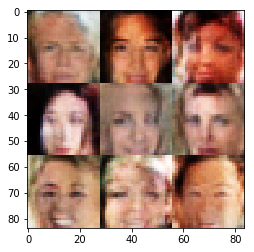

Epoch 2/20... Discriminator Loss: 0.9489... Generator Loss: 0.9914
Epoch 2/20... Discriminator Loss: 1.0008... Generator Loss: 0.9177
Epoch 2/20... Discriminator Loss: 1.0283... Generator Loss: 1.1464
Epoch 2/20... Discriminator Loss: 1.0388... Generator Loss: 1.0382
Epoch 2/20... Discriminator Loss: 1.3110... Generator Loss: 0.4626
Epoch 2/20... Discriminator Loss: 0.9952... Generator Loss: 1.3912
Epoch 2/20... Discriminator Loss: 0.7112... Generator Loss: 1.4444
Epoch 2/20... Discriminator Loss: 0.5832... Generator Loss: 2.2456
Epoch 2/20... Discriminator Loss: 0.9998... Generator Loss: 1.8763
Epoch 2/20... Discriminator Loss: 1.0831... Generator Loss: 0.6564


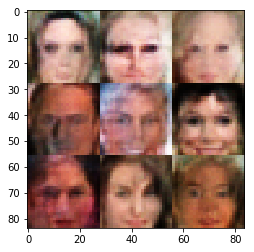

Epoch 2/20... Discriminator Loss: 1.0497... Generator Loss: 1.9305
Epoch 2/20... Discriminator Loss: 1.1116... Generator Loss: 0.6944
Epoch 2/20... Discriminator Loss: 0.9452... Generator Loss: 0.8277
Epoch 2/20... Discriminator Loss: 0.7462... Generator Loss: 1.4373
Epoch 2/20... Discriminator Loss: 0.5896... Generator Loss: 1.6601
Epoch 2/20... Discriminator Loss: 0.8644... Generator Loss: 1.3689
Epoch 2/20... Discriminator Loss: 1.1617... Generator Loss: 0.6987
Epoch 2/20... Discriminator Loss: 1.0310... Generator Loss: 1.3498
Epoch 2/20... Discriminator Loss: 0.7458... Generator Loss: 1.6411
Epoch 2/20... Discriminator Loss: 1.0401... Generator Loss: 0.6423


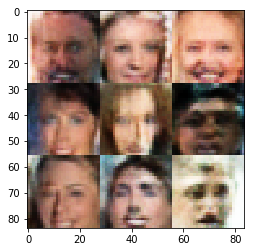

Epoch 2/20... Discriminator Loss: 0.9588... Generator Loss: 0.8396
Epoch 2/20... Discriminator Loss: 1.1814... Generator Loss: 0.5274
Epoch 2/20... Discriminator Loss: 1.1439... Generator Loss: 1.1260
Epoch 2/20... Discriminator Loss: 0.9637... Generator Loss: 1.2467
Epoch 2/20... Discriminator Loss: 0.8451... Generator Loss: 0.9948
Epoch 2/20... Discriminator Loss: 0.9064... Generator Loss: 1.7215
Epoch 2/20... Discriminator Loss: 1.1165... Generator Loss: 0.6421
Epoch 2/20... Discriminator Loss: 0.9837... Generator Loss: 0.6693
Epoch 2/20... Discriminator Loss: 0.7779... Generator Loss: 1.1606
Epoch 2/20... Discriminator Loss: 0.8812... Generator Loss: 1.2852


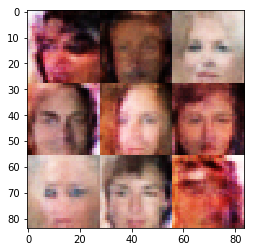

Epoch 2/20... Discriminator Loss: 1.1684... Generator Loss: 0.8384
Epoch 2/20... Discriminator Loss: 0.8131... Generator Loss: 1.2979
Epoch 2/20... Discriminator Loss: 0.9117... Generator Loss: 1.5032
Epoch 2/20... Discriminator Loss: 0.9458... Generator Loss: 0.8301
Epoch 2/20... Discriminator Loss: 1.1764... Generator Loss: 0.6066
Epoch 2/20... Discriminator Loss: 0.7946... Generator Loss: 1.1321
Epoch 2/20... Discriminator Loss: 0.8861... Generator Loss: 0.9711
Epoch 2/20... Discriminator Loss: 1.5947... Generator Loss: 0.3109
Epoch 2/20... Discriminator Loss: 0.9664... Generator Loss: 1.1705
Epoch 2/20... Discriminator Loss: 1.1535... Generator Loss: 0.5477


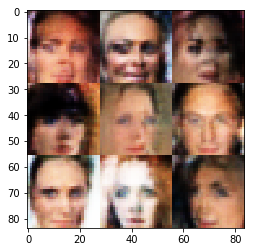

Epoch 2/20... Discriminator Loss: 1.0954... Generator Loss: 0.8004
Epoch 2/20... Discriminator Loss: 1.0374... Generator Loss: 0.7722
Epoch 2/20... Discriminator Loss: 0.6891... Generator Loss: 1.2807
Epoch 2/20... Discriminator Loss: 0.9726... Generator Loss: 0.8138
Epoch 2/20... Discriminator Loss: 1.0991... Generator Loss: 0.8450
Epoch 2/20... Discriminator Loss: 1.4676... Generator Loss: 0.4048
Epoch 2/20... Discriminator Loss: 0.9291... Generator Loss: 0.8053
Epoch 2/20... Discriminator Loss: 0.8234... Generator Loss: 1.2018
Epoch 2/20... Discriminator Loss: 1.1191... Generator Loss: 0.5499
Epoch 2/20... Discriminator Loss: 0.6923... Generator Loss: 1.3562


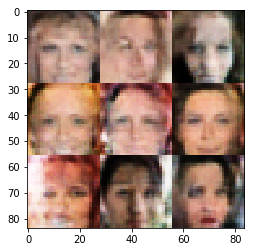

Epoch 2/20... Discriminator Loss: 0.8878... Generator Loss: 0.9154
Epoch 2/20... Discriminator Loss: 1.0903... Generator Loss: 1.7147
Epoch 2/20... Discriminator Loss: 0.9272... Generator Loss: 0.7981
Epoch 2/20... Discriminator Loss: 1.1669... Generator Loss: 0.6095
Epoch 2/20... Discriminator Loss: 0.9301... Generator Loss: 1.1544
Epoch 2/20... Discriminator Loss: 0.8414... Generator Loss: 0.9689
Epoch 2/20... Discriminator Loss: 1.1512... Generator Loss: 1.2166
Epoch 2/20... Discriminator Loss: 0.7902... Generator Loss: 1.8020
Epoch 2/20... Discriminator Loss: 0.8775... Generator Loss: 1.2162
Epoch 2/20... Discriminator Loss: 0.6997... Generator Loss: 1.5000


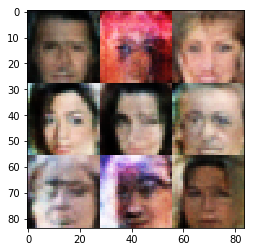

Epoch 2/20... Discriminator Loss: 0.9144... Generator Loss: 0.8959
Epoch 2/20... Discriminator Loss: 1.0983... Generator Loss: 0.6592
Epoch 2/20... Discriminator Loss: 0.8482... Generator Loss: 1.3378
Epoch 2/20... Discriminator Loss: 1.2316... Generator Loss: 0.4769
Epoch 2/20... Discriminator Loss: 0.8239... Generator Loss: 1.3569
Epoch 2/20... Discriminator Loss: 0.8913... Generator Loss: 0.8941
Epoch 2/20... Discriminator Loss: 0.9480... Generator Loss: 0.8774
Epoch 2/20... Discriminator Loss: 0.9546... Generator Loss: 0.6921
Epoch 2/20... Discriminator Loss: 1.1264... Generator Loss: 0.6539
Epoch 2/20... Discriminator Loss: 0.9213... Generator Loss: 1.1662


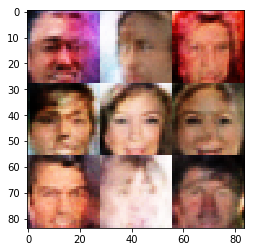

Epoch 2/20... Discriminator Loss: 1.1431... Generator Loss: 0.9745
Epoch 2/20... Discriminator Loss: 0.9697... Generator Loss: 0.8053
Epoch 2/20... Discriminator Loss: 0.8937... Generator Loss: 1.5152
Epoch 2/20... Discriminator Loss: 0.7033... Generator Loss: 1.5702
Epoch 2/20... Discriminator Loss: 0.8171... Generator Loss: 1.1758
Epoch 2/20... Discriminator Loss: 0.6847... Generator Loss: 1.3093
Epoch 2/20... Discriminator Loss: 1.4339... Generator Loss: 0.4087
Epoch 2/20... Discriminator Loss: 0.9086... Generator Loss: 1.4378
Epoch 2/20... Discriminator Loss: 0.7802... Generator Loss: 1.7331
Epoch 2/20... Discriminator Loss: 0.8984... Generator Loss: 0.8145


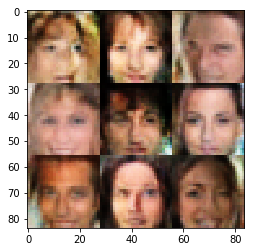

Epoch 2/20... Discriminator Loss: 0.9437... Generator Loss: 0.9785
Epoch 2/20... Discriminator Loss: 1.1478... Generator Loss: 0.5996
Epoch 2/20... Discriminator Loss: 1.0767... Generator Loss: 1.2999
Epoch 2/20... Discriminator Loss: 1.0339... Generator Loss: 0.7724
Epoch 2/20... Discriminator Loss: 1.1122... Generator Loss: 0.5999
Epoch 2/20... Discriminator Loss: 0.8883... Generator Loss: 1.3060
Epoch 2/20... Discriminator Loss: 1.1213... Generator Loss: 0.8318
Epoch 2/20... Discriminator Loss: 1.0787... Generator Loss: 0.6161
Epoch 2/20... Discriminator Loss: 0.7761... Generator Loss: 1.4808
Epoch 2/20... Discriminator Loss: 0.9906... Generator Loss: 0.7143


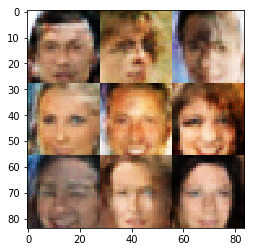

Epoch 2/20... Discriminator Loss: 0.8771... Generator Loss: 1.6830
Epoch 2/20... Discriminator Loss: 0.9027... Generator Loss: 1.3051
Epoch 2/20... Discriminator Loss: 1.0665... Generator Loss: 1.5482
Epoch 2/20... Discriminator Loss: 0.8934... Generator Loss: 1.1503
Epoch 2/20... Discriminator Loss: 0.9689... Generator Loss: 0.7492
Epoch 2/20... Discriminator Loss: 0.8346... Generator Loss: 1.0970
Epoch 3/20... Discriminator Loss: 1.2753... Generator Loss: 0.4797
Epoch 3/20... Discriminator Loss: 1.2493... Generator Loss: 0.5240
Epoch 3/20... Discriminator Loss: 0.7971... Generator Loss: 1.2253
Epoch 3/20... Discriminator Loss: 0.7658... Generator Loss: 1.1911


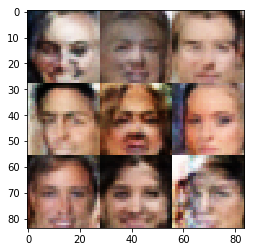

Epoch 3/20... Discriminator Loss: 0.9176... Generator Loss: 1.4519
Epoch 3/20... Discriminator Loss: 0.6068... Generator Loss: 1.1928
Epoch 3/20... Discriminator Loss: 0.8481... Generator Loss: 1.8248
Epoch 3/20... Discriminator Loss: 0.7465... Generator Loss: 1.4638
Epoch 3/20... Discriminator Loss: 0.9533... Generator Loss: 1.3640
Epoch 3/20... Discriminator Loss: 1.0043... Generator Loss: 0.9094
Epoch 3/20... Discriminator Loss: 0.9027... Generator Loss: 1.0326
Epoch 3/20... Discriminator Loss: 1.0014... Generator Loss: 1.2455
Epoch 3/20... Discriminator Loss: 1.0145... Generator Loss: 0.7158
Epoch 3/20... Discriminator Loss: 0.8652... Generator Loss: 1.4396


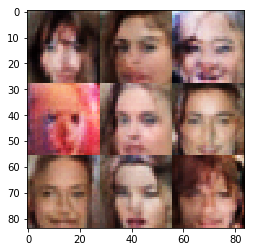

Epoch 3/20... Discriminator Loss: 1.0127... Generator Loss: 1.2036
Epoch 3/20... Discriminator Loss: 1.2107... Generator Loss: 0.5133
Epoch 3/20... Discriminator Loss: 0.8853... Generator Loss: 1.3370
Epoch 3/20... Discriminator Loss: 0.9565... Generator Loss: 0.7768
Epoch 3/20... Discriminator Loss: 0.9857... Generator Loss: 1.1103
Epoch 3/20... Discriminator Loss: 1.0229... Generator Loss: 0.7646
Epoch 3/20... Discriminator Loss: 0.8772... Generator Loss: 0.9819
Epoch 3/20... Discriminator Loss: 1.3288... Generator Loss: 0.4687
Epoch 3/20... Discriminator Loss: 0.9409... Generator Loss: 1.0632
Epoch 3/20... Discriminator Loss: 1.0184... Generator Loss: 0.9594


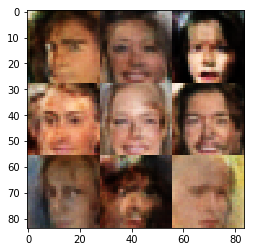

Epoch 3/20... Discriminator Loss: 0.6871... Generator Loss: 1.3468
Epoch 3/20... Discriminator Loss: 0.9334... Generator Loss: 1.0460
Epoch 3/20... Discriminator Loss: 0.8628... Generator Loss: 1.5624
Epoch 3/20... Discriminator Loss: 0.9233... Generator Loss: 0.9096
Epoch 3/20... Discriminator Loss: 1.0794... Generator Loss: 1.1732
Epoch 3/20... Discriminator Loss: 0.9562... Generator Loss: 1.5690
Epoch 3/20... Discriminator Loss: 1.1383... Generator Loss: 2.0413
Epoch 3/20... Discriminator Loss: 0.8720... Generator Loss: 1.2044
Epoch 3/20... Discriminator Loss: 0.6924... Generator Loss: 1.4123
Epoch 3/20... Discriminator Loss: 0.7709... Generator Loss: 0.9681


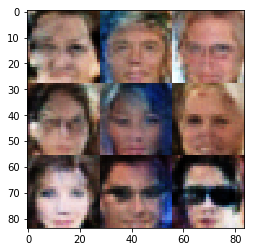

Epoch 3/20... Discriminator Loss: 1.9298... Generator Loss: 0.2192
Epoch 3/20... Discriminator Loss: 1.2670... Generator Loss: 0.5298
Epoch 3/20... Discriminator Loss: 0.9213... Generator Loss: 1.1474
Epoch 3/20... Discriminator Loss: 0.8398... Generator Loss: 1.4704
Epoch 3/20... Discriminator Loss: 0.8617... Generator Loss: 1.1350
Epoch 3/20... Discriminator Loss: 0.7970... Generator Loss: 1.7361
Epoch 3/20... Discriminator Loss: 1.1837... Generator Loss: 0.5598
Epoch 3/20... Discriminator Loss: 1.3536... Generator Loss: 0.3954
Epoch 3/20... Discriminator Loss: 1.2179... Generator Loss: 0.5830
Epoch 3/20... Discriminator Loss: 1.2849... Generator Loss: 0.4674


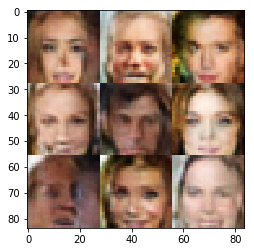

Epoch 3/20... Discriminator Loss: 1.0892... Generator Loss: 0.7663
Epoch 3/20... Discriminator Loss: 1.0380... Generator Loss: 0.9332
Epoch 3/20... Discriminator Loss: 0.7708... Generator Loss: 1.1087
Epoch 3/20... Discriminator Loss: 1.0984... Generator Loss: 1.5526
Epoch 3/20... Discriminator Loss: 0.9785... Generator Loss: 0.9909
Epoch 3/20... Discriminator Loss: 0.8740... Generator Loss: 0.9147
Epoch 3/20... Discriminator Loss: 1.1598... Generator Loss: 0.5234
Epoch 3/20... Discriminator Loss: 1.0651... Generator Loss: 1.6127
Epoch 3/20... Discriminator Loss: 1.1580... Generator Loss: 0.6222
Epoch 3/20... Discriminator Loss: 1.0415... Generator Loss: 0.7172


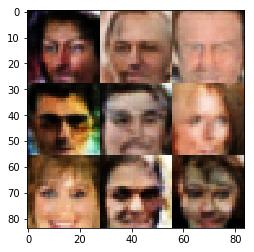

Epoch 3/20... Discriminator Loss: 1.1048... Generator Loss: 1.4416
Epoch 3/20... Discriminator Loss: 0.9010... Generator Loss: 0.8601
Epoch 3/20... Discriminator Loss: 1.2957... Generator Loss: 0.8718
Epoch 3/20... Discriminator Loss: 0.8718... Generator Loss: 0.9118
Epoch 3/20... Discriminator Loss: 0.8738... Generator Loss: 0.9427
Epoch 3/20... Discriminator Loss: 0.8304... Generator Loss: 1.0146
Epoch 3/20... Discriminator Loss: 0.8403... Generator Loss: 1.9395
Epoch 3/20... Discriminator Loss: 0.7127... Generator Loss: 1.3298
Epoch 3/20... Discriminator Loss: 0.8660... Generator Loss: 1.0988
Epoch 3/20... Discriminator Loss: 0.9622... Generator Loss: 0.7734


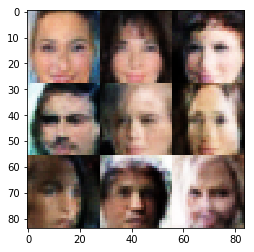

Epoch 3/20... Discriminator Loss: 1.0910... Generator Loss: 0.6041
Epoch 3/20... Discriminator Loss: 0.9209... Generator Loss: 1.3649
Epoch 3/20... Discriminator Loss: 1.2764... Generator Loss: 0.4672
Epoch 3/20... Discriminator Loss: 1.0228... Generator Loss: 0.7589
Epoch 3/20... Discriminator Loss: 1.0675... Generator Loss: 0.7299
Epoch 3/20... Discriminator Loss: 0.9237... Generator Loss: 0.9797
Epoch 3/20... Discriminator Loss: 0.7365... Generator Loss: 1.0265
Epoch 3/20... Discriminator Loss: 0.9114... Generator Loss: 1.1335
Epoch 3/20... Discriminator Loss: 1.0056... Generator Loss: 0.6323
Epoch 3/20... Discriminator Loss: 0.7035... Generator Loss: 1.3421


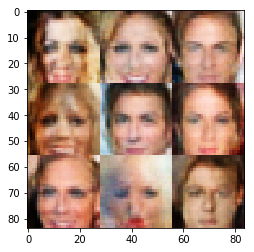

Epoch 3/20... Discriminator Loss: 0.9411... Generator Loss: 1.2252
Epoch 3/20... Discriminator Loss: 1.1793... Generator Loss: 0.5868
Epoch 3/20... Discriminator Loss: 0.7139... Generator Loss: 1.1194
Epoch 3/20... Discriminator Loss: 0.8246... Generator Loss: 1.3200
Epoch 3/20... Discriminator Loss: 0.8493... Generator Loss: 1.6261
Epoch 3/20... Discriminator Loss: 0.7773... Generator Loss: 1.0960
Epoch 3/20... Discriminator Loss: 0.8895... Generator Loss: 1.3097
Epoch 3/20... Discriminator Loss: 0.7620... Generator Loss: 1.3723
Epoch 3/20... Discriminator Loss: 0.9617... Generator Loss: 0.7728
Epoch 3/20... Discriminator Loss: 1.2549... Generator Loss: 0.4969


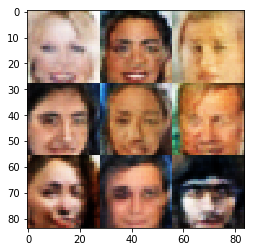

Epoch 3/20... Discriminator Loss: 0.9116... Generator Loss: 1.4839
Epoch 3/20... Discriminator Loss: 0.9503... Generator Loss: 0.6941
Epoch 3/20... Discriminator Loss: 0.7510... Generator Loss: 1.2789
Epoch 3/20... Discriminator Loss: 0.7411... Generator Loss: 1.4579
Epoch 3/20... Discriminator Loss: 0.8687... Generator Loss: 0.9840
Epoch 3/20... Discriminator Loss: 1.0309... Generator Loss: 0.8022
Epoch 3/20... Discriminator Loss: 0.6740... Generator Loss: 1.2369
Epoch 3/20... Discriminator Loss: 0.9614... Generator Loss: 0.8003
Epoch 3/20... Discriminator Loss: 0.5436... Generator Loss: 1.5719
Epoch 3/20... Discriminator Loss: 0.8488... Generator Loss: 1.1191


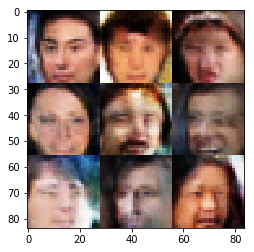

Epoch 3/20... Discriminator Loss: 0.7407... Generator Loss: 1.4700
Epoch 3/20... Discriminator Loss: 0.9349... Generator Loss: 0.8865
Epoch 3/20... Discriminator Loss: 0.7157... Generator Loss: 1.2111
Epoch 3/20... Discriminator Loss: 0.9311... Generator Loss: 1.1057
Epoch 3/20... Discriminator Loss: 0.9872... Generator Loss: 1.2825
Epoch 3/20... Discriminator Loss: 0.8101... Generator Loss: 0.9348
Epoch 3/20... Discriminator Loss: 0.7933... Generator Loss: 0.9355
Epoch 3/20... Discriminator Loss: 0.9058... Generator Loss: 0.9817
Epoch 3/20... Discriminator Loss: 0.6893... Generator Loss: 1.9477
Epoch 3/20... Discriminator Loss: 0.9490... Generator Loss: 1.1274


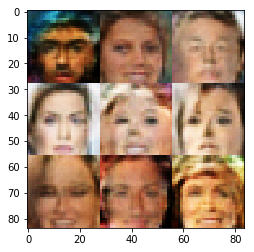

Epoch 3/20... Discriminator Loss: 0.8661... Generator Loss: 1.5116
Epoch 3/20... Discriminator Loss: 1.2854... Generator Loss: 2.3720
Epoch 3/20... Discriminator Loss: 0.7032... Generator Loss: 1.3368
Epoch 3/20... Discriminator Loss: 0.9183... Generator Loss: 0.8314
Epoch 3/20... Discriminator Loss: 1.2583... Generator Loss: 0.4672
Epoch 3/20... Discriminator Loss: 0.8889... Generator Loss: 1.0972
Epoch 3/20... Discriminator Loss: 0.8398... Generator Loss: 1.1440
Epoch 3/20... Discriminator Loss: 1.0327... Generator Loss: 0.8425
Epoch 3/20... Discriminator Loss: 0.9225... Generator Loss: 1.2744
Epoch 3/20... Discriminator Loss: 0.8064... Generator Loss: 1.0123


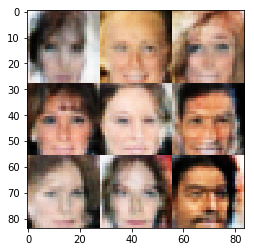

Epoch 3/20... Discriminator Loss: 0.8539... Generator Loss: 0.9156
Epoch 3/20... Discriminator Loss: 1.1117... Generator Loss: 0.6755
Epoch 3/20... Discriminator Loss: 0.8221... Generator Loss: 2.0400
Epoch 3/20... Discriminator Loss: 1.1471... Generator Loss: 1.5770
Epoch 3/20... Discriminator Loss: 0.8291... Generator Loss: 0.9065
Epoch 3/20... Discriminator Loss: 0.8513... Generator Loss: 0.9048
Epoch 3/20... Discriminator Loss: 1.2181... Generator Loss: 0.5688
Epoch 3/20... Discriminator Loss: 1.0701... Generator Loss: 0.6398
Epoch 3/20... Discriminator Loss: 0.8592... Generator Loss: 1.1562
Epoch 3/20... Discriminator Loss: 1.6661... Generator Loss: 0.2814


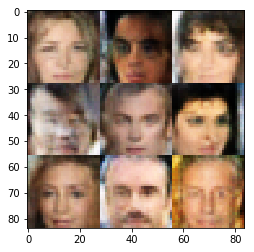

Epoch 3/20... Discriminator Loss: 1.0138... Generator Loss: 1.1959
Epoch 3/20... Discriminator Loss: 0.9243... Generator Loss: 1.6701
Epoch 3/20... Discriminator Loss: 0.9836... Generator Loss: 0.7329
Epoch 3/20... Discriminator Loss: 0.8654... Generator Loss: 1.4515
Epoch 3/20... Discriminator Loss: 0.8700... Generator Loss: 1.0141
Epoch 3/20... Discriminator Loss: 0.8507... Generator Loss: 1.0818
Epoch 3/20... Discriminator Loss: 1.1055... Generator Loss: 0.6509
Epoch 3/20... Discriminator Loss: 0.8066... Generator Loss: 1.1351
Epoch 3/20... Discriminator Loss: 1.0059... Generator Loss: 0.7662
Epoch 3/20... Discriminator Loss: 0.9671... Generator Loss: 1.0145


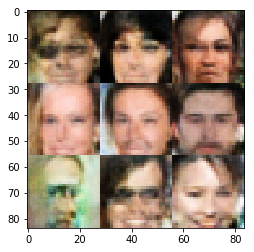

Epoch 3/20... Discriminator Loss: 0.7969... Generator Loss: 1.6367
Epoch 3/20... Discriminator Loss: 1.3030... Generator Loss: 0.5121
Epoch 3/20... Discriminator Loss: 1.1462... Generator Loss: 0.5448
Epoch 3/20... Discriminator Loss: 0.8122... Generator Loss: 1.3284
Epoch 3/20... Discriminator Loss: 1.0136... Generator Loss: 0.8116
Epoch 3/20... Discriminator Loss: 1.0000... Generator Loss: 0.8961
Epoch 3/20... Discriminator Loss: 0.7410... Generator Loss: 1.2881
Epoch 3/20... Discriminator Loss: 0.7739... Generator Loss: 0.9745
Epoch 3/20... Discriminator Loss: 0.3421... Generator Loss: 2.2014
Epoch 3/20... Discriminator Loss: 1.2969... Generator Loss: 2.7215


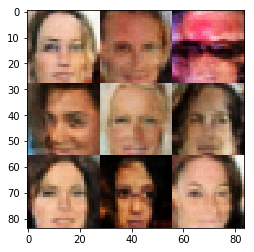

Epoch 3/20... Discriminator Loss: 0.7139... Generator Loss: 1.4675
Epoch 3/20... Discriminator Loss: 0.9537... Generator Loss: 0.8887
Epoch 3/20... Discriminator Loss: 1.2679... Generator Loss: 1.5409
Epoch 3/20... Discriminator Loss: 0.9726... Generator Loss: 0.7492
Epoch 3/20... Discriminator Loss: 0.6935... Generator Loss: 1.1376
Epoch 3/20... Discriminator Loss: 1.0877... Generator Loss: 0.6229
Epoch 3/20... Discriminator Loss: 0.8901... Generator Loss: 1.1703
Epoch 3/20... Discriminator Loss: 1.1911... Generator Loss: 0.5377
Epoch 3/20... Discriminator Loss: 0.7776... Generator Loss: 1.2664
Epoch 3/20... Discriminator Loss: 0.9667... Generator Loss: 0.8797


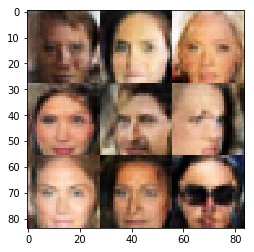

Epoch 3/20... Discriminator Loss: 0.9822... Generator Loss: 0.8038
Epoch 3/20... Discriminator Loss: 0.8820... Generator Loss: 1.0186
Epoch 3/20... Discriminator Loss: 1.2221... Generator Loss: 0.4809
Epoch 3/20... Discriminator Loss: 1.0471... Generator Loss: 1.0451
Epoch 4/20... Discriminator Loss: 0.9736... Generator Loss: 0.9050
Epoch 4/20... Discriminator Loss: 1.1444... Generator Loss: 1.5890
Epoch 4/20... Discriminator Loss: 0.8117... Generator Loss: 0.9721
Epoch 4/20... Discriminator Loss: 1.2602... Generator Loss: 0.4720
Epoch 4/20... Discriminator Loss: 0.8870... Generator Loss: 0.8634
Epoch 4/20... Discriminator Loss: 0.9998... Generator Loss: 0.7753


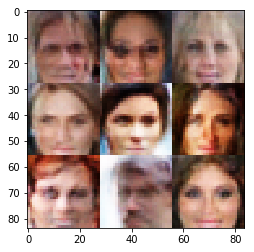

Epoch 4/20... Discriminator Loss: 1.2537... Generator Loss: 0.8362
Epoch 4/20... Discriminator Loss: 1.3180... Generator Loss: 0.4878
Epoch 4/20... Discriminator Loss: 1.0823... Generator Loss: 0.5812
Epoch 4/20... Discriminator Loss: 0.8278... Generator Loss: 0.9284
Epoch 4/20... Discriminator Loss: 1.3523... Generator Loss: 0.4277
Epoch 4/20... Discriminator Loss: 0.8374... Generator Loss: 1.2507
Epoch 4/20... Discriminator Loss: 1.0618... Generator Loss: 0.7166
Epoch 4/20... Discriminator Loss: 0.8663... Generator Loss: 1.3464
Epoch 4/20... Discriminator Loss: 0.9737... Generator Loss: 0.7494
Epoch 4/20... Discriminator Loss: 0.8236... Generator Loss: 0.9544


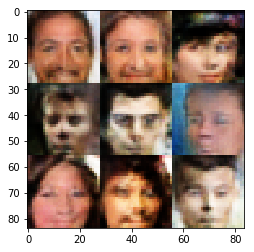

Epoch 4/20... Discriminator Loss: 0.9221... Generator Loss: 0.8390
Epoch 4/20... Discriminator Loss: 1.1294... Generator Loss: 0.7643
Epoch 4/20... Discriminator Loss: 1.1048... Generator Loss: 0.6355
Epoch 4/20... Discriminator Loss: 1.0300... Generator Loss: 1.1335
Epoch 4/20... Discriminator Loss: 0.9485... Generator Loss: 0.8090
Epoch 4/20... Discriminator Loss: 0.7356... Generator Loss: 1.2254
Epoch 4/20... Discriminator Loss: 1.1650... Generator Loss: 0.5192
Epoch 4/20... Discriminator Loss: 1.0922... Generator Loss: 0.6871
Epoch 4/20... Discriminator Loss: 0.8743... Generator Loss: 1.3321
Epoch 4/20... Discriminator Loss: 0.6928... Generator Loss: 2.0214


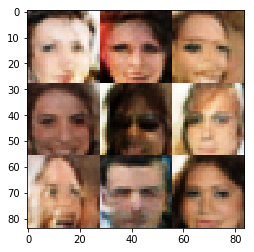

Epoch 4/20... Discriminator Loss: 0.7915... Generator Loss: 1.1928
Epoch 4/20... Discriminator Loss: 1.2666... Generator Loss: 0.4702
Epoch 4/20... Discriminator Loss: 0.7092... Generator Loss: 1.2884
Epoch 4/20... Discriminator Loss: 0.9022... Generator Loss: 1.0067
Epoch 4/20... Discriminator Loss: 0.7427... Generator Loss: 1.0963
Epoch 4/20... Discriminator Loss: 1.0257... Generator Loss: 0.7308
Epoch 4/20... Discriminator Loss: 0.8454... Generator Loss: 1.3529
Epoch 4/20... Discriminator Loss: 1.6327... Generator Loss: 0.2901
Epoch 4/20... Discriminator Loss: 1.2821... Generator Loss: 0.5001
Epoch 4/20... Discriminator Loss: 1.0446... Generator Loss: 1.2220


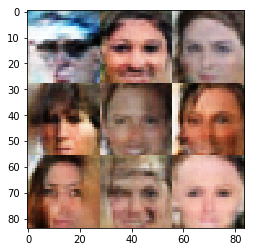

Epoch 4/20... Discriminator Loss: 0.9762... Generator Loss: 0.8458
Epoch 4/20... Discriminator Loss: 1.1150... Generator Loss: 0.6725
Epoch 4/20... Discriminator Loss: 0.8235... Generator Loss: 1.2133
Epoch 4/20... Discriminator Loss: 0.8298... Generator Loss: 0.9738
Epoch 4/20... Discriminator Loss: 0.8825... Generator Loss: 1.1235
Epoch 4/20... Discriminator Loss: 0.9669... Generator Loss: 0.8630
Epoch 4/20... Discriminator Loss: 1.1335... Generator Loss: 0.5736
Epoch 4/20... Discriminator Loss: 1.1469... Generator Loss: 0.9327
Epoch 4/20... Discriminator Loss: 1.0127... Generator Loss: 0.8092
Epoch 4/20... Discriminator Loss: 0.8591... Generator Loss: 1.0509


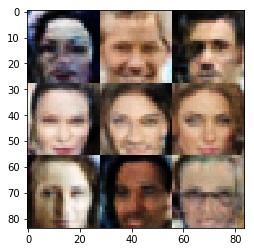

Epoch 4/20... Discriminator Loss: 0.9667... Generator Loss: 0.9139
Epoch 4/20... Discriminator Loss: 0.6757... Generator Loss: 1.6746
Epoch 4/20... Discriminator Loss: 1.1483... Generator Loss: 0.5308
Epoch 4/20... Discriminator Loss: 0.9364... Generator Loss: 0.7537
Epoch 4/20... Discriminator Loss: 0.9836... Generator Loss: 0.7443
Epoch 4/20... Discriminator Loss: 0.8840... Generator Loss: 0.9991
Epoch 4/20... Discriminator Loss: 1.0080... Generator Loss: 0.8341
Epoch 4/20... Discriminator Loss: 1.0373... Generator Loss: 0.7230
Epoch 4/20... Discriminator Loss: 0.8678... Generator Loss: 1.1571
Epoch 4/20... Discriminator Loss: 1.0572... Generator Loss: 1.0199


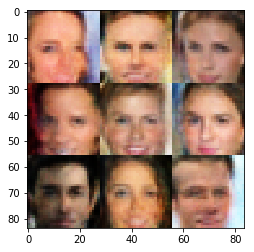

Epoch 4/20... Discriminator Loss: 1.1899... Generator Loss: 0.5777
Epoch 4/20... Discriminator Loss: 0.9449... Generator Loss: 0.7969
Epoch 4/20... Discriminator Loss: 1.0293... Generator Loss: 0.6944
Epoch 4/20... Discriminator Loss: 0.9014... Generator Loss: 1.6082
Epoch 4/20... Discriminator Loss: 0.7669... Generator Loss: 1.0051
Epoch 4/20... Discriminator Loss: 0.9627... Generator Loss: 0.8686
Epoch 4/20... Discriminator Loss: 1.0334... Generator Loss: 0.7327
Epoch 4/20... Discriminator Loss: 1.0843... Generator Loss: 2.5218
Epoch 4/20... Discriminator Loss: 1.0482... Generator Loss: 1.1007
Epoch 4/20... Discriminator Loss: 0.9663... Generator Loss: 0.8249


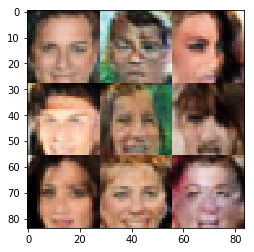

Epoch 4/20... Discriminator Loss: 1.2151... Generator Loss: 0.4637
Epoch 4/20... Discriminator Loss: 1.2846... Generator Loss: 0.4103
Epoch 4/20... Discriminator Loss: 1.2808... Generator Loss: 0.4867
Epoch 4/20... Discriminator Loss: 1.1944... Generator Loss: 0.4918
Epoch 4/20... Discriminator Loss: 0.9674... Generator Loss: 0.7161
Epoch 4/20... Discriminator Loss: 1.6329... Generator Loss: 2.2197
Epoch 4/20... Discriminator Loss: 1.1343... Generator Loss: 0.5749
Epoch 4/20... Discriminator Loss: 1.0695... Generator Loss: 0.8104
Epoch 4/20... Discriminator Loss: 0.8459... Generator Loss: 1.0101
Epoch 4/20... Discriminator Loss: 1.1552... Generator Loss: 0.5546


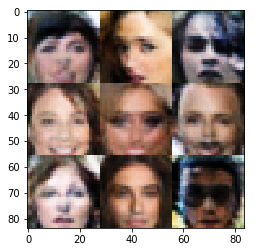

Epoch 4/20... Discriminator Loss: 0.9635... Generator Loss: 1.0918
Epoch 4/20... Discriminator Loss: 0.8981... Generator Loss: 0.9080
Epoch 4/20... Discriminator Loss: 0.8165... Generator Loss: 1.8177
Epoch 4/20... Discriminator Loss: 0.8570... Generator Loss: 1.2033
Epoch 4/20... Discriminator Loss: 1.0008... Generator Loss: 0.8554
Epoch 4/20... Discriminator Loss: 1.0239... Generator Loss: 1.1369
Epoch 4/20... Discriminator Loss: 0.7346... Generator Loss: 1.1061
Epoch 4/20... Discriminator Loss: 1.1460... Generator Loss: 0.5394
Epoch 4/20... Discriminator Loss: 1.1418... Generator Loss: 0.6178
Epoch 4/20... Discriminator Loss: 0.9550... Generator Loss: 0.8727


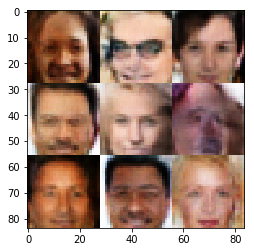

Epoch 4/20... Discriminator Loss: 0.9476... Generator Loss: 0.8231
Epoch 4/20... Discriminator Loss: 1.0002... Generator Loss: 0.9914
Epoch 4/20... Discriminator Loss: 0.8656... Generator Loss: 0.9518
Epoch 4/20... Discriminator Loss: 0.9479... Generator Loss: 0.8266
Epoch 4/20... Discriminator Loss: 0.9182... Generator Loss: 1.1409
Epoch 4/20... Discriminator Loss: 1.1358... Generator Loss: 0.5745
Epoch 4/20... Discriminator Loss: 0.8780... Generator Loss: 0.8220
Epoch 4/20... Discriminator Loss: 1.0390... Generator Loss: 1.1458
Epoch 4/20... Discriminator Loss: 0.8549... Generator Loss: 0.8294
Epoch 4/20... Discriminator Loss: 1.1136... Generator Loss: 0.5832


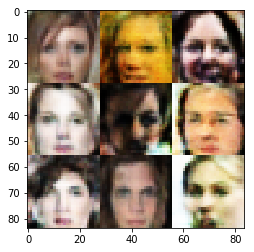

Epoch 4/20... Discriminator Loss: 0.9271... Generator Loss: 1.6684
Epoch 4/20... Discriminator Loss: 1.0239... Generator Loss: 0.7329
Epoch 4/20... Discriminator Loss: 0.9381... Generator Loss: 1.8496
Epoch 4/20... Discriminator Loss: 1.0037... Generator Loss: 0.9127
Epoch 4/20... Discriminator Loss: 1.5298... Generator Loss: 0.3323
Epoch 4/20... Discriminator Loss: 0.9074... Generator Loss: 1.2655
Epoch 4/20... Discriminator Loss: 0.8747... Generator Loss: 1.1816
Epoch 4/20... Discriminator Loss: 1.1033... Generator Loss: 0.6871
Epoch 4/20... Discriminator Loss: 0.7608... Generator Loss: 1.2482
Epoch 4/20... Discriminator Loss: 1.1152... Generator Loss: 0.9046


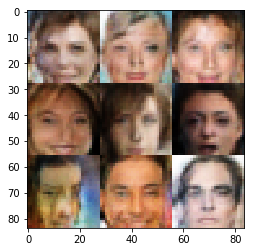

Epoch 4/20... Discriminator Loss: 0.8203... Generator Loss: 1.0625
Epoch 4/20... Discriminator Loss: 1.2017... Generator Loss: 0.5135
Epoch 4/20... Discriminator Loss: 1.2962... Generator Loss: 0.5776
Epoch 4/20... Discriminator Loss: 0.8841... Generator Loss: 0.8655
Epoch 4/20... Discriminator Loss: 0.7083... Generator Loss: 1.2271
Epoch 4/20... Discriminator Loss: 0.9925... Generator Loss: 0.8610
Epoch 4/20... Discriminator Loss: 0.9406... Generator Loss: 0.9740
Epoch 4/20... Discriminator Loss: 1.0857... Generator Loss: 0.6024
Epoch 4/20... Discriminator Loss: 0.8488... Generator Loss: 0.8733
Epoch 4/20... Discriminator Loss: 1.2411... Generator Loss: 0.4942


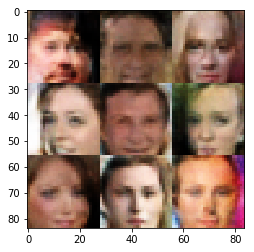

Epoch 4/20... Discriminator Loss: 1.0989... Generator Loss: 0.6229
Epoch 4/20... Discriminator Loss: 1.0399... Generator Loss: 1.1045
Epoch 4/20... Discriminator Loss: 1.2550... Generator Loss: 0.5526
Epoch 4/20... Discriminator Loss: 1.0722... Generator Loss: 1.7976
Epoch 4/20... Discriminator Loss: 0.7842... Generator Loss: 1.0646
Epoch 4/20... Discriminator Loss: 1.0544... Generator Loss: 0.6271
Epoch 4/20... Discriminator Loss: 0.7685... Generator Loss: 1.2453
Epoch 4/20... Discriminator Loss: 0.9834... Generator Loss: 0.6664
Epoch 4/20... Discriminator Loss: 1.1919... Generator Loss: 2.1198
Epoch 4/20... Discriminator Loss: 0.7104... Generator Loss: 1.1732


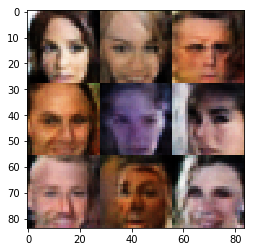

Epoch 4/20... Discriminator Loss: 0.8496... Generator Loss: 1.7488
Epoch 4/20... Discriminator Loss: 0.5178... Generator Loss: 1.5372
Epoch 4/20... Discriminator Loss: 1.1668... Generator Loss: 0.5561
Epoch 4/20... Discriminator Loss: 1.1306... Generator Loss: 0.5993
Epoch 4/20... Discriminator Loss: 1.0619... Generator Loss: 0.7026
Epoch 4/20... Discriminator Loss: 0.8927... Generator Loss: 1.6081
Epoch 4/20... Discriminator Loss: 0.9096... Generator Loss: 0.9682
Epoch 4/20... Discriminator Loss: 0.8642... Generator Loss: 0.8504
Epoch 4/20... Discriminator Loss: 1.0054... Generator Loss: 0.8411
Epoch 4/20... Discriminator Loss: 1.0633... Generator Loss: 0.6433


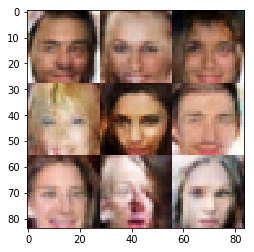

Epoch 4/20... Discriminator Loss: 1.1687... Generator Loss: 0.5431
Epoch 4/20... Discriminator Loss: 1.0272... Generator Loss: 0.7969
Epoch 4/20... Discriminator Loss: 0.7424... Generator Loss: 1.1124
Epoch 4/20... Discriminator Loss: 0.9616... Generator Loss: 1.4900
Epoch 4/20... Discriminator Loss: 0.8898... Generator Loss: 1.2059
Epoch 4/20... Discriminator Loss: 1.1870... Generator Loss: 0.5241
Epoch 4/20... Discriminator Loss: 0.8164... Generator Loss: 1.0782
Epoch 4/20... Discriminator Loss: 0.8896... Generator Loss: 1.2580
Epoch 4/20... Discriminator Loss: 0.8646... Generator Loss: 1.3580
Epoch 4/20... Discriminator Loss: 0.8859... Generator Loss: 1.2491


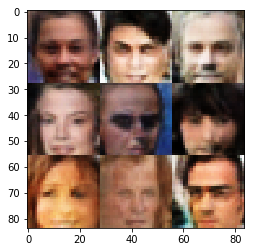

Epoch 4/20... Discriminator Loss: 0.8976... Generator Loss: 0.8908
Epoch 4/20... Discriminator Loss: 0.8499... Generator Loss: 1.3196
Epoch 4/20... Discriminator Loss: 0.7156... Generator Loss: 1.3794
Epoch 4/20... Discriminator Loss: 0.9193... Generator Loss: 1.3188
Epoch 4/20... Discriminator Loss: 1.6944... Generator Loss: 0.2883
Epoch 4/20... Discriminator Loss: 1.2043... Generator Loss: 0.5062
Epoch 4/20... Discriminator Loss: 1.0246... Generator Loss: 0.8431
Epoch 4/20... Discriminator Loss: 0.8876... Generator Loss: 0.9989
Epoch 4/20... Discriminator Loss: 1.2151... Generator Loss: 0.5067
Epoch 4/20... Discriminator Loss: 0.7753... Generator Loss: 1.0909


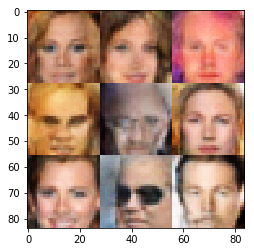

Epoch 4/20... Discriminator Loss: 1.0322... Generator Loss: 0.6834
Epoch 4/20... Discriminator Loss: 1.4040... Generator Loss: 0.3741
Epoch 5/20... Discriminator Loss: 1.0904... Generator Loss: 0.6809
Epoch 5/20... Discriminator Loss: 0.9292... Generator Loss: 0.8261
Epoch 5/20... Discriminator Loss: 1.3134... Generator Loss: 0.4946
Epoch 5/20... Discriminator Loss: 1.2408... Generator Loss: 0.4915
Epoch 5/20... Discriminator Loss: 0.9173... Generator Loss: 0.8449
Epoch 5/20... Discriminator Loss: 0.8995... Generator Loss: 0.8308
Epoch 5/20... Discriminator Loss: 1.1696... Generator Loss: 0.5858
Epoch 5/20... Discriminator Loss: 0.8267... Generator Loss: 1.3639


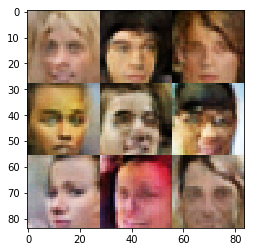

Epoch 5/20... Discriminator Loss: 1.2309... Generator Loss: 0.5277
Epoch 5/20... Discriminator Loss: 1.0270... Generator Loss: 1.0449
Epoch 5/20... Discriminator Loss: 1.0068... Generator Loss: 1.2324
Epoch 5/20... Discriminator Loss: 1.1191... Generator Loss: 0.6593
Epoch 5/20... Discriminator Loss: 1.1997... Generator Loss: 2.4181
Epoch 5/20... Discriminator Loss: 1.0716... Generator Loss: 0.7333
Epoch 5/20... Discriminator Loss: 0.9371... Generator Loss: 0.6872
Epoch 5/20... Discriminator Loss: 0.8104... Generator Loss: 1.4764
Epoch 5/20... Discriminator Loss: 1.3138... Generator Loss: 0.4872
Epoch 5/20... Discriminator Loss: 0.8159... Generator Loss: 1.1590


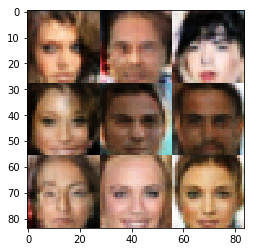

Epoch 5/20... Discriminator Loss: 1.1524... Generator Loss: 0.5347
Epoch 5/20... Discriminator Loss: 0.8906... Generator Loss: 0.8458
Epoch 5/20... Discriminator Loss: 1.1226... Generator Loss: 0.6097
Epoch 5/20... Discriminator Loss: 0.8782... Generator Loss: 0.9566
Epoch 5/20... Discriminator Loss: 1.5321... Generator Loss: 0.3475
Epoch 5/20... Discriminator Loss: 1.2019... Generator Loss: 0.5485
Epoch 5/20... Discriminator Loss: 1.1170... Generator Loss: 0.7082
Epoch 5/20... Discriminator Loss: 0.7728... Generator Loss: 1.0814
Epoch 5/20... Discriminator Loss: 0.8720... Generator Loss: 0.8840
Epoch 5/20... Discriminator Loss: 1.0288... Generator Loss: 0.6391


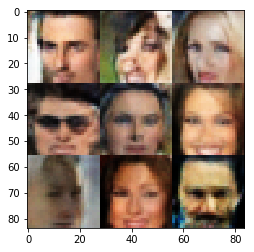

Epoch 5/20... Discriminator Loss: 0.8986... Generator Loss: 1.0907
Epoch 5/20... Discriminator Loss: 0.8154... Generator Loss: 1.1125
Epoch 5/20... Discriminator Loss: 1.2081... Generator Loss: 0.5355
Epoch 5/20... Discriminator Loss: 0.9633... Generator Loss: 0.6739
Epoch 5/20... Discriminator Loss: 0.8472... Generator Loss: 1.0327
Epoch 5/20... Discriminator Loss: 0.7762... Generator Loss: 1.4606
Epoch 5/20... Discriminator Loss: 1.0798... Generator Loss: 0.6192
Epoch 5/20... Discriminator Loss: 1.4143... Generator Loss: 0.3853
Epoch 5/20... Discriminator Loss: 1.1044... Generator Loss: 0.8078
Epoch 5/20... Discriminator Loss: 1.1314... Generator Loss: 1.0430


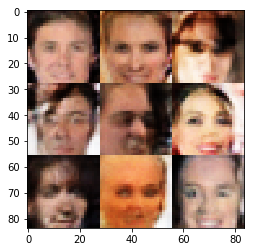

Epoch 5/20... Discriminator Loss: 0.8282... Generator Loss: 1.2663
Epoch 5/20... Discriminator Loss: 1.5061... Generator Loss: 0.4925
Epoch 5/20... Discriminator Loss: 0.8699... Generator Loss: 1.4480
Epoch 5/20... Discriminator Loss: 0.9221... Generator Loss: 0.8899
Epoch 5/20... Discriminator Loss: 0.9529... Generator Loss: 0.7840
Epoch 5/20... Discriminator Loss: 1.6423... Generator Loss: 0.2870
Epoch 5/20... Discriminator Loss: 1.1025... Generator Loss: 1.3940
Epoch 5/20... Discriminator Loss: 1.0628... Generator Loss: 0.6943
Epoch 5/20... Discriminator Loss: 1.1394... Generator Loss: 0.5676
Epoch 5/20... Discriminator Loss: 1.0792... Generator Loss: 0.6202


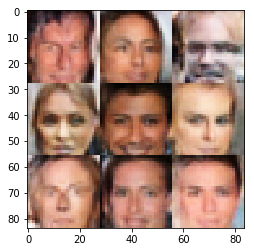

Epoch 5/20... Discriminator Loss: 1.0251... Generator Loss: 1.7390
Epoch 5/20... Discriminator Loss: 1.0616... Generator Loss: 0.8472
Epoch 5/20... Discriminator Loss: 1.0515... Generator Loss: 0.6206
Epoch 5/20... Discriminator Loss: 1.1505... Generator Loss: 0.6336
Epoch 5/20... Discriminator Loss: 0.9376... Generator Loss: 2.0716
Epoch 5/20... Discriminator Loss: 0.8842... Generator Loss: 1.1518
Epoch 5/20... Discriminator Loss: 0.8366... Generator Loss: 0.9047
Epoch 5/20... Discriminator Loss: 0.8121... Generator Loss: 1.1359
Epoch 5/20... Discriminator Loss: 1.0284... Generator Loss: 0.7602
Epoch 5/20... Discriminator Loss: 0.9722... Generator Loss: 0.9149


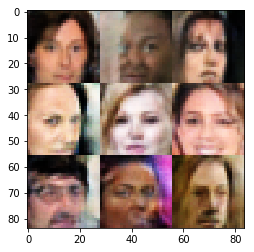

Epoch 5/20... Discriminator Loss: 0.7987... Generator Loss: 1.0440
Epoch 5/20... Discriminator Loss: 1.0440... Generator Loss: 0.7218
Epoch 5/20... Discriminator Loss: 0.7418... Generator Loss: 1.1104
Epoch 5/20... Discriminator Loss: 0.9664... Generator Loss: 0.9884
Epoch 5/20... Discriminator Loss: 0.6684... Generator Loss: 1.6198
Epoch 5/20... Discriminator Loss: 1.1402... Generator Loss: 0.5680
Epoch 5/20... Discriminator Loss: 0.8946... Generator Loss: 1.3661
Epoch 5/20... Discriminator Loss: 1.0754... Generator Loss: 0.6964
Epoch 5/20... Discriminator Loss: 1.0405... Generator Loss: 0.7184
Epoch 5/20... Discriminator Loss: 1.0014... Generator Loss: 1.4022


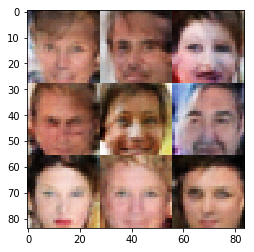

Epoch 5/20... Discriminator Loss: 1.0540... Generator Loss: 1.2092
Epoch 5/20... Discriminator Loss: 1.4739... Generator Loss: 0.3621
Epoch 5/20... Discriminator Loss: 1.0512... Generator Loss: 1.5406
Epoch 5/20... Discriminator Loss: 1.0503... Generator Loss: 0.6377
Epoch 5/20... Discriminator Loss: 0.9050... Generator Loss: 1.4086
Epoch 5/20... Discriminator Loss: 0.8228... Generator Loss: 0.9229
Epoch 5/20... Discriminator Loss: 1.0186... Generator Loss: 0.7075
Epoch 5/20... Discriminator Loss: 1.2561... Generator Loss: 0.5689
Epoch 5/20... Discriminator Loss: 0.9640... Generator Loss: 1.0286
Epoch 5/20... Discriminator Loss: 0.8309... Generator Loss: 1.6287


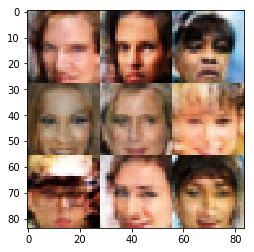

Epoch 5/20... Discriminator Loss: 0.7251... Generator Loss: 1.5881
Epoch 5/20... Discriminator Loss: 0.8440... Generator Loss: 0.9178
Epoch 5/20... Discriminator Loss: 1.5139... Generator Loss: 0.4232
Epoch 5/20... Discriminator Loss: 0.9015... Generator Loss: 0.8859
Epoch 5/20... Discriminator Loss: 1.0036... Generator Loss: 0.7168
Epoch 5/20... Discriminator Loss: 0.9678... Generator Loss: 1.1416
Epoch 5/20... Discriminator Loss: 1.0402... Generator Loss: 0.7324
Epoch 5/20... Discriminator Loss: 0.8303... Generator Loss: 1.0435
Epoch 5/20... Discriminator Loss: 1.0200... Generator Loss: 0.6519
Epoch 5/20... Discriminator Loss: 1.0178... Generator Loss: 0.7905


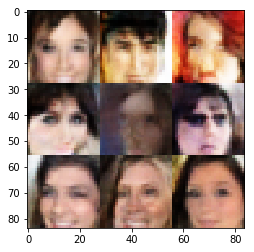

Epoch 5/20... Discriminator Loss: 1.1923... Generator Loss: 0.5399
Epoch 5/20... Discriminator Loss: 0.8839... Generator Loss: 1.2849
Epoch 5/20... Discriminator Loss: 0.9997... Generator Loss: 0.8626
Epoch 5/20... Discriminator Loss: 1.0712... Generator Loss: 0.5964
Epoch 5/20... Discriminator Loss: 1.1138... Generator Loss: 1.5269
Epoch 5/20... Discriminator Loss: 1.4541... Generator Loss: 0.4040
Epoch 5/20... Discriminator Loss: 0.9997... Generator Loss: 0.6547
Epoch 5/20... Discriminator Loss: 1.1398... Generator Loss: 1.2010
Epoch 5/20... Discriminator Loss: 0.9673... Generator Loss: 1.6067
Epoch 5/20... Discriminator Loss: 0.9179... Generator Loss: 0.8212


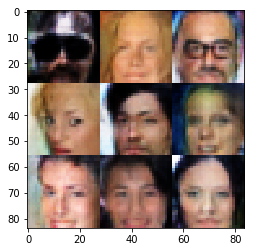

Epoch 5/20... Discriminator Loss: 1.1553... Generator Loss: 0.5558
Epoch 5/20... Discriminator Loss: 0.9597... Generator Loss: 2.0945
Epoch 5/20... Discriminator Loss: 0.8507... Generator Loss: 1.3143
Epoch 5/20... Discriminator Loss: 1.0278... Generator Loss: 0.6558
Epoch 5/20... Discriminator Loss: 0.7184... Generator Loss: 1.3338
Epoch 5/20... Discriminator Loss: 0.9337... Generator Loss: 0.8141
Epoch 5/20... Discriminator Loss: 1.0021... Generator Loss: 0.8550
Epoch 5/20... Discriminator Loss: 0.8374... Generator Loss: 0.9637
Epoch 5/20... Discriminator Loss: 0.8202... Generator Loss: 1.9631
Epoch 5/20... Discriminator Loss: 0.8458... Generator Loss: 1.2570


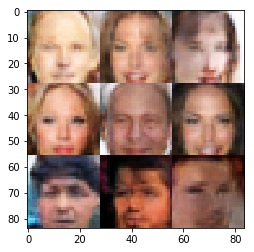

Epoch 5/20... Discriminator Loss: 0.8445... Generator Loss: 1.7901
Epoch 5/20... Discriminator Loss: 0.9281... Generator Loss: 1.5536
Epoch 5/20... Discriminator Loss: 1.0142... Generator Loss: 0.6452
Epoch 5/20... Discriminator Loss: 1.0164... Generator Loss: 0.7431
Epoch 5/20... Discriminator Loss: 1.2898... Generator Loss: 0.4948
Epoch 5/20... Discriminator Loss: 0.8760... Generator Loss: 1.1375
Epoch 5/20... Discriminator Loss: 0.8490... Generator Loss: 1.0050
Epoch 5/20... Discriminator Loss: 0.9324... Generator Loss: 1.6551
Epoch 5/20... Discriminator Loss: 1.3725... Generator Loss: 1.6666
Epoch 5/20... Discriminator Loss: 1.1769... Generator Loss: 0.5108


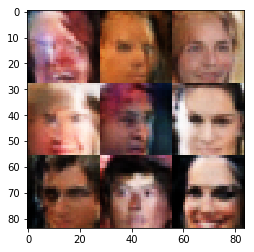

Epoch 5/20... Discriminator Loss: 0.8420... Generator Loss: 1.1181
Epoch 5/20... Discriminator Loss: 0.9693... Generator Loss: 1.0993
Epoch 5/20... Discriminator Loss: 1.0078... Generator Loss: 0.8879
Epoch 5/20... Discriminator Loss: 0.8401... Generator Loss: 1.4484
Epoch 5/20... Discriminator Loss: 1.1067... Generator Loss: 0.7764
Epoch 5/20... Discriminator Loss: 1.0903... Generator Loss: 0.6898
Epoch 5/20... Discriminator Loss: 1.3635... Generator Loss: 0.4328
Epoch 5/20... Discriminator Loss: 1.2846... Generator Loss: 0.4988
Epoch 5/20... Discriminator Loss: 0.9477... Generator Loss: 1.1154
Epoch 5/20... Discriminator Loss: 1.0950... Generator Loss: 0.6834


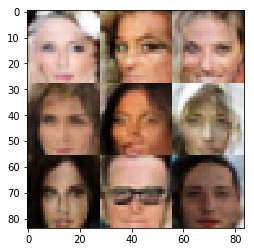

Epoch 5/20... Discriminator Loss: 1.0485... Generator Loss: 0.6663
Epoch 5/20... Discriminator Loss: 0.8464... Generator Loss: 1.2932
Epoch 5/20... Discriminator Loss: 0.9758... Generator Loss: 0.8723
Epoch 5/20... Discriminator Loss: 0.9049... Generator Loss: 0.9530
Epoch 5/20... Discriminator Loss: 0.7531... Generator Loss: 1.0332
Epoch 5/20... Discriminator Loss: 1.3782... Generator Loss: 0.3838
Epoch 5/20... Discriminator Loss: 1.0721... Generator Loss: 1.0979
Epoch 5/20... Discriminator Loss: 0.9790... Generator Loss: 0.7248
Epoch 5/20... Discriminator Loss: 0.9841... Generator Loss: 0.6431
Epoch 5/20... Discriminator Loss: 0.9322... Generator Loss: 0.8938


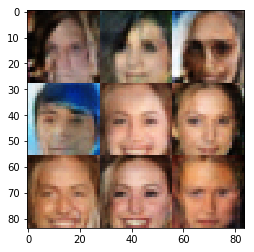

Epoch 5/20... Discriminator Loss: 1.2528... Generator Loss: 0.4857
Epoch 5/20... Discriminator Loss: 0.9348... Generator Loss: 1.6991
Epoch 5/20... Discriminator Loss: 1.0605... Generator Loss: 0.6459
Epoch 5/20... Discriminator Loss: 0.9397... Generator Loss: 0.7712
Epoch 5/20... Discriminator Loss: 0.9987... Generator Loss: 1.0352
Epoch 5/20... Discriminator Loss: 0.6871... Generator Loss: 1.4356
Epoch 5/20... Discriminator Loss: 1.3695... Generator Loss: 0.4119
Epoch 5/20... Discriminator Loss: 0.9291... Generator Loss: 0.8919
Epoch 5/20... Discriminator Loss: 1.1213... Generator Loss: 0.5690
Epoch 5/20... Discriminator Loss: 0.7796... Generator Loss: 1.3720


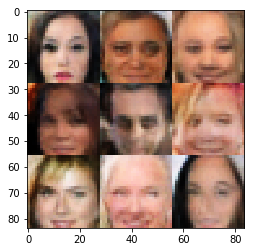

Epoch 5/20... Discriminator Loss: 1.0185... Generator Loss: 0.8511
Epoch 5/20... Discriminator Loss: 0.9177... Generator Loss: 1.0202
Epoch 5/20... Discriminator Loss: 0.8738... Generator Loss: 1.1987
Epoch 5/20... Discriminator Loss: 1.4272... Generator Loss: 0.4263
Epoch 5/20... Discriminator Loss: 1.2095... Generator Loss: 0.5745
Epoch 5/20... Discriminator Loss: 1.0889... Generator Loss: 1.3302
Epoch 5/20... Discriminator Loss: 1.1344... Generator Loss: 0.5701
Epoch 5/20... Discriminator Loss: 0.8334... Generator Loss: 1.1483
Epoch 5/20... Discriminator Loss: 1.0398... Generator Loss: 0.6038
Epoch 5/20... Discriminator Loss: 0.8598... Generator Loss: 0.9617


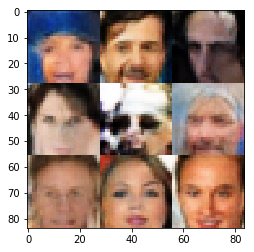

Epoch 5/20... Discriminator Loss: 0.7998... Generator Loss: 0.9971
Epoch 6/20... Discriminator Loss: 1.1352... Generator Loss: 0.5683
Epoch 6/20... Discriminator Loss: 1.0047... Generator Loss: 1.3831
Epoch 6/20... Discriminator Loss: 1.2921... Generator Loss: 1.9578
Epoch 6/20... Discriminator Loss: 1.1313... Generator Loss: 0.8405
Epoch 6/20... Discriminator Loss: 0.8294... Generator Loss: 1.0170
Epoch 6/20... Discriminator Loss: 1.1391... Generator Loss: 0.6349
Epoch 6/20... Discriminator Loss: 1.0824... Generator Loss: 0.5888
Epoch 6/20... Discriminator Loss: 1.2902... Generator Loss: 0.6121
Epoch 6/20... Discriminator Loss: 1.0365... Generator Loss: 0.8278


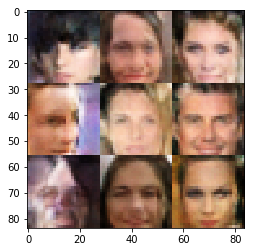

Epoch 6/20... Discriminator Loss: 0.9723... Generator Loss: 0.7156
Epoch 6/20... Discriminator Loss: 1.1187... Generator Loss: 0.5664
Epoch 6/20... Discriminator Loss: 0.9939... Generator Loss: 0.9722
Epoch 6/20... Discriminator Loss: 0.7470... Generator Loss: 1.1730
Epoch 6/20... Discriminator Loss: 1.7384... Generator Loss: 0.2562
Epoch 6/20... Discriminator Loss: 1.3972... Generator Loss: 0.3729
Epoch 6/20... Discriminator Loss: 1.0901... Generator Loss: 1.3801
Epoch 6/20... Discriminator Loss: 1.0662... Generator Loss: 0.6557
Epoch 6/20... Discriminator Loss: 0.8642... Generator Loss: 0.8588
Epoch 6/20... Discriminator Loss: 0.8074... Generator Loss: 1.6642


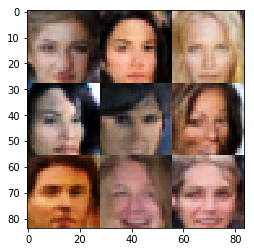

Epoch 6/20... Discriminator Loss: 1.0085... Generator Loss: 0.6966
Epoch 6/20... Discriminator Loss: 0.9116... Generator Loss: 1.0503
Epoch 6/20... Discriminator Loss: 0.8933... Generator Loss: 1.0598
Epoch 6/20... Discriminator Loss: 0.9222... Generator Loss: 1.0826
Epoch 6/20... Discriminator Loss: 1.0128... Generator Loss: 0.6906
Epoch 6/20... Discriminator Loss: 0.9322... Generator Loss: 0.8190
Epoch 6/20... Discriminator Loss: 0.9745... Generator Loss: 0.8838
Epoch 6/20... Discriminator Loss: 1.7290... Generator Loss: 0.2548
Epoch 6/20... Discriminator Loss: 1.1825... Generator Loss: 0.5201
Epoch 6/20... Discriminator Loss: 1.0706... Generator Loss: 1.5198


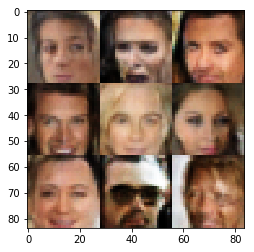

Epoch 6/20... Discriminator Loss: 1.2267... Generator Loss: 0.4657
Epoch 6/20... Discriminator Loss: 1.2814... Generator Loss: 0.4642
Epoch 6/20... Discriminator Loss: 0.8674... Generator Loss: 1.0357
Epoch 6/20... Discriminator Loss: 0.9188... Generator Loss: 1.3287
Epoch 6/20... Discriminator Loss: 0.9933... Generator Loss: 0.7147
Epoch 6/20... Discriminator Loss: 1.0069... Generator Loss: 0.7806
Epoch 6/20... Discriminator Loss: 0.7424... Generator Loss: 1.7829
Epoch 6/20... Discriminator Loss: 0.9994... Generator Loss: 0.7570
Epoch 6/20... Discriminator Loss: 1.1839... Generator Loss: 1.4600
Epoch 6/20... Discriminator Loss: 1.5864... Generator Loss: 0.3145


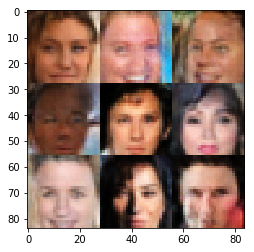

Epoch 6/20... Discriminator Loss: 0.8894... Generator Loss: 0.9159
Epoch 6/20... Discriminator Loss: 0.8118... Generator Loss: 1.0371
Epoch 6/20... Discriminator Loss: 0.9582... Generator Loss: 0.7697
Epoch 6/20... Discriminator Loss: 1.1141... Generator Loss: 2.0496
Epoch 6/20... Discriminator Loss: 0.7447... Generator Loss: 1.0609
Epoch 6/20... Discriminator Loss: 0.8863... Generator Loss: 0.9124
Epoch 6/20... Discriminator Loss: 1.1789... Generator Loss: 2.2785
Epoch 6/20... Discriminator Loss: 1.2901... Generator Loss: 0.4573
Epoch 6/20... Discriminator Loss: 0.9523... Generator Loss: 0.7825
Epoch 6/20... Discriminator Loss: 1.2716... Generator Loss: 0.4600


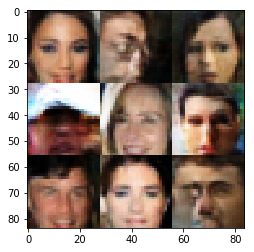

Epoch 6/20... Discriminator Loss: 1.5936... Generator Loss: 0.3173
Epoch 6/20... Discriminator Loss: 0.6868... Generator Loss: 1.1417
Epoch 6/20... Discriminator Loss: 1.0975... Generator Loss: 0.6373
Epoch 6/20... Discriminator Loss: 1.0761... Generator Loss: 0.7792
Epoch 6/20... Discriminator Loss: 0.8325... Generator Loss: 1.9959
Epoch 6/20... Discriminator Loss: 0.9377... Generator Loss: 1.4112
Epoch 6/20... Discriminator Loss: 0.9389... Generator Loss: 1.1721
Epoch 6/20... Discriminator Loss: 1.0666... Generator Loss: 0.5894
Epoch 6/20... Discriminator Loss: 0.9798... Generator Loss: 0.8615
Epoch 6/20... Discriminator Loss: 1.5576... Generator Loss: 0.3126


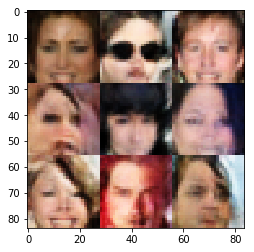

Epoch 6/20... Discriminator Loss: 1.0045... Generator Loss: 0.7909
Epoch 6/20... Discriminator Loss: 1.0057... Generator Loss: 0.7864
Epoch 6/20... Discriminator Loss: 1.0230... Generator Loss: 0.9080
Epoch 6/20... Discriminator Loss: 0.8139... Generator Loss: 1.5512
Epoch 6/20... Discriminator Loss: 1.0423... Generator Loss: 0.7105
Epoch 6/20... Discriminator Loss: 0.9239... Generator Loss: 0.8204
Epoch 6/20... Discriminator Loss: 0.8503... Generator Loss: 1.2122
Epoch 6/20... Discriminator Loss: 0.9338... Generator Loss: 0.8478
Epoch 6/20... Discriminator Loss: 0.8248... Generator Loss: 0.9161
Epoch 6/20... Discriminator Loss: 0.8710... Generator Loss: 1.4991


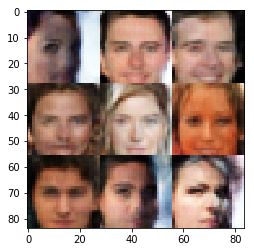

Epoch 6/20... Discriminator Loss: 0.8487... Generator Loss: 1.0799
Epoch 6/20... Discriminator Loss: 0.9065... Generator Loss: 0.9401
Epoch 6/20... Discriminator Loss: 0.8640... Generator Loss: 1.6733
Epoch 6/20... Discriminator Loss: 1.4522... Generator Loss: 0.3590
Epoch 6/20... Discriminator Loss: 1.0224... Generator Loss: 1.0538
Epoch 6/20... Discriminator Loss: 0.7423... Generator Loss: 1.1477
Epoch 6/20... Discriminator Loss: 1.1268... Generator Loss: 0.8722
Epoch 6/20... Discriminator Loss: 0.9793... Generator Loss: 1.4166
Epoch 6/20... Discriminator Loss: 1.1406... Generator Loss: 0.6231
Epoch 6/20... Discriminator Loss: 1.1960... Generator Loss: 0.5180


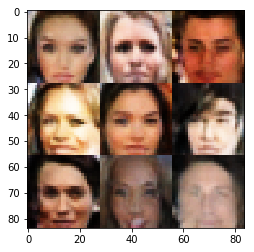

Epoch 6/20... Discriminator Loss: 0.9066... Generator Loss: 1.3811
Epoch 6/20... Discriminator Loss: 1.1914... Generator Loss: 0.5057
Epoch 6/20... Discriminator Loss: 1.0084... Generator Loss: 2.0091
Epoch 6/20... Discriminator Loss: 0.9938... Generator Loss: 0.7506
Epoch 6/20... Discriminator Loss: 0.8506... Generator Loss: 1.0442
Epoch 6/20... Discriminator Loss: 1.0163... Generator Loss: 0.6601
Epoch 6/20... Discriminator Loss: 1.2485... Generator Loss: 0.4641
Epoch 6/20... Discriminator Loss: 1.0020... Generator Loss: 0.8138
Epoch 6/20... Discriminator Loss: 0.9151... Generator Loss: 1.3845
Epoch 6/20... Discriminator Loss: 0.8094... Generator Loss: 1.1058


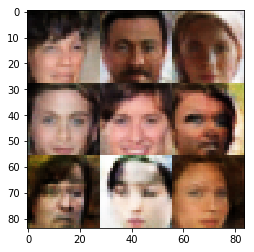

Epoch 6/20... Discriminator Loss: 0.9508... Generator Loss: 0.9656
Epoch 6/20... Discriminator Loss: 0.7709... Generator Loss: 1.1086
Epoch 6/20... Discriminator Loss: 0.8856... Generator Loss: 2.6607
Epoch 6/20... Discriminator Loss: 1.1017... Generator Loss: 0.7070
Epoch 6/20... Discriminator Loss: 0.8810... Generator Loss: 1.1791
Epoch 6/20... Discriminator Loss: 0.8878... Generator Loss: 0.9670
Epoch 6/20... Discriminator Loss: 1.3050... Generator Loss: 0.4245
Epoch 6/20... Discriminator Loss: 0.8505... Generator Loss: 0.9185
Epoch 6/20... Discriminator Loss: 0.9535... Generator Loss: 0.7144
Epoch 6/20... Discriminator Loss: 0.7080... Generator Loss: 1.3562


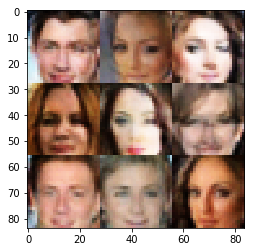

Epoch 6/20... Discriminator Loss: 0.8053... Generator Loss: 1.1119
Epoch 6/20... Discriminator Loss: 0.9479... Generator Loss: 0.7402
Epoch 6/20... Discriminator Loss: 0.9928... Generator Loss: 0.7999
Epoch 6/20... Discriminator Loss: 0.9891... Generator Loss: 0.8586
Epoch 6/20... Discriminator Loss: 0.8265... Generator Loss: 1.3689
Epoch 6/20... Discriminator Loss: 1.2718... Generator Loss: 0.4600
Epoch 6/20... Discriminator Loss: 1.0910... Generator Loss: 0.6648
Epoch 6/20... Discriminator Loss: 0.9783... Generator Loss: 1.2342
Epoch 6/20... Discriminator Loss: 0.8513... Generator Loss: 0.8936
Epoch 6/20... Discriminator Loss: 1.1302... Generator Loss: 0.5760


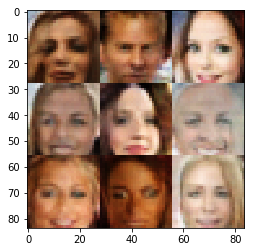

Epoch 6/20... Discriminator Loss: 1.0265... Generator Loss: 0.6287
Epoch 6/20... Discriminator Loss: 0.9408... Generator Loss: 1.0468
Epoch 6/20... Discriminator Loss: 1.0241... Generator Loss: 0.8882
Epoch 6/20... Discriminator Loss: 0.9517... Generator Loss: 1.0586
Epoch 6/20... Discriminator Loss: 0.7363... Generator Loss: 1.1112
Epoch 6/20... Discriminator Loss: 0.7944... Generator Loss: 1.4643
Epoch 6/20... Discriminator Loss: 0.8207... Generator Loss: 1.3234
Epoch 6/20... Discriminator Loss: 0.9128... Generator Loss: 0.9320
Epoch 6/20... Discriminator Loss: 0.9164... Generator Loss: 0.7278
Epoch 6/20... Discriminator Loss: 1.1449... Generator Loss: 0.6017


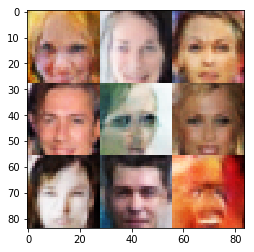

Epoch 6/20... Discriminator Loss: 1.0125... Generator Loss: 0.8487
Epoch 6/20... Discriminator Loss: 0.8172... Generator Loss: 1.0944
Epoch 6/20... Discriminator Loss: 1.4243... Generator Loss: 0.3754
Epoch 6/20... Discriminator Loss: 0.8100... Generator Loss: 1.2726
Epoch 6/20... Discriminator Loss: 0.8146... Generator Loss: 0.8337
Epoch 6/20... Discriminator Loss: 1.0055... Generator Loss: 1.1081
Epoch 6/20... Discriminator Loss: 0.9602... Generator Loss: 0.8569
Epoch 6/20... Discriminator Loss: 0.9404... Generator Loss: 0.7595
Epoch 6/20... Discriminator Loss: 1.1160... Generator Loss: 1.4772
Epoch 6/20... Discriminator Loss: 1.0153... Generator Loss: 0.7844


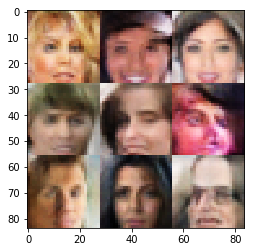

Epoch 6/20... Discriminator Loss: 0.7477... Generator Loss: 0.9157
Epoch 6/20... Discriminator Loss: 0.8201... Generator Loss: 1.2007
Epoch 6/20... Discriminator Loss: 0.8475... Generator Loss: 0.9315
Epoch 6/20... Discriminator Loss: 1.3877... Generator Loss: 0.3869
Epoch 6/20... Discriminator Loss: 0.8371... Generator Loss: 0.9292
Epoch 6/20... Discriminator Loss: 1.7259... Generator Loss: 0.2515
Epoch 6/20... Discriminator Loss: 0.8555... Generator Loss: 0.9776
Epoch 6/20... Discriminator Loss: 0.6979... Generator Loss: 1.3278
Epoch 6/20... Discriminator Loss: 1.1398... Generator Loss: 0.7593
Epoch 6/20... Discriminator Loss: 0.9320... Generator Loss: 0.7109


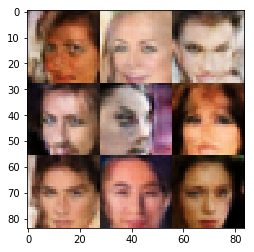

Epoch 6/20... Discriminator Loss: 0.9202... Generator Loss: 1.1650
Epoch 6/20... Discriminator Loss: 0.7805... Generator Loss: 1.2604
Epoch 6/20... Discriminator Loss: 1.1705... Generator Loss: 0.9338
Epoch 6/20... Discriminator Loss: 1.3618... Generator Loss: 0.4026
Epoch 6/20... Discriminator Loss: 1.1173... Generator Loss: 1.6084
Epoch 6/20... Discriminator Loss: 1.0495... Generator Loss: 0.6237
Epoch 6/20... Discriminator Loss: 1.1898... Generator Loss: 2.3779
Epoch 6/20... Discriminator Loss: 0.8392... Generator Loss: 1.5697
Epoch 6/20... Discriminator Loss: 1.3007... Generator Loss: 0.4290
Epoch 6/20... Discriminator Loss: 1.3750... Generator Loss: 0.4003


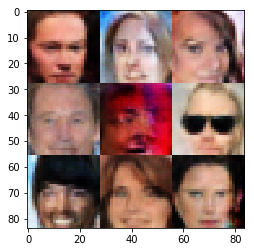

Epoch 6/20... Discriminator Loss: 0.7438... Generator Loss: 1.2168
Epoch 6/20... Discriminator Loss: 0.9213... Generator Loss: 0.8817
Epoch 6/20... Discriminator Loss: 0.9610... Generator Loss: 1.2974
Epoch 6/20... Discriminator Loss: 0.8605... Generator Loss: 0.9917
Epoch 6/20... Discriminator Loss: 0.8665... Generator Loss: 0.9220
Epoch 6/20... Discriminator Loss: 1.0776... Generator Loss: 0.7818
Epoch 6/20... Discriminator Loss: 1.0315... Generator Loss: 0.7249
Epoch 6/20... Discriminator Loss: 1.0924... Generator Loss: 0.6622
Epoch 6/20... Discriminator Loss: 0.8760... Generator Loss: 1.1610
Epoch 7/20... Discriminator Loss: 1.0557... Generator Loss: 0.6606


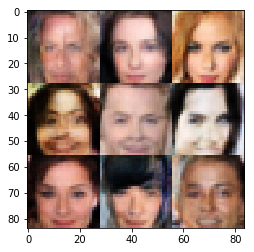

Epoch 7/20... Discriminator Loss: 0.6805... Generator Loss: 1.2177
Epoch 7/20... Discriminator Loss: 1.1811... Generator Loss: 0.6344
Epoch 7/20... Discriminator Loss: 0.8824... Generator Loss: 0.8333
Epoch 7/20... Discriminator Loss: 0.7584... Generator Loss: 1.3289
Epoch 7/20... Discriminator Loss: 0.7598... Generator Loss: 2.4272
Epoch 7/20... Discriminator Loss: 0.8072... Generator Loss: 1.3220
Epoch 7/20... Discriminator Loss: 0.7880... Generator Loss: 1.4786
Epoch 7/20... Discriminator Loss: 0.9158... Generator Loss: 0.8934
Epoch 7/20... Discriminator Loss: 0.8388... Generator Loss: 1.6995
Epoch 7/20... Discriminator Loss: 1.1610... Generator Loss: 1.8468


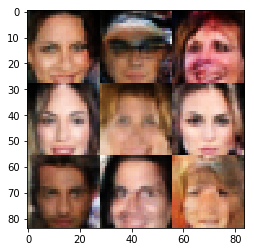

Epoch 7/20... Discriminator Loss: 1.1393... Generator Loss: 0.7150
Epoch 7/20... Discriminator Loss: 0.8974... Generator Loss: 1.4352
Epoch 7/20... Discriminator Loss: 0.9919... Generator Loss: 1.5355
Epoch 7/20... Discriminator Loss: 1.0161... Generator Loss: 1.6437
Epoch 7/20... Discriminator Loss: 0.9651... Generator Loss: 0.7969
Epoch 7/20... Discriminator Loss: 1.0442... Generator Loss: 0.9354
Epoch 7/20... Discriminator Loss: 1.0798... Generator Loss: 1.8377
Epoch 7/20... Discriminator Loss: 0.8734... Generator Loss: 0.9952
Epoch 7/20... Discriminator Loss: 1.1392... Generator Loss: 0.6636
Epoch 7/20... Discriminator Loss: 0.6750... Generator Loss: 1.2045


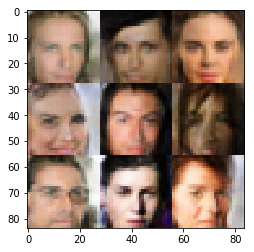

Epoch 7/20... Discriminator Loss: 1.2445... Generator Loss: 0.5244
Epoch 7/20... Discriminator Loss: 0.8500... Generator Loss: 1.3317
Epoch 7/20... Discriminator Loss: 0.7554... Generator Loss: 1.0964
Epoch 7/20... Discriminator Loss: 1.5948... Generator Loss: 2.2114
Epoch 7/20... Discriminator Loss: 0.6996... Generator Loss: 1.1165
Epoch 7/20... Discriminator Loss: 0.6914... Generator Loss: 1.2312
Epoch 7/20... Discriminator Loss: 1.0727... Generator Loss: 0.6274
Epoch 7/20... Discriminator Loss: 0.6855... Generator Loss: 1.6044
Epoch 7/20... Discriminator Loss: 1.1802... Generator Loss: 0.5347
Epoch 7/20... Discriminator Loss: 1.0509... Generator Loss: 0.6328


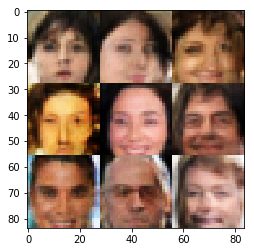

Epoch 7/20... Discriminator Loss: 0.8384... Generator Loss: 0.7841
Epoch 7/20... Discriminator Loss: 0.9757... Generator Loss: 1.1258
Epoch 7/20... Discriminator Loss: 1.1254... Generator Loss: 0.7677
Epoch 7/20... Discriminator Loss: 1.2219... Generator Loss: 0.5216
Epoch 7/20... Discriminator Loss: 1.0550... Generator Loss: 0.6712
Epoch 7/20... Discriminator Loss: 0.7397... Generator Loss: 1.3068
Epoch 7/20... Discriminator Loss: 0.9382... Generator Loss: 1.1029
Epoch 7/20... Discriminator Loss: 1.1824... Generator Loss: 0.5185
Epoch 7/20... Discriminator Loss: 0.9728... Generator Loss: 0.9336
Epoch 7/20... Discriminator Loss: 0.8468... Generator Loss: 1.0628


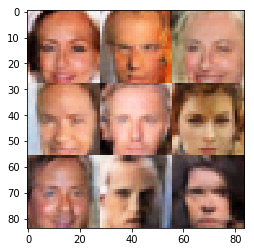

Epoch 7/20... Discriminator Loss: 0.8870... Generator Loss: 0.9574
Epoch 7/20... Discriminator Loss: 0.6856... Generator Loss: 1.4243
Epoch 7/20... Discriminator Loss: 0.8996... Generator Loss: 1.0473
Epoch 7/20... Discriminator Loss: 0.8450... Generator Loss: 1.3930
Epoch 7/20... Discriminator Loss: 0.9074... Generator Loss: 0.9097
Epoch 7/20... Discriminator Loss: 1.0735... Generator Loss: 0.5517
Epoch 7/20... Discriminator Loss: 1.0474... Generator Loss: 0.6325
Epoch 7/20... Discriminator Loss: 0.9078... Generator Loss: 0.8506
Epoch 7/20... Discriminator Loss: 0.7387... Generator Loss: 1.5784
Epoch 7/20... Discriminator Loss: 1.4085... Generator Loss: 0.4211


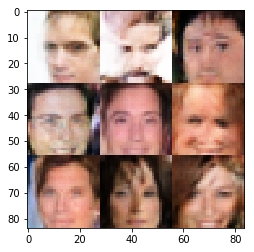

Epoch 7/20... Discriminator Loss: 1.4189... Generator Loss: 0.3583
Epoch 7/20... Discriminator Loss: 0.9179... Generator Loss: 0.8253
Epoch 7/20... Discriminator Loss: 0.7356... Generator Loss: 1.0890
Epoch 7/20... Discriminator Loss: 0.9851... Generator Loss: 0.6704
Epoch 7/20... Discriminator Loss: 0.7782... Generator Loss: 0.8597
Epoch 7/20... Discriminator Loss: 0.8096... Generator Loss: 1.4656
Epoch 7/20... Discriminator Loss: 0.8947... Generator Loss: 0.7122
Epoch 7/20... Discriminator Loss: 1.4281... Generator Loss: 1.7482
Epoch 7/20... Discriminator Loss: 0.9455... Generator Loss: 0.7225
Epoch 7/20... Discriminator Loss: 1.0106... Generator Loss: 1.1380


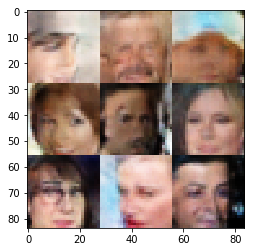

Epoch 7/20... Discriminator Loss: 0.8955... Generator Loss: 1.0270
Epoch 7/20... Discriminator Loss: 1.2281... Generator Loss: 0.5520
Epoch 7/20... Discriminator Loss: 1.4477... Generator Loss: 0.3697
Epoch 7/20... Discriminator Loss: 0.9368... Generator Loss: 1.0929
Epoch 7/20... Discriminator Loss: 0.9840... Generator Loss: 0.8029
Epoch 7/20... Discriminator Loss: 1.3264... Generator Loss: 0.4343
Epoch 7/20... Discriminator Loss: 1.0752... Generator Loss: 0.6241
Epoch 7/20... Discriminator Loss: 0.7082... Generator Loss: 1.1090
Epoch 7/20... Discriminator Loss: 0.7435... Generator Loss: 1.0190
Epoch 7/20... Discriminator Loss: 0.8558... Generator Loss: 0.9471


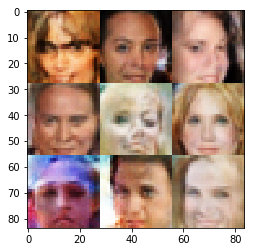

Epoch 7/20... Discriminator Loss: 0.9222... Generator Loss: 1.0009
Epoch 7/20... Discriminator Loss: 0.9679... Generator Loss: 1.8564
Epoch 7/20... Discriminator Loss: 0.9217... Generator Loss: 1.0887
Epoch 7/20... Discriminator Loss: 0.9910... Generator Loss: 0.6946
Epoch 7/20... Discriminator Loss: 0.9908... Generator Loss: 1.1689
Epoch 7/20... Discriminator Loss: 0.9643... Generator Loss: 0.7308
Epoch 7/20... Discriminator Loss: 1.0951... Generator Loss: 0.6616
Epoch 7/20... Discriminator Loss: 0.9501... Generator Loss: 0.9676
Epoch 7/20... Discriminator Loss: 0.7475... Generator Loss: 1.4411
Epoch 7/20... Discriminator Loss: 0.8442... Generator Loss: 0.9882


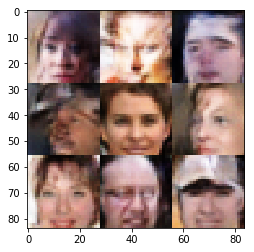

Epoch 7/20... Discriminator Loss: 0.8291... Generator Loss: 0.9021
Epoch 7/20... Discriminator Loss: 1.1399... Generator Loss: 0.6021
Epoch 7/20... Discriminator Loss: 0.9383... Generator Loss: 1.1559
Epoch 7/20... Discriminator Loss: 1.1952... Generator Loss: 0.5327
Epoch 7/20... Discriminator Loss: 1.1895... Generator Loss: 0.6905
Epoch 7/20... Discriminator Loss: 0.7543... Generator Loss: 1.2416
Epoch 7/20... Discriminator Loss: 0.7292... Generator Loss: 1.4784
Epoch 7/20... Discriminator Loss: 1.2538... Generator Loss: 0.4459
Epoch 7/20... Discriminator Loss: 1.0373... Generator Loss: 0.6251
Epoch 7/20... Discriminator Loss: 0.8105... Generator Loss: 0.8733


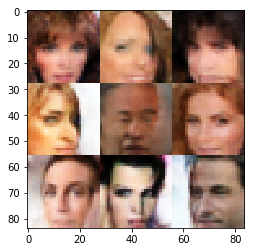

Epoch 7/20... Discriminator Loss: 0.9729... Generator Loss: 1.0376
Epoch 7/20... Discriminator Loss: 1.1475... Generator Loss: 0.7835
Epoch 7/20... Discriminator Loss: 0.8388... Generator Loss: 1.0180
Epoch 7/20... Discriminator Loss: 0.9235... Generator Loss: 0.7966
Epoch 7/20... Discriminator Loss: 1.2166... Generator Loss: 0.5121
Epoch 7/20... Discriminator Loss: 1.1769... Generator Loss: 0.5069
Epoch 7/20... Discriminator Loss: 0.8070... Generator Loss: 0.9695
Epoch 7/20... Discriminator Loss: 0.8439... Generator Loss: 1.0591
Epoch 7/20... Discriminator Loss: 1.2152... Generator Loss: 0.5736
Epoch 7/20... Discriminator Loss: 0.9512... Generator Loss: 1.6347


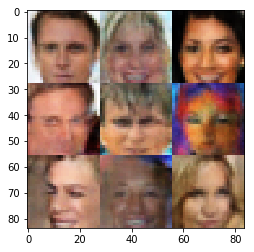

Epoch 7/20... Discriminator Loss: 0.9728... Generator Loss: 1.2524
Epoch 7/20... Discriminator Loss: 1.0873... Generator Loss: 1.3029
Epoch 7/20... Discriminator Loss: 0.9739... Generator Loss: 0.7201
Epoch 7/20... Discriminator Loss: 0.8295... Generator Loss: 0.8845
Epoch 7/20... Discriminator Loss: 1.0964... Generator Loss: 0.6137
Epoch 7/20... Discriminator Loss: 0.7117... Generator Loss: 1.0582
Epoch 7/20... Discriminator Loss: 0.8583... Generator Loss: 1.0804
Epoch 7/20... Discriminator Loss: 0.9332... Generator Loss: 0.7320
Epoch 7/20... Discriminator Loss: 0.9445... Generator Loss: 1.2662
Epoch 7/20... Discriminator Loss: 0.9184... Generator Loss: 1.0214


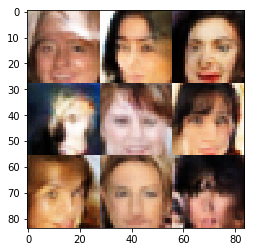

Epoch 7/20... Discriminator Loss: 0.6825... Generator Loss: 1.1053
Epoch 7/20... Discriminator Loss: 0.8481... Generator Loss: 0.9265
Epoch 7/20... Discriminator Loss: 1.2224... Generator Loss: 2.2221
Epoch 7/20... Discriminator Loss: 0.9785... Generator Loss: 0.6590
Epoch 7/20... Discriminator Loss: 0.8282... Generator Loss: 1.0635
Epoch 7/20... Discriminator Loss: 0.8226... Generator Loss: 0.9918
Epoch 7/20... Discriminator Loss: 1.1965... Generator Loss: 0.4995
Epoch 7/20... Discriminator Loss: 1.0136... Generator Loss: 1.1209
Epoch 7/20... Discriminator Loss: 0.8173... Generator Loss: 1.5754
Epoch 7/20... Discriminator Loss: 1.0779... Generator Loss: 0.5923


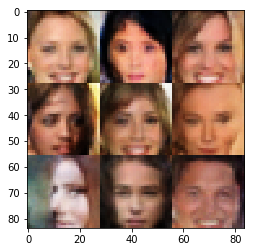

Epoch 7/20... Discriminator Loss: 1.2283... Generator Loss: 0.4732
Epoch 7/20... Discriminator Loss: 1.0446... Generator Loss: 0.6229
Epoch 7/20... Discriminator Loss: 0.9780... Generator Loss: 1.0563
Epoch 7/20... Discriminator Loss: 1.2227... Generator Loss: 2.8206
Epoch 7/20... Discriminator Loss: 1.2020... Generator Loss: 0.5147
Epoch 7/20... Discriminator Loss: 0.6665... Generator Loss: 1.2305
Epoch 7/20... Discriminator Loss: 0.9346... Generator Loss: 0.7843
Epoch 7/20... Discriminator Loss: 1.1366... Generator Loss: 1.3399
Epoch 7/20... Discriminator Loss: 1.4243... Generator Loss: 0.3758
Epoch 7/20... Discriminator Loss: 0.8490... Generator Loss: 1.0388


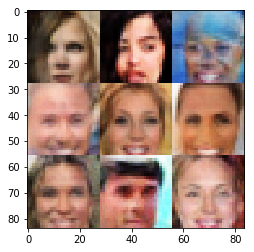

Epoch 7/20... Discriminator Loss: 0.4297... Generator Loss: 1.6602
Epoch 7/20... Discriminator Loss: 0.9135... Generator Loss: 0.8612
Epoch 7/20... Discriminator Loss: 0.8430... Generator Loss: 0.8194
Epoch 7/20... Discriminator Loss: 1.2396... Generator Loss: 0.4814
Epoch 7/20... Discriminator Loss: 0.6954... Generator Loss: 1.7138
Epoch 7/20... Discriminator Loss: 1.0892... Generator Loss: 0.6943
Epoch 7/20... Discriminator Loss: 0.9603... Generator Loss: 0.7173
Epoch 7/20... Discriminator Loss: 0.9788... Generator Loss: 0.7198
Epoch 7/20... Discriminator Loss: 0.9696... Generator Loss: 0.8123
Epoch 7/20... Discriminator Loss: 0.5939... Generator Loss: 1.7117


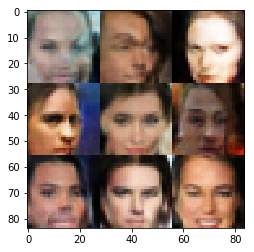

Epoch 7/20... Discriminator Loss: 1.0191... Generator Loss: 0.6301
Epoch 7/20... Discriminator Loss: 1.2875... Generator Loss: 1.4664
Epoch 7/20... Discriminator Loss: 1.1239... Generator Loss: 0.5572
Epoch 7/20... Discriminator Loss: 0.9025... Generator Loss: 1.3830
Epoch 7/20... Discriminator Loss: 1.4841... Generator Loss: 0.3558
Epoch 7/20... Discriminator Loss: 0.8517... Generator Loss: 0.7923
Epoch 7/20... Discriminator Loss: 0.9647... Generator Loss: 0.7666
Epoch 7/20... Discriminator Loss: 1.0274... Generator Loss: 1.0491
Epoch 7/20... Discriminator Loss: 0.9576... Generator Loss: 1.5173
Epoch 7/20... Discriminator Loss: 0.9166... Generator Loss: 1.5768


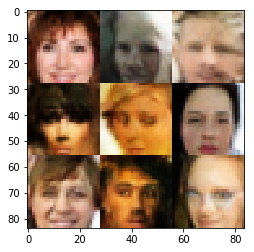

Epoch 7/20... Discriminator Loss: 1.1470... Generator Loss: 2.1910
Epoch 7/20... Discriminator Loss: 0.9691... Generator Loss: 1.7143
Epoch 7/20... Discriminator Loss: 1.1912... Generator Loss: 0.5535
Epoch 7/20... Discriminator Loss: 1.2020... Generator Loss: 1.5646
Epoch 7/20... Discriminator Loss: 0.9641... Generator Loss: 0.8423
Epoch 7/20... Discriminator Loss: 0.9947... Generator Loss: 0.7422
Epoch 7/20... Discriminator Loss: 1.3572... Generator Loss: 0.6863
Epoch 8/20... Discriminator Loss: 0.8586... Generator Loss: 1.1528
Epoch 8/20... Discriminator Loss: 1.2235... Generator Loss: 0.5421
Epoch 8/20... Discriminator Loss: 0.9457... Generator Loss: 0.8718


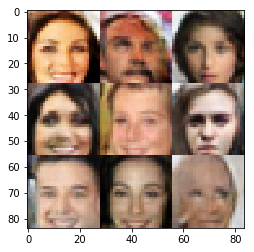

Epoch 8/20... Discriminator Loss: 0.7990... Generator Loss: 0.9344
Epoch 8/20... Discriminator Loss: 0.9303... Generator Loss: 2.0327
Epoch 8/20... Discriminator Loss: 0.6792... Generator Loss: 1.6116
Epoch 8/20... Discriminator Loss: 0.7579... Generator Loss: 1.9219
Epoch 8/20... Discriminator Loss: 0.5982... Generator Loss: 1.2010
Epoch 8/20... Discriminator Loss: 1.0289... Generator Loss: 0.8127
Epoch 8/20... Discriminator Loss: 1.0250... Generator Loss: 0.7936
Epoch 8/20... Discriminator Loss: 0.8987... Generator Loss: 0.8220
Epoch 8/20... Discriminator Loss: 0.8329... Generator Loss: 0.9126
Epoch 8/20... Discriminator Loss: 1.3091... Generator Loss: 0.4244


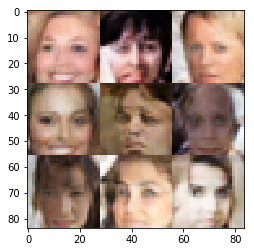

Epoch 8/20... Discriminator Loss: 1.1049... Generator Loss: 0.6486
Epoch 8/20... Discriminator Loss: 1.2026... Generator Loss: 2.1724
Epoch 8/20... Discriminator Loss: 0.9018... Generator Loss: 0.8109
Epoch 8/20... Discriminator Loss: 0.8480... Generator Loss: 1.1164
Epoch 8/20... Discriminator Loss: 0.9213... Generator Loss: 0.7316
Epoch 8/20... Discriminator Loss: 0.9334... Generator Loss: 0.8959
Epoch 8/20... Discriminator Loss: 0.8311... Generator Loss: 1.5848
Epoch 8/20... Discriminator Loss: 0.9265... Generator Loss: 0.8398
Epoch 8/20... Discriminator Loss: 1.1460... Generator Loss: 0.8137
Epoch 8/20... Discriminator Loss: 1.1555... Generator Loss: 1.5845


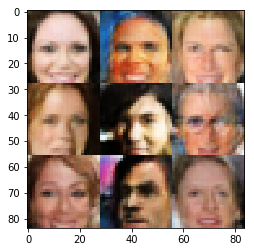

Epoch 8/20... Discriminator Loss: 1.1662... Generator Loss: 0.5282
Epoch 8/20... Discriminator Loss: 0.7446... Generator Loss: 1.2387
Epoch 8/20... Discriminator Loss: 1.0198... Generator Loss: 1.3804
Epoch 8/20... Discriminator Loss: 0.7839... Generator Loss: 0.9702
Epoch 8/20... Discriminator Loss: 1.5771... Generator Loss: 0.3104
Epoch 8/20... Discriminator Loss: 1.4714... Generator Loss: 0.3587
Epoch 8/20... Discriminator Loss: 0.8659... Generator Loss: 1.3417
Epoch 8/20... Discriminator Loss: 0.8610... Generator Loss: 1.2580
Epoch 8/20... Discriminator Loss: 0.7949... Generator Loss: 1.0298
Epoch 8/20... Discriminator Loss: 0.7084... Generator Loss: 1.6840


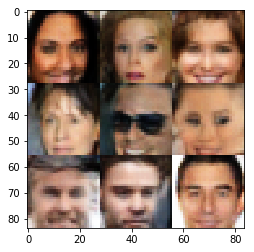

Epoch 8/20... Discriminator Loss: 1.2108... Generator Loss: 0.5662
Epoch 8/20... Discriminator Loss: 1.1370... Generator Loss: 0.5626
Epoch 8/20... Discriminator Loss: 0.9734... Generator Loss: 0.7564
Epoch 8/20... Discriminator Loss: 0.8796... Generator Loss: 1.2568
Epoch 8/20... Discriminator Loss: 1.1927... Generator Loss: 0.5009
Epoch 8/20... Discriminator Loss: 1.0634... Generator Loss: 0.8088
Epoch 8/20... Discriminator Loss: 0.9157... Generator Loss: 1.5776
Epoch 8/20... Discriminator Loss: 0.9177... Generator Loss: 0.8549
Epoch 8/20... Discriminator Loss: 1.4375... Generator Loss: 0.5282
Epoch 8/20... Discriminator Loss: 0.8492... Generator Loss: 1.6823


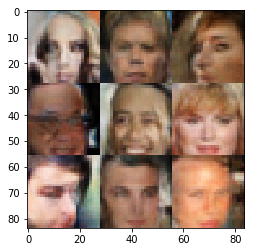

Epoch 8/20... Discriminator Loss: 0.7783... Generator Loss: 0.9647
Epoch 8/20... Discriminator Loss: 0.7782... Generator Loss: 1.1198
Epoch 8/20... Discriminator Loss: 1.0462... Generator Loss: 1.0149
Epoch 8/20... Discriminator Loss: 0.9506... Generator Loss: 1.0715
Epoch 8/20... Discriminator Loss: 0.8244... Generator Loss: 1.1738
Epoch 8/20... Discriminator Loss: 1.1093... Generator Loss: 0.5743
Epoch 8/20... Discriminator Loss: 1.0663... Generator Loss: 0.9358
Epoch 8/20... Discriminator Loss: 1.0844... Generator Loss: 0.7314
Epoch 8/20... Discriminator Loss: 0.9341... Generator Loss: 1.4882
Epoch 8/20... Discriminator Loss: 1.1025... Generator Loss: 0.5442


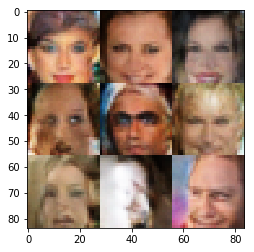

Epoch 8/20... Discriminator Loss: 1.0980... Generator Loss: 1.3635
Epoch 8/20... Discriminator Loss: 0.8881... Generator Loss: 0.9957
Epoch 8/20... Discriminator Loss: 0.7436... Generator Loss: 0.9940
Epoch 8/20... Discriminator Loss: 0.9146... Generator Loss: 1.9907
Epoch 8/20... Discriminator Loss: 0.6267... Generator Loss: 1.3054
Epoch 8/20... Discriminator Loss: 0.8855... Generator Loss: 1.1074
Epoch 8/20... Discriminator Loss: 1.0273... Generator Loss: 1.4520
Epoch 8/20... Discriminator Loss: 1.1155... Generator Loss: 1.3028
Epoch 8/20... Discriminator Loss: 0.7555... Generator Loss: 1.0205
Epoch 8/20... Discriminator Loss: 0.8957... Generator Loss: 1.0836


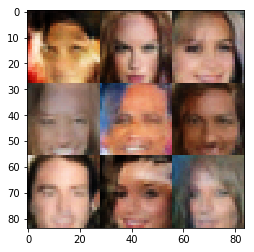

Epoch 8/20... Discriminator Loss: 0.8764... Generator Loss: 0.8584
Epoch 8/20... Discriminator Loss: 1.1333... Generator Loss: 0.6122
Epoch 8/20... Discriminator Loss: 0.8172... Generator Loss: 0.9831
Epoch 8/20... Discriminator Loss: 1.0982... Generator Loss: 1.8064
Epoch 8/20... Discriminator Loss: 0.8662... Generator Loss: 1.0441
Epoch 8/20... Discriminator Loss: 0.9215... Generator Loss: 0.9745
Epoch 8/20... Discriminator Loss: 0.6758... Generator Loss: 1.2168
Epoch 8/20... Discriminator Loss: 0.6249... Generator Loss: 1.1198
Epoch 8/20... Discriminator Loss: 0.8971... Generator Loss: 1.1207
Epoch 8/20... Discriminator Loss: 0.9536... Generator Loss: 0.7209


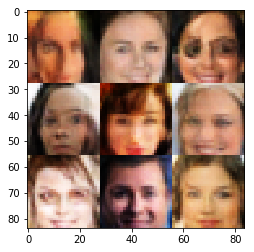

Epoch 8/20... Discriminator Loss: 1.1654... Generator Loss: 0.5646
Epoch 8/20... Discriminator Loss: 0.9230... Generator Loss: 0.9797
Epoch 8/20... Discriminator Loss: 0.9216... Generator Loss: 0.8243
Epoch 8/20... Discriminator Loss: 0.7108... Generator Loss: 1.2683
Epoch 8/20... Discriminator Loss: 0.9993... Generator Loss: 0.7501
Epoch 8/20... Discriminator Loss: 2.0190... Generator Loss: 2.6336
Epoch 8/20... Discriminator Loss: 1.0040... Generator Loss: 1.4213
Epoch 8/20... Discriminator Loss: 0.8981... Generator Loss: 1.0678
Epoch 8/20... Discriminator Loss: 0.7042... Generator Loss: 1.0797
Epoch 8/20... Discriminator Loss: 1.1368... Generator Loss: 1.7220


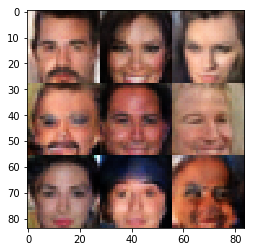

Epoch 8/20... Discriminator Loss: 1.2815... Generator Loss: 0.4634
Epoch 8/20... Discriminator Loss: 0.6901... Generator Loss: 1.2574
Epoch 8/20... Discriminator Loss: 0.9252... Generator Loss: 0.8222
Epoch 8/20... Discriminator Loss: 1.2501... Generator Loss: 0.4987
Epoch 8/20... Discriminator Loss: 0.8484... Generator Loss: 0.8879
Epoch 8/20... Discriminator Loss: 0.7968... Generator Loss: 1.0767
Epoch 8/20... Discriminator Loss: 1.0524... Generator Loss: 0.6899
Epoch 8/20... Discriminator Loss: 1.1951... Generator Loss: 0.4849
Epoch 8/20... Discriminator Loss: 1.0235... Generator Loss: 0.6722
Epoch 8/20... Discriminator Loss: 1.0929... Generator Loss: 0.5581


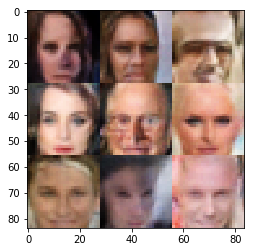

Epoch 8/20... Discriminator Loss: 0.9388... Generator Loss: 0.7069
Epoch 8/20... Discriminator Loss: 0.7797... Generator Loss: 1.4152
Epoch 8/20... Discriminator Loss: 1.4869... Generator Loss: 2.8984
Epoch 8/20... Discriminator Loss: 1.1451... Generator Loss: 1.9194
Epoch 8/20... Discriminator Loss: 1.1047... Generator Loss: 1.7058
Epoch 8/20... Discriminator Loss: 1.2830... Generator Loss: 0.4555
Epoch 8/20... Discriminator Loss: 0.7189... Generator Loss: 1.1614
Epoch 8/20... Discriminator Loss: 0.8640... Generator Loss: 1.2101
Epoch 8/20... Discriminator Loss: 0.9609... Generator Loss: 0.6896
Epoch 8/20... Discriminator Loss: 0.8801... Generator Loss: 0.8037


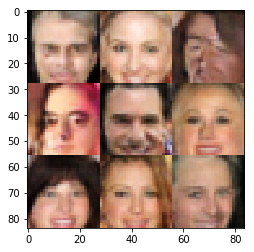

Epoch 8/20... Discriminator Loss: 1.3081... Generator Loss: 0.4215
Epoch 8/20... Discriminator Loss: 0.8063... Generator Loss: 1.0545
Epoch 8/20... Discriminator Loss: 0.9947... Generator Loss: 0.6791
Epoch 8/20... Discriminator Loss: 0.8822... Generator Loss: 1.2034
Epoch 8/20... Discriminator Loss: 1.1608... Generator Loss: 0.5457
Epoch 8/20... Discriminator Loss: 0.7681... Generator Loss: 1.0493
Epoch 8/20... Discriminator Loss: 0.7053... Generator Loss: 1.1709
Epoch 8/20... Discriminator Loss: 0.9083... Generator Loss: 0.9396
Epoch 8/20... Discriminator Loss: 0.8844... Generator Loss: 1.2069
Epoch 8/20... Discriminator Loss: 0.7410... Generator Loss: 1.5304


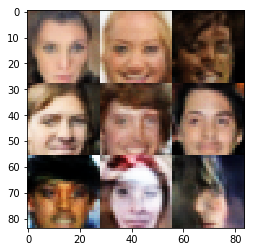

Epoch 8/20... Discriminator Loss: 0.8013... Generator Loss: 0.9568
Epoch 8/20... Discriminator Loss: 0.9404... Generator Loss: 0.8102
Epoch 8/20... Discriminator Loss: 1.0587... Generator Loss: 0.6397
Epoch 8/20... Discriminator Loss: 0.6615... Generator Loss: 1.6332
Epoch 8/20... Discriminator Loss: 1.0213... Generator Loss: 0.7176
Epoch 8/20... Discriminator Loss: 1.0454... Generator Loss: 0.5964
Epoch 8/20... Discriminator Loss: 1.1408... Generator Loss: 0.5535
Epoch 8/20... Discriminator Loss: 1.1215... Generator Loss: 1.0866
Epoch 8/20... Discriminator Loss: 1.5158... Generator Loss: 0.3364
Epoch 8/20... Discriminator Loss: 0.9799... Generator Loss: 0.7391


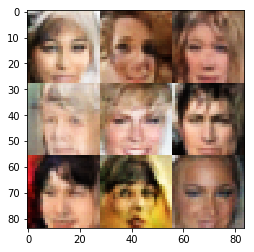

Epoch 8/20... Discriminator Loss: 1.2023... Generator Loss: 0.5035
Epoch 8/20... Discriminator Loss: 1.2514... Generator Loss: 2.6023
Epoch 8/20... Discriminator Loss: 0.7681... Generator Loss: 1.5161
Epoch 8/20... Discriminator Loss: 0.9867... Generator Loss: 2.4727
Epoch 8/20... Discriminator Loss: 1.1526... Generator Loss: 2.0986
Epoch 8/20... Discriminator Loss: 0.8263... Generator Loss: 0.8804
Epoch 8/20... Discriminator Loss: 0.9816... Generator Loss: 0.8186
Epoch 8/20... Discriminator Loss: 1.0682... Generator Loss: 0.6999
Epoch 8/20... Discriminator Loss: 0.7919... Generator Loss: 1.6021
Epoch 8/20... Discriminator Loss: 1.2747... Generator Loss: 0.5177


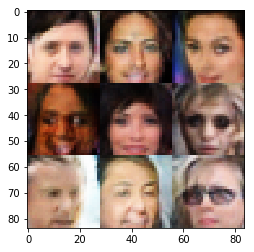

Epoch 8/20... Discriminator Loss: 0.8785... Generator Loss: 1.2011
Epoch 8/20... Discriminator Loss: 0.6202... Generator Loss: 1.5369
Epoch 8/20... Discriminator Loss: 1.1592... Generator Loss: 0.5586
Epoch 8/20... Discriminator Loss: 1.1864... Generator Loss: 0.5053
Epoch 8/20... Discriminator Loss: 0.7851... Generator Loss: 1.1027
Epoch 8/20... Discriminator Loss: 0.9217... Generator Loss: 0.7959
Epoch 8/20... Discriminator Loss: 0.8163... Generator Loss: 0.9743
Epoch 8/20... Discriminator Loss: 0.8669... Generator Loss: 1.9171
Epoch 8/20... Discriminator Loss: 0.9754... Generator Loss: 1.1006
Epoch 8/20... Discriminator Loss: 0.5684... Generator Loss: 1.6659


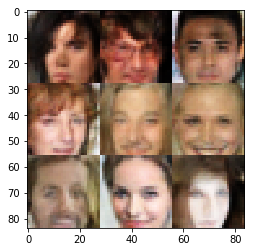

Epoch 8/20... Discriminator Loss: 1.3684... Generator Loss: 2.2123
Epoch 8/20... Discriminator Loss: 0.8970... Generator Loss: 1.1917
Epoch 8/20... Discriminator Loss: 0.8695... Generator Loss: 0.9843
Epoch 8/20... Discriminator Loss: 1.0359... Generator Loss: 0.6699
Epoch 8/20... Discriminator Loss: 0.7607... Generator Loss: 1.4592
Epoch 8/20... Discriminator Loss: 1.0483... Generator Loss: 0.5916
Epoch 8/20... Discriminator Loss: 1.0694... Generator Loss: 0.6550
Epoch 8/20... Discriminator Loss: 0.8633... Generator Loss: 0.8120
Epoch 8/20... Discriminator Loss: 0.7820... Generator Loss: 1.1367
Epoch 8/20... Discriminator Loss: 0.9084... Generator Loss: 1.9040


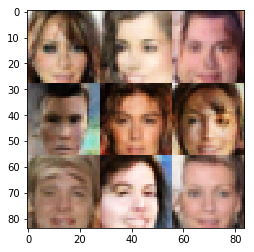

Epoch 8/20... Discriminator Loss: 0.9324... Generator Loss: 1.0462
Epoch 8/20... Discriminator Loss: 0.9487... Generator Loss: 0.6913
Epoch 8/20... Discriminator Loss: 1.0404... Generator Loss: 0.6165
Epoch 8/20... Discriminator Loss: 1.0631... Generator Loss: 0.5792
Epoch 8/20... Discriminator Loss: 1.0677... Generator Loss: 0.5965
Epoch 9/20... Discriminator Loss: 1.2285... Generator Loss: 2.2338
Epoch 9/20... Discriminator Loss: 1.6558... Generator Loss: 1.9633
Epoch 9/20... Discriminator Loss: 0.9669... Generator Loss: 0.7631
Epoch 9/20... Discriminator Loss: 1.2302... Generator Loss: 0.4951
Epoch 9/20... Discriminator Loss: 0.9721... Generator Loss: 1.5566


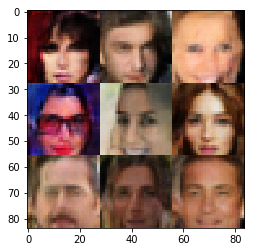

Epoch 9/20... Discriminator Loss: 0.9385... Generator Loss: 0.7461
Epoch 9/20... Discriminator Loss: 0.8195... Generator Loss: 1.0250
Epoch 9/20... Discriminator Loss: 1.1787... Generator Loss: 0.6838
Epoch 9/20... Discriminator Loss: 1.1951... Generator Loss: 0.5782
Epoch 9/20... Discriminator Loss: 0.8734... Generator Loss: 0.9201
Epoch 9/20... Discriminator Loss: 1.1741... Generator Loss: 0.6138
Epoch 9/20... Discriminator Loss: 0.9207... Generator Loss: 0.8378
Epoch 9/20... Discriminator Loss: 0.9132... Generator Loss: 0.7729
Epoch 9/20... Discriminator Loss: 0.9047... Generator Loss: 0.7698
Epoch 9/20... Discriminator Loss: 0.8515... Generator Loss: 1.5103


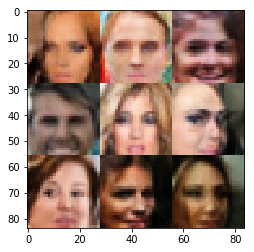

Epoch 9/20... Discriminator Loss: 0.9347... Generator Loss: 1.0901
Epoch 9/20... Discriminator Loss: 0.7302... Generator Loss: 1.0309
Epoch 9/20... Discriminator Loss: 0.9713... Generator Loss: 0.7510
Epoch 9/20... Discriminator Loss: 0.9579... Generator Loss: 0.7158
Epoch 9/20... Discriminator Loss: 0.9165... Generator Loss: 1.9509
Epoch 9/20... Discriminator Loss: 0.8099... Generator Loss: 1.2436
Epoch 9/20... Discriminator Loss: 0.4259... Generator Loss: 1.7568
Epoch 9/20... Discriminator Loss: 1.1068... Generator Loss: 0.5324
Epoch 9/20... Discriminator Loss: 1.1278... Generator Loss: 0.5545
Epoch 9/20... Discriminator Loss: 1.1401... Generator Loss: 1.6813


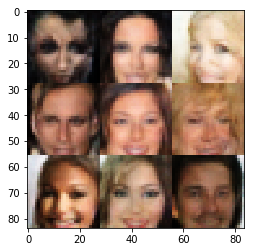

Epoch 9/20... Discriminator Loss: 0.7352... Generator Loss: 1.1656
Epoch 9/20... Discriminator Loss: 0.7338... Generator Loss: 1.5394
Epoch 9/20... Discriminator Loss: 1.3840... Generator Loss: 0.4245
Epoch 9/20... Discriminator Loss: 0.8905... Generator Loss: 0.8321
Epoch 9/20... Discriminator Loss: 0.8445... Generator Loss: 1.1667
Epoch 9/20... Discriminator Loss: 0.8265... Generator Loss: 0.9231
Epoch 9/20... Discriminator Loss: 1.2934... Generator Loss: 0.4367
Epoch 9/20... Discriminator Loss: 0.8238... Generator Loss: 0.9690
Epoch 9/20... Discriminator Loss: 1.0057... Generator Loss: 0.7000
Epoch 9/20... Discriminator Loss: 1.1626... Generator Loss: 0.7262


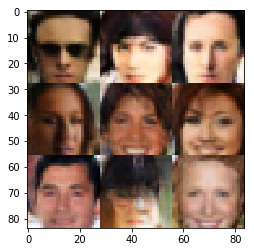

Epoch 9/20... Discriminator Loss: 1.0624... Generator Loss: 0.6889
Epoch 9/20... Discriminator Loss: 0.8151... Generator Loss: 0.9196
Epoch 9/20... Discriminator Loss: 1.0073... Generator Loss: 0.7770
Epoch 9/20... Discriminator Loss: 1.0700... Generator Loss: 0.6480
Epoch 9/20... Discriminator Loss: 0.7938... Generator Loss: 1.0345
Epoch 9/20... Discriminator Loss: 1.2120... Generator Loss: 0.5622
Epoch 9/20... Discriminator Loss: 0.7997... Generator Loss: 0.8254
Epoch 9/20... Discriminator Loss: 0.9349... Generator Loss: 0.8844
Epoch 9/20... Discriminator Loss: 0.9323... Generator Loss: 0.7831
Epoch 9/20... Discriminator Loss: 0.6247... Generator Loss: 1.7617


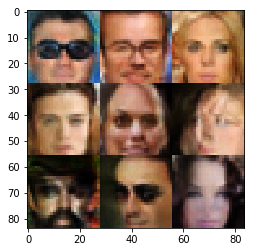

Epoch 9/20... Discriminator Loss: 0.7824... Generator Loss: 2.5995
Epoch 9/20... Discriminator Loss: 0.7423... Generator Loss: 1.5175
Epoch 9/20... Discriminator Loss: 0.9254... Generator Loss: 0.9784
Epoch 9/20... Discriminator Loss: 1.1211... Generator Loss: 0.5513
Epoch 9/20... Discriminator Loss: 1.1079... Generator Loss: 0.6320
Epoch 9/20... Discriminator Loss: 0.8818... Generator Loss: 1.2750
Epoch 9/20... Discriminator Loss: 0.7172... Generator Loss: 0.9759
Epoch 9/20... Discriminator Loss: 0.8214... Generator Loss: 1.5136
Epoch 9/20... Discriminator Loss: 1.0868... Generator Loss: 0.6650
Epoch 9/20... Discriminator Loss: 1.0190... Generator Loss: 0.5852


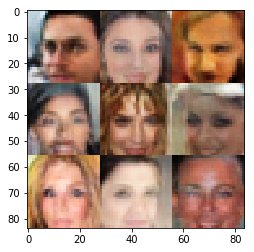

Epoch 9/20... Discriminator Loss: 0.7906... Generator Loss: 1.1982
Epoch 9/20... Discriminator Loss: 1.4109... Generator Loss: 0.3827
Epoch 9/20... Discriminator Loss: 0.9944... Generator Loss: 0.7936
Epoch 9/20... Discriminator Loss: 1.0675... Generator Loss: 0.7251
Epoch 9/20... Discriminator Loss: 0.9268... Generator Loss: 0.7490
Epoch 9/20... Discriminator Loss: 1.0023... Generator Loss: 0.6754
Epoch 9/20... Discriminator Loss: 1.3706... Generator Loss: 0.4425
Epoch 9/20... Discriminator Loss: 0.7898... Generator Loss: 1.0570
Epoch 9/20... Discriminator Loss: 0.7053... Generator Loss: 1.3983
Epoch 9/20... Discriminator Loss: 1.1594... Generator Loss: 2.7984


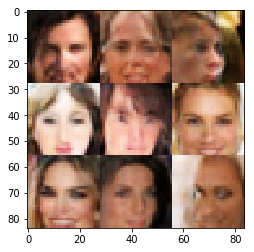

Epoch 9/20... Discriminator Loss: 1.3302... Generator Loss: 0.4401
Epoch 9/20... Discriminator Loss: 1.1714... Generator Loss: 0.5317
Epoch 9/20... Discriminator Loss: 0.8594... Generator Loss: 0.8652
Epoch 9/20... Discriminator Loss: 0.8074... Generator Loss: 0.9135
Epoch 9/20... Discriminator Loss: 0.9974... Generator Loss: 0.6994
Epoch 9/20... Discriminator Loss: 1.1393... Generator Loss: 0.5507
Epoch 9/20... Discriminator Loss: 0.9963... Generator Loss: 1.4609
Epoch 9/20... Discriminator Loss: 0.8870... Generator Loss: 1.2378
Epoch 9/20... Discriminator Loss: 0.7934... Generator Loss: 0.9164
Epoch 9/20... Discriminator Loss: 0.6868... Generator Loss: 1.4872


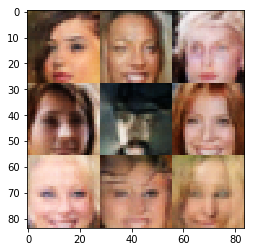

Epoch 9/20... Discriminator Loss: 1.3418... Generator Loss: 0.4164
Epoch 9/20... Discriminator Loss: 0.8995... Generator Loss: 0.8250
Epoch 9/20... Discriminator Loss: 0.8610... Generator Loss: 0.8910
Epoch 9/20... Discriminator Loss: 1.0438... Generator Loss: 0.6435
Epoch 9/20... Discriminator Loss: 0.8494... Generator Loss: 0.8658
Epoch 9/20... Discriminator Loss: 1.1862... Generator Loss: 0.4984
Epoch 9/20... Discriminator Loss: 0.8520... Generator Loss: 1.4182
Epoch 9/20... Discriminator Loss: 0.7176... Generator Loss: 0.9855
Epoch 9/20... Discriminator Loss: 1.0894... Generator Loss: 0.5557
Epoch 9/20... Discriminator Loss: 0.9937... Generator Loss: 0.6688


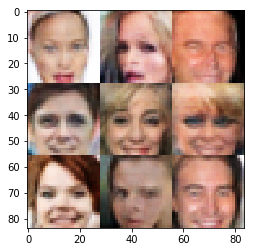

Epoch 9/20... Discriminator Loss: 1.2800... Generator Loss: 0.4222
Epoch 9/20... Discriminator Loss: 1.0889... Generator Loss: 0.5711
Epoch 9/20... Discriminator Loss: 0.9356... Generator Loss: 1.3989
Epoch 9/20... Discriminator Loss: 1.8266... Generator Loss: 2.8810
Epoch 9/20... Discriminator Loss: 1.5348... Generator Loss: 0.4184
Epoch 9/20... Discriminator Loss: 0.9250... Generator Loss: 0.9744
Epoch 9/20... Discriminator Loss: 0.8442... Generator Loss: 0.8082
Epoch 9/20... Discriminator Loss: 1.4399... Generator Loss: 0.3760
Epoch 9/20... Discriminator Loss: 1.0677... Generator Loss: 0.7468
Epoch 9/20... Discriminator Loss: 0.9096... Generator Loss: 0.7601


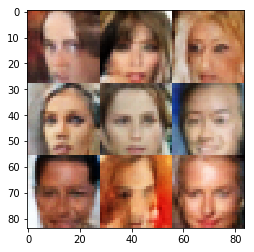

Epoch 9/20... Discriminator Loss: 0.8110... Generator Loss: 1.5564
Epoch 9/20... Discriminator Loss: 0.8594... Generator Loss: 1.0838
Epoch 9/20... Discriminator Loss: 0.8106... Generator Loss: 0.9187
Epoch 9/20... Discriminator Loss: 0.7515... Generator Loss: 1.0366
Epoch 9/20... Discriminator Loss: 0.8688... Generator Loss: 0.8436
Epoch 9/20... Discriminator Loss: 1.1510... Generator Loss: 0.5509
Epoch 9/20... Discriminator Loss: 0.8609... Generator Loss: 0.7960
Epoch 9/20... Discriminator Loss: 1.0432... Generator Loss: 1.0317
Epoch 9/20... Discriminator Loss: 1.4185... Generator Loss: 0.3996
Epoch 9/20... Discriminator Loss: 0.6833... Generator Loss: 1.6280


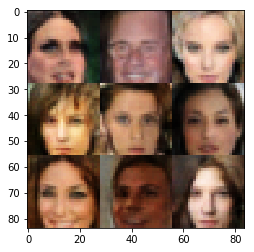

Epoch 9/20... Discriminator Loss: 1.0450... Generator Loss: 1.0097
Epoch 9/20... Discriminator Loss: 1.4937... Generator Loss: 2.3377
Epoch 9/20... Discriminator Loss: 0.9825... Generator Loss: 0.8395
Epoch 9/20... Discriminator Loss: 1.2034... Generator Loss: 0.5128
Epoch 9/20... Discriminator Loss: 0.7673... Generator Loss: 1.0826
Epoch 9/20... Discriminator Loss: 0.9486... Generator Loss: 0.7167
Epoch 9/20... Discriminator Loss: 1.1712... Generator Loss: 0.5115
Epoch 9/20... Discriminator Loss: 1.6231... Generator Loss: 0.2914
Epoch 9/20... Discriminator Loss: 1.0008... Generator Loss: 0.6883
Epoch 9/20... Discriminator Loss: 0.9492... Generator Loss: 0.7395


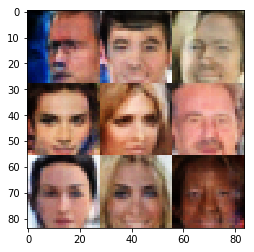

Epoch 9/20... Discriminator Loss: 1.0642... Generator Loss: 0.6356
Epoch 9/20... Discriminator Loss: 0.9699... Generator Loss: 0.7684
Epoch 9/20... Discriminator Loss: 0.8744... Generator Loss: 0.7639
Epoch 9/20... Discriminator Loss: 0.8998... Generator Loss: 0.7667
Epoch 9/20... Discriminator Loss: 0.9821... Generator Loss: 1.3564
Epoch 9/20... Discriminator Loss: 0.8633... Generator Loss: 0.9433
Epoch 9/20... Discriminator Loss: 0.8597... Generator Loss: 0.8913
Epoch 9/20... Discriminator Loss: 0.8632... Generator Loss: 1.1690
Epoch 9/20... Discriminator Loss: 0.8902... Generator Loss: 0.7526
Epoch 9/20... Discriminator Loss: 0.7154... Generator Loss: 1.1147


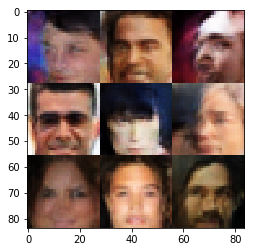

Epoch 9/20... Discriminator Loss: 0.5716... Generator Loss: 1.4811
Epoch 9/20... Discriminator Loss: 0.6734... Generator Loss: 1.4637
Epoch 9/20... Discriminator Loss: 0.6313... Generator Loss: 1.1894
Epoch 9/20... Discriminator Loss: 1.2017... Generator Loss: 0.5184
Epoch 9/20... Discriminator Loss: 0.9828... Generator Loss: 0.9042
Epoch 9/20... Discriminator Loss: 0.8571... Generator Loss: 0.7989
Epoch 9/20... Discriminator Loss: 0.8389... Generator Loss: 1.1441
Epoch 9/20... Discriminator Loss: 0.9088... Generator Loss: 0.7927
Epoch 9/20... Discriminator Loss: 1.0762... Generator Loss: 0.5621
Epoch 9/20... Discriminator Loss: 1.2759... Generator Loss: 1.8331


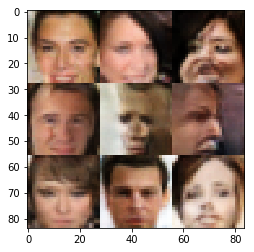

Epoch 9/20... Discriminator Loss: 0.8425... Generator Loss: 0.8486
Epoch 9/20... Discriminator Loss: 1.0636... Generator Loss: 1.4914
Epoch 9/20... Discriminator Loss: 0.8277... Generator Loss: 1.1185
Epoch 9/20... Discriminator Loss: 1.1169... Generator Loss: 0.5973
Epoch 9/20... Discriminator Loss: 0.8062... Generator Loss: 1.1674
Epoch 9/20... Discriminator Loss: 1.1855... Generator Loss: 0.5266
Epoch 9/20... Discriminator Loss: 0.6677... Generator Loss: 1.5480
Epoch 9/20... Discriminator Loss: 0.7754... Generator Loss: 1.0520
Epoch 9/20... Discriminator Loss: 1.0165... Generator Loss: 0.8613
Epoch 9/20... Discriminator Loss: 1.7733... Generator Loss: 0.2546


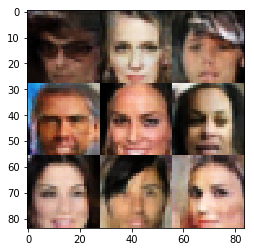

Epoch 9/20... Discriminator Loss: 0.9471... Generator Loss: 1.0876
Epoch 9/20... Discriminator Loss: 0.8758... Generator Loss: 0.8791
Epoch 9/20... Discriminator Loss: 0.7173... Generator Loss: 1.3793
Epoch 9/20... Discriminator Loss: 0.9016... Generator Loss: 1.1958
Epoch 9/20... Discriminator Loss: 1.0130... Generator Loss: 0.6500
Epoch 9/20... Discriminator Loss: 1.0268... Generator Loss: 0.7001
Epoch 9/20... Discriminator Loss: 0.9258... Generator Loss: 1.0931
Epoch 9/20... Discriminator Loss: 1.0873... Generator Loss: 0.5530
Epoch 9/20... Discriminator Loss: 0.7718... Generator Loss: 0.9863
Epoch 9/20... Discriminator Loss: 1.3043... Generator Loss: 0.4347


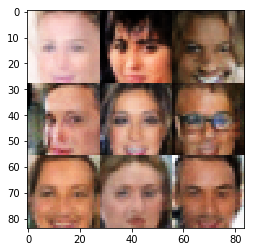

Epoch 9/20... Discriminator Loss: 1.3256... Generator Loss: 0.4608
Epoch 9/20... Discriminator Loss: 0.8549... Generator Loss: 0.7826
Epoch 9/20... Discriminator Loss: 1.0818... Generator Loss: 0.5599
Epoch 10/20... Discriminator Loss: 0.6248... Generator Loss: 1.4622
Epoch 10/20... Discriminator Loss: 0.6843... Generator Loss: 1.2492
Epoch 10/20... Discriminator Loss: 1.3364... Generator Loss: 0.4729
Epoch 10/20... Discriminator Loss: 1.2251... Generator Loss: 0.5041
Epoch 10/20... Discriminator Loss: 0.9383... Generator Loss: 1.2355
Epoch 10/20... Discriminator Loss: 0.9931... Generator Loss: 0.8727
Epoch 10/20... Discriminator Loss: 1.1412... Generator Loss: 0.5439


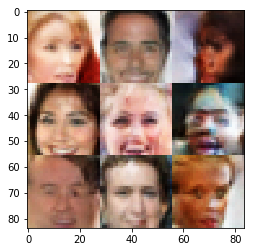

Epoch 10/20... Discriminator Loss: 0.7940... Generator Loss: 0.9440
Epoch 10/20... Discriminator Loss: 1.4648... Generator Loss: 0.4170
Epoch 10/20... Discriminator Loss: 1.1148... Generator Loss: 0.6461
Epoch 10/20... Discriminator Loss: 0.9160... Generator Loss: 0.8007
Epoch 10/20... Discriminator Loss: 0.7925... Generator Loss: 0.9921
Epoch 10/20... Discriminator Loss: 0.4671... Generator Loss: 1.8503
Epoch 10/20... Discriminator Loss: 0.8883... Generator Loss: 0.9179
Epoch 10/20... Discriminator Loss: 0.8030... Generator Loss: 0.9806
Epoch 10/20... Discriminator Loss: 1.6925... Generator Loss: 0.2637
Epoch 10/20... Discriminator Loss: 0.8849... Generator Loss: 1.3061


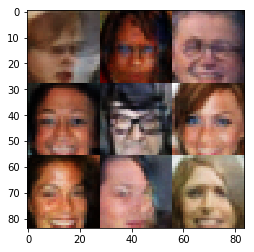

Epoch 10/20... Discriminator Loss: 0.8963... Generator Loss: 0.7419
Epoch 10/20... Discriminator Loss: 1.1005... Generator Loss: 0.6291
Epoch 10/20... Discriminator Loss: 0.7991... Generator Loss: 1.0506
Epoch 10/20... Discriminator Loss: 1.0078... Generator Loss: 0.8032
Epoch 10/20... Discriminator Loss: 1.1868... Generator Loss: 0.4972
Epoch 10/20... Discriminator Loss: 0.9047... Generator Loss: 0.9330
Epoch 10/20... Discriminator Loss: 0.8466... Generator Loss: 1.3674
Epoch 10/20... Discriminator Loss: 0.7573... Generator Loss: 0.9665
Epoch 10/20... Discriminator Loss: 0.7433... Generator Loss: 0.9131
Epoch 10/20... Discriminator Loss: 0.7690... Generator Loss: 0.9239


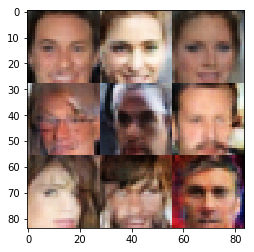

Epoch 10/20... Discriminator Loss: 1.0728... Generator Loss: 0.6509
Epoch 10/20... Discriminator Loss: 0.6359... Generator Loss: 1.1083
Epoch 10/20... Discriminator Loss: 1.1973... Generator Loss: 0.5328
Epoch 10/20... Discriminator Loss: 0.9972... Generator Loss: 0.8829
Epoch 10/20... Discriminator Loss: 0.7969... Generator Loss: 1.2885
Epoch 10/20... Discriminator Loss: 0.6104... Generator Loss: 1.3263
Epoch 10/20... Discriminator Loss: 0.6746... Generator Loss: 1.6353
Epoch 10/20... Discriminator Loss: 1.1694... Generator Loss: 0.5474
Epoch 10/20... Discriminator Loss: 1.0993... Generator Loss: 0.7087
Epoch 10/20... Discriminator Loss: 0.8176... Generator Loss: 1.5468


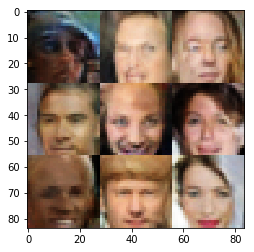

Epoch 10/20... Discriminator Loss: 0.8817... Generator Loss: 1.0381
Epoch 10/20... Discriminator Loss: 0.7853... Generator Loss: 1.5880
Epoch 10/20... Discriminator Loss: 0.9182... Generator Loss: 0.8560
Epoch 10/20... Discriminator Loss: 0.6596... Generator Loss: 2.6823
Epoch 10/20... Discriminator Loss: 1.0775... Generator Loss: 0.5441
Epoch 10/20... Discriminator Loss: 1.2820... Generator Loss: 0.4508
Epoch 10/20... Discriminator Loss: 1.0108... Generator Loss: 0.7441
Epoch 10/20... Discriminator Loss: 1.3603... Generator Loss: 2.7691
Epoch 10/20... Discriminator Loss: 1.2445... Generator Loss: 0.4878
Epoch 10/20... Discriminator Loss: 0.9419... Generator Loss: 0.7696


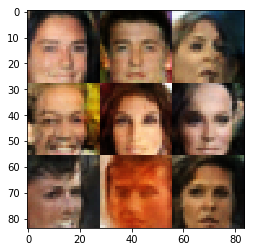

Epoch 10/20... Discriminator Loss: 0.8168... Generator Loss: 0.8872
Epoch 10/20... Discriminator Loss: 0.7538... Generator Loss: 1.8180
Epoch 10/20... Discriminator Loss: 1.0166... Generator Loss: 0.6357
Epoch 10/20... Discriminator Loss: 0.9479... Generator Loss: 0.7566
Epoch 10/20... Discriminator Loss: 1.1465... Generator Loss: 0.5412
Epoch 10/20... Discriminator Loss: 0.7128... Generator Loss: 1.4930
Epoch 10/20... Discriminator Loss: 0.8312... Generator Loss: 0.9762
Epoch 10/20... Discriminator Loss: 0.8141... Generator Loss: 0.9025
Epoch 10/20... Discriminator Loss: 1.0538... Generator Loss: 2.3948
Epoch 10/20... Discriminator Loss: 1.0390... Generator Loss: 0.5445


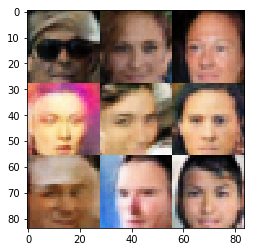

Epoch 10/20... Discriminator Loss: 0.8523... Generator Loss: 0.8244
Epoch 10/20... Discriminator Loss: 0.7758... Generator Loss: 0.9638
Epoch 10/20... Discriminator Loss: 0.8597... Generator Loss: 1.3841
Epoch 10/20... Discriminator Loss: 0.7373... Generator Loss: 1.7568
Epoch 10/20... Discriminator Loss: 0.9666... Generator Loss: 0.7461
Epoch 10/20... Discriminator Loss: 1.1748... Generator Loss: 1.9745
Epoch 10/20... Discriminator Loss: 1.3057... Generator Loss: 0.4342
Epoch 10/20... Discriminator Loss: 1.0001... Generator Loss: 0.7970
Epoch 10/20... Discriminator Loss: 0.7448... Generator Loss: 1.1814
Epoch 10/20... Discriminator Loss: 1.0935... Generator Loss: 0.5571


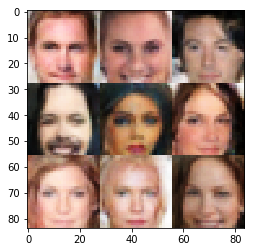

Epoch 10/20... Discriminator Loss: 0.7685... Generator Loss: 1.1496
Epoch 10/20... Discriminator Loss: 0.7997... Generator Loss: 1.3431
Epoch 10/20... Discriminator Loss: 1.0370... Generator Loss: 0.6729
Epoch 10/20... Discriminator Loss: 0.6755... Generator Loss: 2.0526
Epoch 10/20... Discriminator Loss: 1.0533... Generator Loss: 0.5616
Epoch 10/20... Discriminator Loss: 0.9940... Generator Loss: 1.8014
Epoch 10/20... Discriminator Loss: 1.2691... Generator Loss: 0.4316
Epoch 10/20... Discriminator Loss: 0.8000... Generator Loss: 1.1660
Epoch 10/20... Discriminator Loss: 0.8328... Generator Loss: 1.3420
Epoch 10/20... Discriminator Loss: 1.1143... Generator Loss: 0.5978


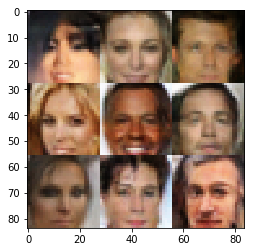

Epoch 10/20... Discriminator Loss: 1.0254... Generator Loss: 0.6577
Epoch 10/20... Discriminator Loss: 0.9178... Generator Loss: 1.5753
Epoch 10/20... Discriminator Loss: 0.6087... Generator Loss: 1.5323
Epoch 10/20... Discriminator Loss: 1.5147... Generator Loss: 1.3333
Epoch 10/20... Discriminator Loss: 0.7424... Generator Loss: 0.9107
Epoch 10/20... Discriminator Loss: 1.1418... Generator Loss: 0.5678
Epoch 10/20... Discriminator Loss: 1.0005... Generator Loss: 1.2806
Epoch 10/20... Discriminator Loss: 0.8721... Generator Loss: 0.8569
Epoch 10/20... Discriminator Loss: 0.9129... Generator Loss: 0.9636
Epoch 10/20... Discriminator Loss: 0.5558... Generator Loss: 1.2260


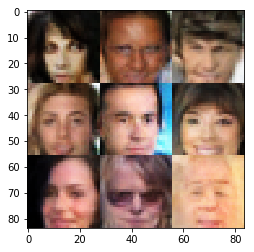

Epoch 10/20... Discriminator Loss: 0.8300... Generator Loss: 1.7496
Epoch 10/20... Discriminator Loss: 0.9451... Generator Loss: 0.7814
Epoch 10/20... Discriminator Loss: 1.1671... Generator Loss: 0.8482
Epoch 10/20... Discriminator Loss: 1.2130... Generator Loss: 0.6723
Epoch 10/20... Discriminator Loss: 1.3288... Generator Loss: 0.4221
Epoch 10/20... Discriminator Loss: 0.8104... Generator Loss: 1.3931
Epoch 10/20... Discriminator Loss: 0.9404... Generator Loss: 1.6688
Epoch 10/20... Discriminator Loss: 0.8568... Generator Loss: 0.8254
Epoch 10/20... Discriminator Loss: 1.2256... Generator Loss: 0.4762
Epoch 10/20... Discriminator Loss: 0.7635... Generator Loss: 1.0221


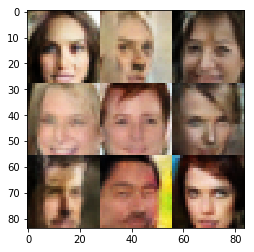

Epoch 10/20... Discriminator Loss: 0.9371... Generator Loss: 0.6463
Epoch 10/20... Discriminator Loss: 1.0486... Generator Loss: 0.6294
Epoch 10/20... Discriminator Loss: 1.0665... Generator Loss: 2.1708
Epoch 10/20... Discriminator Loss: 1.0254... Generator Loss: 1.9900
Epoch 10/20... Discriminator Loss: 0.9545... Generator Loss: 0.7216
Epoch 10/20... Discriminator Loss: 0.7255... Generator Loss: 1.2540
Epoch 10/20... Discriminator Loss: 0.7721... Generator Loss: 1.0486
Epoch 10/20... Discriminator Loss: 0.8833... Generator Loss: 0.7949
Epoch 10/20... Discriminator Loss: 1.3742... Generator Loss: 0.4294
Epoch 10/20... Discriminator Loss: 0.8870... Generator Loss: 2.0541


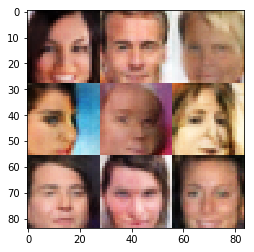

Epoch 10/20... Discriminator Loss: 0.9130... Generator Loss: 0.9338
Epoch 10/20... Discriminator Loss: 0.7826... Generator Loss: 1.3373
Epoch 10/20... Discriminator Loss: 1.0221... Generator Loss: 1.6771
Epoch 10/20... Discriminator Loss: 0.9795... Generator Loss: 0.6821
Epoch 10/20... Discriminator Loss: 0.7045... Generator Loss: 1.6146
Epoch 10/20... Discriminator Loss: 1.7064... Generator Loss: 0.2601
Epoch 10/20... Discriminator Loss: 0.8180... Generator Loss: 1.1618
Epoch 10/20... Discriminator Loss: 0.8137... Generator Loss: 0.8869
Epoch 10/20... Discriminator Loss: 0.8336... Generator Loss: 1.5703
Epoch 10/20... Discriminator Loss: 0.7590... Generator Loss: 1.6747


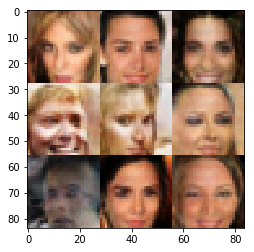

Epoch 10/20... Discriminator Loss: 0.8943... Generator Loss: 0.7981
Epoch 10/20... Discriminator Loss: 1.1496... Generator Loss: 0.5181
Epoch 10/20... Discriminator Loss: 0.7928... Generator Loss: 0.9444
Epoch 10/20... Discriminator Loss: 1.2167... Generator Loss: 0.4847
Epoch 10/20... Discriminator Loss: 0.7002... Generator Loss: 1.2233
Epoch 10/20... Discriminator Loss: 0.9406... Generator Loss: 1.8495
Epoch 10/20... Discriminator Loss: 1.2621... Generator Loss: 0.4629
Epoch 10/20... Discriminator Loss: 1.0054... Generator Loss: 0.6133
Epoch 10/20... Discriminator Loss: 1.3751... Generator Loss: 0.4164
Epoch 10/20... Discriminator Loss: 1.0028... Generator Loss: 1.0786


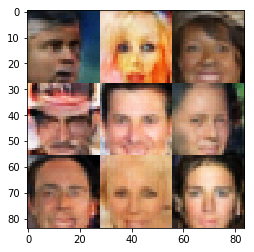

Epoch 10/20... Discriminator Loss: 0.8842... Generator Loss: 0.9534
Epoch 10/20... Discriminator Loss: 0.9280... Generator Loss: 1.2383
Epoch 10/20... Discriminator Loss: 0.8256... Generator Loss: 0.9780
Epoch 10/20... Discriminator Loss: 0.9230... Generator Loss: 0.7207
Epoch 10/20... Discriminator Loss: 0.7589... Generator Loss: 1.1616
Epoch 10/20... Discriminator Loss: 0.9118... Generator Loss: 0.7605
Epoch 10/20... Discriminator Loss: 0.9710... Generator Loss: 0.8342
Epoch 10/20... Discriminator Loss: 1.2152... Generator Loss: 2.3005
Epoch 10/20... Discriminator Loss: 1.0775... Generator Loss: 0.6326
Epoch 10/20... Discriminator Loss: 1.2937... Generator Loss: 0.4595


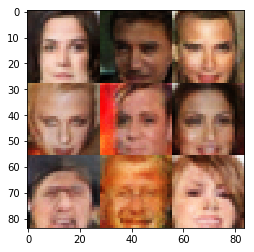

Epoch 10/20... Discriminator Loss: 0.6923... Generator Loss: 1.0639
Epoch 10/20... Discriminator Loss: 0.9228... Generator Loss: 0.7074
Epoch 10/20... Discriminator Loss: 0.8442... Generator Loss: 1.9817
Epoch 10/20... Discriminator Loss: 1.1977... Generator Loss: 0.4777
Epoch 10/20... Discriminator Loss: 0.9094... Generator Loss: 0.9159
Epoch 10/20... Discriminator Loss: 0.8492... Generator Loss: 0.9434
Epoch 10/20... Discriminator Loss: 0.7045... Generator Loss: 1.4258
Epoch 10/20... Discriminator Loss: 1.0625... Generator Loss: 1.7137
Epoch 10/20... Discriminator Loss: 0.8058... Generator Loss: 1.0819
Epoch 10/20... Discriminator Loss: 0.6509... Generator Loss: 1.1573


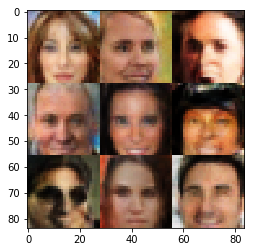

Epoch 10/20... Discriminator Loss: 1.1635... Generator Loss: 0.5049
Epoch 10/20... Discriminator Loss: 0.6258... Generator Loss: 1.0758
Epoch 10/20... Discriminator Loss: 0.8257... Generator Loss: 0.9605
Epoch 10/20... Discriminator Loss: 0.8101... Generator Loss: 0.8526
Epoch 10/20... Discriminator Loss: 1.3489... Generator Loss: 0.4216
Epoch 10/20... Discriminator Loss: 0.8810... Generator Loss: 0.8820
Epoch 10/20... Discriminator Loss: 0.8917... Generator Loss: 1.1935
Epoch 10/20... Discriminator Loss: 1.0516... Generator Loss: 0.6637
Epoch 10/20... Discriminator Loss: 0.7919... Generator Loss: 1.0697
Epoch 10/20... Discriminator Loss: 0.9054... Generator Loss: 0.8109


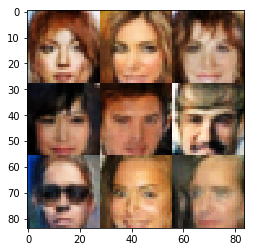

Epoch 10/20... Discriminator Loss: 0.8785... Generator Loss: 0.7539
Epoch 10/20... Discriminator Loss: 1.0558... Generator Loss: 0.6665
Epoch 11/20... Discriminator Loss: 1.0956... Generator Loss: 0.7559
Epoch 11/20... Discriminator Loss: 0.8161... Generator Loss: 1.3632
Epoch 11/20... Discriminator Loss: 0.7700... Generator Loss: 1.1034
Epoch 11/20... Discriminator Loss: 1.2530... Generator Loss: 0.5157
Epoch 11/20... Discriminator Loss: 0.6795... Generator Loss: 1.4975
Epoch 11/20... Discriminator Loss: 1.1490... Generator Loss: 0.6693
Epoch 11/20... Discriminator Loss: 1.1391... Generator Loss: 1.6056
Epoch 11/20... Discriminator Loss: 0.6880... Generator Loss: 1.1263


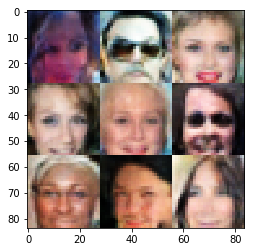

Epoch 11/20... Discriminator Loss: 0.9726... Generator Loss: 0.7381
Epoch 11/20... Discriminator Loss: 1.1832... Generator Loss: 0.5449
Epoch 11/20... Discriminator Loss: 0.9107... Generator Loss: 0.7380
Epoch 11/20... Discriminator Loss: 0.7556... Generator Loss: 1.0759
Epoch 11/20... Discriminator Loss: 0.7222... Generator Loss: 1.1036
Epoch 11/20... Discriminator Loss: 0.8142... Generator Loss: 1.0363
Epoch 11/20... Discriminator Loss: 1.1848... Generator Loss: 0.5248
Epoch 11/20... Discriminator Loss: 0.7694... Generator Loss: 1.6283
Epoch 11/20... Discriminator Loss: 0.8386... Generator Loss: 0.8368
Epoch 11/20... Discriminator Loss: 0.8715... Generator Loss: 0.7562


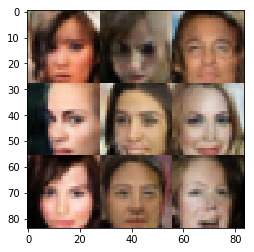

Epoch 11/20... Discriminator Loss: 0.5418... Generator Loss: 1.6397
Epoch 11/20... Discriminator Loss: 0.6354... Generator Loss: 1.1276
Epoch 11/20... Discriminator Loss: 0.7366... Generator Loss: 1.8198
Epoch 11/20... Discriminator Loss: 1.1819... Generator Loss: 1.8036
Epoch 11/20... Discriminator Loss: 0.7172... Generator Loss: 1.0864
Epoch 11/20... Discriminator Loss: 1.5882... Generator Loss: 0.3354
Epoch 11/20... Discriminator Loss: 1.0545... Generator Loss: 0.6753
Epoch 11/20... Discriminator Loss: 1.4501... Generator Loss: 0.4255
Epoch 11/20... Discriminator Loss: 0.9304... Generator Loss: 0.7361
Epoch 11/20... Discriminator Loss: 0.8584... Generator Loss: 0.8627


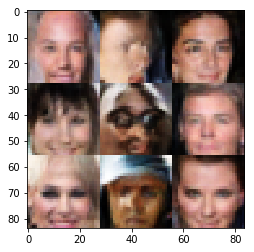

Epoch 11/20... Discriminator Loss: 0.7574... Generator Loss: 0.9129
Epoch 11/20... Discriminator Loss: 1.4168... Generator Loss: 0.3834
Epoch 11/20... Discriminator Loss: 0.9992... Generator Loss: 0.7165
Epoch 11/20... Discriminator Loss: 0.7947... Generator Loss: 0.9925
Epoch 11/20... Discriminator Loss: 0.5783... Generator Loss: 1.3211
Epoch 11/20... Discriminator Loss: 1.0942... Generator Loss: 0.5466
Epoch 11/20... Discriminator Loss: 1.1035... Generator Loss: 0.6351
Epoch 11/20... Discriminator Loss: 0.5384... Generator Loss: 1.6928
Epoch 11/20... Discriminator Loss: 1.2549... Generator Loss: 0.4671
Epoch 11/20... Discriminator Loss: 0.7915... Generator Loss: 1.1093


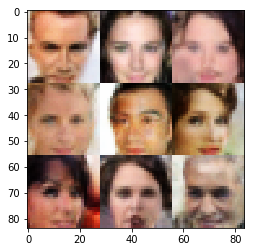

Epoch 11/20... Discriminator Loss: 1.3995... Generator Loss: 0.3937
Epoch 11/20... Discriminator Loss: 0.8335... Generator Loss: 0.9136
Epoch 11/20... Discriminator Loss: 0.8669... Generator Loss: 1.1218
Epoch 11/20... Discriminator Loss: 1.1593... Generator Loss: 0.6699
Epoch 11/20... Discriminator Loss: 0.9293... Generator Loss: 0.7087
Epoch 11/20... Discriminator Loss: 0.4814... Generator Loss: 2.0443
Epoch 11/20... Discriminator Loss: 0.8188... Generator Loss: 1.6715
Epoch 11/20... Discriminator Loss: 0.8057... Generator Loss: 1.9533
Epoch 11/20... Discriminator Loss: 0.8788... Generator Loss: 0.8836
Epoch 11/20... Discriminator Loss: 0.8900... Generator Loss: 0.7766


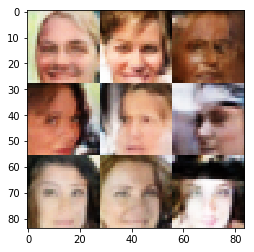

Epoch 11/20... Discriminator Loss: 0.7598... Generator Loss: 1.3177
Epoch 11/20... Discriminator Loss: 1.1291... Generator Loss: 0.6231
Epoch 11/20... Discriminator Loss: 0.9687... Generator Loss: 1.3783
Epoch 11/20... Discriminator Loss: 1.3939... Generator Loss: 0.4193
Epoch 11/20... Discriminator Loss: 0.9262... Generator Loss: 0.8098
Epoch 11/20... Discriminator Loss: 0.7506... Generator Loss: 1.2124
Epoch 11/20... Discriminator Loss: 0.8951... Generator Loss: 0.9353
Epoch 11/20... Discriminator Loss: 0.9162... Generator Loss: 1.0821
Epoch 11/20... Discriminator Loss: 1.0887... Generator Loss: 0.5404
Epoch 11/20... Discriminator Loss: 0.7059... Generator Loss: 1.4891


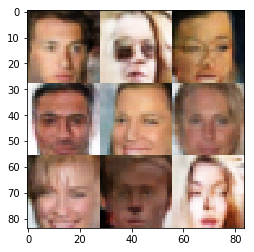

Epoch 11/20... Discriminator Loss: 1.4654... Generator Loss: 0.3458
Epoch 11/20... Discriminator Loss: 0.8668... Generator Loss: 0.9013
Epoch 11/20... Discriminator Loss: 0.7286... Generator Loss: 0.9314
Epoch 11/20... Discriminator Loss: 1.0337... Generator Loss: 1.3960
Epoch 11/20... Discriminator Loss: 0.7102... Generator Loss: 1.1272
Epoch 11/20... Discriminator Loss: 0.6033... Generator Loss: 1.2760
Epoch 11/20... Discriminator Loss: 0.8727... Generator Loss: 0.7453
Epoch 11/20... Discriminator Loss: 0.7364... Generator Loss: 1.3536
Epoch 11/20... Discriminator Loss: 1.7390... Generator Loss: 0.3083
Epoch 11/20... Discriminator Loss: 0.9321... Generator Loss: 2.3546


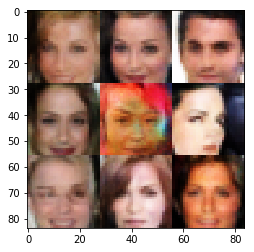

Epoch 11/20... Discriminator Loss: 0.9197... Generator Loss: 0.8706
Epoch 11/20... Discriminator Loss: 0.8824... Generator Loss: 0.8173
Epoch 11/20... Discriminator Loss: 1.0786... Generator Loss: 1.5600
Epoch 11/20... Discriminator Loss: 1.0272... Generator Loss: 0.6066
Epoch 11/20... Discriminator Loss: 1.5548... Generator Loss: 0.3253
Epoch 11/20... Discriminator Loss: 0.7307... Generator Loss: 1.0446
Epoch 11/20... Discriminator Loss: 0.5397... Generator Loss: 1.8542
Epoch 11/20... Discriminator Loss: 0.8573... Generator Loss: 0.8381
Epoch 11/20... Discriminator Loss: 1.0714... Generator Loss: 0.6593
Epoch 11/20... Discriminator Loss: 0.9762... Generator Loss: 0.7601


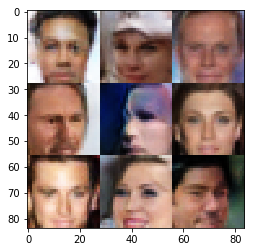

Epoch 11/20... Discriminator Loss: 0.7505... Generator Loss: 1.6562
Epoch 11/20... Discriminator Loss: 0.7835... Generator Loss: 1.0823
Epoch 11/20... Discriminator Loss: 0.8924... Generator Loss: 0.9009
Epoch 11/20... Discriminator Loss: 0.7707... Generator Loss: 1.6182
Epoch 11/20... Discriminator Loss: 0.7190... Generator Loss: 1.2592
Epoch 11/20... Discriminator Loss: 0.8014... Generator Loss: 0.8749
Epoch 11/20... Discriminator Loss: 1.4506... Generator Loss: 0.3835
Epoch 11/20... Discriminator Loss: 0.6895... Generator Loss: 1.0843
Epoch 11/20... Discriminator Loss: 0.7805... Generator Loss: 0.8745
Epoch 11/20... Discriminator Loss: 1.8186... Generator Loss: 0.2376


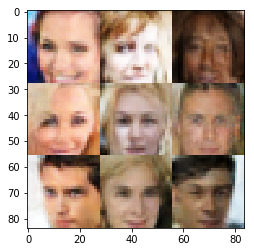

Epoch 11/20... Discriminator Loss: 0.8968... Generator Loss: 0.7856
Epoch 11/20... Discriminator Loss: 1.0934... Generator Loss: 1.1396
Epoch 11/20... Discriminator Loss: 1.2931... Generator Loss: 2.3443
Epoch 11/20... Discriminator Loss: 0.4047... Generator Loss: 1.8924
Epoch 11/20... Discriminator Loss: 0.8551... Generator Loss: 0.8110
Epoch 11/20... Discriminator Loss: 0.8038... Generator Loss: 1.0626
Epoch 11/20... Discriminator Loss: 0.9785... Generator Loss: 0.8697
Epoch 11/20... Discriminator Loss: 0.9397... Generator Loss: 0.7207
Epoch 11/20... Discriminator Loss: 0.9526... Generator Loss: 1.8594
Epoch 11/20... Discriminator Loss: 0.7620... Generator Loss: 0.9549


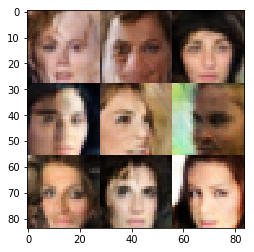

Epoch 11/20... Discriminator Loss: 0.6735... Generator Loss: 1.1228
Epoch 11/20... Discriminator Loss: 0.7922... Generator Loss: 1.6856
Epoch 11/20... Discriminator Loss: 0.9589... Generator Loss: 0.6925
Epoch 11/20... Discriminator Loss: 0.9892... Generator Loss: 0.6658
Epoch 11/20... Discriminator Loss: 0.7139... Generator Loss: 1.1937
Epoch 11/20... Discriminator Loss: 0.7956... Generator Loss: 1.0363
Epoch 11/20... Discriminator Loss: 1.2951... Generator Loss: 0.4738
Epoch 11/20... Discriminator Loss: 0.6065... Generator Loss: 1.2653
Epoch 11/20... Discriminator Loss: 0.9732... Generator Loss: 2.3377
Epoch 11/20... Discriminator Loss: 0.6654... Generator Loss: 1.2456


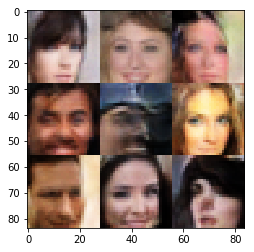

Epoch 11/20... Discriminator Loss: 0.7628... Generator Loss: 1.1530
Epoch 11/20... Discriminator Loss: 0.6834... Generator Loss: 1.0694
Epoch 11/20... Discriminator Loss: 1.4334... Generator Loss: 2.5037
Epoch 11/20... Discriminator Loss: 1.3355... Generator Loss: 1.5732
Epoch 11/20... Discriminator Loss: 0.9233... Generator Loss: 0.8161
Epoch 11/20... Discriminator Loss: 0.8222... Generator Loss: 0.9219
Epoch 11/20... Discriminator Loss: 0.7147... Generator Loss: 1.3798
Epoch 11/20... Discriminator Loss: 0.8147... Generator Loss: 1.2383
Epoch 11/20... Discriminator Loss: 0.8636... Generator Loss: 0.8312
Epoch 11/20... Discriminator Loss: 0.8489... Generator Loss: 1.0641


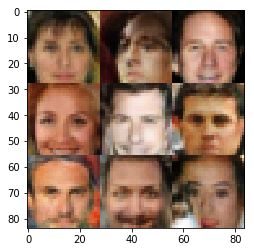

Epoch 11/20... Discriminator Loss: 1.2363... Generator Loss: 0.4695
Epoch 11/20... Discriminator Loss: 0.7953... Generator Loss: 1.1741
Epoch 11/20... Discriminator Loss: 0.6555... Generator Loss: 1.4702
Epoch 11/20... Discriminator Loss: 0.9065... Generator Loss: 0.8212
Epoch 11/20... Discriminator Loss: 0.9755... Generator Loss: 0.6299
Epoch 11/20... Discriminator Loss: 1.3443... Generator Loss: 0.4024
Epoch 11/20... Discriminator Loss: 1.2765... Generator Loss: 0.4626
Epoch 11/20... Discriminator Loss: 0.5989... Generator Loss: 1.2376
Epoch 11/20... Discriminator Loss: 1.0952... Generator Loss: 0.5480
Epoch 11/20... Discriminator Loss: 0.8582... Generator Loss: 1.2743


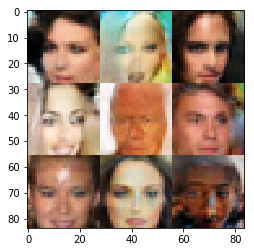

Epoch 11/20... Discriminator Loss: 2.0489... Generator Loss: 0.1954
Epoch 11/20... Discriminator Loss: 0.8040... Generator Loss: 0.9817
Epoch 11/20... Discriminator Loss: 0.9631... Generator Loss: 0.6928
Epoch 11/20... Discriminator Loss: 0.6796... Generator Loss: 1.0796
Epoch 11/20... Discriminator Loss: 0.8538... Generator Loss: 0.8301
Epoch 11/20... Discriminator Loss: 0.6939... Generator Loss: 1.0866
Epoch 11/20... Discriminator Loss: 1.7346... Generator Loss: 0.2542
Epoch 11/20... Discriminator Loss: 0.9113... Generator Loss: 0.7482
Epoch 11/20... Discriminator Loss: 0.7708... Generator Loss: 0.9565
Epoch 11/20... Discriminator Loss: 1.1410... Generator Loss: 0.5862


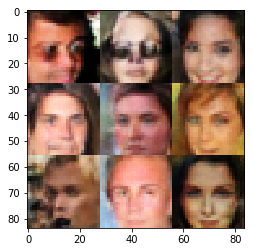

Epoch 11/20... Discriminator Loss: 0.5987... Generator Loss: 1.3984
Epoch 11/20... Discriminator Loss: 0.7826... Generator Loss: 1.0509
Epoch 11/20... Discriminator Loss: 0.8055... Generator Loss: 0.8062
Epoch 11/20... Discriminator Loss: 0.7733... Generator Loss: 1.0634
Epoch 11/20... Discriminator Loss: 1.0573... Generator Loss: 0.6133
Epoch 11/20... Discriminator Loss: 1.1834... Generator Loss: 0.5296
Epoch 11/20... Discriminator Loss: 0.7540... Generator Loss: 0.9936
Epoch 11/20... Discriminator Loss: 0.9098... Generator Loss: 0.8183
Epoch 11/20... Discriminator Loss: 1.0607... Generator Loss: 0.6528
Epoch 11/20... Discriminator Loss: 1.1536... Generator Loss: 0.4873


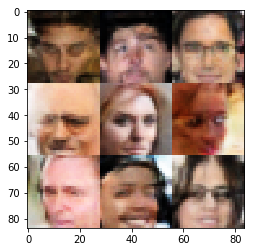

Epoch 11/20... Discriminator Loss: 0.9375... Generator Loss: 0.7150
Epoch 11/20... Discriminator Loss: 0.6779... Generator Loss: 1.0395
Epoch 11/20... Discriminator Loss: 0.8987... Generator Loss: 0.7997
Epoch 11/20... Discriminator Loss: 1.4266... Generator Loss: 0.3703
Epoch 11/20... Discriminator Loss: 0.9325... Generator Loss: 0.9187
Epoch 11/20... Discriminator Loss: 0.8913... Generator Loss: 0.9059
Epoch 11/20... Discriminator Loss: 1.2773... Generator Loss: 0.4580
Epoch 11/20... Discriminator Loss: 0.7796... Generator Loss: 1.1042
Epoch 11/20... Discriminator Loss: 0.9865... Generator Loss: 0.6996
Epoch 11/20... Discriminator Loss: 1.0424... Generator Loss: 0.6002


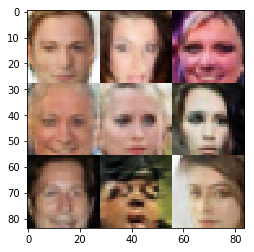

Epoch 12/20... Discriminator Loss: 0.7866... Generator Loss: 1.5097
Epoch 12/20... Discriminator Loss: 0.7528... Generator Loss: 0.9145
Epoch 12/20... Discriminator Loss: 0.8104... Generator Loss: 0.8587
Epoch 12/20... Discriminator Loss: 0.9939... Generator Loss: 0.6915
Epoch 12/20... Discriminator Loss: 0.8850... Generator Loss: 0.7286
Epoch 12/20... Discriminator Loss: 0.4914... Generator Loss: 1.9147
Epoch 12/20... Discriminator Loss: 0.7179... Generator Loss: 0.9881
Epoch 12/20... Discriminator Loss: 1.0460... Generator Loss: 0.8127
Epoch 12/20... Discriminator Loss: 0.7324... Generator Loss: 1.0047
Epoch 12/20... Discriminator Loss: 0.9525... Generator Loss: 0.8029


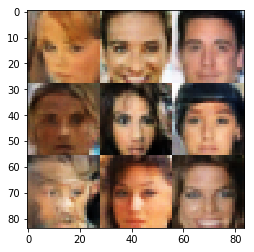

Epoch 12/20... Discriminator Loss: 1.0544... Generator Loss: 0.6073
Epoch 12/20... Discriminator Loss: 1.3050... Generator Loss: 0.4285
Epoch 12/20... Discriminator Loss: 0.9303... Generator Loss: 0.7170
Epoch 12/20... Discriminator Loss: 0.9732... Generator Loss: 1.4004
Epoch 12/20... Discriminator Loss: 1.2628... Generator Loss: 2.5643
Epoch 12/20... Discriminator Loss: 0.8782... Generator Loss: 1.2187
Epoch 12/20... Discriminator Loss: 0.7798... Generator Loss: 0.9584
Epoch 12/20... Discriminator Loss: 0.7245... Generator Loss: 1.8932
Epoch 12/20... Discriminator Loss: 1.1769... Generator Loss: 0.5123
Epoch 12/20... Discriminator Loss: 0.8550... Generator Loss: 0.8549


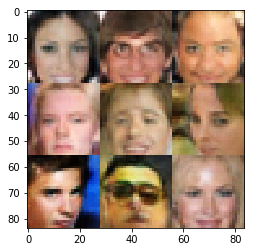

Epoch 12/20... Discriminator Loss: 0.5521... Generator Loss: 1.2805
Epoch 12/20... Discriminator Loss: 0.9074... Generator Loss: 0.8027
Epoch 12/20... Discriminator Loss: 0.7045... Generator Loss: 1.1629
Epoch 12/20... Discriminator Loss: 0.8569... Generator Loss: 0.8911
Epoch 12/20... Discriminator Loss: 1.3334... Generator Loss: 0.4171
Epoch 12/20... Discriminator Loss: 0.5456... Generator Loss: 1.4830
Epoch 12/20... Discriminator Loss: 1.1785... Generator Loss: 3.0291
Epoch 12/20... Discriminator Loss: 0.8187... Generator Loss: 1.0056
Epoch 12/20... Discriminator Loss: 0.5975... Generator Loss: 1.6073
Epoch 12/20... Discriminator Loss: 0.8692... Generator Loss: 0.8693


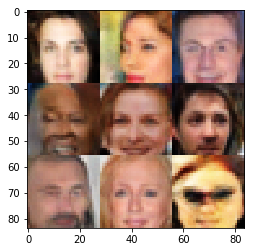

Epoch 12/20... Discriminator Loss: 1.1213... Generator Loss: 0.8290
Epoch 12/20... Discriminator Loss: 0.8660... Generator Loss: 0.8157
Epoch 12/20... Discriminator Loss: 0.8532... Generator Loss: 1.3810
Epoch 12/20... Discriminator Loss: 1.2083... Generator Loss: 0.5720
Epoch 12/20... Discriminator Loss: 1.7431... Generator Loss: 0.2742
Epoch 12/20... Discriminator Loss: 1.0915... Generator Loss: 0.5944
Epoch 12/20... Discriminator Loss: 0.7471... Generator Loss: 1.1959
Epoch 12/20... Discriminator Loss: 0.8455... Generator Loss: 1.5935
Epoch 12/20... Discriminator Loss: 0.8894... Generator Loss: 0.8210
Epoch 12/20... Discriminator Loss: 1.2364... Generator Loss: 0.4539


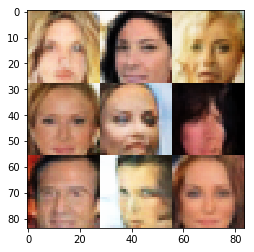

Epoch 12/20... Discriminator Loss: 0.8004... Generator Loss: 1.0071
Epoch 12/20... Discriminator Loss: 0.6508... Generator Loss: 1.0935
Epoch 12/20... Discriminator Loss: 0.6886... Generator Loss: 0.9783
Epoch 12/20... Discriminator Loss: 1.7686... Generator Loss: 0.2407
Epoch 12/20... Discriminator Loss: 0.6815... Generator Loss: 1.0866
Epoch 12/20... Discriminator Loss: 0.7614... Generator Loss: 0.9824
Epoch 12/20... Discriminator Loss: 0.7617... Generator Loss: 0.9605
Epoch 12/20... Discriminator Loss: 0.7217... Generator Loss: 0.9861
Epoch 12/20... Discriminator Loss: 0.8908... Generator Loss: 2.4617
Epoch 12/20... Discriminator Loss: 0.7737... Generator Loss: 1.3554


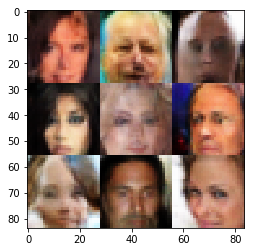

Epoch 12/20... Discriminator Loss: 1.1905... Generator Loss: 0.4813
Epoch 12/20... Discriminator Loss: 1.6187... Generator Loss: 0.2957
Epoch 12/20... Discriminator Loss: 0.9541... Generator Loss: 0.8155
Epoch 12/20... Discriminator Loss: 0.7563... Generator Loss: 1.0283
Epoch 12/20... Discriminator Loss: 0.8689... Generator Loss: 1.0208
Epoch 12/20... Discriminator Loss: 1.0026... Generator Loss: 2.3927
Epoch 12/20... Discriminator Loss: 0.7415... Generator Loss: 1.4649
Epoch 12/20... Discriminator Loss: 0.7871... Generator Loss: 0.9221
Epoch 12/20... Discriminator Loss: 1.7313... Generator Loss: 2.4992
Epoch 12/20... Discriminator Loss: 1.4674... Generator Loss: 0.4027


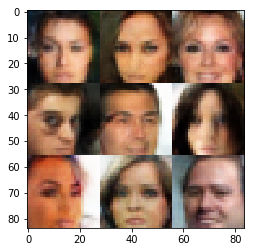

Epoch 12/20... Discriminator Loss: 1.1737... Generator Loss: 0.5857
Epoch 12/20... Discriminator Loss: 0.7193... Generator Loss: 1.1791
Epoch 12/20... Discriminator Loss: 0.9228... Generator Loss: 1.3658
Epoch 12/20... Discriminator Loss: 0.8749... Generator Loss: 0.7771
Epoch 12/20... Discriminator Loss: 1.2107... Generator Loss: 0.4992
Epoch 12/20... Discriminator Loss: 0.8173... Generator Loss: 1.6635
Epoch 12/20... Discriminator Loss: 1.0728... Generator Loss: 0.6291
Epoch 12/20... Discriminator Loss: 0.8615... Generator Loss: 0.7853
Epoch 12/20... Discriminator Loss: 0.8496... Generator Loss: 0.7988
Epoch 12/20... Discriminator Loss: 0.8382... Generator Loss: 0.8179


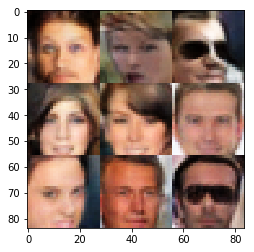

Epoch 12/20... Discriminator Loss: 0.5831... Generator Loss: 1.1783
Epoch 12/20... Discriminator Loss: 0.7243... Generator Loss: 1.0111
Epoch 12/20... Discriminator Loss: 0.7348... Generator Loss: 1.6209
Epoch 12/20... Discriminator Loss: 0.8592... Generator Loss: 0.8221
Epoch 12/20... Discriminator Loss: 0.8023... Generator Loss: 0.9168
Epoch 12/20... Discriminator Loss: 0.6587... Generator Loss: 1.3280
Epoch 12/20... Discriminator Loss: 0.6675... Generator Loss: 1.0390
Epoch 12/20... Discriminator Loss: 1.1100... Generator Loss: 0.6324
Epoch 12/20... Discriminator Loss: 0.8313... Generator Loss: 0.8439
Epoch 12/20... Discriminator Loss: 0.8621... Generator Loss: 0.9215


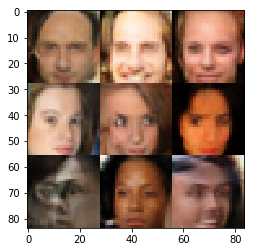

Epoch 12/20... Discriminator Loss: 0.7972... Generator Loss: 0.9034
Epoch 12/20... Discriminator Loss: 1.0242... Generator Loss: 0.6424
Epoch 12/20... Discriminator Loss: 1.1079... Generator Loss: 0.5567
Epoch 12/20... Discriminator Loss: 0.9901... Generator Loss: 0.8012
Epoch 12/20... Discriminator Loss: 1.8141... Generator Loss: 2.4448
Epoch 12/20... Discriminator Loss: 1.0569... Generator Loss: 0.9007
Epoch 12/20... Discriminator Loss: 0.9186... Generator Loss: 0.8494
Epoch 12/20... Discriminator Loss: 0.7039... Generator Loss: 1.1867
Epoch 12/20... Discriminator Loss: 0.9293... Generator Loss: 0.8371
Epoch 12/20... Discriminator Loss: 0.8909... Generator Loss: 0.7661


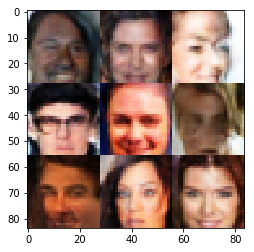

Epoch 12/20... Discriminator Loss: 1.1464... Generator Loss: 2.6945
Epoch 12/20... Discriminator Loss: 0.8647... Generator Loss: 1.3844
Epoch 12/20... Discriminator Loss: 1.0313... Generator Loss: 0.8449
Epoch 12/20... Discriminator Loss: 0.8409... Generator Loss: 0.8275
Epoch 12/20... Discriminator Loss: 1.2458... Generator Loss: 0.4437
Epoch 12/20... Discriminator Loss: 1.4440... Generator Loss: 0.3889
Epoch 12/20... Discriminator Loss: 0.9469... Generator Loss: 0.7070
Epoch 12/20... Discriminator Loss: 0.9876... Generator Loss: 0.6889
Epoch 12/20... Discriminator Loss: 0.8058... Generator Loss: 0.8889
Epoch 12/20... Discriminator Loss: 1.1486... Generator Loss: 0.5885


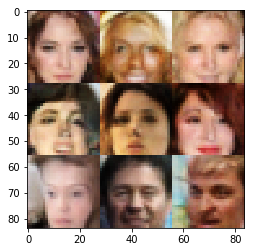

Epoch 12/20... Discriminator Loss: 0.5941... Generator Loss: 1.4939
Epoch 12/20... Discriminator Loss: 0.8546... Generator Loss: 0.8821
Epoch 12/20... Discriminator Loss: 0.7281... Generator Loss: 0.8963
Epoch 12/20... Discriminator Loss: 1.0154... Generator Loss: 0.6733
Epoch 12/20... Discriminator Loss: 0.8925... Generator Loss: 0.7104
Epoch 12/20... Discriminator Loss: 0.7926... Generator Loss: 0.8376
Epoch 12/20... Discriminator Loss: 0.5967... Generator Loss: 1.7976
Epoch 12/20... Discriminator Loss: 0.8046... Generator Loss: 1.0286
Epoch 12/20... Discriminator Loss: 0.9890... Generator Loss: 0.6803
Epoch 12/20... Discriminator Loss: 0.6156... Generator Loss: 1.2765


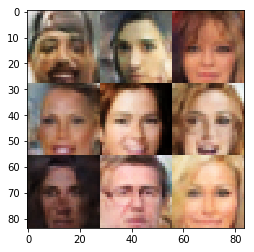

Epoch 12/20... Discriminator Loss: 1.0234... Generator Loss: 0.6826
Epoch 12/20... Discriminator Loss: 0.5613... Generator Loss: 1.6189
Epoch 12/20... Discriminator Loss: 0.8020... Generator Loss: 1.4588
Epoch 12/20... Discriminator Loss: 0.7596... Generator Loss: 1.2706
Epoch 12/20... Discriminator Loss: 0.8845... Generator Loss: 0.9289
Epoch 12/20... Discriminator Loss: 0.9920... Generator Loss: 0.6895
Epoch 12/20... Discriminator Loss: 0.7639... Generator Loss: 1.5816
Epoch 12/20... Discriminator Loss: 1.6653... Generator Loss: 0.2795
Epoch 12/20... Discriminator Loss: 1.5873... Generator Loss: 0.3362
Epoch 12/20... Discriminator Loss: 0.5914... Generator Loss: 1.5457


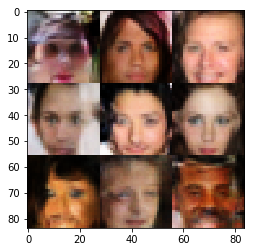

Epoch 12/20... Discriminator Loss: 0.8176... Generator Loss: 0.9046
Epoch 12/20... Discriminator Loss: 0.9027... Generator Loss: 0.7426
Epoch 12/20... Discriminator Loss: 0.9716... Generator Loss: 0.6743
Epoch 12/20... Discriminator Loss: 0.9387... Generator Loss: 1.1723
Epoch 12/20... Discriminator Loss: 0.6676... Generator Loss: 1.1178
Epoch 12/20... Discriminator Loss: 1.2143... Generator Loss: 0.5059
Epoch 12/20... Discriminator Loss: 0.7616... Generator Loss: 0.8534
Epoch 12/20... Discriminator Loss: 0.6407... Generator Loss: 1.0470
Epoch 12/20... Discriminator Loss: 1.0134... Generator Loss: 1.2946
Epoch 12/20... Discriminator Loss: 1.8443... Generator Loss: 0.2267


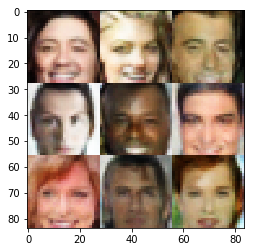

Epoch 12/20... Discriminator Loss: 0.7909... Generator Loss: 1.0974
Epoch 12/20... Discriminator Loss: 0.5608... Generator Loss: 1.3744
Epoch 12/20... Discriminator Loss: 1.2017... Generator Loss: 0.4865
Epoch 12/20... Discriminator Loss: 0.9014... Generator Loss: 0.7600
Epoch 12/20... Discriminator Loss: 0.7144... Generator Loss: 1.2233
Epoch 12/20... Discriminator Loss: 1.2149... Generator Loss: 0.4951
Epoch 12/20... Discriminator Loss: 0.8198... Generator Loss: 1.0604
Epoch 12/20... Discriminator Loss: 0.7861... Generator Loss: 0.8738
Epoch 12/20... Discriminator Loss: 1.1570... Generator Loss: 0.5854
Epoch 12/20... Discriminator Loss: 1.1330... Generator Loss: 0.5241


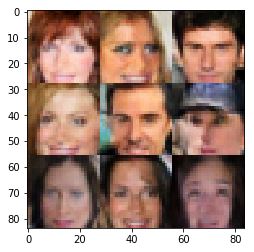

Epoch 12/20... Discriminator Loss: 0.8623... Generator Loss: 1.9831
Epoch 12/20... Discriminator Loss: 0.8362... Generator Loss: 0.7998
Epoch 12/20... Discriminator Loss: 1.1185... Generator Loss: 0.5359
Epoch 12/20... Discriminator Loss: 1.2335... Generator Loss: 0.4686
Epoch 12/20... Discriminator Loss: 0.9698... Generator Loss: 1.5323
Epoch 12/20... Discriminator Loss: 1.1070... Generator Loss: 0.5366
Epoch 12/20... Discriminator Loss: 0.7767... Generator Loss: 0.9726
Epoch 12/20... Discriminator Loss: 1.1010... Generator Loss: 0.5602
Epoch 12/20... Discriminator Loss: 1.2255... Generator Loss: 0.5944
Epoch 12/20... Discriminator Loss: 0.6233... Generator Loss: 1.1790


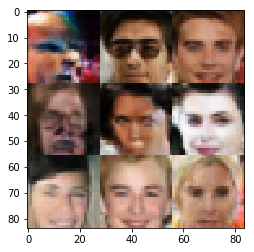

Epoch 12/20... Discriminator Loss: 0.9864... Generator Loss: 0.7116
Epoch 12/20... Discriminator Loss: 0.7226... Generator Loss: 1.8315
Epoch 12/20... Discriminator Loss: 0.5522... Generator Loss: 1.6067
Epoch 12/20... Discriminator Loss: 1.1377... Generator Loss: 0.5549
Epoch 12/20... Discriminator Loss: 0.7950... Generator Loss: 0.9881
Epoch 12/20... Discriminator Loss: 1.0041... Generator Loss: 0.9624
Epoch 12/20... Discriminator Loss: 0.9476... Generator Loss: 0.8069
Epoch 12/20... Discriminator Loss: 0.7083... Generator Loss: 1.5127
Epoch 13/20... Discriminator Loss: 1.3483... Generator Loss: 0.4394
Epoch 13/20... Discriminator Loss: 1.1278... Generator Loss: 0.5940


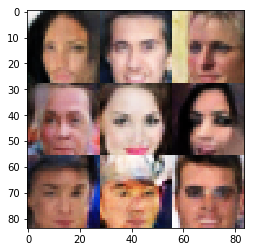

Epoch 13/20... Discriminator Loss: 0.7891... Generator Loss: 0.9955
Epoch 13/20... Discriminator Loss: 0.5783... Generator Loss: 1.2563
Epoch 13/20... Discriminator Loss: 0.8955... Generator Loss: 0.7337
Epoch 13/20... Discriminator Loss: 0.3789... Generator Loss: 1.9316
Epoch 13/20... Discriminator Loss: 0.9037... Generator Loss: 2.1573
Epoch 13/20... Discriminator Loss: 0.5593... Generator Loss: 1.2139
Epoch 13/20... Discriminator Loss: 1.7071... Generator Loss: 0.3080
Epoch 13/20... Discriminator Loss: 1.0042... Generator Loss: 0.8558
Epoch 13/20... Discriminator Loss: 0.5855... Generator Loss: 1.5028
Epoch 13/20... Discriminator Loss: 0.7489... Generator Loss: 1.1558


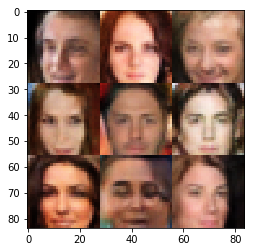

Epoch 13/20... Discriminator Loss: 0.9801... Generator Loss: 0.6730
Epoch 13/20... Discriminator Loss: 0.8201... Generator Loss: 0.8770
Epoch 13/20... Discriminator Loss: 0.8093... Generator Loss: 1.3430
Epoch 13/20... Discriminator Loss: 0.8507... Generator Loss: 1.1000
Epoch 13/20... Discriminator Loss: 0.9778... Generator Loss: 1.8082
Epoch 13/20... Discriminator Loss: 0.5228... Generator Loss: 1.3718
Epoch 13/20... Discriminator Loss: 0.8683... Generator Loss: 0.9075
Epoch 13/20... Discriminator Loss: 0.7287... Generator Loss: 1.2101
Epoch 13/20... Discriminator Loss: 0.9315... Generator Loss: 0.7377
Epoch 13/20... Discriminator Loss: 0.9697... Generator Loss: 0.8989


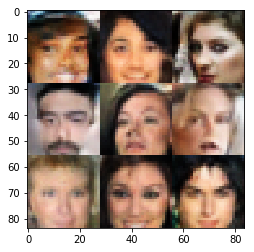

Epoch 13/20... Discriminator Loss: 0.7971... Generator Loss: 1.7337
Epoch 13/20... Discriminator Loss: 0.9034... Generator Loss: 0.7881
Epoch 13/20... Discriminator Loss: 0.7777... Generator Loss: 2.3119
Epoch 13/20... Discriminator Loss: 0.9504... Generator Loss: 0.7019
Epoch 13/20... Discriminator Loss: 0.5166... Generator Loss: 1.3276
Epoch 13/20... Discriminator Loss: 1.7286... Generator Loss: 0.2762
Epoch 13/20... Discriminator Loss: 1.3152... Generator Loss: 0.4427
Epoch 13/20... Discriminator Loss: 0.9337... Generator Loss: 0.8651
Epoch 13/20... Discriminator Loss: 1.0421... Generator Loss: 0.6713
Epoch 13/20... Discriminator Loss: 0.7489... Generator Loss: 1.0435


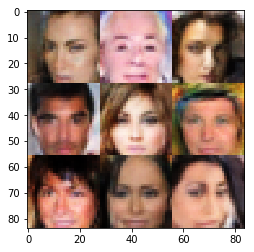

Epoch 13/20... Discriminator Loss: 0.6985... Generator Loss: 1.0541
Epoch 13/20... Discriminator Loss: 1.5964... Generator Loss: 0.3056
Epoch 13/20... Discriminator Loss: 1.1186... Generator Loss: 0.5986
Epoch 13/20... Discriminator Loss: 1.0745... Generator Loss: 0.6351
Epoch 13/20... Discriminator Loss: 0.7273... Generator Loss: 1.5934
Epoch 13/20... Discriminator Loss: 0.8313... Generator Loss: 1.0279
Epoch 13/20... Discriminator Loss: 1.0531... Generator Loss: 0.7124
Epoch 13/20... Discriminator Loss: 0.7064... Generator Loss: 1.5827
Epoch 13/20... Discriminator Loss: 0.6574... Generator Loss: 1.4042
Epoch 13/20... Discriminator Loss: 0.7901... Generator Loss: 1.0517


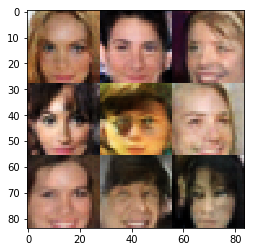

Epoch 13/20... Discriminator Loss: 0.9464... Generator Loss: 1.1371
Epoch 13/20... Discriminator Loss: 0.6404... Generator Loss: 1.1890
Epoch 13/20... Discriminator Loss: 1.0635... Generator Loss: 0.5810
Epoch 13/20... Discriminator Loss: 0.8422... Generator Loss: 1.2162
Epoch 13/20... Discriminator Loss: 0.7841... Generator Loss: 1.0168
Epoch 13/20... Discriminator Loss: 0.7677... Generator Loss: 0.9689
Epoch 13/20... Discriminator Loss: 1.0456... Generator Loss: 0.6383
Epoch 13/20... Discriminator Loss: 0.8064... Generator Loss: 1.1234
Epoch 13/20... Discriminator Loss: 0.9451... Generator Loss: 0.6986
Epoch 13/20... Discriminator Loss: 0.6598... Generator Loss: 1.7452


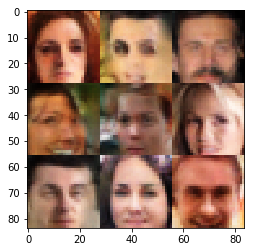

Epoch 13/20... Discriminator Loss: 0.8342... Generator Loss: 1.2838
Epoch 13/20... Discriminator Loss: 0.8268... Generator Loss: 1.4049
Epoch 13/20... Discriminator Loss: 0.8740... Generator Loss: 1.1626
Epoch 13/20... Discriminator Loss: 0.9341... Generator Loss: 0.7935
Epoch 13/20... Discriminator Loss: 0.8784... Generator Loss: 0.7099
Epoch 13/20... Discriminator Loss: 1.5485... Generator Loss: 0.3824
Epoch 13/20... Discriminator Loss: 0.8406... Generator Loss: 0.8216
Epoch 13/20... Discriminator Loss: 0.9507... Generator Loss: 0.7629
Epoch 13/20... Discriminator Loss: 0.6256... Generator Loss: 2.0648
Epoch 13/20... Discriminator Loss: 0.6028... Generator Loss: 1.5485


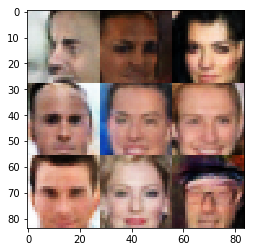

Epoch 13/20... Discriminator Loss: 0.9154... Generator Loss: 0.7458
Epoch 13/20... Discriminator Loss: 0.8571... Generator Loss: 1.0632
Epoch 13/20... Discriminator Loss: 0.8998... Generator Loss: 0.7343
Epoch 13/20... Discriminator Loss: 0.9299... Generator Loss: 0.7701
Epoch 13/20... Discriminator Loss: 1.3168... Generator Loss: 0.4756
Epoch 13/20... Discriminator Loss: 0.9417... Generator Loss: 0.7010
Epoch 13/20... Discriminator Loss: 1.1044... Generator Loss: 0.5689
Epoch 13/20... Discriminator Loss: 0.6029... Generator Loss: 1.2912
Epoch 13/20... Discriminator Loss: 0.6011... Generator Loss: 2.3188
Epoch 13/20... Discriminator Loss: 1.4234... Generator Loss: 3.5900


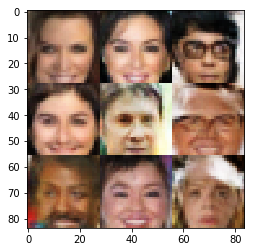

Epoch 13/20... Discriminator Loss: 0.6342... Generator Loss: 1.3857
Epoch 13/20... Discriminator Loss: 0.9855... Generator Loss: 0.6976
Epoch 13/20... Discriminator Loss: 0.8429... Generator Loss: 0.9429
Epoch 13/20... Discriminator Loss: 0.7980... Generator Loss: 0.9857
Epoch 13/20... Discriminator Loss: 0.8211... Generator Loss: 0.8085
Epoch 13/20... Discriminator Loss: 0.9087... Generator Loss: 1.3285
Epoch 13/20... Discriminator Loss: 1.1293... Generator Loss: 2.9783
Epoch 13/20... Discriminator Loss: 0.9835... Generator Loss: 0.6926
Epoch 13/20... Discriminator Loss: 0.8448... Generator Loss: 1.4050
Epoch 13/20... Discriminator Loss: 0.6909... Generator Loss: 1.1530


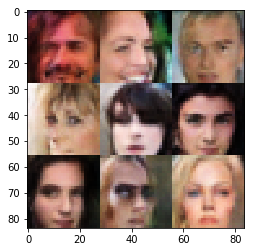

Epoch 13/20... Discriminator Loss: 0.8142... Generator Loss: 1.0002
Epoch 13/20... Discriminator Loss: 0.9502... Generator Loss: 0.8148
Epoch 13/20... Discriminator Loss: 0.5830... Generator Loss: 1.6606
Epoch 13/20... Discriminator Loss: 0.9701... Generator Loss: 0.7057
Epoch 13/20... Discriminator Loss: 1.4149... Generator Loss: 0.4430
Epoch 13/20... Discriminator Loss: 0.5956... Generator Loss: 1.4532
Epoch 13/20... Discriminator Loss: 0.7943... Generator Loss: 0.8545
Epoch 13/20... Discriminator Loss: 0.8072... Generator Loss: 0.8937
Epoch 13/20... Discriminator Loss: 0.4656... Generator Loss: 1.5725
Epoch 13/20... Discriminator Loss: 0.8717... Generator Loss: 0.8417


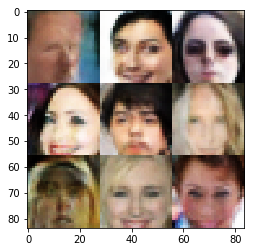

Epoch 13/20... Discriminator Loss: 0.8396... Generator Loss: 0.8626
Epoch 13/20... Discriminator Loss: 0.7866... Generator Loss: 1.0660
Epoch 13/20... Discriminator Loss: 0.9621... Generator Loss: 0.8431
Epoch 13/20... Discriminator Loss: 0.7747... Generator Loss: 1.0152
Epoch 13/20... Discriminator Loss: 1.6285... Generator Loss: 0.2867
Epoch 13/20... Discriminator Loss: 1.1350... Generator Loss: 0.5863
Epoch 13/20... Discriminator Loss: 0.9487... Generator Loss: 1.0613
Epoch 13/20... Discriminator Loss: 0.7088... Generator Loss: 1.5197
Epoch 13/20... Discriminator Loss: 0.8985... Generator Loss: 0.7727
Epoch 13/20... Discriminator Loss: 0.7342... Generator Loss: 1.0197


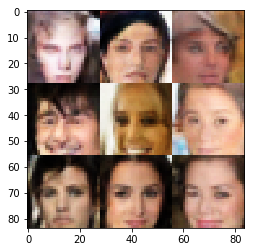

Epoch 13/20... Discriminator Loss: 0.6688... Generator Loss: 1.1210
Epoch 13/20... Discriminator Loss: 1.1018... Generator Loss: 0.6162
Epoch 13/20... Discriminator Loss: 0.6809... Generator Loss: 1.6737
Epoch 13/20... Discriminator Loss: 0.6692... Generator Loss: 1.1642
Epoch 13/20... Discriminator Loss: 0.7695... Generator Loss: 1.2464
Epoch 13/20... Discriminator Loss: 1.8759... Generator Loss: 0.2789
Epoch 13/20... Discriminator Loss: 0.7239... Generator Loss: 1.0097
Epoch 13/20... Discriminator Loss: 0.8667... Generator Loss: 0.9337
Epoch 13/20... Discriminator Loss: 0.9066... Generator Loss: 0.7335
Epoch 13/20... Discriminator Loss: 0.8950... Generator Loss: 0.8873


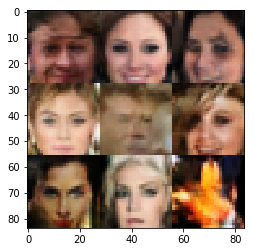

Epoch 13/20... Discriminator Loss: 0.6792... Generator Loss: 1.3037
Epoch 13/20... Discriminator Loss: 0.8547... Generator Loss: 0.7777
Epoch 13/20... Discriminator Loss: 0.7589... Generator Loss: 1.0980
Epoch 13/20... Discriminator Loss: 1.0527... Generator Loss: 0.5791
Epoch 13/20... Discriminator Loss: 0.5161... Generator Loss: 1.3886
Epoch 13/20... Discriminator Loss: 0.8970... Generator Loss: 0.8871
Epoch 13/20... Discriminator Loss: 1.1084... Generator Loss: 0.5282
Epoch 13/20... Discriminator Loss: 0.8119... Generator Loss: 1.0429
Epoch 13/20... Discriminator Loss: 1.3383... Generator Loss: 0.4132
Epoch 13/20... Discriminator Loss: 1.1174... Generator Loss: 0.6101


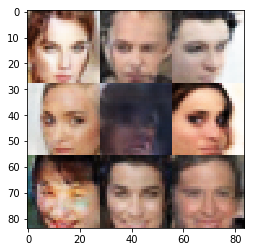

Epoch 13/20... Discriminator Loss: 0.8154... Generator Loss: 0.9239
Epoch 13/20... Discriminator Loss: 0.8538... Generator Loss: 0.8474
Epoch 13/20... Discriminator Loss: 0.7113... Generator Loss: 1.5143
Epoch 13/20... Discriminator Loss: 0.6085... Generator Loss: 1.1155
Epoch 13/20... Discriminator Loss: 0.6842... Generator Loss: 1.3531
Epoch 13/20... Discriminator Loss: 0.8611... Generator Loss: 1.8189
Epoch 13/20... Discriminator Loss: 0.9522... Generator Loss: 0.6678
Epoch 13/20... Discriminator Loss: 0.6639... Generator Loss: 1.2926
Epoch 13/20... Discriminator Loss: 1.0204... Generator Loss: 0.7323
Epoch 13/20... Discriminator Loss: 0.9465... Generator Loss: 0.7618


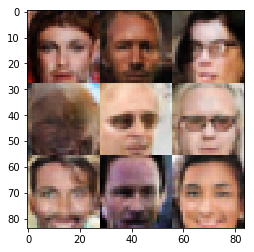

Epoch 13/20... Discriminator Loss: 0.7416... Generator Loss: 1.0425
Epoch 13/20... Discriminator Loss: 1.4784... Generator Loss: 0.3716
Epoch 13/20... Discriminator Loss: 0.5251... Generator Loss: 1.4434
Epoch 13/20... Discriminator Loss: 0.8027... Generator Loss: 1.1618
Epoch 13/20... Discriminator Loss: 0.6946... Generator Loss: 1.0655
Epoch 13/20... Discriminator Loss: 0.6788... Generator Loss: 1.5080
Epoch 13/20... Discriminator Loss: 0.6489... Generator Loss: 1.1703
Epoch 13/20... Discriminator Loss: 1.3783... Generator Loss: 0.4294
Epoch 13/20... Discriminator Loss: 0.5858... Generator Loss: 1.6295
Epoch 13/20... Discriminator Loss: 0.9474... Generator Loss: 0.7198


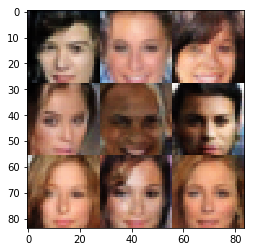

Epoch 13/20... Discriminator Loss: 0.4423... Generator Loss: 1.5540
Epoch 13/20... Discriminator Loss: 0.7820... Generator Loss: 1.4481
Epoch 13/20... Discriminator Loss: 0.6731... Generator Loss: 1.0276
Epoch 13/20... Discriminator Loss: 0.6141... Generator Loss: 1.1004
Epoch 13/20... Discriminator Loss: 1.0336... Generator Loss: 0.6924
Epoch 13/20... Discriminator Loss: 0.5799... Generator Loss: 1.8927
Epoch 13/20... Discriminator Loss: 0.9775... Generator Loss: 0.6306
Epoch 13/20... Discriminator Loss: 0.8545... Generator Loss: 0.9476
Epoch 13/20... Discriminator Loss: 0.6284... Generator Loss: 1.0327
Epoch 13/20... Discriminator Loss: 0.8520... Generator Loss: 0.7610


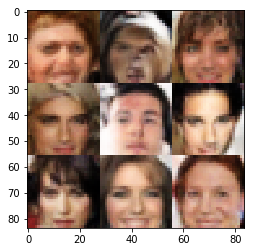

Epoch 13/20... Discriminator Loss: 0.6064... Generator Loss: 1.5647
Epoch 13/20... Discriminator Loss: 1.3125... Generator Loss: 2.2891
Epoch 13/20... Discriminator Loss: 0.8533... Generator Loss: 0.8599
Epoch 13/20... Discriminator Loss: 0.8328... Generator Loss: 1.0044
Epoch 13/20... Discriminator Loss: 0.9007... Generator Loss: 0.7796
Epoch 13/20... Discriminator Loss: 0.9889... Generator Loss: 0.7553
Epoch 14/20... Discriminator Loss: 1.0745... Generator Loss: 1.7881
Epoch 14/20... Discriminator Loss: 0.7279... Generator Loss: 1.5222
Epoch 14/20... Discriminator Loss: 0.8788... Generator Loss: 0.8550
Epoch 14/20... Discriminator Loss: 1.0833... Generator Loss: 0.5821


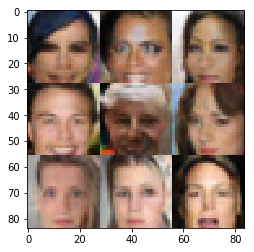

Epoch 14/20... Discriminator Loss: 1.0904... Generator Loss: 0.6089
Epoch 14/20... Discriminator Loss: 0.7598... Generator Loss: 0.9070
Epoch 14/20... Discriminator Loss: 1.3106... Generator Loss: 0.4654
Epoch 14/20... Discriminator Loss: 1.2457... Generator Loss: 0.4994
Epoch 14/20... Discriminator Loss: 1.6952... Generator Loss: 0.3079
Epoch 14/20... Discriminator Loss: 0.9454... Generator Loss: 0.7827
Epoch 14/20... Discriminator Loss: 1.0413... Generator Loss: 0.6585
Epoch 14/20... Discriminator Loss: 0.7735... Generator Loss: 0.9278
Epoch 14/20... Discriminator Loss: 0.8177... Generator Loss: 0.9403
Epoch 14/20... Discriminator Loss: 0.6957... Generator Loss: 1.1351


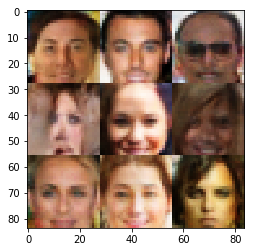

Epoch 14/20... Discriminator Loss: 0.6258... Generator Loss: 1.2772
Epoch 14/20... Discriminator Loss: 0.5527... Generator Loss: 1.6093
Epoch 14/20... Discriminator Loss: 0.6218... Generator Loss: 1.1058
Epoch 14/20... Discriminator Loss: 1.5600... Generator Loss: 0.3256
Epoch 14/20... Discriminator Loss: 0.8908... Generator Loss: 0.7940
Epoch 14/20... Discriminator Loss: 0.7987... Generator Loss: 1.4132
Epoch 14/20... Discriminator Loss: 0.6302... Generator Loss: 1.1289
Epoch 14/20... Discriminator Loss: 0.6094... Generator Loss: 1.1754
Epoch 14/20... Discriminator Loss: 1.1093... Generator Loss: 0.5901
Epoch 14/20... Discriminator Loss: 0.8331... Generator Loss: 0.8910


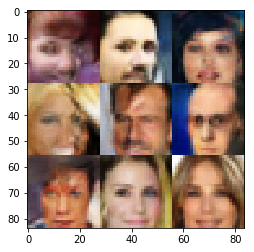

Epoch 14/20... Discriminator Loss: 1.3614... Generator Loss: 0.4398
Epoch 14/20... Discriminator Loss: 0.4435... Generator Loss: 2.0514
Epoch 14/20... Discriminator Loss: 0.8661... Generator Loss: 0.8177
Epoch 14/20... Discriminator Loss: 0.7717... Generator Loss: 1.7078
Epoch 14/20... Discriminator Loss: 0.6375... Generator Loss: 1.3904
Epoch 14/20... Discriminator Loss: 0.6265... Generator Loss: 1.5189
Epoch 14/20... Discriminator Loss: 1.0374... Generator Loss: 0.6327
Epoch 14/20... Discriminator Loss: 0.6941... Generator Loss: 1.2001
Epoch 14/20... Discriminator Loss: 0.8402... Generator Loss: 1.9043
Epoch 14/20... Discriminator Loss: 0.6063... Generator Loss: 1.1274


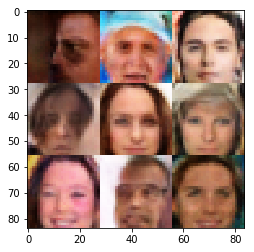

Epoch 14/20... Discriminator Loss: 0.8045... Generator Loss: 0.8924
Epoch 14/20... Discriminator Loss: 1.4497... Generator Loss: 0.3885
Epoch 14/20... Discriminator Loss: 0.6704... Generator Loss: 1.1356
Epoch 14/20... Discriminator Loss: 0.9522... Generator Loss: 0.7744
Epoch 14/20... Discriminator Loss: 0.7185... Generator Loss: 1.0565
Epoch 14/20... Discriminator Loss: 0.7412... Generator Loss: 0.9338
Epoch 14/20... Discriminator Loss: 1.0175... Generator Loss: 0.6258
Epoch 14/20... Discriminator Loss: 0.9379... Generator Loss: 0.6826
Epoch 14/20... Discriminator Loss: 0.6797... Generator Loss: 1.2718
Epoch 14/20... Discriminator Loss: 0.8946... Generator Loss: 0.8846


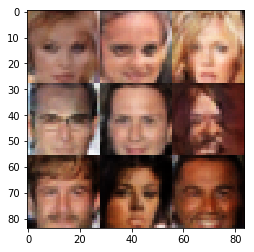

Epoch 14/20... Discriminator Loss: 0.8172... Generator Loss: 0.8310
Epoch 14/20... Discriminator Loss: 0.5253... Generator Loss: 1.4048
Epoch 14/20... Discriminator Loss: 0.7177... Generator Loss: 0.9998
Epoch 14/20... Discriminator Loss: 0.8662... Generator Loss: 0.7666
Epoch 14/20... Discriminator Loss: 0.7789... Generator Loss: 0.8109
Epoch 14/20... Discriminator Loss: 0.6962... Generator Loss: 1.2456
Epoch 14/20... Discriminator Loss: 1.2448... Generator Loss: 0.4542
Epoch 14/20... Discriminator Loss: 0.4412... Generator Loss: 1.8931
Epoch 14/20... Discriminator Loss: 0.8007... Generator Loss: 2.1992
Epoch 14/20... Discriminator Loss: 0.9047... Generator Loss: 0.8071


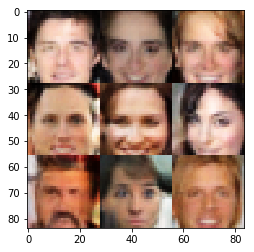

Epoch 14/20... Discriminator Loss: 0.9174... Generator Loss: 0.7121
Epoch 14/20... Discriminator Loss: 1.2441... Generator Loss: 2.5014
Epoch 14/20... Discriminator Loss: 1.0513... Generator Loss: 0.6555
Epoch 14/20... Discriminator Loss: 1.1419... Generator Loss: 0.5631
Epoch 14/20... Discriminator Loss: 0.8957... Generator Loss: 1.1804
Epoch 14/20... Discriminator Loss: 0.7802... Generator Loss: 0.9072
Epoch 14/20... Discriminator Loss: 0.7486... Generator Loss: 0.8949
Epoch 14/20... Discriminator Loss: 1.5914... Generator Loss: 0.2896
Epoch 14/20... Discriminator Loss: 1.0277... Generator Loss: 0.6278
Epoch 14/20... Discriminator Loss: 0.6794... Generator Loss: 1.6409


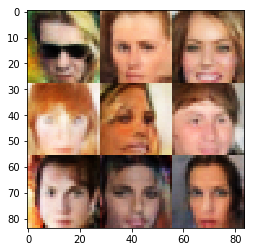

Epoch 14/20... Discriminator Loss: 1.0588... Generator Loss: 2.2889
Epoch 14/20... Discriminator Loss: 1.0592... Generator Loss: 0.5724
Epoch 14/20... Discriminator Loss: 1.0127... Generator Loss: 0.6469
Epoch 14/20... Discriminator Loss: 1.1801... Generator Loss: 0.5438
Epoch 14/20... Discriminator Loss: 0.9270... Generator Loss: 0.6806
Epoch 14/20... Discriminator Loss: 1.6641... Generator Loss: 0.2838
Epoch 14/20... Discriminator Loss: 1.4010... Generator Loss: 0.4275
Epoch 14/20... Discriminator Loss: 0.6904... Generator Loss: 1.0091
Epoch 14/20... Discriminator Loss: 1.1491... Generator Loss: 0.6095
Epoch 14/20... Discriminator Loss: 0.7650... Generator Loss: 2.2606


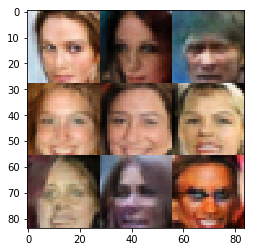

Epoch 14/20... Discriminator Loss: 0.5965... Generator Loss: 1.3106
Epoch 14/20... Discriminator Loss: 0.9732... Generator Loss: 0.6489
Epoch 14/20... Discriminator Loss: 0.6591... Generator Loss: 1.6483
Epoch 14/20... Discriminator Loss: 0.5793... Generator Loss: 1.7095
Epoch 14/20... Discriminator Loss: 0.6796... Generator Loss: 1.3748
Epoch 14/20... Discriminator Loss: 0.8790... Generator Loss: 0.7695
Epoch 14/20... Discriminator Loss: 0.5759... Generator Loss: 1.4704
Epoch 14/20... Discriminator Loss: 0.7161... Generator Loss: 1.2974
Epoch 14/20... Discriminator Loss: 0.7784... Generator Loss: 1.4650
Epoch 14/20... Discriminator Loss: 0.7373... Generator Loss: 1.9844


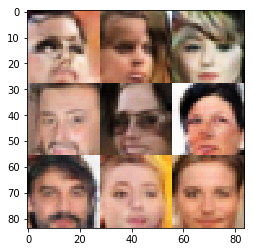

Epoch 14/20... Discriminator Loss: 0.8705... Generator Loss: 0.8945
Epoch 14/20... Discriminator Loss: 0.4723... Generator Loss: 1.5059
Epoch 14/20... Discriminator Loss: 1.3782... Generator Loss: 0.3931
Epoch 14/20... Discriminator Loss: 0.9915... Generator Loss: 0.7164
Epoch 14/20... Discriminator Loss: 0.6837... Generator Loss: 1.1968
Epoch 14/20... Discriminator Loss: 0.6862... Generator Loss: 1.0590
Epoch 14/20... Discriminator Loss: 0.7061... Generator Loss: 1.1671
Epoch 14/20... Discriminator Loss: 0.8058... Generator Loss: 0.8874
Epoch 14/20... Discriminator Loss: 1.0610... Generator Loss: 2.2941
Epoch 14/20... Discriminator Loss: 0.8903... Generator Loss: 0.9812


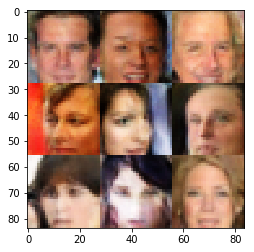

Epoch 14/20... Discriminator Loss: 0.8790... Generator Loss: 0.8470
Epoch 14/20... Discriminator Loss: 0.8257... Generator Loss: 0.8477
Epoch 14/20... Discriminator Loss: 0.8343... Generator Loss: 1.2646
Epoch 14/20... Discriminator Loss: 0.9463... Generator Loss: 0.6994
Epoch 14/20... Discriminator Loss: 0.7304... Generator Loss: 1.2084
Epoch 14/20... Discriminator Loss: 0.6826... Generator Loss: 1.3312
Epoch 14/20... Discriminator Loss: 0.8203... Generator Loss: 1.2486
Epoch 14/20... Discriminator Loss: 0.7614... Generator Loss: 0.9517
Epoch 14/20... Discriminator Loss: 0.7915... Generator Loss: 0.9069
Epoch 14/20... Discriminator Loss: 1.1949... Generator Loss: 0.5383


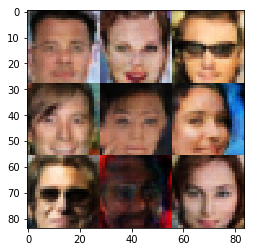

Epoch 14/20... Discriminator Loss: 0.6566... Generator Loss: 1.3774
Epoch 14/20... Discriminator Loss: 0.9861... Generator Loss: 0.6423
Epoch 14/20... Discriminator Loss: 0.8946... Generator Loss: 0.7370
Epoch 14/20... Discriminator Loss: 0.7958... Generator Loss: 1.0774
Epoch 14/20... Discriminator Loss: 1.6717... Generator Loss: 0.2885
Epoch 14/20... Discriminator Loss: 0.7352... Generator Loss: 1.6686
Epoch 14/20... Discriminator Loss: 0.7899... Generator Loss: 0.8369
Epoch 14/20... Discriminator Loss: 1.0773... Generator Loss: 0.6032
Epoch 14/20... Discriminator Loss: 0.5547... Generator Loss: 1.2880
Epoch 14/20... Discriminator Loss: 1.2212... Generator Loss: 0.4812


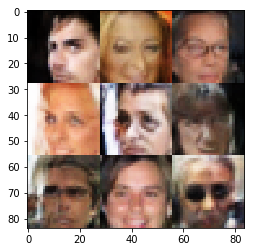

Epoch 14/20... Discriminator Loss: 1.0792... Generator Loss: 0.5911
Epoch 14/20... Discriminator Loss: 0.8738... Generator Loss: 0.8870
Epoch 14/20... Discriminator Loss: 1.0852... Generator Loss: 0.5798
Epoch 14/20... Discriminator Loss: 0.7973... Generator Loss: 0.9912
Epoch 14/20... Discriminator Loss: 0.6038... Generator Loss: 1.2475
Epoch 14/20... Discriminator Loss: 1.0945... Generator Loss: 2.0348
Epoch 14/20... Discriminator Loss: 0.7935... Generator Loss: 1.3864
Epoch 14/20... Discriminator Loss: 1.4301... Generator Loss: 0.3922
Epoch 14/20... Discriminator Loss: 0.7050... Generator Loss: 1.2215
Epoch 14/20... Discriminator Loss: 0.5905... Generator Loss: 1.5904


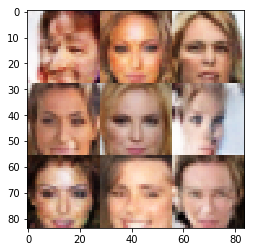

Epoch 14/20... Discriminator Loss: 0.5858... Generator Loss: 1.2260
Epoch 14/20... Discriminator Loss: 0.9890... Generator Loss: 0.7088
Epoch 14/20... Discriminator Loss: 0.4364... Generator Loss: 2.0511
Epoch 14/20... Discriminator Loss: 0.4926... Generator Loss: 1.3776
Epoch 14/20... Discriminator Loss: 0.6949... Generator Loss: 1.0692
Epoch 14/20... Discriminator Loss: 1.0347... Generator Loss: 0.6867
Epoch 14/20... Discriminator Loss: 0.9521... Generator Loss: 0.7332
Epoch 14/20... Discriminator Loss: 0.8265... Generator Loss: 1.2850
Epoch 14/20... Discriminator Loss: 0.7198... Generator Loss: 1.1912
Epoch 14/20... Discriminator Loss: 0.7892... Generator Loss: 0.9469


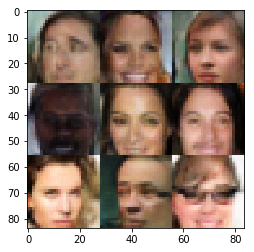

Epoch 14/20... Discriminator Loss: 0.6433... Generator Loss: 1.5905
Epoch 14/20... Discriminator Loss: 0.8566... Generator Loss: 0.8494
Epoch 14/20... Discriminator Loss: 0.8919... Generator Loss: 1.4950
Epoch 14/20... Discriminator Loss: 0.4408... Generator Loss: 2.2121
Epoch 14/20... Discriminator Loss: 1.0111... Generator Loss: 0.6614
Epoch 14/20... Discriminator Loss: 1.0651... Generator Loss: 0.6112
Epoch 14/20... Discriminator Loss: 2.2470... Generator Loss: 0.1961
Epoch 14/20... Discriminator Loss: 0.7234... Generator Loss: 1.8289
Epoch 14/20... Discriminator Loss: 0.8129... Generator Loss: 0.9719
Epoch 14/20... Discriminator Loss: 1.0050... Generator Loss: 0.6811


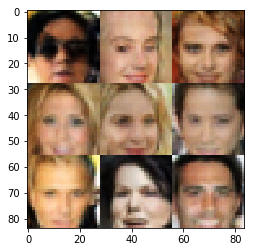

Epoch 14/20... Discriminator Loss: 0.7984... Generator Loss: 1.0939
Epoch 14/20... Discriminator Loss: 0.5977... Generator Loss: 1.2163
Epoch 14/20... Discriminator Loss: 1.2243... Generator Loss: 2.9967
Epoch 14/20... Discriminator Loss: 0.5475... Generator Loss: 2.0466
Epoch 14/20... Discriminator Loss: 0.7651... Generator Loss: 0.9128
Epoch 14/20... Discriminator Loss: 0.8466... Generator Loss: 0.8026
Epoch 14/20... Discriminator Loss: 0.8073... Generator Loss: 1.1968
Epoch 14/20... Discriminator Loss: 0.8049... Generator Loss: 0.8820
Epoch 14/20... Discriminator Loss: 1.0817... Generator Loss: 0.6008
Epoch 14/20... Discriminator Loss: 0.5643... Generator Loss: 1.5721


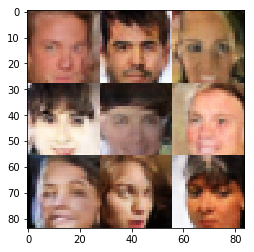

Epoch 14/20... Discriminator Loss: 1.2922... Generator Loss: 0.4530
Epoch 14/20... Discriminator Loss: 1.0020... Generator Loss: 0.6457
Epoch 14/20... Discriminator Loss: 0.9257... Generator Loss: 0.7132
Epoch 14/20... Discriminator Loss: 1.2169... Generator Loss: 0.5487
Epoch 15/20... Discriminator Loss: 0.6887... Generator Loss: 1.7838
Epoch 15/20... Discriminator Loss: 0.9229... Generator Loss: 0.7802
Epoch 15/20... Discriminator Loss: 1.1009... Generator Loss: 0.5551
Epoch 15/20... Discriminator Loss: 1.1333... Generator Loss: 0.5462
Epoch 15/20... Discriminator Loss: 0.7619... Generator Loss: 1.1772
Epoch 15/20... Discriminator Loss: 0.8340... Generator Loss: 0.9506


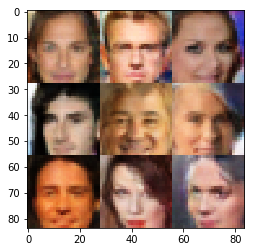

Epoch 15/20... Discriminator Loss: 0.8862... Generator Loss: 2.7331
Epoch 15/20... Discriminator Loss: 0.7658... Generator Loss: 1.9878
Epoch 15/20... Discriminator Loss: 1.0398... Generator Loss: 0.7290
Epoch 15/20... Discriminator Loss: 1.3527... Generator Loss: 0.4235
Epoch 15/20... Discriminator Loss: 1.1638... Generator Loss: 0.5959
Epoch 15/20... Discriminator Loss: 0.7116... Generator Loss: 1.2252
Epoch 15/20... Discriminator Loss: 0.5106... Generator Loss: 2.1994
Epoch 15/20... Discriminator Loss: 0.7055... Generator Loss: 0.9684
Epoch 15/20... Discriminator Loss: 0.6374... Generator Loss: 1.1301
Epoch 15/20... Discriminator Loss: 0.7396... Generator Loss: 0.9618


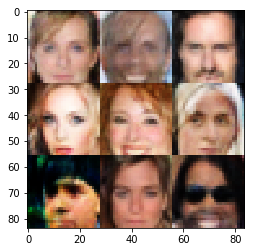

Epoch 15/20... Discriminator Loss: 1.2342... Generator Loss: 0.4583
Epoch 15/20... Discriminator Loss: 1.5929... Generator Loss: 0.3328
Epoch 15/20... Discriminator Loss: 0.8983... Generator Loss: 0.7797
Epoch 15/20... Discriminator Loss: 0.5338... Generator Loss: 1.3184
Epoch 15/20... Discriminator Loss: 0.7966... Generator Loss: 1.0609
Epoch 15/20... Discriminator Loss: 0.8034... Generator Loss: 0.8961
Epoch 15/20... Discriminator Loss: 1.0984... Generator Loss: 0.5885
Epoch 15/20... Discriminator Loss: 0.6338... Generator Loss: 1.1527
Epoch 15/20... Discriminator Loss: 0.7384... Generator Loss: 0.9601
Epoch 15/20... Discriminator Loss: 0.7450... Generator Loss: 0.9278


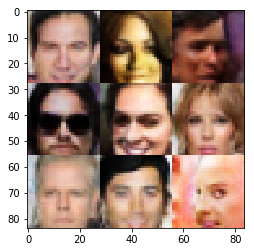

Epoch 15/20... Discriminator Loss: 0.5889... Generator Loss: 2.7911
Epoch 15/20... Discriminator Loss: 1.1620... Generator Loss: 0.5507
Epoch 15/20... Discriminator Loss: 0.6325... Generator Loss: 1.3126
Epoch 15/20... Discriminator Loss: 1.0593... Generator Loss: 0.5592
Epoch 15/20... Discriminator Loss: 0.8600... Generator Loss: 1.2985
Epoch 15/20... Discriminator Loss: 1.0316... Generator Loss: 0.6309
Epoch 15/20... Discriminator Loss: 0.7116... Generator Loss: 1.0339
Epoch 15/20... Discriminator Loss: 0.9561... Generator Loss: 2.4045
Epoch 15/20... Discriminator Loss: 0.6581... Generator Loss: 1.3087
Epoch 15/20... Discriminator Loss: 0.6977... Generator Loss: 1.2602


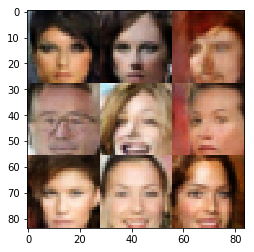

Epoch 15/20... Discriminator Loss: 0.6175... Generator Loss: 1.6706
Epoch 15/20... Discriminator Loss: 1.0505... Generator Loss: 0.6106
Epoch 15/20... Discriminator Loss: 0.5936... Generator Loss: 1.3038
Epoch 15/20... Discriminator Loss: 0.6601... Generator Loss: 0.9776
Epoch 15/20... Discriminator Loss: 0.7889... Generator Loss: 2.5990
Epoch 15/20... Discriminator Loss: 1.1307... Generator Loss: 0.5767
Epoch 15/20... Discriminator Loss: 0.6896... Generator Loss: 1.1227
Epoch 15/20... Discriminator Loss: 0.6816... Generator Loss: 1.3242
Epoch 15/20... Discriminator Loss: 1.2811... Generator Loss: 2.7521
Epoch 15/20... Discriminator Loss: 1.2594... Generator Loss: 2.9066


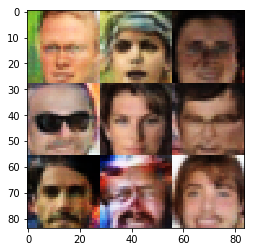

Epoch 15/20... Discriminator Loss: 0.8159... Generator Loss: 0.9810
Epoch 15/20... Discriminator Loss: 0.7365... Generator Loss: 0.8809
Epoch 15/20... Discriminator Loss: 0.7261... Generator Loss: 1.3084
Epoch 15/20... Discriminator Loss: 0.9233... Generator Loss: 0.7755
Epoch 15/20... Discriminator Loss: 0.7067... Generator Loss: 0.9727
Epoch 15/20... Discriminator Loss: 0.8920... Generator Loss: 0.7893
Epoch 15/20... Discriminator Loss: 0.7106... Generator Loss: 1.0015
Epoch 15/20... Discriminator Loss: 0.7204... Generator Loss: 1.4440
Epoch 15/20... Discriminator Loss: 0.6885... Generator Loss: 0.9977
Epoch 15/20... Discriminator Loss: 0.9532... Generator Loss: 0.7235


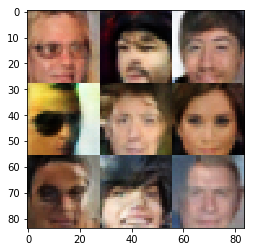

Epoch 15/20... Discriminator Loss: 0.6616... Generator Loss: 1.7144
Epoch 15/20... Discriminator Loss: 1.5891... Generator Loss: 0.3234
Epoch 15/20... Discriminator Loss: 0.5839... Generator Loss: 1.3389
Epoch 15/20... Discriminator Loss: 0.9415... Generator Loss: 0.8070
Epoch 15/20... Discriminator Loss: 0.7497... Generator Loss: 0.9438
Epoch 15/20... Discriminator Loss: 0.7104... Generator Loss: 1.0818
Epoch 15/20... Discriminator Loss: 1.0811... Generator Loss: 2.0704
Epoch 15/20... Discriminator Loss: 1.6963... Generator Loss: 0.2825
Epoch 15/20... Discriminator Loss: 0.7957... Generator Loss: 0.8695
Epoch 15/20... Discriminator Loss: 0.6300... Generator Loss: 1.4185


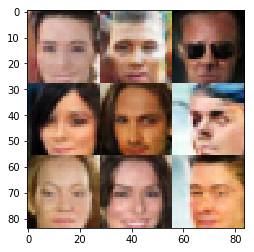

Epoch 15/20... Discriminator Loss: 1.1245... Generator Loss: 0.5209
Epoch 15/20... Discriminator Loss: 1.3219... Generator Loss: 0.4388
Epoch 15/20... Discriminator Loss: 0.7966... Generator Loss: 0.9459
Epoch 15/20... Discriminator Loss: 0.9868... Generator Loss: 0.6898
Epoch 15/20... Discriminator Loss: 0.6140... Generator Loss: 1.9357
Epoch 15/20... Discriminator Loss: 1.0283... Generator Loss: 3.0478
Epoch 15/20... Discriminator Loss: 0.8506... Generator Loss: 0.8232
Epoch 15/20... Discriminator Loss: 1.2365... Generator Loss: 0.6138
Epoch 15/20... Discriminator Loss: 1.1289... Generator Loss: 0.6462
Epoch 15/20... Discriminator Loss: 1.5833... Generator Loss: 0.3263


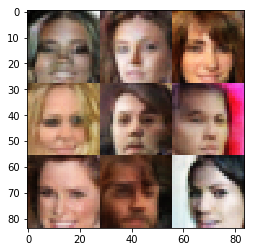

Epoch 15/20... Discriminator Loss: 0.6496... Generator Loss: 1.3039
Epoch 15/20... Discriminator Loss: 1.0110... Generator Loss: 2.2366
Epoch 15/20... Discriminator Loss: 0.9036... Generator Loss: 2.2311
Epoch 15/20... Discriminator Loss: 0.6810... Generator Loss: 1.0648
Epoch 15/20... Discriminator Loss: 0.7940... Generator Loss: 0.9045
Epoch 15/20... Discriminator Loss: 0.7076... Generator Loss: 0.9273
Epoch 15/20... Discriminator Loss: 1.3408... Generator Loss: 0.4392
Epoch 15/20... Discriminator Loss: 1.5249... Generator Loss: 2.3816
Epoch 15/20... Discriminator Loss: 1.5829... Generator Loss: 0.4373
Epoch 15/20... Discriminator Loss: 0.5837... Generator Loss: 1.4867


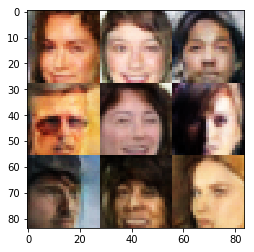

Epoch 15/20... Discriminator Loss: 0.8151... Generator Loss: 0.8680
Epoch 15/20... Discriminator Loss: 0.6278... Generator Loss: 1.2884
Epoch 15/20... Discriminator Loss: 0.5766... Generator Loss: 1.2986
Epoch 15/20... Discriminator Loss: 1.1181... Generator Loss: 0.5284
Epoch 15/20... Discriminator Loss: 1.1551... Generator Loss: 0.5371
Epoch 15/20... Discriminator Loss: 1.0372... Generator Loss: 0.5776
Epoch 15/20... Discriminator Loss: 0.8625... Generator Loss: 0.8891
Epoch 15/20... Discriminator Loss: 0.6541... Generator Loss: 2.1969
Epoch 15/20... Discriminator Loss: 0.7325... Generator Loss: 0.9520
Epoch 15/20... Discriminator Loss: 1.4249... Generator Loss: 0.3696


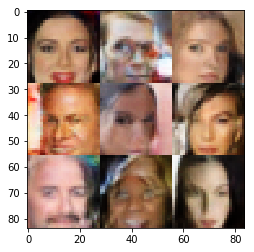

Epoch 15/20... Discriminator Loss: 1.5229... Generator Loss: 2.9595
Epoch 15/20... Discriminator Loss: 0.7195... Generator Loss: 1.1283
Epoch 15/20... Discriminator Loss: 0.8743... Generator Loss: 0.7871
Epoch 15/20... Discriminator Loss: 0.7421... Generator Loss: 0.9598
Epoch 15/20... Discriminator Loss: 0.8858... Generator Loss: 0.8600
Epoch 15/20... Discriminator Loss: 0.6671... Generator Loss: 1.0875
Epoch 15/20... Discriminator Loss: 0.9273... Generator Loss: 0.7384
Epoch 15/20... Discriminator Loss: 0.9175... Generator Loss: 0.7410
Epoch 15/20... Discriminator Loss: 0.5662... Generator Loss: 1.4120
Epoch 15/20... Discriminator Loss: 0.6691... Generator Loss: 1.0345


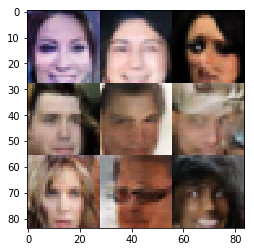

Epoch 15/20... Discriminator Loss: 0.5991... Generator Loss: 2.1797
Epoch 15/20... Discriminator Loss: 0.6809... Generator Loss: 1.3962
Epoch 15/20... Discriminator Loss: 0.7330... Generator Loss: 2.5120
Epoch 15/20... Discriminator Loss: 2.5791... Generator Loss: 3.4975
Epoch 15/20... Discriminator Loss: 1.4975... Generator Loss: 0.4011
Epoch 15/20... Discriminator Loss: 0.8940... Generator Loss: 0.8243
Epoch 15/20... Discriminator Loss: 0.8339... Generator Loss: 0.8881
Epoch 15/20... Discriminator Loss: 0.6332... Generator Loss: 1.2256
Epoch 15/20... Discriminator Loss: 0.8162... Generator Loss: 0.8716
Epoch 15/20... Discriminator Loss: 1.1637... Generator Loss: 2.7329


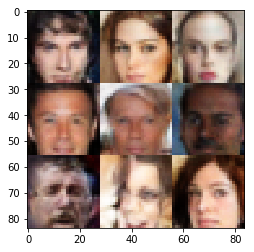

Epoch 15/20... Discriminator Loss: 0.6443... Generator Loss: 1.2155
Epoch 15/20... Discriminator Loss: 0.7648... Generator Loss: 0.9924
Epoch 15/20... Discriminator Loss: 0.7309... Generator Loss: 0.9967
Epoch 15/20... Discriminator Loss: 0.5990... Generator Loss: 1.4024
Epoch 15/20... Discriminator Loss: 0.5825... Generator Loss: 1.2723
Epoch 15/20... Discriminator Loss: 0.7494... Generator Loss: 1.1477
Epoch 15/20... Discriminator Loss: 0.5433... Generator Loss: 1.3341
Epoch 15/20... Discriminator Loss: 0.6769... Generator Loss: 1.0275
Epoch 15/20... Discriminator Loss: 1.1604... Generator Loss: 0.5396
Epoch 15/20... Discriminator Loss: 0.6597... Generator Loss: 1.8819


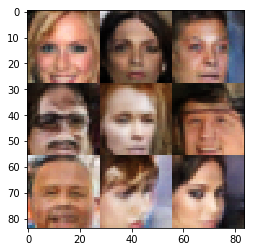

Epoch 15/20... Discriminator Loss: 0.8873... Generator Loss: 1.3976
Epoch 15/20... Discriminator Loss: 0.9066... Generator Loss: 0.7070
Epoch 15/20... Discriminator Loss: 0.8803... Generator Loss: 0.7881
Epoch 15/20... Discriminator Loss: 0.6764... Generator Loss: 1.8834
Epoch 15/20... Discriminator Loss: 0.6384... Generator Loss: 1.2901
Epoch 15/20... Discriminator Loss: 0.9058... Generator Loss: 0.9582
Epoch 15/20... Discriminator Loss: 0.8587... Generator Loss: 0.7219
Epoch 15/20... Discriminator Loss: 1.1453... Generator Loss: 0.5540
Epoch 15/20... Discriminator Loss: 0.7732... Generator Loss: 0.9666
Epoch 15/20... Discriminator Loss: 0.7432... Generator Loss: 0.9570


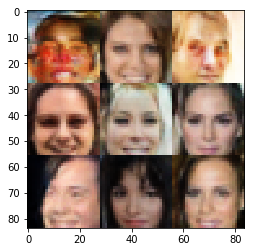

Epoch 15/20... Discriminator Loss: 0.5299... Generator Loss: 1.2887
Epoch 15/20... Discriminator Loss: 0.6788... Generator Loss: 0.9761
Epoch 15/20... Discriminator Loss: 1.1849... Generator Loss: 0.4823
Epoch 15/20... Discriminator Loss: 0.7613... Generator Loss: 1.2434
Epoch 15/20... Discriminator Loss: 1.0267... Generator Loss: 0.6031
Epoch 15/20... Discriminator Loss: 0.6645... Generator Loss: 1.8398
Epoch 15/20... Discriminator Loss: 1.1972... Generator Loss: 0.5384
Epoch 15/20... Discriminator Loss: 0.7833... Generator Loss: 1.1698
Epoch 15/20... Discriminator Loss: 0.9768... Generator Loss: 0.7379
Epoch 15/20... Discriminator Loss: 0.7281... Generator Loss: 1.1204


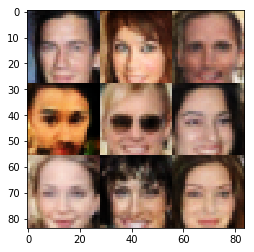

Epoch 15/20... Discriminator Loss: 0.4830... Generator Loss: 1.6004
Epoch 15/20... Discriminator Loss: 1.1373... Generator Loss: 0.5610
Epoch 15/20... Discriminator Loss: 0.5948... Generator Loss: 1.1659
Epoch 15/20... Discriminator Loss: 0.6827... Generator Loss: 1.4146
Epoch 15/20... Discriminator Loss: 0.5289... Generator Loss: 1.3151
Epoch 15/20... Discriminator Loss: 1.2522... Generator Loss: 0.4748
Epoch 15/20... Discriminator Loss: 1.0915... Generator Loss: 0.5759
Epoch 15/20... Discriminator Loss: 0.7931... Generator Loss: 0.8620
Epoch 15/20... Discriminator Loss: 0.8358... Generator Loss: 0.8617
Epoch 15/20... Discriminator Loss: 0.6441... Generator Loss: 1.1562


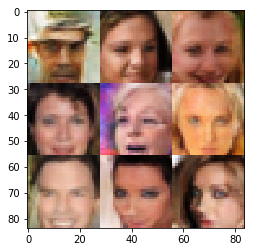

Epoch 15/20... Discriminator Loss: 0.8005... Generator Loss: 0.8932
Epoch 15/20... Discriminator Loss: 0.8112... Generator Loss: 1.0344
Epoch 15/20... Discriminator Loss: 0.6703... Generator Loss: 1.1640
Epoch 16/20... Discriminator Loss: 0.5816... Generator Loss: 1.8058
Epoch 16/20... Discriminator Loss: 0.7650... Generator Loss: 1.5965
Epoch 16/20... Discriminator Loss: 1.0756... Generator Loss: 0.6003
Epoch 16/20... Discriminator Loss: 1.0475... Generator Loss: 1.6710
Epoch 16/20... Discriminator Loss: 0.6868... Generator Loss: 1.5224
Epoch 16/20... Discriminator Loss: 1.2401... Generator Loss: 0.4592
Epoch 16/20... Discriminator Loss: 0.9663... Generator Loss: 0.6596


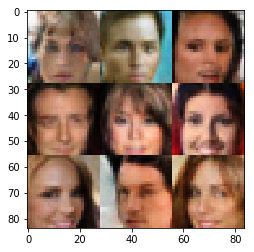

Epoch 16/20... Discriminator Loss: 0.7896... Generator Loss: 0.9125
Epoch 16/20... Discriminator Loss: 0.8371... Generator Loss: 0.8879
Epoch 16/20... Discriminator Loss: 0.6048... Generator Loss: 1.2453
Epoch 16/20... Discriminator Loss: 0.4830... Generator Loss: 1.5663
Epoch 16/20... Discriminator Loss: 0.9040... Generator Loss: 0.7474
Epoch 16/20... Discriminator Loss: 0.5804... Generator Loss: 2.4110
Epoch 16/20... Discriminator Loss: 0.9167... Generator Loss: 0.7971
Epoch 16/20... Discriminator Loss: 1.0302... Generator Loss: 0.5974
Epoch 16/20... Discriminator Loss: 0.6209... Generator Loss: 1.2543
Epoch 16/20... Discriminator Loss: 0.7873... Generator Loss: 0.8503


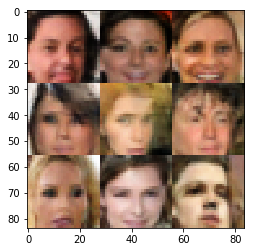

Epoch 16/20... Discriminator Loss: 0.7832... Generator Loss: 0.8184
Epoch 16/20... Discriminator Loss: 0.5047... Generator Loss: 1.3364
Epoch 16/20... Discriminator Loss: 1.1611... Generator Loss: 0.5962
Epoch 16/20... Discriminator Loss: 1.3112... Generator Loss: 0.4374
Epoch 16/20... Discriminator Loss: 0.7077... Generator Loss: 1.6521
Epoch 16/20... Discriminator Loss: 0.7459... Generator Loss: 1.1134
Epoch 16/20... Discriminator Loss: 0.8104... Generator Loss: 0.8993
Epoch 16/20... Discriminator Loss: 0.8098... Generator Loss: 0.8301
Epoch 16/20... Discriminator Loss: 0.8140... Generator Loss: 1.7462
Epoch 16/20... Discriminator Loss: 1.5536... Generator Loss: 0.3310


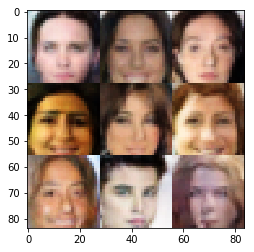

Epoch 16/20... Discriminator Loss: 1.3762... Generator Loss: 0.4280
Epoch 16/20... Discriminator Loss: 1.1861... Generator Loss: 0.5180
Epoch 16/20... Discriminator Loss: 1.1568... Generator Loss: 0.5720
Epoch 16/20... Discriminator Loss: 2.6242... Generator Loss: 3.7777
Epoch 16/20... Discriminator Loss: 0.5645... Generator Loss: 1.5203
Epoch 16/20... Discriminator Loss: 0.6610... Generator Loss: 1.1498
Epoch 16/20... Discriminator Loss: 0.6711... Generator Loss: 1.0983
Epoch 16/20... Discriminator Loss: 0.8534... Generator Loss: 0.9174
Epoch 16/20... Discriminator Loss: 0.4901... Generator Loss: 1.7126
Epoch 16/20... Discriminator Loss: 1.2851... Generator Loss: 0.4531


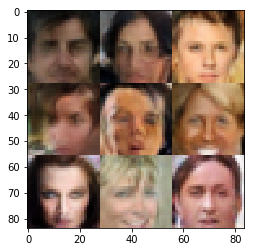

Epoch 16/20... Discriminator Loss: 0.9060... Generator Loss: 0.7539
Epoch 16/20... Discriminator Loss: 0.5712... Generator Loss: 1.9725
Epoch 16/20... Discriminator Loss: 0.5070... Generator Loss: 1.5022
Epoch 16/20... Discriminator Loss: 0.6909... Generator Loss: 1.0282
Epoch 16/20... Discriminator Loss: 0.9732... Generator Loss: 0.6860
Epoch 16/20... Discriminator Loss: 0.9878... Generator Loss: 0.7136
Epoch 16/20... Discriminator Loss: 0.4647... Generator Loss: 1.4398
Epoch 16/20... Discriminator Loss: 0.6881... Generator Loss: 1.7898
Epoch 16/20... Discriminator Loss: 0.5505... Generator Loss: 1.4350
Epoch 16/20... Discriminator Loss: 0.6991... Generator Loss: 0.9636


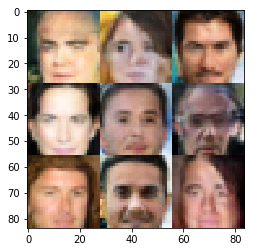

Epoch 16/20... Discriminator Loss: 0.4444... Generator Loss: 2.1526
Epoch 16/20... Discriminator Loss: 1.1978... Generator Loss: 0.5054
Epoch 16/20... Discriminator Loss: 0.6385... Generator Loss: 1.3577
Epoch 16/20... Discriminator Loss: 0.7049... Generator Loss: 1.1141
Epoch 16/20... Discriminator Loss: 1.3319... Generator Loss: 0.4669
Epoch 16/20... Discriminator Loss: 0.7330... Generator Loss: 1.6421
Epoch 16/20... Discriminator Loss: 1.2068... Generator Loss: 0.4931
Epoch 16/20... Discriminator Loss: 0.7800... Generator Loss: 1.1457
Epoch 16/20... Discriminator Loss: 0.8960... Generator Loss: 0.6996
Epoch 16/20... Discriminator Loss: 1.0642... Generator Loss: 0.5771


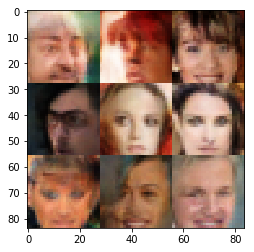

Epoch 16/20... Discriminator Loss: 0.9379... Generator Loss: 0.7409
Epoch 16/20... Discriminator Loss: 0.9959... Generator Loss: 0.6795
Epoch 16/20... Discriminator Loss: 0.5862... Generator Loss: 1.2494
Epoch 16/20... Discriminator Loss: 0.6135... Generator Loss: 1.3440
Epoch 16/20... Discriminator Loss: 0.6617... Generator Loss: 1.0146
Epoch 16/20... Discriminator Loss: 1.0268... Generator Loss: 0.6473
Epoch 16/20... Discriminator Loss: 0.6193... Generator Loss: 1.3558
Epoch 16/20... Discriminator Loss: 0.8773... Generator Loss: 0.7828
Epoch 16/20... Discriminator Loss: 0.5257... Generator Loss: 1.8549
Epoch 16/20... Discriminator Loss: 1.0011... Generator Loss: 0.6777


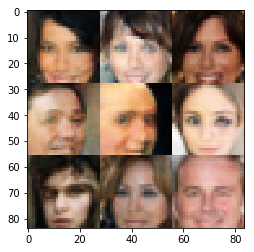

Epoch 16/20... Discriminator Loss: 0.5887... Generator Loss: 1.2206
Epoch 16/20... Discriminator Loss: 0.5008... Generator Loss: 2.3544
Epoch 16/20... Discriminator Loss: 0.9897... Generator Loss: 0.6996
Epoch 16/20... Discriminator Loss: 1.7313... Generator Loss: 2.4626
Epoch 16/20... Discriminator Loss: 0.7616... Generator Loss: 0.8790
Epoch 16/20... Discriminator Loss: 1.2931... Generator Loss: 0.4451
Epoch 16/20... Discriminator Loss: 0.8596... Generator Loss: 0.8058
Epoch 16/20... Discriminator Loss: 0.3782... Generator Loss: 1.9329
Epoch 16/20... Discriminator Loss: 0.6713... Generator Loss: 1.2841
Epoch 16/20... Discriminator Loss: 0.5252... Generator Loss: 1.3728


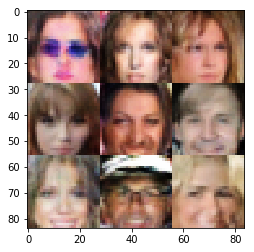

Epoch 16/20... Discriminator Loss: 1.4741... Generator Loss: 0.3788
Epoch 16/20... Discriminator Loss: 0.5676... Generator Loss: 1.1922
Epoch 16/20... Discriminator Loss: 0.6191... Generator Loss: 1.8423
Epoch 16/20... Discriminator Loss: 1.8498... Generator Loss: 3.1963
Epoch 16/20... Discriminator Loss: 0.8245... Generator Loss: 2.1957
Epoch 16/20... Discriminator Loss: 0.7932... Generator Loss: 0.9722
Epoch 16/20... Discriminator Loss: 0.8267... Generator Loss: 0.7965
Epoch 16/20... Discriminator Loss: 0.9383... Generator Loss: 0.7318
Epoch 16/20... Discriminator Loss: 0.6000... Generator Loss: 1.4005
Epoch 16/20... Discriminator Loss: 0.8767... Generator Loss: 0.7811


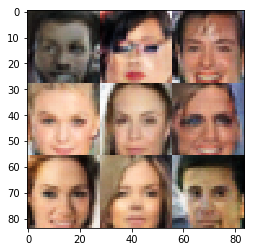

Epoch 16/20... Discriminator Loss: 1.1012... Generator Loss: 0.5391
Epoch 16/20... Discriminator Loss: 0.6268... Generator Loss: 1.2459
Epoch 16/20... Discriminator Loss: 1.2207... Generator Loss: 0.4911
Epoch 16/20... Discriminator Loss: 0.7097... Generator Loss: 1.0004
Epoch 16/20... Discriminator Loss: 0.6441... Generator Loss: 1.1409
Epoch 16/20... Discriminator Loss: 0.8963... Generator Loss: 0.7712
Epoch 16/20... Discriminator Loss: 0.5934... Generator Loss: 1.2834
Epoch 16/20... Discriminator Loss: 0.6162... Generator Loss: 1.2874
Epoch 16/20... Discriminator Loss: 0.6544... Generator Loss: 1.1803
Epoch 16/20... Discriminator Loss: 0.6077... Generator Loss: 1.2036


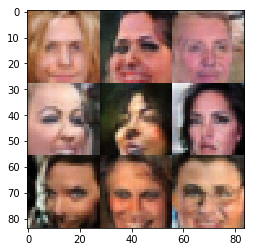

Epoch 16/20... Discriminator Loss: 0.6380... Generator Loss: 1.3065
Epoch 16/20... Discriminator Loss: 0.7694... Generator Loss: 0.9030
Epoch 16/20... Discriminator Loss: 0.3920... Generator Loss: 1.6949
Epoch 16/20... Discriminator Loss: 0.7242... Generator Loss: 0.9322
Epoch 16/20... Discriminator Loss: 1.1881... Generator Loss: 0.5356
Epoch 16/20... Discriminator Loss: 0.5098... Generator Loss: 1.4878
Epoch 16/20... Discriminator Loss: 3.0586... Generator Loss: 0.0858
Epoch 16/20... Discriminator Loss: 1.8047... Generator Loss: 0.3038
Epoch 16/20... Discriminator Loss: 0.6778... Generator Loss: 1.1451
Epoch 16/20... Discriminator Loss: 0.6761... Generator Loss: 1.3662


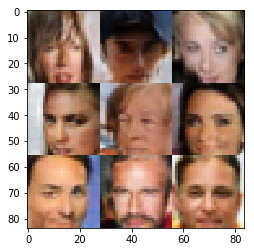

Epoch 16/20... Discriminator Loss: 1.0417... Generator Loss: 0.6468
Epoch 16/20... Discriminator Loss: 0.6122... Generator Loss: 1.5260
Epoch 16/20... Discriminator Loss: 0.8732... Generator Loss: 0.7895
Epoch 16/20... Discriminator Loss: 0.8187... Generator Loss: 0.8570
Epoch 16/20... Discriminator Loss: 0.7404... Generator Loss: 1.0191
Epoch 16/20... Discriminator Loss: 0.6611... Generator Loss: 0.9630
Epoch 16/20... Discriminator Loss: 0.6863... Generator Loss: 1.1589
Epoch 16/20... Discriminator Loss: 0.6754... Generator Loss: 1.3317
Epoch 16/20... Discriminator Loss: 0.7886... Generator Loss: 1.2958
Epoch 16/20... Discriminator Loss: 1.0566... Generator Loss: 0.7206


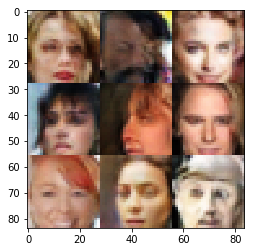

Epoch 16/20... Discriminator Loss: 1.0660... Generator Loss: 0.6653
Epoch 16/20... Discriminator Loss: 0.8050... Generator Loss: 0.9151
Epoch 16/20... Discriminator Loss: 1.3777... Generator Loss: 0.4113
Epoch 16/20... Discriminator Loss: 0.6527... Generator Loss: 1.1186
Epoch 16/20... Discriminator Loss: 0.7307... Generator Loss: 1.0723
Epoch 16/20... Discriminator Loss: 0.6309... Generator Loss: 1.1518
Epoch 16/20... Discriminator Loss: 0.6891... Generator Loss: 2.0916
Epoch 16/20... Discriminator Loss: 1.0815... Generator Loss: 0.6333
Epoch 16/20... Discriminator Loss: 0.4046... Generator Loss: 1.6481
Epoch 16/20... Discriminator Loss: 0.7313... Generator Loss: 0.9567


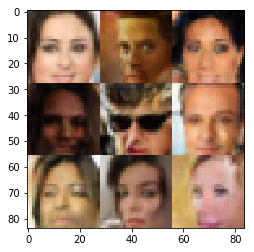

Epoch 16/20... Discriminator Loss: 0.5271... Generator Loss: 1.6003
Epoch 16/20... Discriminator Loss: 1.1557... Generator Loss: 0.5364
Epoch 16/20... Discriminator Loss: 0.5414... Generator Loss: 1.2064
Epoch 16/20... Discriminator Loss: 0.6495... Generator Loss: 1.1193
Epoch 16/20... Discriminator Loss: 0.6776... Generator Loss: 1.0768
Epoch 16/20... Discriminator Loss: 0.5595... Generator Loss: 1.2783
Epoch 16/20... Discriminator Loss: 0.5654... Generator Loss: 2.7277
Epoch 16/20... Discriminator Loss: 1.4718... Generator Loss: 0.3643
Epoch 16/20... Discriminator Loss: 0.6630... Generator Loss: 1.0792
Epoch 16/20... Discriminator Loss: 0.5929... Generator Loss: 1.2282


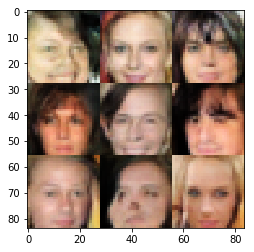

Epoch 16/20... Discriminator Loss: 1.1885... Generator Loss: 0.4949
Epoch 16/20... Discriminator Loss: 0.4562... Generator Loss: 1.5809
Epoch 16/20... Discriminator Loss: 0.6556... Generator Loss: 1.4472
Epoch 16/20... Discriminator Loss: 1.1898... Generator Loss: 0.4648
Epoch 16/20... Discriminator Loss: 1.0342... Generator Loss: 3.1962
Epoch 16/20... Discriminator Loss: 0.9537... Generator Loss: 1.0843
Epoch 16/20... Discriminator Loss: 0.5895... Generator Loss: 1.3123
Epoch 16/20... Discriminator Loss: 0.5856... Generator Loss: 1.7765
Epoch 16/20... Discriminator Loss: 0.8139... Generator Loss: 1.3099
Epoch 16/20... Discriminator Loss: 0.6967... Generator Loss: 2.2070


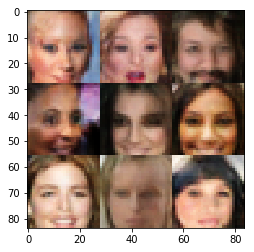

Epoch 16/20... Discriminator Loss: 0.5301... Generator Loss: 1.2542
Epoch 16/20... Discriminator Loss: 0.9175... Generator Loss: 0.8360
Epoch 16/20... Discriminator Loss: 1.7496... Generator Loss: 0.2817
Epoch 16/20... Discriminator Loss: 0.5232... Generator Loss: 1.3685
Epoch 16/20... Discriminator Loss: 0.5187... Generator Loss: 1.8214
Epoch 16/20... Discriminator Loss: 0.6888... Generator Loss: 1.0754
Epoch 16/20... Discriminator Loss: 0.4835... Generator Loss: 1.4489
Epoch 16/20... Discriminator Loss: 0.7290... Generator Loss: 1.0557
Epoch 16/20... Discriminator Loss: 0.5199... Generator Loss: 1.2956
Epoch 16/20... Discriminator Loss: 0.5371... Generator Loss: 1.4080


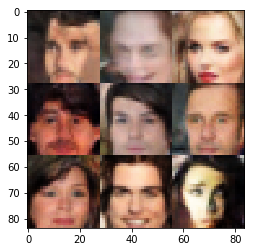

Epoch 16/20... Discriminator Loss: 1.2755... Generator Loss: 0.4704
Epoch 17/20... Discriminator Loss: 0.5673... Generator Loss: 1.1461
Epoch 17/20... Discriminator Loss: 0.3926... Generator Loss: 1.9082
Epoch 17/20... Discriminator Loss: 0.5566... Generator Loss: 1.2350
Epoch 17/20... Discriminator Loss: 0.8049... Generator Loss: 0.8912
Epoch 17/20... Discriminator Loss: 0.7001... Generator Loss: 0.9284
Epoch 17/20... Discriminator Loss: 0.5883... Generator Loss: 2.5584
Epoch 17/20... Discriminator Loss: 0.5646... Generator Loss: 1.2447
Epoch 17/20... Discriminator Loss: 0.9425... Generator Loss: 1.1743
Epoch 17/20... Discriminator Loss: 0.9127... Generator Loss: 1.9643


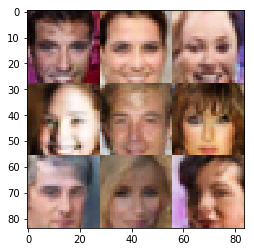

Epoch 17/20... Discriminator Loss: 0.9321... Generator Loss: 0.6955
Epoch 17/20... Discriminator Loss: 0.5981... Generator Loss: 1.0936
Epoch 17/20... Discriminator Loss: 0.9932... Generator Loss: 0.6140
Epoch 17/20... Discriminator Loss: 0.7890... Generator Loss: 2.2859
Epoch 17/20... Discriminator Loss: 0.6260... Generator Loss: 1.5784
Epoch 17/20... Discriminator Loss: 0.7394... Generator Loss: 0.9164
Epoch 17/20... Discriminator Loss: 1.1001... Generator Loss: 2.4127
Epoch 17/20... Discriminator Loss: 0.7184... Generator Loss: 1.5740
Epoch 17/20... Discriminator Loss: 0.6376... Generator Loss: 1.5784
Epoch 17/20... Discriminator Loss: 0.4822... Generator Loss: 1.4752


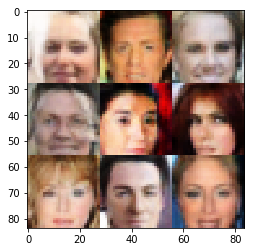

Epoch 17/20... Discriminator Loss: 0.5480... Generator Loss: 1.2841
Epoch 17/20... Discriminator Loss: 0.4236... Generator Loss: 1.6382
Epoch 17/20... Discriminator Loss: 1.0221... Generator Loss: 0.6840
Epoch 17/20... Discriminator Loss: 0.7112... Generator Loss: 0.9763
Epoch 17/20... Discriminator Loss: 0.9246... Generator Loss: 0.7273
Epoch 17/20... Discriminator Loss: 1.3162... Generator Loss: 0.4485
Epoch 17/20... Discriminator Loss: 0.3027... Generator Loss: 2.1156
Epoch 17/20... Discriminator Loss: 0.3391... Generator Loss: 2.1390
Epoch 17/20... Discriminator Loss: 0.6555... Generator Loss: 2.6524
Epoch 17/20... Discriminator Loss: 0.3906... Generator Loss: 1.6081


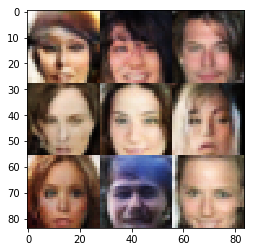

Epoch 17/20... Discriminator Loss: 1.0878... Generator Loss: 0.6097
Epoch 17/20... Discriminator Loss: 1.1982... Generator Loss: 0.5457
Epoch 17/20... Discriminator Loss: 0.5979... Generator Loss: 1.2009
Epoch 17/20... Discriminator Loss: 1.2288... Generator Loss: 0.5037
Epoch 17/20... Discriminator Loss: 0.9002... Generator Loss: 0.7332
Epoch 17/20... Discriminator Loss: 1.6270... Generator Loss: 0.3136
Epoch 17/20... Discriminator Loss: 0.9401... Generator Loss: 0.7723
Epoch 17/20... Discriminator Loss: 0.4672... Generator Loss: 1.5958
Epoch 17/20... Discriminator Loss: 0.7007... Generator Loss: 1.5309
Epoch 17/20... Discriminator Loss: 0.9434... Generator Loss: 0.6829


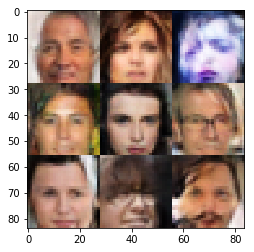

Epoch 17/20... Discriminator Loss: 0.5873... Generator Loss: 1.3041
Epoch 17/20... Discriminator Loss: 1.2599... Generator Loss: 0.5536
Epoch 17/20... Discriminator Loss: 0.7160... Generator Loss: 1.1067
Epoch 17/20... Discriminator Loss: 0.7254... Generator Loss: 2.2073
Epoch 17/20... Discriminator Loss: 1.2466... Generator Loss: 3.6107
Epoch 17/20... Discriminator Loss: 0.4884... Generator Loss: 1.4197
Epoch 17/20... Discriminator Loss: 0.9165... Generator Loss: 0.7706
Epoch 17/20... Discriminator Loss: 0.7210... Generator Loss: 0.9595
Epoch 17/20... Discriminator Loss: 0.8334... Generator Loss: 0.8609
Epoch 17/20... Discriminator Loss: 0.4924... Generator Loss: 1.3987


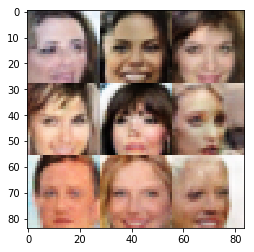

Epoch 17/20... Discriminator Loss: 1.4131... Generator Loss: 0.4282
Epoch 17/20... Discriminator Loss: 0.7887... Generator Loss: 0.9373
Epoch 17/20... Discriminator Loss: 0.6194... Generator Loss: 1.2151
Epoch 17/20... Discriminator Loss: 0.9717... Generator Loss: 0.6652
Epoch 17/20... Discriminator Loss: 0.4962... Generator Loss: 1.3536
Epoch 17/20... Discriminator Loss: 0.5628... Generator Loss: 1.2491
Epoch 17/20... Discriminator Loss: 1.2199... Generator Loss: 3.2246
Epoch 17/20... Discriminator Loss: 0.6362... Generator Loss: 1.3677
Epoch 17/20... Discriminator Loss: 0.4880... Generator Loss: 1.5539
Epoch 17/20... Discriminator Loss: 0.9147... Generator Loss: 0.7617


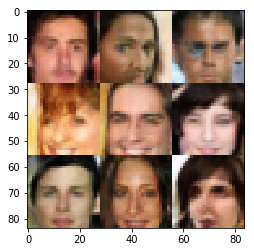

Epoch 17/20... Discriminator Loss: 0.4853... Generator Loss: 1.3832
Epoch 17/20... Discriminator Loss: 0.7921... Generator Loss: 1.0277
Epoch 17/20... Discriminator Loss: 0.5836... Generator Loss: 1.6027
Epoch 17/20... Discriminator Loss: 0.6698... Generator Loss: 1.1177
Epoch 17/20... Discriminator Loss: 0.7106... Generator Loss: 1.0466
Epoch 17/20... Discriminator Loss: 0.5234... Generator Loss: 1.5328
Epoch 17/20... Discriminator Loss: 0.3333... Generator Loss: 2.2053
Epoch 17/20... Discriminator Loss: 4.7561... Generator Loss: 0.0400
Epoch 17/20... Discriminator Loss: 0.7350... Generator Loss: 1.6966
Epoch 17/20... Discriminator Loss: 0.8195... Generator Loss: 0.9045


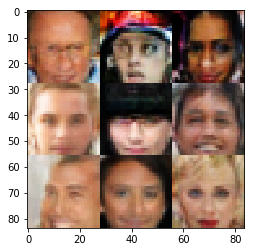

Epoch 17/20... Discriminator Loss: 0.6189... Generator Loss: 1.1318
Epoch 17/20... Discriminator Loss: 0.7075... Generator Loss: 0.9303
Epoch 17/20... Discriminator Loss: 0.8323... Generator Loss: 0.8905
Epoch 17/20... Discriminator Loss: 0.4062... Generator Loss: 3.3317
Epoch 17/20... Discriminator Loss: 0.6050... Generator Loss: 1.2074
Epoch 17/20... Discriminator Loss: 0.6490... Generator Loss: 1.1486
Epoch 17/20... Discriminator Loss: 0.6496... Generator Loss: 1.0924
Epoch 17/20... Discriminator Loss: 0.7508... Generator Loss: 0.8690
Epoch 17/20... Discriminator Loss: 1.0757... Generator Loss: 0.6270
Epoch 17/20... Discriminator Loss: 1.2177... Generator Loss: 0.5414


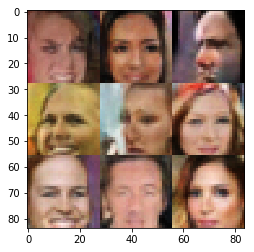

Epoch 17/20... Discriminator Loss: 0.6206... Generator Loss: 1.1139
Epoch 17/20... Discriminator Loss: 0.4525... Generator Loss: 1.5148
Epoch 17/20... Discriminator Loss: 0.6920... Generator Loss: 1.0318
Epoch 17/20... Discriminator Loss: 0.7681... Generator Loss: 0.8658
Epoch 17/20... Discriminator Loss: 0.8509... Generator Loss: 0.8181
Epoch 17/20... Discriminator Loss: 1.6325... Generator Loss: 0.3185
Epoch 17/20... Discriminator Loss: 1.4196... Generator Loss: 0.4728
Epoch 17/20... Discriminator Loss: 0.7205... Generator Loss: 1.0514
Epoch 17/20... Discriminator Loss: 0.8578... Generator Loss: 1.1380
Epoch 17/20... Discriminator Loss: 1.0329... Generator Loss: 0.6239


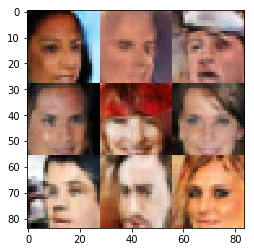

Epoch 17/20... Discriminator Loss: 0.8821... Generator Loss: 0.8036
Epoch 17/20... Discriminator Loss: 0.3500... Generator Loss: 1.8495
Epoch 17/20... Discriminator Loss: 1.2119... Generator Loss: 0.4876
Epoch 17/20... Discriminator Loss: 1.4162... Generator Loss: 0.4318
Epoch 17/20... Discriminator Loss: 0.7162... Generator Loss: 1.2174
Epoch 17/20... Discriminator Loss: 0.5387... Generator Loss: 1.2656
Epoch 17/20... Discriminator Loss: 0.9762... Generator Loss: 0.6895
Epoch 17/20... Discriminator Loss: 0.5052... Generator Loss: 1.3476
Epoch 17/20... Discriminator Loss: 0.7716... Generator Loss: 0.9050
Epoch 17/20... Discriminator Loss: 0.5810... Generator Loss: 1.3841


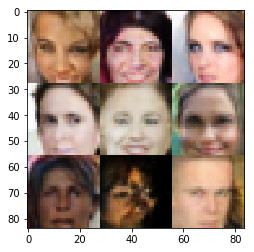

Epoch 17/20... Discriminator Loss: 0.7667... Generator Loss: 0.9071
Epoch 17/20... Discriminator Loss: 0.5288... Generator Loss: 1.4187
Epoch 17/20... Discriminator Loss: 0.5305... Generator Loss: 1.3933
Epoch 17/20... Discriminator Loss: 0.9015... Generator Loss: 0.7817
Epoch 17/20... Discriminator Loss: 0.4560... Generator Loss: 1.7748
Epoch 17/20... Discriminator Loss: 0.4829... Generator Loss: 2.0811
Epoch 17/20... Discriminator Loss: 0.3788... Generator Loss: 1.6812
Epoch 17/20... Discriminator Loss: 0.3239... Generator Loss: 2.7639
Epoch 17/20... Discriminator Loss: 1.2235... Generator Loss: 0.5123
Epoch 17/20... Discriminator Loss: 0.4839... Generator Loss: 1.8137


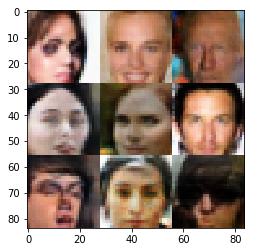

Epoch 17/20... Discriminator Loss: 0.6469... Generator Loss: 1.0684
Epoch 17/20... Discriminator Loss: 0.4759... Generator Loss: 1.7388
Epoch 17/20... Discriminator Loss: 0.3698... Generator Loss: 1.9134
Epoch 17/20... Discriminator Loss: 0.4543... Generator Loss: 1.7526
Epoch 17/20... Discriminator Loss: 0.7011... Generator Loss: 0.9627
Epoch 17/20... Discriminator Loss: 0.6302... Generator Loss: 1.0845
Epoch 17/20... Discriminator Loss: 0.8731... Generator Loss: 0.7541
Epoch 17/20... Discriminator Loss: 0.5159... Generator Loss: 1.3145
Epoch 17/20... Discriminator Loss: 0.8170... Generator Loss: 0.8351
Epoch 17/20... Discriminator Loss: 0.6081... Generator Loss: 1.1460


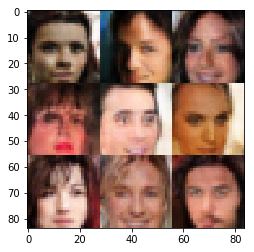

Epoch 17/20... Discriminator Loss: 0.4542... Generator Loss: 1.6200
Epoch 17/20... Discriminator Loss: 1.1757... Generator Loss: 0.5323
Epoch 17/20... Discriminator Loss: 0.4864... Generator Loss: 1.4601
Epoch 17/20... Discriminator Loss: 0.5959... Generator Loss: 2.7661
Epoch 17/20... Discriminator Loss: 1.0022... Generator Loss: 0.6905
Epoch 17/20... Discriminator Loss: 0.9485... Generator Loss: 0.7101
Epoch 17/20... Discriminator Loss: 1.2299... Generator Loss: 0.5659
Epoch 17/20... Discriminator Loss: 0.5897... Generator Loss: 1.1023
Epoch 17/20... Discriminator Loss: 0.3065... Generator Loss: 1.8162
Epoch 17/20... Discriminator Loss: 1.1413... Generator Loss: 3.3903


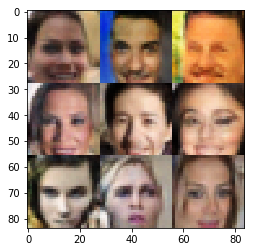

Epoch 17/20... Discriminator Loss: 1.4029... Generator Loss: 0.4866
Epoch 17/20... Discriminator Loss: 0.9457... Generator Loss: 0.7736
Epoch 17/20... Discriminator Loss: 0.7120... Generator Loss: 0.9814
Epoch 17/20... Discriminator Loss: 0.4508... Generator Loss: 1.6392
Epoch 17/20... Discriminator Loss: 0.6513... Generator Loss: 1.1085
Epoch 17/20... Discriminator Loss: 0.5928... Generator Loss: 2.3451
Epoch 17/20... Discriminator Loss: 0.5527... Generator Loss: 1.4824
Epoch 17/20... Discriminator Loss: 0.7298... Generator Loss: 0.9188
Epoch 17/20... Discriminator Loss: 0.4545... Generator Loss: 1.4382
Epoch 17/20... Discriminator Loss: 0.6323... Generator Loss: 1.0352


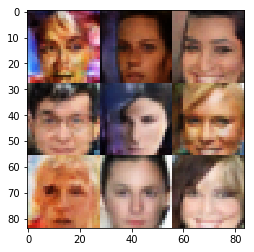

Epoch 17/20... Discriminator Loss: 0.7577... Generator Loss: 0.8980
Epoch 17/20... Discriminator Loss: 0.3755... Generator Loss: 2.1725
Epoch 17/20... Discriminator Loss: 0.5639... Generator Loss: 1.1432
Epoch 17/20... Discriminator Loss: 1.3346... Generator Loss: 0.4393
Epoch 17/20... Discriminator Loss: 0.7914... Generator Loss: 0.8390
Epoch 17/20... Discriminator Loss: 0.7975... Generator Loss: 0.8108
Epoch 17/20... Discriminator Loss: 0.6781... Generator Loss: 0.9618
Epoch 17/20... Discriminator Loss: 0.2879... Generator Loss: 1.9984
Epoch 17/20... Discriminator Loss: 0.4430... Generator Loss: 1.9515
Epoch 17/20... Discriminator Loss: 0.5650... Generator Loss: 1.2481


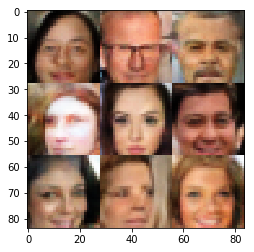

Epoch 17/20... Discriminator Loss: 0.8837... Generator Loss: 2.3708
Epoch 17/20... Discriminator Loss: 0.9572... Generator Loss: 2.1964
Epoch 17/20... Discriminator Loss: 0.9157... Generator Loss: 0.7788
Epoch 17/20... Discriminator Loss: 0.3096... Generator Loss: 2.2563
Epoch 17/20... Discriminator Loss: 0.6499... Generator Loss: 1.0991
Epoch 17/20... Discriminator Loss: 0.6925... Generator Loss: 1.0260
Epoch 17/20... Discriminator Loss: 0.4722... Generator Loss: 1.4208
Epoch 17/20... Discriminator Loss: 0.3731... Generator Loss: 1.7068
Epoch 17/20... Discriminator Loss: 0.4525... Generator Loss: 2.9206
Epoch 18/20... Discriminator Loss: 0.8269... Generator Loss: 2.0882


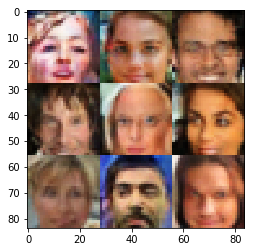

Epoch 18/20... Discriminator Loss: 0.6993... Generator Loss: 2.3610
Epoch 18/20... Discriminator Loss: 0.5914... Generator Loss: 1.4824
Epoch 18/20... Discriminator Loss: 0.4847... Generator Loss: 2.1114
Epoch 18/20... Discriminator Loss: 0.6411... Generator Loss: 1.2569
Epoch 18/20... Discriminator Loss: 0.4190... Generator Loss: 1.5327
Epoch 18/20... Discriminator Loss: 0.7309... Generator Loss: 0.9465
Epoch 18/20... Discriminator Loss: 0.2521... Generator Loss: 2.1346
Epoch 18/20... Discriminator Loss: 1.2072... Generator Loss: 0.5221
Epoch 18/20... Discriminator Loss: 0.9074... Generator Loss: 0.8835
Epoch 18/20... Discriminator Loss: 0.5132... Generator Loss: 1.3185


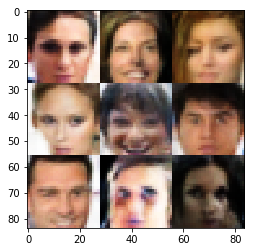

Epoch 18/20... Discriminator Loss: 0.4040... Generator Loss: 1.5276
Epoch 18/20... Discriminator Loss: 0.7115... Generator Loss: 0.9534
Epoch 18/20... Discriminator Loss: 0.4058... Generator Loss: 1.7115
Epoch 18/20... Discriminator Loss: 0.7844... Generator Loss: 0.9165
Epoch 18/20... Discriminator Loss: 1.1377... Generator Loss: 0.5381
Epoch 18/20... Discriminator Loss: 0.4915... Generator Loss: 1.6723
Epoch 18/20... Discriminator Loss: 0.4748... Generator Loss: 1.4942
Epoch 18/20... Discriminator Loss: 0.8454... Generator Loss: 1.6327
Epoch 18/20... Discriminator Loss: 1.9113... Generator Loss: 3.6214
Epoch 18/20... Discriminator Loss: 1.2180... Generator Loss: 0.5674


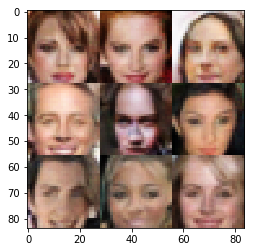

Epoch 18/20... Discriminator Loss: 1.0183... Generator Loss: 0.8075
Epoch 18/20... Discriminator Loss: 0.6900... Generator Loss: 1.0143
Epoch 18/20... Discriminator Loss: 1.3618... Generator Loss: 0.4828
Epoch 18/20... Discriminator Loss: 0.5916... Generator Loss: 1.1971
Epoch 18/20... Discriminator Loss: 1.1827... Generator Loss: 0.5351
Epoch 18/20... Discriminator Loss: 0.4549... Generator Loss: 1.4850
Epoch 18/20... Discriminator Loss: 0.6071... Generator Loss: 1.2226
Epoch 18/20... Discriminator Loss: 0.7807... Generator Loss: 0.8482
Epoch 18/20... Discriminator Loss: 0.4592... Generator Loss: 1.4916
Epoch 18/20... Discriminator Loss: 0.5945... Generator Loss: 1.3537


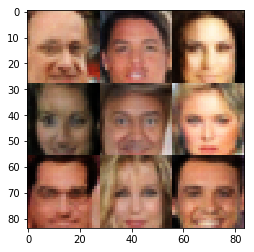

Epoch 18/20... Discriminator Loss: 0.6192... Generator Loss: 2.2737
Epoch 18/20... Discriminator Loss: 0.8878... Generator Loss: 0.7600
Epoch 18/20... Discriminator Loss: 1.1063... Generator Loss: 0.6472
Epoch 18/20... Discriminator Loss: 0.6569... Generator Loss: 1.1018
Epoch 18/20... Discriminator Loss: 0.4993... Generator Loss: 2.5597
Epoch 18/20... Discriminator Loss: 0.7744... Generator Loss: 0.9073
Epoch 18/20... Discriminator Loss: 0.4290... Generator Loss: 1.5868
Epoch 18/20... Discriminator Loss: 0.4204... Generator Loss: 1.7700
Epoch 18/20... Discriminator Loss: 0.4698... Generator Loss: 1.4517
Epoch 18/20... Discriminator Loss: 0.6252... Generator Loss: 1.2538


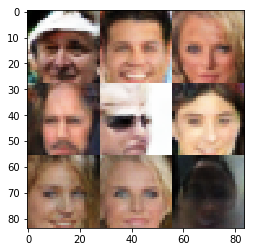

Epoch 18/20... Discriminator Loss: 0.5983... Generator Loss: 1.0192
Epoch 18/20... Discriminator Loss: 0.6219... Generator Loss: 1.1155
Epoch 18/20... Discriminator Loss: 0.5408... Generator Loss: 1.1430
Epoch 18/20... Discriminator Loss: 0.3400... Generator Loss: 1.8060
Epoch 18/20... Discriminator Loss: 0.7031... Generator Loss: 1.0619
Epoch 18/20... Discriminator Loss: 0.5105... Generator Loss: 2.5128
Epoch 18/20... Discriminator Loss: 0.5254... Generator Loss: 1.3820
Epoch 18/20... Discriminator Loss: 0.6689... Generator Loss: 1.0682
Epoch 18/20... Discriminator Loss: 1.3860... Generator Loss: 0.4444
Epoch 18/20... Discriminator Loss: 6.5494... Generator Loss: 0.0142


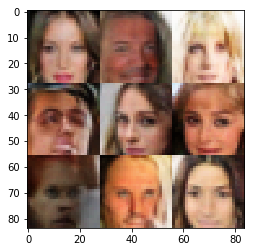

Epoch 18/20... Discriminator Loss: 2.1136... Generator Loss: 1.4629
Epoch 18/20... Discriminator Loss: 1.9833... Generator Loss: 1.1303
Epoch 18/20... Discriminator Loss: 2.2532... Generator Loss: 0.2715
Epoch 18/20... Discriminator Loss: 1.5741... Generator Loss: 2.3053
Epoch 18/20... Discriminator Loss: 1.3573... Generator Loss: 0.5520
Epoch 18/20... Discriminator Loss: 0.5875... Generator Loss: 1.5435
Epoch 18/20... Discriminator Loss: 0.7793... Generator Loss: 1.1557
Epoch 18/20... Discriminator Loss: 0.6352... Generator Loss: 1.1197
Epoch 18/20... Discriminator Loss: 1.0581... Generator Loss: 0.6672
Epoch 18/20... Discriminator Loss: 0.4187... Generator Loss: 1.8918


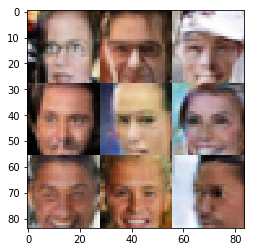

Epoch 18/20... Discriminator Loss: 0.6189... Generator Loss: 1.6404
Epoch 18/20... Discriminator Loss: 0.6952... Generator Loss: 1.0053
Epoch 18/20... Discriminator Loss: 0.5771... Generator Loss: 1.4555
Epoch 18/20... Discriminator Loss: 0.8065... Generator Loss: 1.1045
Epoch 18/20... Discriminator Loss: 0.4818... Generator Loss: 1.6481
Epoch 18/20... Discriminator Loss: 0.6814... Generator Loss: 2.4222
Epoch 18/20... Discriminator Loss: 0.5996... Generator Loss: 1.1577
Epoch 18/20... Discriminator Loss: 0.9589... Generator Loss: 0.6449
Epoch 18/20... Discriminator Loss: 0.3548... Generator Loss: 2.4904
Epoch 18/20... Discriminator Loss: 0.5784... Generator Loss: 2.4850


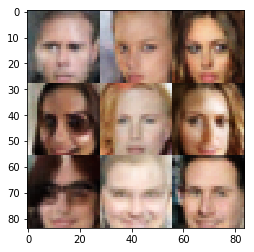

Epoch 18/20... Discriminator Loss: 0.4798... Generator Loss: 1.6842
Epoch 18/20... Discriminator Loss: 0.4204... Generator Loss: 1.8354
Epoch 18/20... Discriminator Loss: 0.9777... Generator Loss: 0.6790
Epoch 18/20... Discriminator Loss: 0.6997... Generator Loss: 1.0581
Epoch 18/20... Discriminator Loss: 0.5544... Generator Loss: 1.1727
Epoch 18/20... Discriminator Loss: 0.4534... Generator Loss: 1.5121
Epoch 18/20... Discriminator Loss: 0.9621... Generator Loss: 0.6686
Epoch 18/20... Discriminator Loss: 0.7968... Generator Loss: 0.9245
Epoch 18/20... Discriminator Loss: 0.3580... Generator Loss: 1.9076
Epoch 18/20... Discriminator Loss: 0.4917... Generator Loss: 1.5890


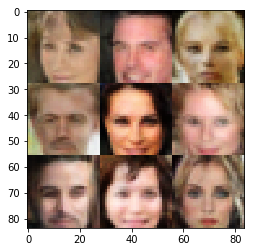

Epoch 18/20... Discriminator Loss: 0.7480... Generator Loss: 0.9844
Epoch 18/20... Discriminator Loss: 0.8639... Generator Loss: 0.7864
Epoch 18/20... Discriminator Loss: 0.5103... Generator Loss: 1.3252
Epoch 18/20... Discriminator Loss: 0.3293... Generator Loss: 2.2211
Epoch 18/20... Discriminator Loss: 0.6002... Generator Loss: 1.1310
Epoch 18/20... Discriminator Loss: 1.4347... Generator Loss: 0.4511
Epoch 18/20... Discriminator Loss: 1.2319... Generator Loss: 3.5491
Epoch 18/20... Discriminator Loss: 0.3971... Generator Loss: 1.6667
Epoch 18/20... Discriminator Loss: 0.5531... Generator Loss: 1.3016
Epoch 18/20... Discriminator Loss: 0.6637... Generator Loss: 0.9854


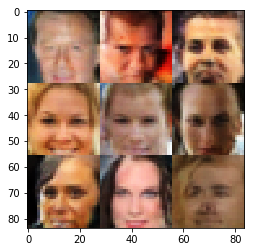

Epoch 18/20... Discriminator Loss: 1.0572... Generator Loss: 0.6649
Epoch 18/20... Discriminator Loss: 0.4462... Generator Loss: 1.5045
Epoch 18/20... Discriminator Loss: 0.3691... Generator Loss: 1.8910
Epoch 18/20... Discriminator Loss: 0.3311... Generator Loss: 2.2220
Epoch 18/20... Discriminator Loss: 2.3241... Generator Loss: 0.2284
Epoch 18/20... Discriminator Loss: 1.3613... Generator Loss: 2.5219
Epoch 18/20... Discriminator Loss: 1.0883... Generator Loss: 0.6404
Epoch 18/20... Discriminator Loss: 0.6999... Generator Loss: 1.0928
Epoch 18/20... Discriminator Loss: 0.4657... Generator Loss: 2.0127
Epoch 18/20... Discriminator Loss: 0.8541... Generator Loss: 0.8310


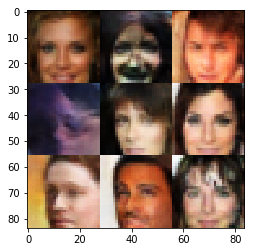

Epoch 18/20... Discriminator Loss: 0.6577... Generator Loss: 1.0308
Epoch 18/20... Discriminator Loss: 0.4275... Generator Loss: 1.5204
Epoch 18/20... Discriminator Loss: 1.3441... Generator Loss: 0.4528
Epoch 18/20... Discriminator Loss: 0.4462... Generator Loss: 2.6973
Epoch 18/20... Discriminator Loss: 0.6659... Generator Loss: 1.0035
Epoch 18/20... Discriminator Loss: 0.8206... Generator Loss: 0.8468
Epoch 18/20... Discriminator Loss: 0.7364... Generator Loss: 1.0132
Epoch 18/20... Discriminator Loss: 1.3226... Generator Loss: 0.4405
Epoch 18/20... Discriminator Loss: 0.6501... Generator Loss: 1.3616
Epoch 18/20... Discriminator Loss: 0.5936... Generator Loss: 1.1333


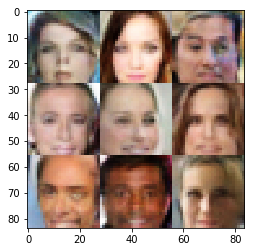

Epoch 18/20... Discriminator Loss: 0.7496... Generator Loss: 0.9069
Epoch 18/20... Discriminator Loss: 0.7421... Generator Loss: 0.9462
Epoch 18/20... Discriminator Loss: 0.4423... Generator Loss: 1.4640
Epoch 18/20... Discriminator Loss: 0.5875... Generator Loss: 1.1421
Epoch 18/20... Discriminator Loss: 0.7244... Generator Loss: 0.9656
Epoch 18/20... Discriminator Loss: 0.3274... Generator Loss: 1.7897
Epoch 18/20... Discriminator Loss: 0.5129... Generator Loss: 1.3260
Epoch 18/20... Discriminator Loss: 0.7619... Generator Loss: 0.8568
Epoch 18/20... Discriminator Loss: 1.3860... Generator Loss: 0.4164
Epoch 18/20... Discriminator Loss: 1.2174... Generator Loss: 0.5274


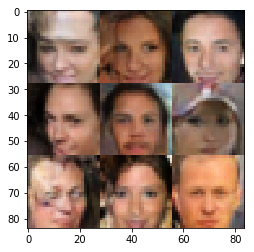

Epoch 18/20... Discriminator Loss: 0.9693... Generator Loss: 0.6643
Epoch 18/20... Discriminator Loss: 0.5303... Generator Loss: 1.2152
Epoch 18/20... Discriminator Loss: 0.6291... Generator Loss: 1.3712
Epoch 18/20... Discriminator Loss: 0.3661... Generator Loss: 1.6412
Epoch 18/20... Discriminator Loss: 0.3639... Generator Loss: 1.8557
Epoch 18/20... Discriminator Loss: 0.4862... Generator Loss: 1.5275
Epoch 18/20... Discriminator Loss: 0.5500... Generator Loss: 1.2435
Epoch 18/20... Discriminator Loss: 0.2524... Generator Loss: 2.1833
Epoch 18/20... Discriminator Loss: 0.4091... Generator Loss: 2.7313
Epoch 18/20... Discriminator Loss: 0.2869... Generator Loss: 2.1882


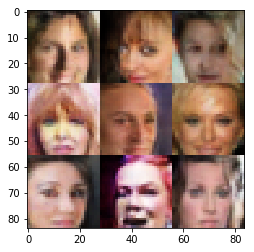

Epoch 18/20... Discriminator Loss: 0.7522... Generator Loss: 0.9319
Epoch 18/20... Discriminator Loss: 0.3708... Generator Loss: 1.7930
Epoch 18/20... Discriminator Loss: 0.9070... Generator Loss: 0.6972
Epoch 18/20... Discriminator Loss: 0.3305... Generator Loss: 1.9615
Epoch 18/20... Discriminator Loss: 3.9566... Generator Loss: 0.0557
Epoch 18/20... Discriminator Loss: 1.0014... Generator Loss: 1.4276
Epoch 18/20... Discriminator Loss: 0.8030... Generator Loss: 0.8420
Epoch 18/20... Discriminator Loss: 0.5647... Generator Loss: 1.5859
Epoch 18/20... Discriminator Loss: 0.5329... Generator Loss: 1.3090
Epoch 18/20... Discriminator Loss: 0.4863... Generator Loss: 1.5205


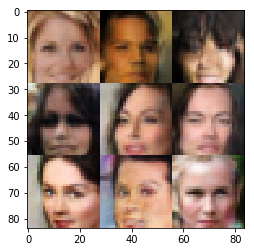

Epoch 18/20... Discriminator Loss: 0.4562... Generator Loss: 1.3578
Epoch 18/20... Discriminator Loss: 0.7083... Generator Loss: 3.7616
Epoch 18/20... Discriminator Loss: 0.9029... Generator Loss: 0.8461
Epoch 18/20... Discriminator Loss: 0.6837... Generator Loss: 1.0216
Epoch 18/20... Discriminator Loss: 0.7223... Generator Loss: 1.0046
Epoch 18/20... Discriminator Loss: 0.8260... Generator Loss: 0.7972
Epoch 18/20... Discriminator Loss: 0.4733... Generator Loss: 1.3430
Epoch 18/20... Discriminator Loss: 0.5453... Generator Loss: 1.2355
Epoch 18/20... Discriminator Loss: 0.7379... Generator Loss: 0.9142
Epoch 18/20... Discriminator Loss: 0.9947... Generator Loss: 0.7342


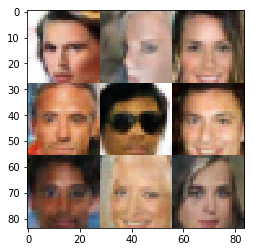

Epoch 18/20... Discriminator Loss: 0.6396... Generator Loss: 1.1579
Epoch 18/20... Discriminator Loss: 0.6313... Generator Loss: 1.1167
Epoch 18/20... Discriminator Loss: 0.9099... Generator Loss: 0.7033
Epoch 18/20... Discriminator Loss: 0.5863... Generator Loss: 1.1314
Epoch 18/20... Discriminator Loss: 0.6642... Generator Loss: 3.6119
Epoch 18/20... Discriminator Loss: 0.9586... Generator Loss: 0.6654
Epoch 18/20... Discriminator Loss: 0.6107... Generator Loss: 1.2482
Epoch 19/20... Discriminator Loss: 0.5532... Generator Loss: 1.6026
Epoch 19/20... Discriminator Loss: 0.6039... Generator Loss: 2.4705
Epoch 19/20... Discriminator Loss: 0.5662... Generator Loss: 1.1905


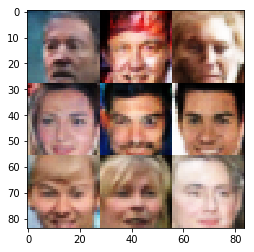

Epoch 19/20... Discriminator Loss: 0.7993... Generator Loss: 0.8069
Epoch 19/20... Discriminator Loss: 0.6397... Generator Loss: 1.0624
Epoch 19/20... Discriminator Loss: 0.7231... Generator Loss: 0.9501
Epoch 19/20... Discriminator Loss: 0.4969... Generator Loss: 1.6215
Epoch 19/20... Discriminator Loss: 1.1157... Generator Loss: 0.5844
Epoch 19/20... Discriminator Loss: 1.2161... Generator Loss: 0.5475
Epoch 19/20... Discriminator Loss: 0.2995... Generator Loss: 1.9816
Epoch 19/20... Discriminator Loss: 1.4164... Generator Loss: 0.4596
Epoch 19/20... Discriminator Loss: 0.4456... Generator Loss: 1.5375
Epoch 19/20... Discriminator Loss: 0.5591... Generator Loss: 1.2362


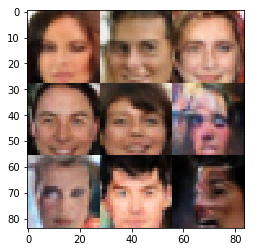

Epoch 19/20... Discriminator Loss: 0.3710... Generator Loss: 1.7028
Epoch 19/20... Discriminator Loss: 0.5182... Generator Loss: 1.1913
Epoch 19/20... Discriminator Loss: 0.4272... Generator Loss: 1.7612
Epoch 19/20... Discriminator Loss: 0.3339... Generator Loss: 1.8224
Epoch 19/20... Discriminator Loss: 0.8054... Generator Loss: 0.8139
Epoch 19/20... Discriminator Loss: 1.5585... Generator Loss: 0.3435
Epoch 19/20... Discriminator Loss: 0.5319... Generator Loss: 2.3080
Epoch 19/20... Discriminator Loss: 0.4446... Generator Loss: 1.5545
Epoch 19/20... Discriminator Loss: 0.4043... Generator Loss: 2.2428
Epoch 19/20... Discriminator Loss: 0.5412... Generator Loss: 1.3051


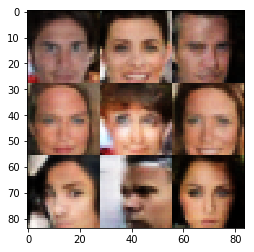

Epoch 19/20... Discriminator Loss: 1.2522... Generator Loss: 0.7725
Epoch 19/20... Discriminator Loss: 0.8950... Generator Loss: 0.7675
Epoch 19/20... Discriminator Loss: 0.5829... Generator Loss: 2.1754
Epoch 19/20... Discriminator Loss: 0.6347... Generator Loss: 1.4710
Epoch 19/20... Discriminator Loss: 0.7003... Generator Loss: 1.0066
Epoch 19/20... Discriminator Loss: 0.3842... Generator Loss: 1.5205
Epoch 19/20... Discriminator Loss: 0.4829... Generator Loss: 1.2528
Epoch 19/20... Discriminator Loss: 0.4674... Generator Loss: 1.3704
Epoch 19/20... Discriminator Loss: 0.5714... Generator Loss: 1.1773
Epoch 19/20... Discriminator Loss: 0.5036... Generator Loss: 1.2771


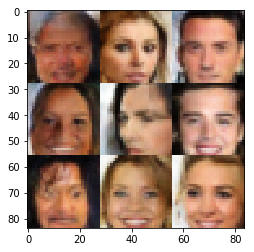

Epoch 19/20... Discriminator Loss: 0.6446... Generator Loss: 0.9922
Epoch 19/20... Discriminator Loss: 0.3609... Generator Loss: 1.7823
Epoch 19/20... Discriminator Loss: 0.4508... Generator Loss: 1.3692
Epoch 19/20... Discriminator Loss: 1.1851... Generator Loss: 0.5106
Epoch 19/20... Discriminator Loss: 0.7165... Generator Loss: 0.9561
Epoch 19/20... Discriminator Loss: 0.6410... Generator Loss: 1.0208
Epoch 19/20... Discriminator Loss: 0.5860... Generator Loss: 1.1550
Epoch 19/20... Discriminator Loss: 0.6075... Generator Loss: 1.1196
Epoch 19/20... Discriminator Loss: 0.2987... Generator Loss: 1.8323
Epoch 19/20... Discriminator Loss: 0.3378... Generator Loss: 2.2764


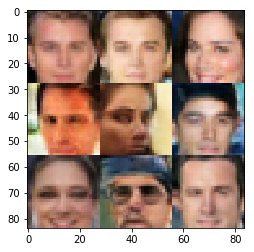

Epoch 19/20... Discriminator Loss: 1.3104... Generator Loss: 0.4359
Epoch 19/20... Discriminator Loss: 3.3135... Generator Loss: 4.6118
Epoch 19/20... Discriminator Loss: 1.8918... Generator Loss: 1.7444
Epoch 19/20... Discriminator Loss: 1.9989... Generator Loss: 0.3317
Epoch 19/20... Discriminator Loss: 1.0648... Generator Loss: 0.7602
Epoch 19/20... Discriminator Loss: 0.9343... Generator Loss: 0.8438
Epoch 19/20... Discriminator Loss: 0.7190... Generator Loss: 1.5242
Epoch 19/20... Discriminator Loss: 1.5942... Generator Loss: 0.3722
Epoch 19/20... Discriminator Loss: 0.4684... Generator Loss: 1.4294
Epoch 19/20... Discriminator Loss: 0.9016... Generator Loss: 0.7408


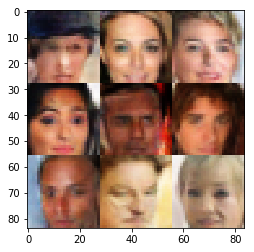

Epoch 19/20... Discriminator Loss: 0.8126... Generator Loss: 0.8577
Epoch 19/20... Discriminator Loss: 0.7532... Generator Loss: 0.9285
Epoch 19/20... Discriminator Loss: 0.5056... Generator Loss: 1.6576
Epoch 19/20... Discriminator Loss: 0.5542... Generator Loss: 1.3988
Epoch 19/20... Discriminator Loss: 0.5043... Generator Loss: 1.4009
Epoch 19/20... Discriminator Loss: 1.2261... Generator Loss: 0.5480
Epoch 19/20... Discriminator Loss: 0.5568... Generator Loss: 1.2429
Epoch 19/20... Discriminator Loss: 1.3492... Generator Loss: 0.5439
Epoch 19/20... Discriminator Loss: 0.6478... Generator Loss: 1.5891
Epoch 19/20... Discriminator Loss: 0.7154... Generator Loss: 0.9482


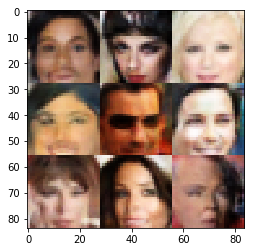

Epoch 19/20... Discriminator Loss: 0.6308... Generator Loss: 1.0776
Epoch 19/20... Discriminator Loss: 0.6766... Generator Loss: 2.7205
Epoch 19/20... Discriminator Loss: 0.5436... Generator Loss: 1.1436
Epoch 19/20... Discriminator Loss: 0.7429... Generator Loss: 0.9798
Epoch 19/20... Discriminator Loss: 0.4403... Generator Loss: 1.8783
Epoch 19/20... Discriminator Loss: 0.3806... Generator Loss: 1.6084
Epoch 19/20... Discriminator Loss: 0.7135... Generator Loss: 0.9940
Epoch 19/20... Discriminator Loss: 0.5971... Generator Loss: 1.0895
Epoch 19/20... Discriminator Loss: 0.2918... Generator Loss: 2.2706
Epoch 19/20... Discriminator Loss: 0.5665... Generator Loss: 1.3095


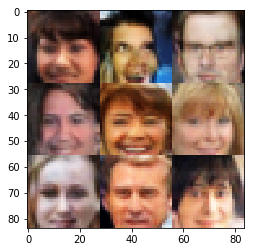

Epoch 19/20... Discriminator Loss: 0.3059... Generator Loss: 1.8399
Epoch 19/20... Discriminator Loss: 0.3399... Generator Loss: 1.6772
Epoch 19/20... Discriminator Loss: 0.4528... Generator Loss: 1.5133
Epoch 19/20... Discriminator Loss: 0.5716... Generator Loss: 1.1389
Epoch 19/20... Discriminator Loss: 0.4470... Generator Loss: 1.5676
Epoch 19/20... Discriminator Loss: 0.8226... Generator Loss: 0.7612
Epoch 19/20... Discriminator Loss: 0.3734... Generator Loss: 1.7646
Epoch 19/20... Discriminator Loss: 2.2993... Generator Loss: 0.2146
Epoch 19/20... Discriminator Loss: 1.6555... Generator Loss: 0.3993
Epoch 19/20... Discriminator Loss: 1.5623... Generator Loss: 0.4151


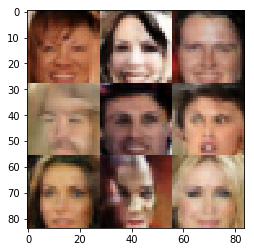

Epoch 19/20... Discriminator Loss: 1.1560... Generator Loss: 0.5595
Epoch 19/20... Discriminator Loss: 0.8321... Generator Loss: 0.8158
Epoch 19/20... Discriminator Loss: 0.3449... Generator Loss: 1.7825
Epoch 19/20... Discriminator Loss: 0.9715... Generator Loss: 0.6672
Epoch 19/20... Discriminator Loss: 0.6825... Generator Loss: 0.9979
Epoch 19/20... Discriminator Loss: 0.4814... Generator Loss: 3.0328
Epoch 19/20... Discriminator Loss: 0.4593... Generator Loss: 1.7112
Epoch 19/20... Discriminator Loss: 0.5567... Generator Loss: 1.2140
Epoch 19/20... Discriminator Loss: 0.5294... Generator Loss: 1.2298
Epoch 19/20... Discriminator Loss: 0.4930... Generator Loss: 1.3472


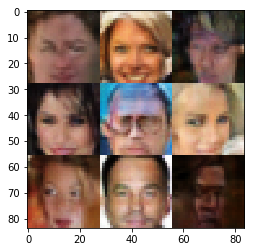

Epoch 19/20... Discriminator Loss: 0.3625... Generator Loss: 1.5840
Epoch 19/20... Discriminator Loss: 0.5585... Generator Loss: 1.2241
Epoch 19/20... Discriminator Loss: 0.3573... Generator Loss: 1.8202
Epoch 19/20... Discriminator Loss: 0.6909... Generator Loss: 1.0533
Epoch 19/20... Discriminator Loss: 0.6123... Generator Loss: 1.1614
Epoch 19/20... Discriminator Loss: 0.3338... Generator Loss: 1.9859
Epoch 19/20... Discriminator Loss: 0.3060... Generator Loss: 1.9083
Epoch 19/20... Discriminator Loss: 0.7617... Generator Loss: 0.9304
Epoch 19/20... Discriminator Loss: 0.5843... Generator Loss: 1.1400
Epoch 19/20... Discriminator Loss: 0.9342... Generator Loss: 4.4641


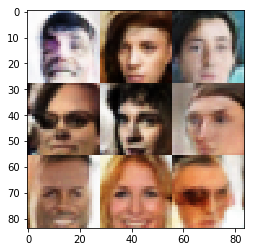

Epoch 19/20... Discriminator Loss: 0.7028... Generator Loss: 2.6783
Epoch 19/20... Discriminator Loss: 0.3758... Generator Loss: 2.2160
Epoch 19/20... Discriminator Loss: 1.2898... Generator Loss: 0.5110
Epoch 19/20... Discriminator Loss: 0.7533... Generator Loss: 0.9518
Epoch 19/20... Discriminator Loss: 0.5414... Generator Loss: 1.4176
Epoch 19/20... Discriminator Loss: 0.6625... Generator Loss: 2.7782
Epoch 19/20... Discriminator Loss: 0.7516... Generator Loss: 0.8764
Epoch 19/20... Discriminator Loss: 0.4547... Generator Loss: 1.4328
Epoch 19/20... Discriminator Loss: 0.4882... Generator Loss: 1.4171
Epoch 19/20... Discriminator Loss: 0.3271... Generator Loss: 2.1037


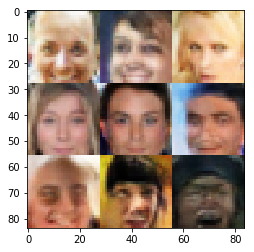

Epoch 19/20... Discriminator Loss: 0.3888... Generator Loss: 1.5786
Epoch 19/20... Discriminator Loss: 0.3574... Generator Loss: 1.6325
Epoch 19/20... Discriminator Loss: 0.5004... Generator Loss: 2.0692
Epoch 19/20... Discriminator Loss: 0.3134... Generator Loss: 1.9055
Epoch 19/20... Discriminator Loss: 0.2885... Generator Loss: 2.0035
Epoch 19/20... Discriminator Loss: 0.4588... Generator Loss: 1.9279
Epoch 19/20... Discriminator Loss: 0.4186... Generator Loss: 1.8451
Epoch 19/20... Discriminator Loss: 0.5006... Generator Loss: 1.4465
Epoch 19/20... Discriminator Loss: 0.5889... Generator Loss: 1.2123
Epoch 19/20... Discriminator Loss: 0.3796... Generator Loss: 1.5844


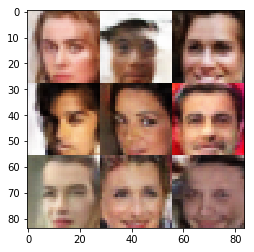

Epoch 19/20... Discriminator Loss: 0.5281... Generator Loss: 1.2214
Epoch 19/20... Discriminator Loss: 0.6494... Generator Loss: 1.0999
Epoch 19/20... Discriminator Loss: 0.1283... Generator Loss: 2.7952
Epoch 19/20... Discriminator Loss: 0.3062... Generator Loss: 2.1862
Epoch 19/20... Discriminator Loss: 0.4041... Generator Loss: 1.4346
Epoch 19/20... Discriminator Loss: 0.4426... Generator Loss: 1.4857
Epoch 19/20... Discriminator Loss: 0.8768... Generator Loss: 0.7324
Epoch 19/20... Discriminator Loss: 0.3844... Generator Loss: 1.6624
Epoch 19/20... Discriminator Loss: 1.1711... Generator Loss: 0.5415
Epoch 19/20... Discriminator Loss: 0.3881... Generator Loss: 1.8265


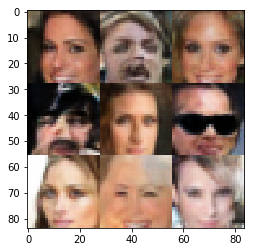

Epoch 19/20... Discriminator Loss: 2.0263... Generator Loss: 0.2410
Epoch 19/20... Discriminator Loss: 1.7825... Generator Loss: 2.6657
Epoch 19/20... Discriminator Loss: 0.7623... Generator Loss: 1.1659
Epoch 19/20... Discriminator Loss: 2.3712... Generator Loss: 0.2318
Epoch 19/20... Discriminator Loss: 0.5614... Generator Loss: 2.4089
Epoch 19/20... Discriminator Loss: 1.4026... Generator Loss: 2.6974
Epoch 19/20... Discriminator Loss: 0.7119... Generator Loss: 1.1045
Epoch 19/20... Discriminator Loss: 0.3641... Generator Loss: 1.9114
Epoch 19/20... Discriminator Loss: 0.6901... Generator Loss: 1.0199
Epoch 19/20... Discriminator Loss: 0.4978... Generator Loss: 1.4787


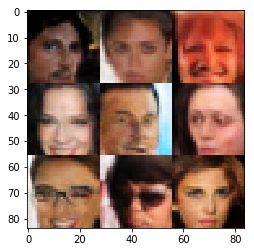

Epoch 19/20... Discriminator Loss: 0.5650... Generator Loss: 1.2344
Epoch 19/20... Discriminator Loss: 0.4018... Generator Loss: 2.1309
Epoch 19/20... Discriminator Loss: 0.7174... Generator Loss: 0.9529
Epoch 19/20... Discriminator Loss: 0.2680... Generator Loss: 2.2862
Epoch 19/20... Discriminator Loss: 0.4186... Generator Loss: 1.5062
Epoch 19/20... Discriminator Loss: 0.9842... Generator Loss: 0.6677
Epoch 19/20... Discriminator Loss: 0.5106... Generator Loss: 1.3446
Epoch 19/20... Discriminator Loss: 0.6760... Generator Loss: 1.0562
Epoch 19/20... Discriminator Loss: 0.4900... Generator Loss: 1.4668
Epoch 19/20... Discriminator Loss: 0.6363... Generator Loss: 1.0987


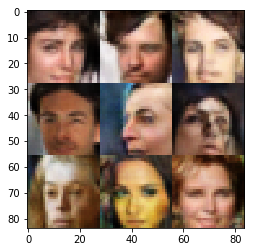

Epoch 19/20... Discriminator Loss: 0.4307... Generator Loss: 1.4999
Epoch 19/20... Discriminator Loss: 0.8009... Generator Loss: 0.8459
Epoch 19/20... Discriminator Loss: 0.9421... Generator Loss: 0.7024
Epoch 19/20... Discriminator Loss: 0.4484... Generator Loss: 1.5019
Epoch 19/20... Discriminator Loss: 0.8479... Generator Loss: 0.7775
Epoch 20/20... Discriminator Loss: 0.3595... Generator Loss: 1.9463
Epoch 20/20... Discriminator Loss: 0.4204... Generator Loss: 1.6252
Epoch 20/20... Discriminator Loss: 0.9988... Generator Loss: 0.7054
Epoch 20/20... Discriminator Loss: 0.8773... Generator Loss: 0.7701
Epoch 20/20... Discriminator Loss: 0.4666... Generator Loss: 1.4396


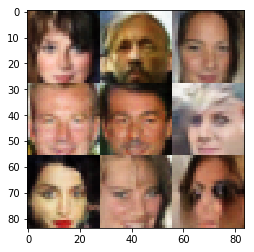

Epoch 20/20... Discriminator Loss: 0.4699... Generator Loss: 1.8209
Epoch 20/20... Discriminator Loss: 1.7651... Generator Loss: 0.3155
Epoch 20/20... Discriminator Loss: 2.3897... Generator Loss: 0.2224
Epoch 20/20... Discriminator Loss: 1.9791... Generator Loss: 0.3544
Epoch 20/20... Discriminator Loss: 1.0619... Generator Loss: 0.6961
Epoch 20/20... Discriminator Loss: 1.4024... Generator Loss: 0.4808
Epoch 20/20... Discriminator Loss: 0.5504... Generator Loss: 1.3422
Epoch 20/20... Discriminator Loss: 0.2349... Generator Loss: 3.0389
Epoch 20/20... Discriminator Loss: 0.5766... Generator Loss: 3.4615
Epoch 20/20... Discriminator Loss: 0.4972... Generator Loss: 1.3468


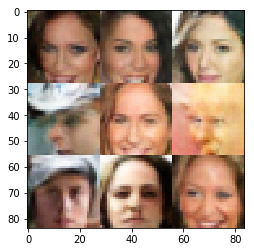

Epoch 20/20... Discriminator Loss: 0.3767... Generator Loss: 1.7545
Epoch 20/20... Discriminator Loss: 0.7141... Generator Loss: 0.9734
Epoch 20/20... Discriminator Loss: 1.0156... Generator Loss: 0.6203
Epoch 20/20... Discriminator Loss: 0.6375... Generator Loss: 1.0923
Epoch 20/20... Discriminator Loss: 0.4544... Generator Loss: 1.5389
Epoch 20/20... Discriminator Loss: 0.7885... Generator Loss: 0.9287
Epoch 20/20... Discriminator Loss: 0.4536... Generator Loss: 1.4448
Epoch 20/20... Discriminator Loss: 0.6586... Generator Loss: 0.9827
Epoch 20/20... Discriminator Loss: 1.2700... Generator Loss: 0.5588
Epoch 20/20... Discriminator Loss: 0.5277... Generator Loss: 1.2226


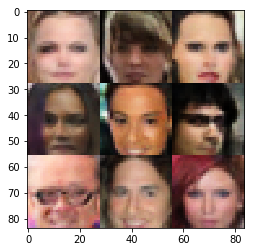

Epoch 20/20... Discriminator Loss: 0.3873... Generator Loss: 1.6374
Epoch 20/20... Discriminator Loss: 0.2829... Generator Loss: 2.2170
Epoch 20/20... Discriminator Loss: 0.3034... Generator Loss: 1.9675
Epoch 20/20... Discriminator Loss: 0.3111... Generator Loss: 1.9050
Epoch 20/20... Discriminator Loss: 0.7258... Generator Loss: 0.9376
Epoch 20/20... Discriminator Loss: 0.4590... Generator Loss: 1.6593
Epoch 20/20... Discriminator Loss: 0.5299... Generator Loss: 1.2799
Epoch 20/20... Discriminator Loss: 0.2956... Generator Loss: 2.3536
Epoch 20/20... Discriminator Loss: 0.2890... Generator Loss: 1.9475
Epoch 20/20... Discriminator Loss: 0.8738... Generator Loss: 0.7720


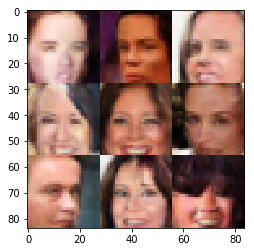

Epoch 20/20... Discriminator Loss: 0.8089... Generator Loss: 0.8842
Epoch 20/20... Discriminator Loss: 0.1843... Generator Loss: 2.8576
Epoch 20/20... Discriminator Loss: 1.8107... Generator Loss: 0.2633
Epoch 20/20... Discriminator Loss: 1.1631... Generator Loss: 0.6441
Epoch 20/20... Discriminator Loss: 0.8648... Generator Loss: 0.7805
Epoch 20/20... Discriminator Loss: 0.3392... Generator Loss: 3.9132
Epoch 20/20... Discriminator Loss: 0.3394... Generator Loss: 1.8279
Epoch 20/20... Discriminator Loss: 0.6032... Generator Loss: 1.1728
Epoch 20/20... Discriminator Loss: 0.6460... Generator Loss: 1.1041
Epoch 20/20... Discriminator Loss: 1.4336... Generator Loss: 5.6422


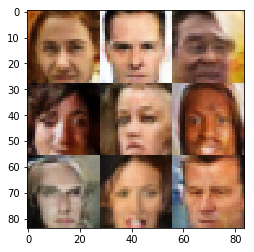

Epoch 20/20... Discriminator Loss: 0.4017... Generator Loss: 2.6549
Epoch 20/20... Discriminator Loss: 1.2565... Generator Loss: 0.4725
Epoch 20/20... Discriminator Loss: 0.4636... Generator Loss: 1.5223
Epoch 20/20... Discriminator Loss: 0.2883... Generator Loss: 2.2302
Epoch 20/20... Discriminator Loss: 0.4154... Generator Loss: 2.4083
Epoch 20/20... Discriminator Loss: 0.4591... Generator Loss: 1.4971
Epoch 20/20... Discriminator Loss: 0.8465... Generator Loss: 0.8724
Epoch 20/20... Discriminator Loss: 0.3020... Generator Loss: 2.3027
Epoch 20/20... Discriminator Loss: 0.7605... Generator Loss: 0.8764
Epoch 20/20... Discriminator Loss: 0.4647... Generator Loss: 1.5197


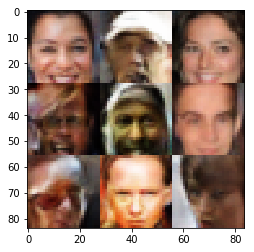

Epoch 20/20... Discriminator Loss: 0.4122... Generator Loss: 1.5515
Epoch 20/20... Discriminator Loss: 0.4541... Generator Loss: 1.3869
Epoch 20/20... Discriminator Loss: 0.7671... Generator Loss: 0.9128
Epoch 20/20... Discriminator Loss: 0.1969... Generator Loss: 2.2864
Epoch 20/20... Discriminator Loss: 5.5772... Generator Loss: 7.5022
Epoch 20/20... Discriminator Loss: 0.4682... Generator Loss: 1.6886
Epoch 20/20... Discriminator Loss: 1.0714... Generator Loss: 0.6597
Epoch 20/20... Discriminator Loss: 0.5345... Generator Loss: 1.5523
Epoch 20/20... Discriminator Loss: 0.8513... Generator Loss: 0.8651
Epoch 20/20... Discriminator Loss: 0.6101... Generator Loss: 1.1100


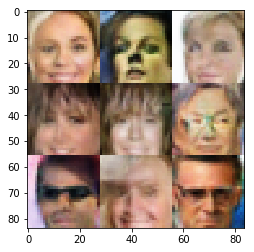

Epoch 20/20... Discriminator Loss: 0.5570... Generator Loss: 1.2092
Epoch 20/20... Discriminator Loss: 0.7658... Generator Loss: 0.8799
Epoch 20/20... Discriminator Loss: 0.5224... Generator Loss: 1.3588
Epoch 20/20... Discriminator Loss: 0.4471... Generator Loss: 2.3911
Epoch 20/20... Discriminator Loss: 0.3442... Generator Loss: 1.6432
Epoch 20/20... Discriminator Loss: 0.4401... Generator Loss: 3.2149
Epoch 20/20... Discriminator Loss: 0.5770... Generator Loss: 1.2576
Epoch 20/20... Discriminator Loss: 0.8251... Generator Loss: 0.8072
Epoch 20/20... Discriminator Loss: 0.3786... Generator Loss: 2.6232
Epoch 20/20... Discriminator Loss: 0.4149... Generator Loss: 1.7630


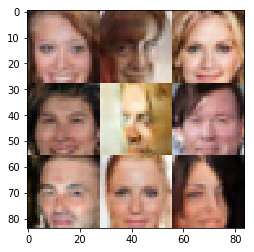

Epoch 20/20... Discriminator Loss: 0.8193... Generator Loss: 0.8691
Epoch 20/20... Discriminator Loss: 0.3397... Generator Loss: 1.7668
Epoch 20/20... Discriminator Loss: 0.5405... Generator Loss: 2.8121
Epoch 20/20... Discriminator Loss: 0.5661... Generator Loss: 1.2054
Epoch 20/20... Discriminator Loss: 0.4020... Generator Loss: 1.5320
Epoch 20/20... Discriminator Loss: 0.7199... Generator Loss: 0.9102
Epoch 20/20... Discriminator Loss: 0.3896... Generator Loss: 1.5681
Epoch 20/20... Discriminator Loss: 1.4505... Generator Loss: 0.3953
Epoch 20/20... Discriminator Loss: 0.5977... Generator Loss: 1.1273
Epoch 20/20... Discriminator Loss: 0.5336... Generator Loss: 1.3059


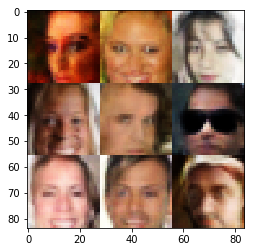

Epoch 20/20... Discriminator Loss: 0.2750... Generator Loss: 2.1260
Epoch 20/20... Discriminator Loss: 0.4394... Generator Loss: 1.4467
Epoch 20/20... Discriminator Loss: 0.3790... Generator Loss: 1.5817
Epoch 20/20... Discriminator Loss: 0.3782... Generator Loss: 1.9222
Epoch 20/20... Discriminator Loss: 1.1540... Generator Loss: 0.5397
Epoch 20/20... Discriminator Loss: 1.0635... Generator Loss: 0.6224
Epoch 20/20... Discriminator Loss: 0.4483... Generator Loss: 1.3664
Epoch 20/20... Discriminator Loss: 0.4209... Generator Loss: 1.7237
Epoch 20/20... Discriminator Loss: 2.4428... Generator Loss: 0.2029
Epoch 20/20... Discriminator Loss: 2.1227... Generator Loss: 0.2522


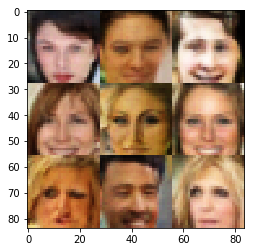

Epoch 20/20... Discriminator Loss: 0.8027... Generator Loss: 0.9844
Epoch 20/20... Discriminator Loss: 0.7974... Generator Loss: 0.9142
Epoch 20/20... Discriminator Loss: 1.3791... Generator Loss: 0.4476
Epoch 20/20... Discriminator Loss: 0.7129... Generator Loss: 0.9475
Epoch 20/20... Discriminator Loss: 0.6910... Generator Loss: 1.0612
Epoch 20/20... Discriminator Loss: 1.1949... Generator Loss: 0.6333
Epoch 20/20... Discriminator Loss: 0.3117... Generator Loss: 1.9615
Epoch 20/20... Discriminator Loss: 0.3757... Generator Loss: 1.8543
Epoch 20/20... Discriminator Loss: 0.4722... Generator Loss: 1.3445
Epoch 20/20... Discriminator Loss: 0.3717... Generator Loss: 1.7837


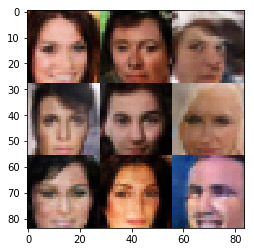

Epoch 20/20... Discriminator Loss: 0.4676... Generator Loss: 1.4096
Epoch 20/20... Discriminator Loss: 0.2603... Generator Loss: 3.1263
Epoch 20/20... Discriminator Loss: 0.4385... Generator Loss: 1.3702
Epoch 20/20... Discriminator Loss: 0.4669... Generator Loss: 1.4929
Epoch 20/20... Discriminator Loss: 1.4772... Generator Loss: 0.5124
Epoch 20/20... Discriminator Loss: 1.0094... Generator Loss: 0.7801
Epoch 20/20... Discriminator Loss: 0.4858... Generator Loss: 1.6309
Epoch 20/20... Discriminator Loss: 0.6208... Generator Loss: 1.1763
Epoch 20/20... Discriminator Loss: 0.3840... Generator Loss: 1.5722
Epoch 20/20... Discriminator Loss: 0.3604... Generator Loss: 1.7101


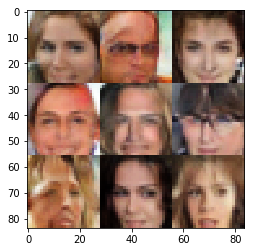

Epoch 20/20... Discriminator Loss: 0.4016... Generator Loss: 2.7534
Epoch 20/20... Discriminator Loss: 0.3837... Generator Loss: 1.6750
Epoch 20/20... Discriminator Loss: 0.7477... Generator Loss: 0.9477
Epoch 20/20... Discriminator Loss: 0.7109... Generator Loss: 0.9268
Epoch 20/20... Discriminator Loss: 0.3846... Generator Loss: 1.6897
Epoch 20/20... Discriminator Loss: 0.5220... Generator Loss: 1.3307
Epoch 20/20... Discriminator Loss: 0.3322... Generator Loss: 3.3110
Epoch 20/20... Discriminator Loss: 0.4543... Generator Loss: 1.4837
Epoch 20/20... Discriminator Loss: 0.6935... Generator Loss: 0.9617
Epoch 20/20... Discriminator Loss: 0.6107... Generator Loss: 1.0830


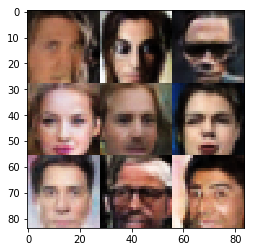

Epoch 20/20... Discriminator Loss: 0.4853... Generator Loss: 1.3743
Epoch 20/20... Discriminator Loss: 0.6032... Generator Loss: 1.1262
Epoch 20/20... Discriminator Loss: 0.4295... Generator Loss: 1.4431
Epoch 20/20... Discriminator Loss: 0.6704... Generator Loss: 1.0050
Epoch 20/20... Discriminator Loss: 0.2415... Generator Loss: 2.4826
Epoch 20/20... Discriminator Loss: 0.8402... Generator Loss: 0.8159
Epoch 20/20... Discriminator Loss: 0.3742... Generator Loss: 2.2401
Epoch 20/20... Discriminator Loss: 0.3853... Generator Loss: 1.9146
Epoch 20/20... Discriminator Loss: 0.8502... Generator Loss: 0.8790
Epoch 20/20... Discriminator Loss: 0.6670... Generator Loss: 1.0936


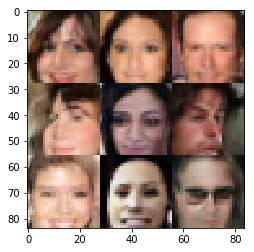

Epoch 20/20... Discriminator Loss: 0.3842... Generator Loss: 1.7649
Epoch 20/20... Discriminator Loss: 0.4941... Generator Loss: 1.2719
Epoch 20/20... Discriminator Loss: 0.5457... Generator Loss: 1.2732
Epoch 20/20... Discriminator Loss: 0.4717... Generator Loss: 1.6170
Epoch 20/20... Discriminator Loss: 0.6880... Generator Loss: 1.0239
Epoch 20/20... Discriminator Loss: 1.2110... Generator Loss: 0.5195
Epoch 20/20... Discriminator Loss: 2.3869... Generator Loss: 0.2961
Epoch 20/20... Discriminator Loss: 0.9006... Generator Loss: 0.7908
Epoch 20/20... Discriminator Loss: 0.4707... Generator Loss: 1.8782
Epoch 20/20... Discriminator Loss: 0.9979... Generator Loss: 0.7155


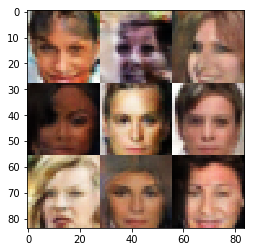

Epoch 20/20... Discriminator Loss: 0.4250... Generator Loss: 2.2450
Epoch 20/20... Discriminator Loss: 0.4841... Generator Loss: 1.4756
Epoch 20/20... Discriminator Loss: 0.8490... Generator Loss: 0.8734
Epoch 20/20... Discriminator Loss: 0.4409... Generator Loss: 1.4153
Epoch 20/20... Discriminator Loss: 0.3178... Generator Loss: 2.2093
Epoch 20/20... Discriminator Loss: 0.3367... Generator Loss: 1.7750
Epoch 20/20... Discriminator Loss: 0.3853... Generator Loss: 1.9875
Epoch 20/20... Discriminator Loss: 0.5949... Generator Loss: 1.2735
Epoch 20/20... Discriminator Loss: 1.8730... Generator Loss: 2.9373
Epoch 20/20... Discriminator Loss: 0.7389... Generator Loss: 0.9886


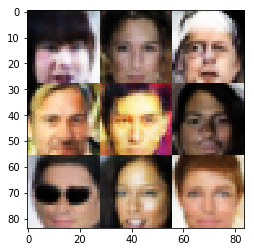

Epoch 20/20... Discriminator Loss: 0.3464... Generator Loss: 1.9716
Epoch 20/20... Discriminator Loss: 0.8032... Generator Loss: 0.8507
Epoch 20/20... Discriminator Loss: 0.5050... Generator Loss: 1.4951
Epoch 20/20... Discriminator Loss: 0.5838... Generator Loss: 1.1821


In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


# """
# DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
# """
epochs = 20

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))

tf.reset_default_graph()

with tf.Graph().as_default():
    d_loss, g_loss = train(epochs, batch_size, z_dim, learning_rate, beta1,
                           celeba_dataset.get_batches, celeba_dataset.shape,
                           celeba_dataset.image_mode)

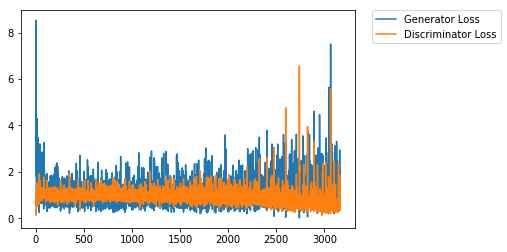

In [ ]:
pyplot.plot(g_loss, label='Generator Loss');
pyplot.plot(d_loss, label='Discriminator Loss');
pyplot.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
pyplot.show()

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.